# This notebook explores the multinomial bayes supervised approach to predict the categories and subcategories

# Aprender a programar Basic set up

#### install libraries

In [ ]:
#from google.colab import files
#upload = files.upload()
from google.colab import drive
drive.mount('/content/mydrive')

Mounted at /content/mydrive


In [ ]:
#models sentence bert
!pip install sentence-transformers
from sentence_transformers import SentenceTransformer, LoggingHandler, models, evaluation, losses

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 593.3 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 22.3 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125923 sha256=41ead6cfd435be885c72049cdf300ab243ffcd940a104101390637f5c07131d4
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


In [ ]:
#
import re
import numpy as np
import pandas as pd
from pprint import pprint

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics.pairwise import cosine_similarity
from sklearn import preprocessing  # to normalize data for cosine similarity
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.multioutput import MultiOutputClassifier

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
#from gensim.models import CoherenceModel

# spacy for lemmatization
!pip install -U spacy
!python -m spacy download es
!python -m spacy download es_core_news_md
import spacy

# Plotting tools
#!pip install pyLDAvis
#import pyLDAvis
#import pyLDAvis.gensim_models as gensimvis
import matplotlib.pyplot as plt
%matplotlib inline

# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)


import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

2023-09-06 21:25:47.310047: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
⚠ As of spaCy v3.0, shortcuts like 'es' are deprecated. Please use the
full pipeline package name 'es_core_news_sm' instead.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 39.7 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')
2023-09-06 21:26:25.149622: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.3/42.3 MB 17.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('es_core_news_md')


In [ ]:
#!pip install tensorflow==2.11.0
import tensorflow as tf
print(tf.__version__)

2.12.0


In [ ]:
#tf_version = str(tf.__version__)[:-2]
#print(tf_version)
!pip install --quiet tensorflow-text==2.12.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 17.9 MB/s eta 0:00:00


In [ ]:
import string
import seaborn as sns
nlp = spacy.load('es_core_news_md')

### data visualization

In [ ]:
df = pd.read_csv(r'/content/mydrive/MyDrive/luis/study/master/tesis/automaticLabels/aprenderAProgramarFinalDataFrameWithCalificacion.csv',sep=';')
df

,comment,ambiente,bondadesPlataforma,CbondadesPlataformaCcasosPrueba,CbondadesPlataformaCconocerErrores,CbondadesPlataformaCconsejosFormativos,CbondadesPlataformaCdisponibilidadLinea,CbondadesPlataformaCespacioTrabajo,CbondadesPlataformaCfacilidadUso,CbondadesPlataformaClenguajes,...,CMejorableAprenderProgramarCfallasGenerales,CMejorableAprenderProgramarCinflexibilidad,CMejorableAprenderProgramarCobjetivoEducativo,CMejorableAprenderProgramarCretroalimentacionInsuficiente,CMejorableAprenderProgramarCsustituible,colab,HerramientasUNcode,logrosPedagogicos,MejorableAprenderProgramar,calificacion
0,A traves de la plataforma pude ir practicando ...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,NO CALIFICADO
1,A traves de los ejercicios propuestos en la he...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Totalmente de acuerdo
2,A veces UNCode no dejaba correr por cosas triv...,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,Algo de acuerdo
3,A veces es poco practico y da errores por cosa...,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,Algo en desacuerdo
4,"A veces la pagina era muy lenta, y al principi...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,NO CALIFICADO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342,si porque gracias a el pude constatar que mis ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,De acuerdo
343,"si, ya que es bastante sencillo e intuitivo a ...",0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,NO CALIFICADO
344,solo lo use para enviar los talleres ya que lo...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,En desacuerdo
345,uno de los aspectos que considero que mas me c...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,Totalmente de acuerdo


In [ ]:
selected_columns_only_categories = [col for col in df.columns if not col.startswith('C') and not col.startswith('calificacion')]
categories_labels = df[selected_columns_only_categories]

categories_labels

,comment,ambiente,bondadesPlataforma,colab,HerramientasUNcode,logrosPedagogicos,MejorableAprenderProgramar
0,A traves de la plataforma pude ir practicando ...,0,1,0,0,0,0
1,A traves de los ejercicios propuestos en la he...,0,1,0,0,1,0
2,A veces UNCode no dejaba correr por cosas triv...,0,0,1,0,0,1
3,A veces es poco practico y da errores por cosa...,0,0,0,0,0,1
4,"A veces la pagina era muy lenta, y al principi...",0,0,0,0,1,0
...,...,...,...,...,...,...,...
342,si porque gracias a el pude constatar que mis ...,0,0,0,0,1,0
343,"si, ya que es bastante sencillo e intuitivo a ...",0,1,0,0,0,0
344,solo lo use para enviar los talleres ya que lo...,0,0,0,0,1,0
345,uno de los aspectos que considero que mas me c...,0,1,0,1,0,0


In [ ]:
df.comment

0      A traves de la plataforma pude ir practicando ...
1      A traves de los ejercicios propuestos en la he...
2      A veces UNCode no dejaba correr por cosas triv...
3      A veces es poco practico y da errores por cosa...
4      A veces la pagina era muy lenta, y al principi...
                             ...                        
342    si porque gracias a el pude constatar que mis ...
343    si, ya que es bastante sencillo e intuitivo a ...
344    solo lo use para enviar los talleres ya que lo...
345    uno de los aspectos que considero que mas me c...
346    ya que proporcionaba todas las herramientas ne...
Name: comment, Length: 347, dtype: object

This shows there are comments with multiple categories, on average each comment will have 1.5 categories

In [ ]:
df.shape

(347, 30)

### data selection

In [ ]:
df[df.comment.str.len() > 5].shape

(347, 30)

In [ ]:
df[df.calificacion!='NO CALIFICADO'].shape

(263, 30)

In [ ]:
df[df.calificacion!='NO CALIFICADO']['comment']

1      A traves de los ejercicios propuestos en la he...
2      A veces UNCode no dejaba correr por cosas triv...
3      A veces es poco practico y da errores por cosa...
5      A veces no valoraba bien el porcentaje de el c...
6      Al poder probar y visualizar codigos me permit...
                             ...                        
340    porque su interfaz permite ver como funciona n...
342    si porque gracias a el pude constatar que mis ...
344    solo lo use para enviar los talleres ya que lo...
345    uno de los aspectos que considero que mas me c...
346    ya que proporcionaba todas las herramientas ne...
Name: comment, Length: 263, dtype: object

In [ ]:
df[df.calificacion=='NO CALIFICADO']['comment']

0      A traves de la plataforma pude ir practicando ...
4      A veces la pagina era muy lenta, y al principi...
7      Al principio Uncode presentaba bastantes fallo...
10     Anteriormente realice un curso de programacion...
11     Aunque en momentos el servidor no se encuentre...
                             ...                        
318    existen plataformas con un ambiente un poco ma...
321    la plataforma cumple en cuanto a sus servicios...
326                             no los mostraba en todos
341     pues es una forma muy facil y util de calificar.
343    si, ya que es bastante sencillo e intuitivo a ...
Name: comment, Length: 84, dtype: object

In [ ]:
df = df[df.calificacion!='NO CALIFICADO']
df.shape

(263, 30)

In [ ]:
df['calificacion'].unique()

array(['Totalmente de acuerdo', 'Algo de acuerdo', 'Algo en desacuerdo',
       'De acuerdo', 'Totalmente en desacuerdo', 'En desacuerdo'],
      dtype=object)

In [ ]:
# items that have values different than one and zero(they appear nmore than once in the dataset of catefgories)
# for i in range(len(df.bondadesPlataforma)):
#   if (df.bondadesPlataforma[i] ==2):
#     print(df.comment[i])

In [ ]:
# some comments appear two times in the same categorie, in the text data, so we replace the number 2 for a 1
df = df.replace(2, 1)

In [ ]:
# Drop the column you want to omit
df_test = df.drop('comment', axis=1)

# check all values in all columns are what we expect
for col in df_test .columns:
  print(df_test[col].unique())

[0 1]
[1 0]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[1 0]
[0 1]
[0 1]
[0 1]
[0 1]
[1 0]
[1 0]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[0 1]
[1 0]
[0 1]
['Totalmente de acuerdo' 'Algo de acuerdo' 'Algo en desacuerdo'
 'De acuerdo' 'Totalmente en desacuerdo' 'En desacuerdo']


In [ ]:
# final working dataframe
df.reset_index(drop=True, inplace=True)
df

,comment,ambiente,bondadesPlataforma,CbondadesPlataformaCcasosPrueba,CbondadesPlataformaCconocerErrores,CbondadesPlataformaCconsejosFormativos,CbondadesPlataformaCdisponibilidadLinea,CbondadesPlataformaCespacioTrabajo,CbondadesPlataformaCfacilidadUso,CbondadesPlataformaClenguajes,...,CMejorableAprenderProgramarCfallasGenerales,CMejorableAprenderProgramarCinflexibilidad,CMejorableAprenderProgramarCobjetivoEducativo,CMejorableAprenderProgramarCretroalimentacionInsuficiente,CMejorableAprenderProgramarCsustituible,colab,HerramientasUNcode,logrosPedagogicos,MejorableAprenderProgramar,calificacion
0,A traves de los ejercicios propuestos en la he...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Totalmente de acuerdo
1,A veces UNCode no dejaba correr por cosas triv...,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,Algo de acuerdo
2,A veces es poco practico y da errores por cosa...,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,Algo en desacuerdo
3,A veces no valoraba bien el porcentaje de el c...,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,1,Algo de acuerdo
4,Al poder probar y visualizar codigos me permit...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,Totalmente de acuerdo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,porque su interfaz permite ver como funciona n...,1,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,Totalmente de acuerdo
259,si porque gracias a el pude constatar que mis ...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,De acuerdo
260,solo lo use para enviar los talleres ya que lo...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,En desacuerdo
261,uno de los aspectos que considero que mas me c...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,Totalmente de acuerdo


#### copy of df with calification

In [ ]:
# convert calification value into a sparse numerical value to treat it as a categorical variable in the future models
# Create dummy variables for the 'calificacion' column
calificacion_dummies = pd.get_dummies(df['calificacion'], prefix='calificacion')

temp_df = pd.concat([df, calificacion_dummies], axis=1)

# convert to dense dataframe, select only cALIFICACION
temp_calification_statistics= [col for col in temp_df.columns if col.startswith('calificacion') and not col.startswith('calificacion_encoded')]
temp_calification_statistics_labels = temp_df[temp_calification_statistics]
temp_calification_statistics_labels.sum()

calificacion                             Totalmente de acuerdoAlgo de acuerdoAlgo en de...
calificacion_Algo de acuerdo                                                            30
calificacion_Algo en desacuerdo                                                         12
calificacion_De acuerdo                                                                108
calificacion_En desacuerdo                                                               4
calificacion_Totalmente de acuerdo                                                     105
calificacion_Totalmente en desacuerdo                                                    4
dtype: object

In [ ]:
# Create a dictionary that maps the text values to numerical values
calificacion_mapping = {
    'Totalmente de acuerdo': 3,
 'De acuerdo': 2,
   'Algo de acuerdo': 1,
      'Algo en desacuerdo': 0,
   'En desacuerdo': -1,
  'Totalmente en desacuerdo': -2
}
df_calification = pd.DataFrame()

temp_df.drop('calificacion', axis=1, inplace=True)

# Apply the mapping to the 'calificacion' column
df_calification['calificacion_encoded'] = df['calificacion'].map(calificacion_mapping)
df_calification = pd.concat([df_calification, calificacion_dummies], axis=1)
df_calification['comment'] = df['comment']
df_calification

,calificacion_encoded,calificacion_Algo de acuerdo,calificacion_Algo en desacuerdo,calificacion_De acuerdo,calificacion_En desacuerdo,calificacion_Totalmente de acuerdo,calificacion_Totalmente en desacuerdo,comment
0,3,0,0,0,0,1,0,A traves de los ejercicios propuestos en la he...
1,1,1,0,0,0,0,0,A veces UNCode no dejaba correr por cosas triv...
2,0,0,1,0,0,0,0,A veces es poco practico y da errores por cosa...
3,1,1,0,0,0,0,0,A veces no valoraba bien el porcentaje de el c...
4,3,0,0,0,0,1,0,Al poder probar y visualizar codigos me permit...
...,...,...,...,...,...,...,...,...
258,3,0,0,0,0,1,0,porque su interfaz permite ver como funciona n...
259,2,0,0,1,0,0,0,si porque gracias a el pude constatar que mis ...
260,-1,0,0,0,1,0,0,solo lo use para enviar los talleres ya que lo...
261,3,0,0,0,0,1,0,uno de los aspectos que considero que mas me c...


#### basic text cleaning

In [ ]:
df["comment"] = df["comment"].fillna("")
# for col in text_columns: # change df tyoes to string, it it is not
#     df[col] = df[col].astype(str)

In [ ]:
#limpieza basica que aplica para todo metodo sin importar cual sera
#method that overrides the given dataframe text, with a cleaned version
def clean(textArray):
  res= []
  for i in range(0,len(textArray)):
    text = textArray[i]
    #text = p.clean(text)
    #text = re.sub(r'\W+', ' ', text)  # remove non-alphanumeric characters
    text = re.sub(r"\d+", "number", text)# replace numbers with the word 'number'
    text = str(text).lower()  # Lowercase words
    text = re.sub(r"\s+", " ", text)  # Remove multiple spaces in content
    # text = re.sub(r"\[(.*?)\]", "", text)  # Remove [+XYZ chars] in content
    # text = re.sub(r"\w+…|…", "", text)  # Remove ellipsis (and last word)
    text = re.sub(r"(?<=\w)-(?=\w)", " ", text)  # Replace dash between words
    # text = re.sub(
    #     f"[{re.escape(string.punctuation)}]", "", text
    # )  # Remove punctuation
    # don't consider sentenced with less than 3 words (i.e. assumed noise)
    #if len(text.strip().split()) < 3:
    #     return None
    text = text.lower()  # lower case everything
    test = text.strip() # remove redundant spaces
    textArray[i] = text
  return

In [ ]:
clean(df.comment) # df.comment will be cleaned and overwriten

<ipython-input-24-ee90dfb124bd>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  textArray[i] = text


In [ ]:
df.head(3)

,comment,ambiente,bondadesPlataforma,CbondadesPlataformaCcasosPrueba,CbondadesPlataformaCconocerErrores,CbondadesPlataformaCconsejosFormativos,CbondadesPlataformaCdisponibilidadLinea,CbondadesPlataformaCespacioTrabajo,CbondadesPlataformaCfacilidadUso,CbondadesPlataformaClenguajes,...,CMejorableAprenderProgramarCfallasGenerales,CMejorableAprenderProgramarCinflexibilidad,CMejorableAprenderProgramarCobjetivoEducativo,CMejorableAprenderProgramarCretroalimentacionInsuficiente,CMejorableAprenderProgramarCsustituible,colab,HerramientasUNcode,logrosPedagogicos,MejorableAprenderProgramar,calificacion
0,a traves de los ejercicios propuestos en la he...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,Totalmente de acuerdo
1,a veces uncode no dejaba correr por cosas triv...,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,Algo de acuerdo
2,a veces es poco practico y da errores por cosa...,0,0,0,0,0,0,0,0,0,...,1,1,0,0,0,0,0,0,1,Algo en desacuerdo


### additional data transformation step to convert similar words so results are more reliable / data train/test splitting

In [ ]:
#limpieza basica que aplica para todo metodo sin importar cual sera
#method that overrides the given dataframe text, with a cleaned version
def advanceCleaning(textArray):
  res= []
  for i in range(0,len(textArray)):
    text = textArray[i]
    #text = p.clean(text)
    #text = re.sub(r"uncode|plataforma|herramienta", "uncode", text)  # convert common words to the same synonym
    textArray[i] = text
  return

In [ ]:
#comment this cell
#advanceCleaning(df.comment) # df.comment will be cleaned and overwriten

#### Dataset splitting in categories and test splitting

In [ ]:
testSize = 0.3
random_state = 50

In [ ]:
# convert to dense dataframe, select only the columns of the big categories
selected_columns_only_categories = [col for col in df.columns if not col.startswith('C') and not col.startswith('calificacion')]
selected_columns_only_categories.remove('comment')
categories_labels = df[selected_columns_only_categories]
categories_labels.sum()

ambiente                       11
bondadesPlataforma            131
colab                           4
HerramientasUNcode            111
logrosPedagogicos             142
MejorableAprenderProgramar     48
dtype: int64

In [ ]:
# convert to dense dataframe, select only the columns of the small subcategories
selected_columns_only_sub_categories = [col for col in df.columns if col.startswith('C')]
sub_categories_labels = df[selected_columns_only_sub_categories]
sub_categories_labels.sum()

CbondadesPlataformaCcasosPrueba                               8
CbondadesPlataformaCconocerErrores                           61
CbondadesPlataformaCconsejosFormativos                       22
CbondadesPlataformaCdisponibilidadLinea                       6
CbondadesPlataformaCespacioTrabajo                            4
CbondadesPlataformaCfacilidadUso                             36
CbondadesPlataformaClenguajes                                 4
CbondadesPlataformaCPracticaconstante                        12
CherramientasUNcodeCcustomInput                              26
CherramientasUNcodeClinter                                   23
CherramientasUNcodeCpythonTutor                              66
ClogrosPedagogicosCaprendizajeAutonomo                        9
ClogrosPedagogicosCejerciciosEstimulantes                    32
ClogrosPedagogicosCevalluacionEstimulante                    32
ClogrosPedagogicosCEvaluacionOptimizada                      54
ClogrosPedagogicosChabilidadesProgramaci

In [ ]:
X_train, X_test, y_train_categories, y_test_categories = train_test_split( df.comment.to_numpy(), categories_labels.to_numpy(), test_size=testSize, random_state=random_state)

In [ ]:
categories_labels

,ambiente,bondadesPlataforma,colab,HerramientasUNcode,logrosPedagogicos,MejorableAprenderProgramar
0,0,1,0,0,1,0
1,0,0,1,0,0,1
2,0,0,0,0,0,1
3,0,0,0,0,0,1
4,0,0,0,1,1,0
...,...,...,...,...,...,...
258,1,1,0,0,0,0
259,0,0,0,0,1,0
260,0,0,0,0,1,0
261,0,1,0,1,0,0


In [ ]:
#  stratify=categories_labels.to_numpy()

In [ ]:
# np.concatenate((categories_labels.to_numpy(), categories_labels.to_numpy() ), axis=1).shape

In [ ]:
X_train, X_test, y_train_sub_categories, y_test_sub_categories = train_test_split( df.comment.to_numpy(), sub_categories_labels.to_numpy(), test_size=testSize, random_state=random_state)

In [ ]:
y_train_sub_categories

array([[0, 1, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 1, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

##### split calification into the same trsining and test

In [ ]:
# convert to dense dataframe, select only the columns of the small subcategories
selected_columns_only_calification_categories = [col for col in df_calification.columns if not col.startswith('calificacion_encoded') and not col.startswith('comment') ]
calification_categories_labels = df_calification[selected_columns_only_calification_categories]
calification_categories_labels.sum()

calificacion_Algo de acuerdo              30
calificacion_Algo en desacuerdo           12
calificacion_De acuerdo                  108
calificacion_En desacuerdo                 4
calificacion_Totalmente de acuerdo       105
calificacion_Totalmente en desacuerdo      4
dtype: int64

In [ ]:
X_train_calification, X_test_calification, train_calification_categorical, test_calification_categorical = train_test_split( df_calification.comment.to_numpy(), calification_categories_labels.to_numpy(), test_size=testSize, random_state=random_state)

In [ ]:
X_train_calification

array(['Es poco indicativo respecto a los errores en los codigos del usuario',
       'los programas al principios no tenian claridad a la hora de su interpretacion',
       'Mediante UNCode, pude realizar muchos ejercicios que me permitieron profundizar y poner a prueba mis conocimientos de los lenguajes que estaba aprendiendo. Por las herramientas con las que disponia, era capaz de ver mis errores para poder corregirlos adecuadamente en el futuro. Sin embargo, la plataforma no siempre me decia el tipo de error que habia cometido, se  caia  con frecuencia y habia situaciones donde no era acorde a otras plataformas que tenian el mismo objetivo que UNCode, por lo que podia confundirme aun mas de lo que me ayudaria.',
       'El metodo de evaluar los programas por casos permite que uno desarrolle un enfoque integro en el momento de crear el bloque de codigo',
       'A veces no valoraba bien el porcentaje de el codigo correcto',
       'UNCode fue realmente util ya que cuenta con una int

In [ ]:
X_train_calification, X_test_calification, train_calification_encoded, test_calification_encoded = train_test_split( df_calification.comment.to_numpy(), df_calification.calificacion_encoded.to_numpy(), test_size=testSize, random_state=random_state)

In [ ]:
train_calification_encoded = np.reshape(train_calification_encoded, (-1, 1))
test_calification_encoded = np.reshape(test_calification_encoded, (-1, 1))

In [ ]:
train_calification_encoded

array([[ 0],
       [ 1],
       [ 2],
       [ 2],
       [ 1],
       [ 3],
       [ 2],
       [ 2],
       [ 2],
       [ 0],
       [ 3],
       [-1],
       [ 3],
       [-1],
       [ 2],
       [ 3],
       [ 3],
       [ 3],
       [ 2],
       [ 1],
       [ 1],
       [ 3],
       [ 2],
       [ 3],
       [ 2],
       [ 2],
       [ 0],
       [ 2],
       [ 3],
       [ 2],
       [ 1],
       [ 2],
       [ 3],
       [ 3],
       [ 3],
       [ 3],
       [ 2],
       [ 3],
       [-1],
       [ 2],
       [ 2],
       [ 3],
       [ 3],
       [ 3],
       [ 0],
       [ 2],
       [ 1],
       [ 2],
       [ 2],
       [ 3],
       [ 2],
       [ 3],
       [ 3],
       [ 2],
       [ 1],
       [ 3],
       [ 2],
       [ 2],
       [ 2],
       [ 1],
       [ 2],
       [ 2],
       [ 3],
       [ 2],
       [ 2],
       [ 3],
       [ 1],
       [ 1],
       [ 2],
       [ 3],
       [ 3],
       [ 3],
       [ 2],
       [-1],
       [ 2],
       [ 2],
       [ 3],

#### resulting arrays

X_train, X_test = are the cleaned comments texts to perform.

test_calification_encoded and train_calification_encoded contain the one hot encoded rating given by the student (possible aditional input feature)

train_calification_categorical, test_calification_categorical have the rating given by student as categorical data(6 different columns)

y_train_categories, y_test_categories    are the categories corresponding to each comment

y_train_sub_categories, y_test_sub_categories  are the subxategories corersponding to each value

In [ ]:
global_data = {
    'all_corpus':{
       'comments': df.comment.to_numpy(),
       'categories': categories_labels.to_numpy(),
       'subcategories':  sub_categories_labels.to_numpy()
    },
    'x': {
        'X_train': X_train,
        'X_test': X_test,
        'test_calification_encoded':test_calification_encoded,
        'train_calification_encoded': train_calification_encoded,
        'train_calification_categorical': train_calification_categorical,
        'test_calification_categorical':test_calification_categorical
    },
    'y' :{
        'y_train_categories':y_train_categories,
       'y_test_categories':y_test_categories ,
       'y_train_sub_categories':y_train_sub_categories,
       'y_test_sub_categories':y_test_sub_categories ,
       },
    'embeddings':{
        "mini_lm": {},
        "use": {},
        "tfid":{},
        'glove':{},
         "all-MiniLM-L6-v2":{},
        "all-MiniLM-L12-v2":{},
        "paraphrase-multilingual-mpnet-base-v2":{},
        "paraphrase-MiniLM-L3-v2":{}
    }
}

In [ ]:
model_data = {
    'svm': {
    },
    'gaussian' :{
       },
    'multinomial_bayes':{
    },
    "nn":{},
    'random_forest':{}
}

In [ ]:
global_data['x']

{'X_train': array(['es poco indicativo respecto a los errores en los codigos del usuario',
        'los programas al principios no tenian claridad a la hora de su interpretacion',
        'mediante uncode, pude realizar muchos ejercicios que me permitieron profundizar y poner a prueba mis conocimientos de los lenguajes que estaba aprendiendo. por las herramientas con las que disponia, era capaz de ver mis errores para poder corregirlos adecuadamente en el futuro. sin embargo, la plataforma no siempre me decia el tipo de error que habia cometido, se caia con frecuencia y habia situaciones donde no era acorde a otras plataformas que tenian el mismo objetivo que uncode, por lo que podia confundirme aun mas de lo que me ayudaria.',
        'el metodo de evaluar los programas por casos permite que uno desarrolle un enfoque integro en el momento de crear el bloque de codigo',
        'a veces no valoraba bien el porcentaje de el codigo correcto',
        'uncode fue realmente util ya que cue

### Aditional optional text cleaning/normalization  stemming and lemmatization

In [ ]:
#normalizacion especifica, dependiendo del metodo se puede probar con y sin esta
def normalize(text):
    doc = nlp(text)
    words = [t.orth_ for t in doc if not t.is_punct | t.is_stop]
    lexical_tokens = [t.lower() for t in words if t.isalpha()] #len(t) > 3 and
    return lexical_tokens

#otra libreria para eliminar stop words
# import nltk
# from stop_words import get_stop_words
# dataset = ['This','is','just', 'a', 'snake']
# A = [word for word in dataset if word not in get_stop_words('english')]
# print(A)

In [ ]:
textNormalizedCommentsVector = [ ([str(a) for a in normalize(oneComment)]) for oneComment in global_data['x']['X_train']]
textNormalizedCommentsVector[0]

['indicativo', 'errores', 'codigos', 'usuario']

In [ ]:
textNormalizedComments = [ " ".join([str(a) for a in normalize(oneComment)]) for oneComment in global_data['x']['X_train']]
textNormalizedComments[0]

'indicativo errores codigos usuario'

In [ ]:
textNormalizedCommentsTest = [ " ".join([str(a) for a in normalize(oneComment)]) for oneComment in global_data['x']['X_test']]

textNormalizedAllComments= [ " ".join([str(a) for a in normalize(oneComment)]) for oneComment in global_data['all_corpus']['comments']]

textNormalizedCommentsTest[0]

'sistema podian evaluar codigos cantidad casos comprobar efectividad forma daba retroalimentacion correcciones necesarias'

In [ ]:
#comment this cell
global_data['x']['X_train_normalized']  = textNormalizedComments
global_data['x']['X_test_normalized'] = textNormalizedCommentsTest
global_data['all_corpus']['comments_normalized'] = textNormalizedAllComments

#### stemming optional process to transfrom all word to the root(even if the root does not exist)

In [ ]:
import nltk
from nltk import SnowballStemmer

def stemmize(text):
  spanishstemmer=SnowballStemmer('spanish')
  tokens = normalize(text) # crear una lista de tokens
  stems = [spanishstemmer.stem(token) for token in tokens]
  return stems

In [ ]:
stemmize(textNormalizedComments[0])

['indic', 'error', 'codig', 'usuari']

In [ ]:
global_data['x']['X_train_stemmized'] = [ " ".join([str(a) for a in stemmize(oneComment)]) for oneComment in global_data['x']['X_train_normalized']]
global_data['x']['X_test_stemmized'] = [ " ".join([str(a) for a in stemmize(oneComment)]) for oneComment in global_data['x']['X_test_normalized']]
global_data['all_corpus']['comments_stemmized'] = [ " ".join([str(a) for a in stemmize(oneComment)]) for oneComment in global_data['all_corpus']['comments_normalized']]
global_data['x']['X_train_stemmized']

['indic error codig usuari',
 'program principi teni clarid hor interpret',
 'uncod pud ejercici permit profundiz prueb conoc lenguaj aprend herramient disponi capaz error correg adecu futur plataform deci tip error comet cai frecuenci situacion acord plataform teni objet uncod podi confund ayudari',
 'metod evalu program cas permit desarroll enfoqu integr moment cre bloqu codig',
 'valor porcentaj codig correct',
 'uncod realment util interfaz intuit permit disen codig hac prueb verif sencill python tutor hall error codig facil',
 'herramient util reforz conoc prueb estudiat ejercici especif cas prueb',
 'oportun practic conoc adquir clas virtual util identific problem plant solucion fues requer',
 'retroaliment incorrect result util moment correg codig cas tall numb obvi compar',
 'plataform precis espaci pas colab python escritori',
 'plataform permit python neces descarg facil permit guard driv convenient',
 'plataform versatil result prefer colab',
 'ayud problem sencill',
 'codig

#### lemmatization, optional procces to transform words to a common one

In [ ]:
def lemmanize(text):
    doc = nlp(text)
    #lemmas_no_pron = [tok.lemma_.lower() for tok in doc if tok.pos_ != 'PRON'] # we can select the type of tokens that will enter this process, like pronouns, adjetivo, verbo, sustantivo
    #lemmas = [tok.lemma_ for tok in doc if tok.pos_ != 'NOUN']
    lemmas = []
    for tok in doc:
      if tok.pos_ not in ("NOUN", "NUM", "PROPN"):
        lemmas.append((tok.lemma_))
      else:
        lemmas.append((tok.text))
    return lemmas


In [ ]:
lemmanize(textNormalizedComments[0])

['indicativo', 'errores', 'codigo', 'usuario']

In [ ]:
dataLemmatizedCommentsVector = [ ([str(a) for a in lemmanize(oneComment)]) for oneComment in textNormalizedComments]
dataLemmatizedCommentsVector[0]

['indicativo', 'errores', 'codigo', 'usuario']

In [ ]:
global_data['x']['X_train_lemmanized'] = [ " ".join([str(a) for a in lemmanize(oneComment)]) for oneComment in global_data['x']['X_train_normalized']]
global_data['x']['X_test_lemmanized'] = [ " ".join([str(a) for a in lemmanize(oneComment)]) for oneComment in global_data['x']['X_test_normalized']]

global_data['all_corpus']['comments_lemmanized'] = [ " ".join([str(a) for a in lemmanize(oneComment)]) for oneComment in global_data['all_corpus']['comments']]

global_data['x']['X_train_lemmanized']

['indicativo errores codigo usuario',
 'programas principio teniar claridad hora interpretacion',
 'uncodir poder ejercicios permitir profundizar prueba conocimientos lenguaj aprender herramientas disponiar capaz errores corregirlos adecuadamente futuro plataforma decio tipo error cometido caia frecuencia situaciones acorde plataformas tenian objetivo uncode podia confundir yo ayudariir',
 'metodo evaluar programas caso permitir desarrollar enfoque integro momento crear bloque codigo',
 'valorar porcentaje codigo correcto',
 'uncode realmente util interfaz intuitivo permitir disenar codigo hacer él prueba verificacion sencillo python tutor hallar errores codigo facilidad',
 'herramienta util reforzar conocimientos probar estudiate ejercicios especifico casos prueba',
 'oportunidad practicar conocimientos adquirido clases virtualidad util identificar problemas plantear soluciones ser requerir',
 'retroalimentacion incorrecto resultar util momento corregir codigo caso taller number obvia

### embeddings

#### paraphrase-multilingual-MiniLM-L12-v2

In [ ]:
model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2')   #Suitable Score Functions:	cosine-similarity (util.cos_sim)
global_data['embeddings']['mini_lm']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['mini_lm']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['mini_lm']['X_train']

array([[-0.11967073, -0.27496484, -0.06444912, ...,  0.18236674,
        -0.0069648 , -0.10294113],
       [ 0.06508447, -0.01690061, -0.14823931, ...,  0.35867828,
         0.19970274, -0.05444684],
       [-0.10684763, -0.26584005, -0.13621539, ...,  0.21770452,
        -0.15863152, -0.15916534],
       ...,
       [ 0.03832166,  0.00729389, -0.4039367 , ...,  0.3553498 ,
         0.03043719, -0.00725028],
       [ 0.11686804, -0.04552092, -0.12452216, ...,  0.1266617 ,
        -0.0578576 , -0.04344096],
       [-0.3548637 , -0.17316675, -0.09383308, ...,  0.23770155,
         0.3328105 , -0.04731974]], dtype=float32)

In [ ]:
# Normalize the embeddings to unit length
global_data['embeddings']['mini_lm']['X_train']= global_data['embeddings']['mini_lm']['X_train'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train'], axis=1, keepdims=True)
global_data['embeddings']['mini_lm']['X_test']= global_data['embeddings']['mini_lm']['X_test'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test'], axis=1, keepdims=True)
global_data['embeddings']['mini_lm']['X_train']

array([[-0.03619121, -0.08315575, -0.01949091, ...,  0.05515194,
        -0.00210632, -0.03113179],
       [ 0.01770273, -0.0045969 , -0.04032053, ...,  0.09755912,
         0.05431838, -0.01480933],
       [-0.03278555, -0.08157142, -0.04179687, ...,  0.06680132,
        -0.04867513, -0.04883893],
       ...,
       [ 0.00980985,  0.00186714, -0.10340261, ...,  0.09096498,
         0.00779153, -0.00185598],
       [ 0.03330718, -0.01297338, -0.03548859, ...,  0.03609835,
        -0.01648931, -0.01238059],
       [-0.10058251, -0.04908236, -0.02659603, ...,  0.06737409,
         0.09433176, -0.0134123 ]], dtype=float32)

###### add versions of the embedding with the califications

In [ ]:
# Stack the arrays horizontally for categorical calification
global_data['embeddings']['mini_lm']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['mini_lm']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)
global_data['embeddings']['mini_lm']['X_train_categorical_calification']= global_data['embeddings']['mini_lm']['X_train_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_categorical_calification'], axis=1, keepdims=True)

global_data['embeddings']['mini_lm']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['mini_lm']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['mini_lm']['X_test_categorical_calification']= global_data['embeddings']['mini_lm']['X_test_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_categorical_calification'], axis=1, keepdims=True)
global_data['embeddings']['mini_lm']['X_train_categorical_calification'].shape

(184, 390)

In [ ]:
# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['mini_lm']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_train_one_hot_calification']= global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['mini_lm']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_test_one_hot_calification']= global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['mini_lm']['X_train_one_hot_calification'].shape

(184, 385)

#### paraphrase-multilingual-mpnet-base-v2

In [ ]:

model = SentenceTransformer('sentence-transformers/paraphrase-multilingual-mpnet-base-v2')   #Suitable Score Functions:	cosine-similarity (util.cos_sim)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train']

# Normalize the embeddings to unit length
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train']= global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'] /  np.linalg.norm(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test']= global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'] /  np.linalg.norm(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train']

###### add versions of the embedding with the califications

# Stack the arrays horizontally for categorical calification
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification']= global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification'], axis=1, keepdims=True)

global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_categorical_calification']= global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_categorical_calification'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification'].shape

# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_train_one_hot_calification']= global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_test_one_hot_calification']= global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_one_hot_calification'].shape

(184, 769)

#### paraphrase-MiniLM-L3-v2

In [ ]:

model = SentenceTransformer('sentence-transformers/paraphrase-MiniLM-L3-v2')   #Suitable Score Functions:	cosine-similarity (util.cos_sim)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train']

# Normalize the embeddings to unit length
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train']= global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'] /  np.linalg.norm(global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test']= global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'] /  np.linalg.norm(global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train']

###### add versions of the embedding with the califications

# Stack the arrays horizontally for categorical calification
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification']= global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification'], axis=1, keepdims=True)

global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_categorical_calification']= global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_categorical_calification'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification'].shape

# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_train_one_hot_calification']= global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_test_one_hot_calification']= global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_one_hot_calification'].shape

(184, 385)

#### all-MiniLM-L12-v2

In [ ]:

model = SentenceTransformer('sentence-transformers/all-MiniLM-L12-v2')   #Suitable Score Functions:	cosine-similarity (util.cos_sim)
global_data['embeddings']['all-MiniLM-L12-v2']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['all-MiniLM-L12-v2']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['all-MiniLM-L12-v2']['X_train']

# Normalize the embeddings to unit length
global_data['embeddings']['all-MiniLM-L12-v2']['X_train']= global_data['embeddings']['all-MiniLM-L12-v2']['X_train'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L12-v2']['X_train'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L12-v2']['X_test']= global_data['embeddings']['all-MiniLM-L12-v2']['X_test'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L12-v2']['X_test'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L12-v2']['X_train']

###### add versions of the embedding with the califications

# Stack the arrays horizontally for categorical calification
global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L12-v2']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)
global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification']= global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification'], axis=1, keepdims=True)

global_data['embeddings']['all-MiniLM-L12-v2']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L12-v2']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['all-MiniLM-L12-v2']['X_test_categorical_calification']= global_data['embeddings']['all-MiniLM-L12-v2']['X_test_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L12-v2']['X_test_categorical_calification'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification'].shape

# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['all-MiniLM-L12-v2']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L12-v2']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_train_one_hot_calification']= global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['all-MiniLM-L12-v2']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L12-v2']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_test_one_hot_calification']= global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L12-v2']['X_train_one_hot_calification'].shape

(184, 385)

#### all-MiniLM-L6-v2

In [ ]:

model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')   #Suitable Score Functions:	cosine-similarity (util.cos_sim)
global_data['embeddings']['all-MiniLM-L6-v2']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['all-MiniLM-L6-v2']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['all-MiniLM-L6-v2']['X_train']

# Normalize the embeddings to unit length
global_data['embeddings']['all-MiniLM-L6-v2']['X_train']= global_data['embeddings']['all-MiniLM-L6-v2']['X_train'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L6-v2']['X_train'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L6-v2']['X_test']= global_data['embeddings']['all-MiniLM-L6-v2']['X_test'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L6-v2']['X_test'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L6-v2']['X_train']

###### add versions of the embedding with the califications

# Stack the arrays horizontally for categorical calification
global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L6-v2']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)
global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification']= global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification'], axis=1, keepdims=True)

global_data['embeddings']['all-MiniLM-L6-v2']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L6-v2']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['all-MiniLM-L6-v2']['X_test_categorical_calification']= global_data['embeddings']['all-MiniLM-L6-v2']['X_test_categorical_calification'] /  np.linalg.norm(global_data['embeddings']['all-MiniLM-L6-v2']['X_test_categorical_calification'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification'].shape

# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['all-MiniLM-L6-v2']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L6-v2']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_train_one_hot_calification']= global_data['embeddings']['mini_lm']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['all-MiniLM-L6-v2']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['all-MiniLM-L6-v2']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['mini_lm']['X_test_one_hot_calification']= global_data['embeddings']['mini_lm']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['mini_lm']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['all-MiniLM-L6-v2']['X_train_one_hot_calification'].shape

(184, 385)

#### USE (universal sentence encoder) like SBERT

In [ ]:
## google embeddings model  https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3
#!pip install --upgrade tensorflow-estimator==2.3.0
#!pip install --upgrade tensorflow-hub
tf.compat.v1.estimator.experimental.dnn_logit_fn_builder
import tensorflow_hub as hub
import tensorflow_text  # this needs to be imported to set up some stuff in the background
embed = hub.load("https://tfhub.dev/google/universal-sentence-encoder-multilingual-large/3")
global_data['embeddings']['use']['X_train']=embed(global_data['x']['X_train'])
global_data['embeddings']['use']['X_test']=embed(global_data['x']['X_test'])
global_data['embeddings']['use']['X_train'] #The input to the module is variable length text in any of the aforementioned languages and the output is a 512 dimensional vector

<tf.Tensor: shape=(184, 512), dtype=float32, numpy=
array([[ 0.02707535, -0.08013446, -0.00771279, ..., -0.03301486,
         0.03147082, -0.02054066],
       [-0.07698979,  0.06215713,  0.00090116, ...,  0.00552218,
         0.02226203,  0.04917519],
       [-0.02656831, -0.03496685,  0.0318444 , ..., -0.00028055,
        -0.03845698,  0.03418161],
       ...,
       [-0.05540455, -0.02631785,  0.02634799, ..., -0.02879779,
         0.06626614,  0.05025731],
       [-0.0423294 ,  0.01574923, -0.00635253, ...,  0.0231692 ,
        -0.03472855,  0.02512856],
       [ 0.02808224, -0.05614785,  0.0541246 , ..., -0.0218739 ,
         0.01240129, -0.00375407]], dtype=float32)>

###### add versions of the embedding with the califications

In [ ]:
# calification as categorical data
# test data
# Convert the y_test_calification array to a tensor
x_test_calification_tensor = tf.convert_to_tensor(global_data['x']['test_calification_categorical'])

# Cast the y_test_calification tensor to the same data type as the useEmbedding_test tensor
x_test_calification_tensor = tf.cast(x_test_calification_tensor, global_data['embeddings']['use']['X_test'].dtype)

# Stack the arrays horizontally
global_data['embeddings']['use']['X_test_categorical_calification'] = tf.concat([global_data['embeddings']['use']['X_test'], x_test_calification_tensor], axis=1)

# train data
# Convert the y_test_calification array to a tensor
x_train_calification_tensor = tf.convert_to_tensor(train_calification_categorical)

# Cast the y_test_calification tensor to the same data type as the useEmbedding_test tensor
x_train_calification_tensor = tf.cast(x_train_calification_tensor, global_data['embeddings']['use']['X_train'].dtype)

# Stack the arrays horizontally
global_data['embeddings']['use']['X_train_categorical_calification'] = tf.concat([global_data['embeddings']['use']['X_train'], x_train_calification_tensor ], axis=1)

global_data['embeddings']['use']['X_train_categorical_calification'].shape

TensorShape([184, 518])

In [ ]:
# calification as one hot encoded
# test data
# Convert the y_test_calification array to a tensor
x_test_calification_tensor = tf.convert_to_tensor(global_data['x']['test_calification_encoded'])

# Cast the y_test_calification tensor to the same data type as the useEmbedding_test tensor
x_test_calification_tensor = tf.cast(x_test_calification_tensor, global_data['embeddings']['use']['X_test'].dtype)

# Stack the arrays horizontally
global_data['embeddings']['use']['X_test_one_hot_calification'] = tf.concat([global_data['embeddings']['use']['X_test'], x_test_calification_tensor], axis=1)

# train data
# Convert the y_test_calification array to a tensor
x_train_calification_tensor = tf.convert_to_tensor(global_data['x']['train_calification_encoded'])

# Cast the y_test_calification tensor to the same data type as the useEmbedding_test tensor
x_train_calification_tensor = tf.cast(x_train_calification_tensor, global_data['embeddings']['use']['X_train'].dtype)

# Stack the arrays horizontally
global_data['embeddings']['use']['X_train_one_hot_calification'] = tf.concat([global_data['embeddings']['use']['X_train'], x_train_calification_tensor ], axis=1)

global_data['embeddings']['use']['X_train_one_hot_calification'].shape

TensorShape([184, 513])

#### Glove
 It maps sentences & paragraphs to a 300 dimensional dense vector space and can be used for tasks like clustering or semantic search.

In [ ]:
from sentence_transformers import SentenceTransformer
sentences = ["This is an example sentence", "Each sentence is converted"]

model = SentenceTransformer('sentence-transformers/average_word_embeddings_glove.6B.300d')
global_data['embeddings']['glove']['X_train'] = model.encode(global_data['x']['X_train'])
global_data['embeddings']['glove']['X_test'] = model.encode(global_data['x']['X_test'])
global_data['embeddings']['glove']['X_train'].shape

(184, 300)

In [ ]:
## add the same but with noramlized data and maybe stemmized

###### add versions of the embedding with the califications

In [ ]:
# Stack the arrays horizontally for categorical calification
global_data['embeddings']['glove']['X_train_categorical_calification'] = np.concatenate((global_data['embeddings']['glove']['X_train'], global_data['x']['train_calification_categorical'] ), axis=1)

global_data['embeddings']['glove']['X_test_categorical_calification'] = np.concatenate((global_data['embeddings']['glove']['X_test'], global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['glove']['X_train_categorical_calification'].shape

(184, 306)

In [ ]:
# Stack the arrays horizontally for coneHot encoded
global_data['embeddings']['glove']['X_train_one_hot_calification'] = np.concatenate((global_data['embeddings']['glove']['X_train'], global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['glove']['X_train_one_hot_calification']= global_data['embeddings']['glove']['X_train_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['glove']['X_train_one_hot_calification'], axis=1, keepdims=True)

global_data['embeddings']['glove']['X_test_one_hot_calification'] = np.concatenate((global_data['embeddings']['glove']['X_test'], global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['glove']['X_test_one_hot_calification']= global_data['embeddings']['glove']['X_test_one_hot_calification'] /  np.linalg.norm(global_data['embeddings']['glove']['X_test_one_hot_calification'], axis=1, keepdims=True)
global_data['embeddings']['glove']['X_train_one_hot_calification'].shape

(184, 301)

In [ ]:
## add the same but with noramlized data and maybe stemmized

#### tf–idf short for Term Frequency Inverse Document Frequency.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidfVectorizer = TfidfVectorizer(max_features =1000)
tfid = tfidfVectorizer.fit(global_data['all_corpus']['comments'])
global_data['embeddings']['tfid']['X_train'] = tfid.transform(global_data['x']['X_train'])
global_data['embeddings']['tfid']['X_test'] = tfid.transform(global_data['x']['X_test'])
global_data['embeddings']['tfid']['X_train'].shape

(184, 1000)

In [ ]:
# same but stemmized
tfidfVectorizer = TfidfVectorizer(max_features =1000)
tfid = tfidfVectorizer.fit(global_data['all_corpus']['comments_stemmized'])
global_data['embeddings']['tfid']['X_train_stemmized'] = tfid.transform(global_data['x']['X_train_stemmized']).toarray()
global_data['embeddings']['tfid']['X_test_stemmized'] = tfid.transform(global_data['x']['X_test_stemmized']).toarray()
global_data['embeddings']['tfid']['X_train_stemmized'].shape

(184, 597)

In [ ]:
# same but lemmanized
tfidfVectorizer = TfidfVectorizer(max_features =1000)
tfid = tfidfVectorizer.fit(global_data['all_corpus']['comments_lemmanized'])
global_data['embeddings']['tfid']['X_train_lemmanized'] = tfid.transform(global_data['x']['X_train_lemmanized']).toarray()
global_data['embeddings']['tfid']['X_test_lemmanized'] = tfid.transform(global_data['x']['X_test_lemmanized']).toarray()
global_data['embeddings']['tfid']['X_train_lemmanized'].shape

(184, 863)

###### add versions of the embedding with the califications

In [ ]:
# Stack the arrays horizontally for categorical calification
global_data['embeddings']['tfid']['X_train_categorical_calification_stemmized'] = np.concatenate((global_data['embeddings']['tfid']['X_train_stemmized'] , global_data['x']['train_calification_categorical'] ), axis=1)

global_data['embeddings']['tfid']['X_test_categorical_calification_stemmized'] = np.concatenate((global_data['embeddings']['tfid']['X_test_stemmized'] , global_data['x']['test_calification_categorical'] ), axis=1)
global_data['embeddings']['tfid']['X_train_categorical_calification_stemmized'].shape

(184, 603)

In [ ]:
# Stack the arrays horizontally for oneHot encoded

global_data['embeddings']['tfid']['X_train_one_hot_calification_stemmized'] = np.concatenate((global_data['embeddings']['tfid']['X_train_stemmized'] , global_data['x']['train_calification_encoded'] ), axis=1)
#global_data['embeddings']['tfid']['X_train_categorical_encoded_stemmized']= global_data['embeddings']['tfid']['X_train_one_hot_calification_stemmized'] /  np.linalg.norm(global_data['embeddings']['tfid']['X_train_categorical_encoded_stemmized'], axis=1, keepdims=True)

global_data['embeddings']['tfid']['X_test_one_hot_calification_stemmized'] = np.concatenate((global_data['embeddings']['tfid']['X_test_stemmized'] , global_data['x']['test_calification_encoded'] ), axis=1)
#global_data['embeddings']['tfid']['X_test_one_hot_calification_stemmized']= global_data['embeddings']['tfid']['X_test_one_hot_calification_stemmized'] /  np.linalg.norm(global_data['embeddings']['tfid']['X_test_categorical_encoded_stemmized'], axis=1, keepdims=True)
global_data['embeddings']['tfid']['X_train_one_hot_calification_stemmized'].shape

(184, 598)

In [ ]:
# do the same for leminized or normal tfid ?

# supervised methods

## basic classifiers

In [ ]:
# common classifier used in sentiment analysis is the Naive Bayes Classifier.
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier # this is experimental
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.naive_bayes import MultinomialNB

classifiers = [MultiOutputClassifier(MultinomialNB(force_alpha=True)), MultiOutputClassifier(GradientBoostingClassifier()), MultiOutputClassifier(GaussianNB()),MultiOutputClassifier(HistGradientBoostingClassifier()),
               MultiOutputClassifier(RandomForestClassifier()),MultiOutputClassifier(LogisticRegression()),MultiOutputClassifier(XGBClassifier())
               ] #,MultiOutputClassifier(LGBMClassifier())

In [ ]:
embeddingsArray = {
    'train': [global_data['embeddings']['tfid']['X_train_one_hot_calification_stemmized'], global_data['embeddings']['tfid']['X_train_categorical_calification_stemmized'],
                   global_data['embeddings']['tfid']['X_train'], global_data['embeddings']['tfid']['X_train_lemmanized'],global_data['embeddings']['tfid']['X_train_stemmized'],

                   global_data['embeddings']['glove']['X_train'],global_data['embeddings']['glove']['X_train_categorical_calification'],

                   global_data['embeddings']['use']['X_train'],global_data['embeddings']['use']['X_train_categorical_calification'],global_data['embeddings']['use']['X_train_one_hot_calification'],

                   global_data['embeddings']['mini_lm']['X_train'],global_data['embeddings']['mini_lm']['X_train_categorical_calification'],
                   global_data['embeddings']['mini_lm']['X_train_one_hot_calification'],

                                 global_data['embeddings']['all-MiniLM-L6-v2']['X_train'],global_data['embeddings']['all-MiniLM-L6-v2']['X_train_categorical_calification'],
                   global_data['embeddings']['all-MiniLM-L6-v2']['X_train_one_hot_calification'] ,

                                 global_data['embeddings']['all-MiniLM-L12-v2']['X_train'],global_data['embeddings']['all-MiniLM-L12-v2']['X_train_categorical_calification'],
                   global_data['embeddings']['all-MiniLM-L12-v2']['X_train_one_hot_calification'] ,

                                 global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'],global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_categorical_calification'],
                   global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train_one_hot_calification'] ,

                                 global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train'],global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_categorical_calification'],
                   global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_train_one_hot_calification'] ,
                 np.concatenate((global_data['embeddings']['mini_lm']['X_train'],global_data['embeddings']['tfid']['X_train_stemmized']), axis=1),
               np.concatenate((global_data['embeddings']['mini_lm']['X_train_categorical_calification'],global_data['embeddings']['tfid']['X_train_stemmized']), axis=1),
               np.concatenate((global_data['embeddings']['mini_lm']['X_train_one_hot_calification'],global_data['embeddings']['tfid']['X_train_stemmized']), axis=1)
                   ],
     'test': [global_data['embeddings']['tfid']['X_test_one_hot_calification_stemmized'], global_data['embeddings']['tfid']['X_test_categorical_calification_stemmized'],
                   global_data['embeddings']['tfid']['X_test'], global_data['embeddings']['tfid']['X_test_lemmanized'],global_data['embeddings']['tfid']['X_test_stemmized'],

                   global_data['embeddings']['glove']['X_test'],global_data['embeddings']['glove']['X_test_categorical_calification'],

                   global_data['embeddings']['use']['X_test'],global_data['embeddings']['use']['X_test_categorical_calification'],global_data['embeddings']['use']['X_test_one_hot_calification'],

                   global_data['embeddings']['mini_lm']['X_test'],global_data['embeddings']['mini_lm']['X_test_categorical_calification'],
                   global_data['embeddings']['mini_lm']['X_test_one_hot_calification'],

                                               global_data['embeddings']['all-MiniLM-L6-v2']['X_test'],global_data['embeddings']['all-MiniLM-L6-v2']['X_test_categorical_calification'],
                   global_data['embeddings']['all-MiniLM-L6-v2']['X_test_one_hot_calification'] ,

                                 global_data['embeddings']['all-MiniLM-L12-v2']['X_test'],global_data['embeddings']['all-MiniLM-L12-v2']['X_test_categorical_calification'],
                   global_data['embeddings']['all-MiniLM-L12-v2']['X_test_one_hot_calification'] ,

                                 global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'],global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_categorical_calification'],
                   global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test_one_hot_calification'] ,

                                 global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test'],global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_categorical_calification'],
                   global_data['embeddings']['paraphrase-MiniLM-L3-v2']['X_test_one_hot_calification'] ,
              np.concatenate((global_data['embeddings']['mini_lm']['X_test'],global_data['embeddings']['tfid']['X_test_stemmized']), axis=1) ,
              np.concatenate((global_data['embeddings']['mini_lm']['X_test_categorical_calification'],global_data['embeddings']['tfid']['X_test_stemmized']), axis=1),
              np.concatenate((global_data['embeddings']['mini_lm']['X_test_one_hot_calification'],global_data['embeddings']['tfid']['X_test_stemmized']), axis=1)],

    'names': ['tfid one hot stemized', 'tfid categorical stemized',
                   'tfid basic', 'tfid basic leminized', 'tfid basic stemized',

                  'glove basic', ' glove basci categorical calification',

                  'use', 'use categorical calification', 'use one hot encoded calification',
                   'mini lm basic', 'mini lm categorical calification', 'minilm one hot encoded calification',
              'all-MiniLM-L6-v2 lm basic', 'all-MiniLM-L6-v2 lm categorical calification', 'all-MiniLM-L6-v2 one hot encoded calification',
              'all-MiniLM-L12-v2 lm basic', 'all-MiniLM-L12-v2 lm categorical calification', 'all-MiniLM-L12-v2 one hot encoded calification',
              'paraphrase-multilingual-mpnet-base-v2 lm basic', 'paraphrase-multilingual-mpnet-base-v2 lm categorical calification', 'paraphrase-multilingual-mpnet-base-v2 one hot encoded calification',
              'paraphrase-MiniLM-L3-v2 lm basic', 'paraphrase-MiniLM-L3-v2 lm categorical calification', 'paraphrase-MiniLM-L3-v2 one hot encoded calification', 'concatenation of mini_lm f 384 dimmentions and tfid stemmized '
              , 'concatenation of mini_lm with categorical calification dimmentions and tfid stemmized ', 'concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized ']}

The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.57407407, 0.8       , 0.66666667, 1.        ]), array([0.83783784, 0.57142857, 0.92682927, 0.38461538]), array([0.68131868, 0.66666667, 0.7755102 , 0.55555556]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.84      0.68        37
           1       0.80      0.57      0.67        35
           2       0.67      0.93      0.78        41
           3       1.00      0.38      0.56        13

   micro avg       0.67      0.75      0.70       126
   macro avg       0.76      0.68      0.67       126
weighted avg       0.71      0.75      0.69       126
 samples avg       0.66      0.79      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


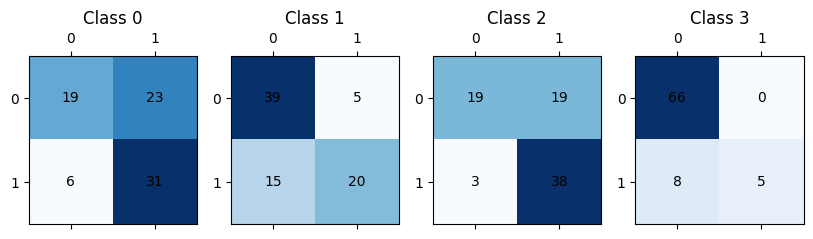

The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.58181818, 0.92857143, 0.62711864, 0.        ]), array([0.86486486, 0.37142857, 0.90243902, 0.        ]), array([0.69565217, 0.53061224, 0.74      , 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.58      0.86      0.70        37
           1       0.93      0.37      0.53        35
           2       0.63      0.90      0.74        41
           3       0.00      0.00      0.00        13

   micro avg       0.64      0.65      0.65       126
   macro avg       0.53      0.53      0.49       126
weighted avg       0.63      0.65      0.59       126
 samples avg       0.63      0.67      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


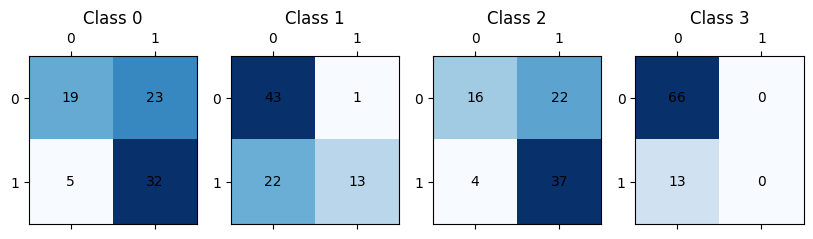

The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.56603774, 0.88      , 0.70454545, 0.        ]), array([0.81081081, 0.62857143, 0.75609756, 0.        ]), array([0.66666667, 0.73333333, 0.72941176, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.81      0.67        37
           1       0.88      0.63      0.73        35
           2       0.70      0.76      0.73        41
           3       0.00      0.00      0.00        13

   micro avg       0.68      0.66      0.67       126
   macro avg       0.54      0.55      0.53       126
weighted avg       0.64      0.66      0.64       126
 samples avg       0.65      0.68      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


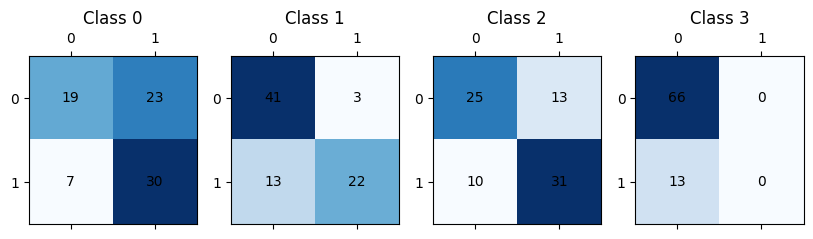

The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=MultinomialNB(force_alpha=True))  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.58      , 0.81481481, 0.75      , 0.        ]), array([0.78378378, 0.62857143, 0.80487805, 0.        ]), array([0.66666667, 0.70967742, 0.77647059, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.58      0.78      0.67        37
           1       0.81      0.63      0.71        35
           2       0.75      0.80      0.78        41
           3       0.00      0.00      0.00        13

   micro avg       0.69      0.67      0.68       126
   macro avg       0.54      0.55      0.54       126
weighted avg       0.64      0.67      0.65       126
 samples avg       0.66      0.70      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


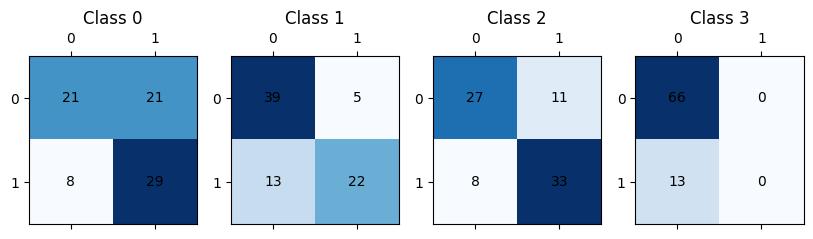

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.69230769, 0.85185185, 0.66666667, 0.69230769]), array([0.48648649, 0.65714286, 0.73170732, 0.69230769]), array([0.57142857, 0.74193548, 0.69767442, 0.69230769]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.49      0.57        37
           1       0.85      0.66      0.74        35
           2       0.67      0.73      0.70        41
           3       0.69      0.69      0.69        13

   micro avg       0.72      0.63      0.68       126
   macro avg       0.73      0.64      0.68       126
weighted avg       0.73      0.63      0.67       126
 samples avg       0.68      0.66      0.64       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


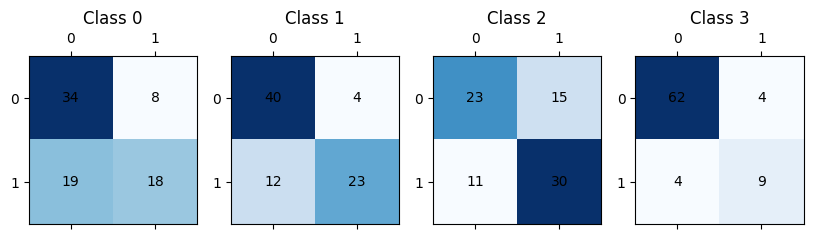

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.7037037 , 0.88888889, 0.61702128, 0.83333333]), array([0.51351351, 0.68571429, 0.70731707, 0.38461538]), array([0.59375   , 0.77419355, 0.65909091, 0.52631579]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.51      0.59        37
           1       0.89      0.69      0.77        35
           2       0.62      0.71      0.66        41
           3       0.83      0.38      0.53        13

   micro avg       0.72      0.61      0.66       126
   macro avg       0.76      0.57      0.64       126
weighted avg       0.74      0.61      0.66       126
 samples avg       0.68      0.65      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


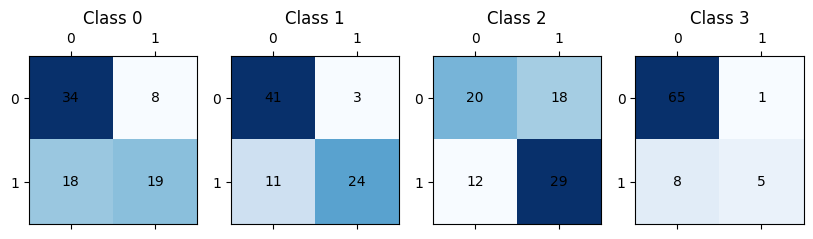

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.70833333, 0.9047619 , 0.6       , 0.57142857]), array([0.45945946, 0.54285714, 0.65853659, 0.61538462]), array([0.55737705, 0.67857143, 0.62790698, 0.59259259]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.71      0.46      0.56        37
           1       0.90      0.54      0.68        35
           2       0.60      0.66      0.63        41
           3       0.57      0.62      0.59        13

   micro avg       0.68      0.56      0.62       126
   macro avg       0.70      0.57      0.61       126
weighted avg       0.71      0.56      0.62       126
 samples avg       0.60      0.59      0.57       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


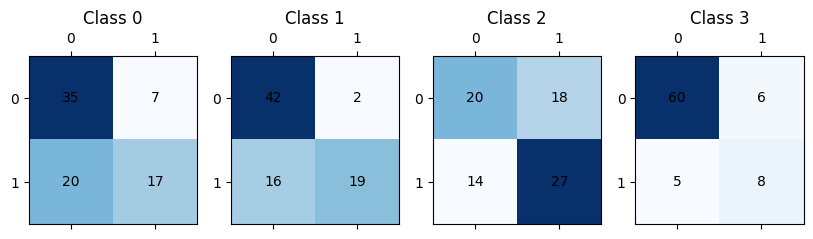

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.69565217, 0.95652174, 0.57142857, 0.4       ]), array([0.43243243, 0.62857143, 0.68292683, 0.15384615]), array([0.53333333, 0.75862069, 0.62222222, 0.22222222]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.43      0.53        37
           1       0.96      0.63      0.76        35
           2       0.57      0.68      0.62        41
           3       0.40      0.15      0.22        13

   micro avg       0.68      0.54      0.60       126
   macro avg       0.66      0.47      0.53       126
weighted avg       0.70      0.54      0.59       126
 samples avg       0.59      0.55      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


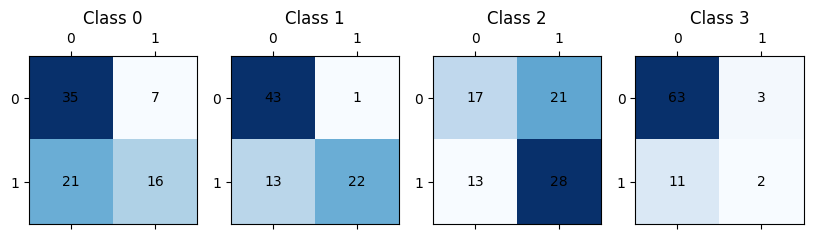

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.3291139240506329 presition, reccall, f1 = (array([0.66666667, 0.88461538, 0.61702128, 0.28571429]), array([0.54054054, 0.65714286, 0.70731707, 0.15384615]), array([0.59701493, 0.75409836, 0.65909091, 0.2       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.54      0.60        37
           1       0.88      0.66      0.75        35
           2       0.62      0.71      0.66        41
           3       0.29      0.15      0.20        13

   micro avg       0.67      0.59      0.63       126
   macro avg       0.61      0.51      0.55       126
weighted avg       0.67      0.59      0.62       126
 samples avg       0.62      0.61      0.59       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


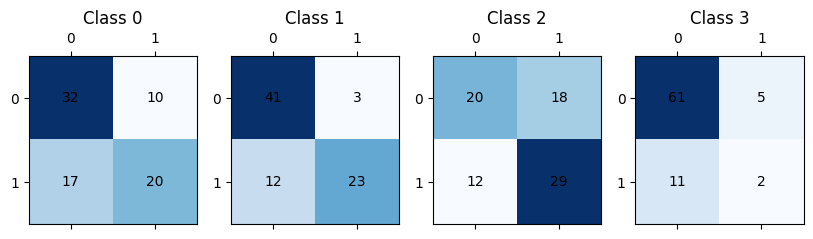

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  5 embedding name: glove basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.17721518987341772 presition, reccall, f1 = (array([0.55813953, 0.76      , 0.63265306, 0.25      ]), array([0.64864865, 0.54285714, 0.75609756, 0.15384615]), array([0.6       , 0.63333333, 0.68888889, 0.19047619]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.56      0.65      0.60        37
           1       0.76      0.54      0.63        35
           2       0.63      0.76      0.69        41
           3       0.25      0.15      0.19        13

   micro avg       0.61      0.60      0.61       126
   macro avg       0.55      0.53      0.53       126
weighted avg       0.61      0.60      0.60       126
 samples avg       0.57      0.62      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


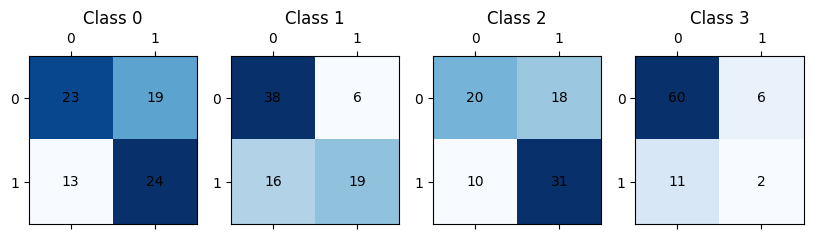

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.22784810126582278 presition, reccall, f1 = (array([0.59090909, 0.76      , 0.625     , 0.63636364]), array([0.7027027 , 0.54285714, 0.73170732, 0.53846154]), array([0.64197531, 0.63333333, 0.6741573 , 0.58333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.70      0.64        37
           1       0.76      0.54      0.63        35
           2       0.62      0.73      0.67        41
           3       0.64      0.54      0.58        13

   micro avg       0.64      0.65      0.65       126
   macro avg       0.65      0.63      0.63       126
weighted avg       0.65      0.65      0.64       126
 samples avg       0.61      0.69      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


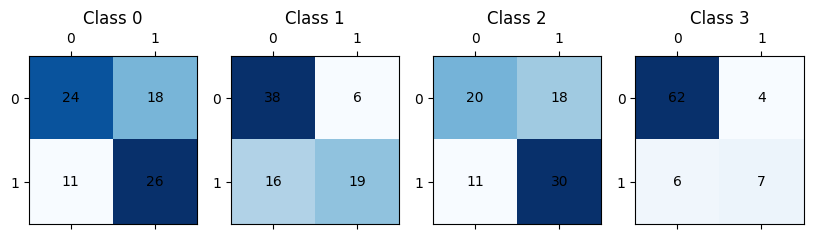

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  7 embedding name: use
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.61702128, 0.84      , 0.72727273, 0.58823529]), array([0.78378378, 0.6       , 0.7804878 , 0.76923077]), array([0.69047619, 0.7       , 0.75294118, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.78      0.69        37
           1       0.84      0.60      0.70        35
           2       0.73      0.78      0.75        41
           3       0.59      0.77      0.67        13

   micro avg       0.69      0.73      0.71       126
   macro avg       0.69      0.73      0.70       126
weighted avg       0.71      0.73      0.71       126
 samples avg       0.66      0.76      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


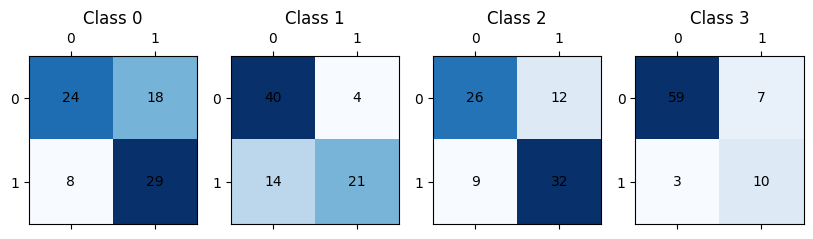

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.61702128, 0.81481481, 0.72727273, 0.55555556]), array([0.78378378, 0.62857143, 0.7804878 , 0.76923077]), array([0.69047619, 0.70967742, 0.75294118, 0.64516129]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.78      0.69        37
           1       0.81      0.63      0.71        35
           2       0.73      0.78      0.75        41
           3       0.56      0.77      0.65        13

   micro avg       0.68      0.74      0.71       126
   macro avg       0.68      0.74      0.70       126
weighted avg       0.70      0.74      0.71       126
 samples avg       0.68      0.76      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


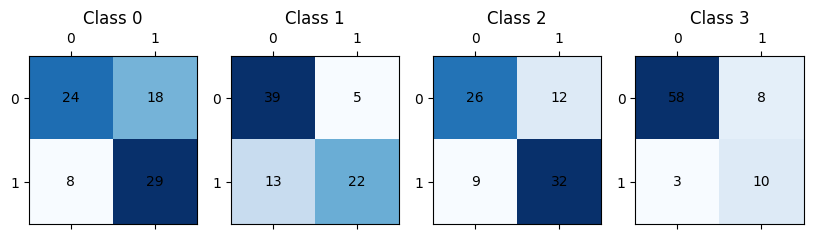

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.61363636, 0.80769231, 0.71111111, 0.66666667]), array([0.72972973, 0.6       , 0.7804878 , 0.61538462]), array([0.66666667, 0.68852459, 0.74418605, 0.64      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.61      0.73      0.67        37
           1       0.81      0.60      0.69        35
           2       0.71      0.78      0.74        41
           3       0.67      0.62      0.64        13

   micro avg       0.69      0.70      0.70       126
   macro avg       0.70      0.68      0.68       126
weighted avg       0.70      0.70      0.70       126
 samples avg       0.66      0.73      0.66       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


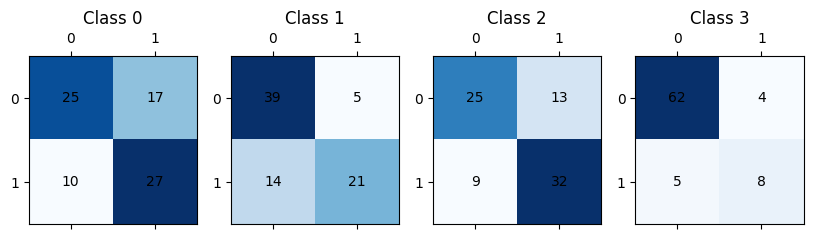

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.72972973, 0.72413793, 0.81578947, 0.76923077]), array([0.72972973, 0.6       , 0.75609756, 0.76923077]), array([0.72972973, 0.65625   , 0.78481013, 0.76923077]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.73      0.73      0.73        37
           1       0.72      0.60      0.66        35
           2       0.82      0.76      0.78        41
           3       0.77      0.77      0.77        13

   micro avg       0.76      0.71      0.73       126
   macro avg       0.76      0.71      0.74       126
weighted avg       0.76      0.71      0.73       126
 samples avg       0.74      0.73      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


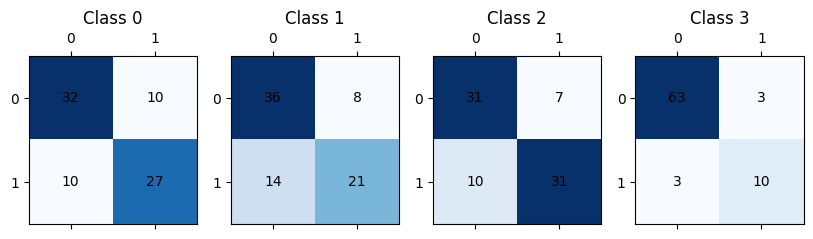

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.74285714, 0.78571429, 0.81578947, 0.8       ]), array([0.7027027 , 0.62857143, 0.75609756, 0.61538462]), array([0.72222222, 0.6984127 , 0.78481013, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.74      0.70      0.72        37
           1       0.79      0.63      0.70        35
           2       0.82      0.76      0.78        41
           3       0.80      0.62      0.70        13

   micro avg       0.78      0.69      0.73       126
   macro avg       0.79      0.68      0.73       126
weighted avg       0.78      0.69      0.73       126
 samples avg       0.74      0.71      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


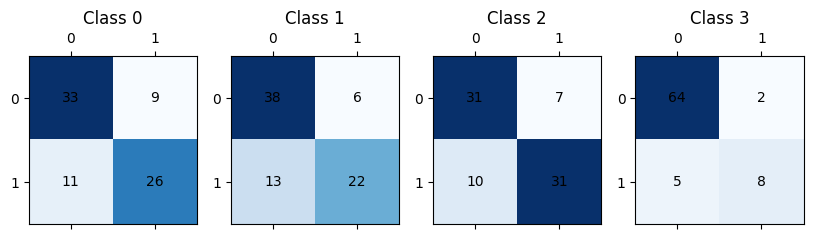

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.75      , 0.75862069, 0.81578947, 0.8       ]), array([0.72972973, 0.62857143, 0.75609756, 0.61538462]), array([0.73972603, 0.6875    , 0.78481013, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.75      0.73      0.74        37
           1       0.76      0.63      0.69        35
           2       0.82      0.76      0.78        41
           3       0.80      0.62      0.70        13

   micro avg       0.78      0.70      0.74       126
   macro avg       0.78      0.68      0.73       126
weighted avg       0.78      0.70      0.74       126
 samples avg       0.74      0.72      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


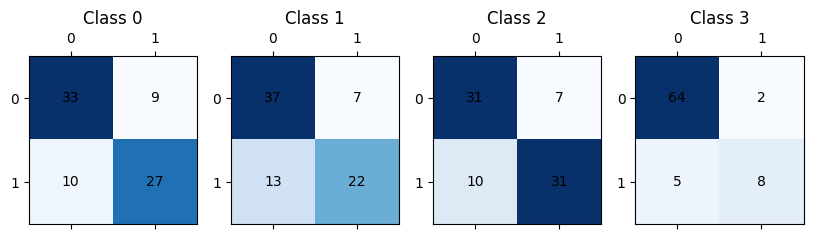

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.17721518987341772 presition, reccall, f1 = (array([0.6       , 0.7826087 , 0.65957447, 0.        ]), array([0.64864865, 0.51428571, 0.75609756, 0.        ]), array([0.62337662, 0.62068966, 0.70454545, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.65      0.62        37
           1       0.78      0.51      0.62        35
           2       0.66      0.76      0.70        41
           3       0.00      0.00      0.00        13

   micro avg       0.65      0.58      0.61       126
   macro avg       0.51      0.48      0.49       126
weighted avg       0.61      0.58      0.58       126
 samples avg       0.54      0.57      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


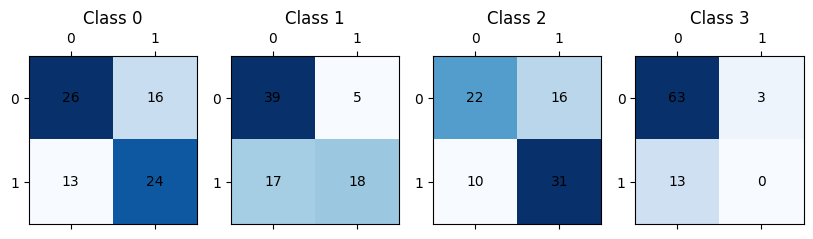

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.25316455696202533 presition, reccall, f1 = (array([0.61702128, 0.75      , 0.6744186 , 1.        ]), array([0.78378378, 0.51428571, 0.70731707, 0.53846154]), array([0.69047619, 0.61016949, 0.69047619, 0.7       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.78      0.69        37
           1       0.75      0.51      0.61        35
           2       0.67      0.71      0.69        41
           3       1.00      0.54      0.70        13

   micro avg       0.69      0.66      0.67       126
   macro avg       0.76      0.64      0.67       126
weighted avg       0.71      0.66      0.67       126
 samples avg       0.63      0.66      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


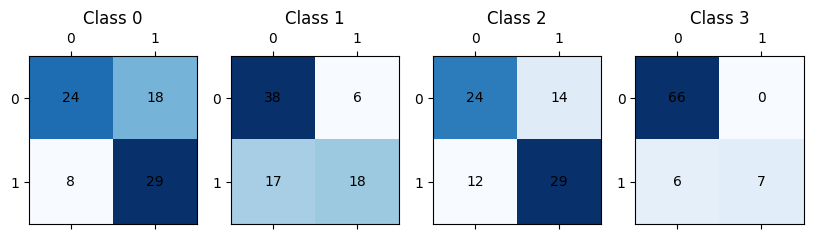

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.65116279, 0.82608696, 0.625     , 0.7       ]), array([0.75675676, 0.54285714, 0.73170732, 0.53846154]), array([0.7       , 0.65517241, 0.6741573 , 0.60869565]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.76      0.70        37
           1       0.83      0.54      0.66        35
           2       0.62      0.73      0.67        41
           3       0.70      0.54      0.61        13

   micro avg       0.68      0.67      0.67       126
   macro avg       0.70      0.64      0.66       126
weighted avg       0.70      0.67      0.67       126
 samples avg       0.62      0.67      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


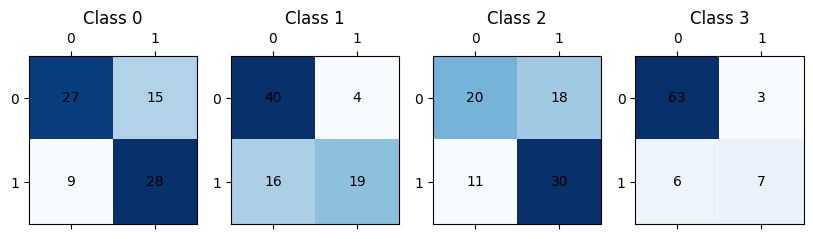

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.25316455696202533 presition, reccall, f1 = (array([0.59090909, 0.88      , 0.61904762, 0.        ]), array([0.7027027 , 0.62857143, 0.63414634, 0.        ]), array([0.64197531, 0.73333333, 0.62650602, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.70      0.64        37
           1       0.88      0.63      0.73        35
           2       0.62      0.63      0.63        41
           3       0.00      0.00      0.00        13

   micro avg       0.65      0.59      0.62       126
   macro avg       0.52      0.49      0.50       126
weighted avg       0.62      0.59      0.60       126
 samples avg       0.59      0.58      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


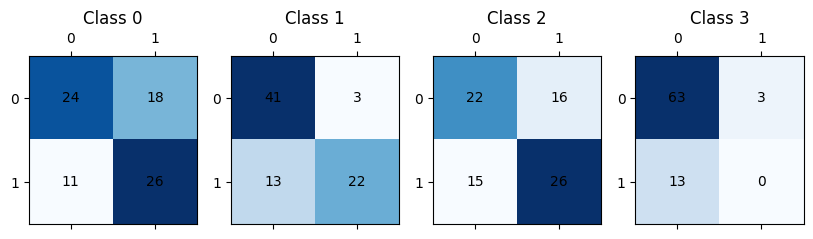

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.3291139240506329 presition, reccall, f1 = (array([0.64444444, 0.88      , 0.63414634, 0.9       ]), array([0.78378378, 0.62857143, 0.63414634, 0.69230769]), array([0.70731707, 0.73333333, 0.63414634, 0.7826087 ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.78      0.71        37
           1       0.88      0.63      0.73        35
           2       0.63      0.63      0.63        41
           3       0.90      0.69      0.78        13

   micro avg       0.71      0.68      0.70       126
   macro avg       0.76      0.68      0.71       126
weighted avg       0.73      0.68      0.70       126
 samples avg       0.70      0.70      0.66       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


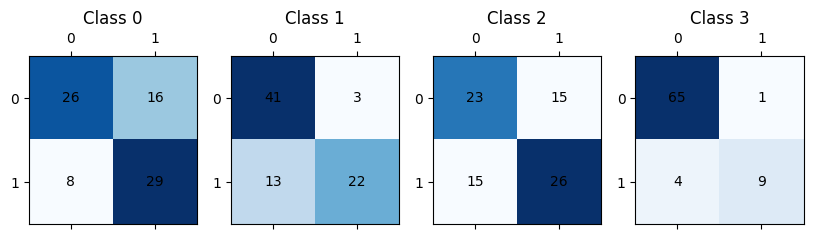

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.69565217, 0.875     , 0.63157895, 0.64285714]), array([0.86486486, 0.6       , 0.58536585, 0.69230769]), array([0.77108434, 0.71186441, 0.60759494, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.86      0.77        37
           1       0.88      0.60      0.71        35
           2       0.63      0.59      0.61        41
           3       0.64      0.69      0.67        13

   micro avg       0.70      0.68      0.69       126
   macro avg       0.71      0.69      0.69       126
weighted avg       0.72      0.68      0.69       126
 samples avg       0.69      0.71      0.66       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


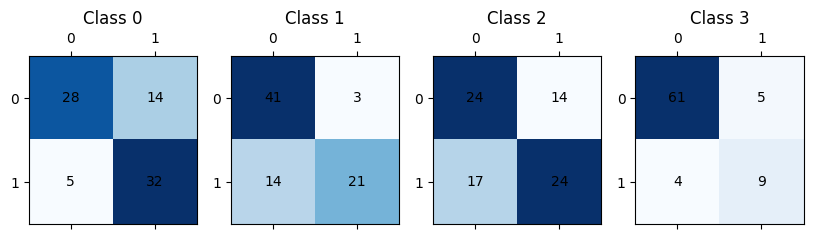

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.56521739, 0.73333333, 0.75609756, 0.66666667]), array([0.7027027 , 0.62857143, 0.75609756, 0.61538462]), array([0.62650602, 0.67692308, 0.75609756, 0.64      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.70      0.63        37
           1       0.73      0.63      0.68        35
           2       0.76      0.76      0.76        41
           3       0.67      0.62      0.64        13

   micro avg       0.67      0.69      0.68       126
   macro avg       0.68      0.68      0.67       126
weighted avg       0.68      0.69      0.68       126
 samples avg       0.65      0.71      0.64       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


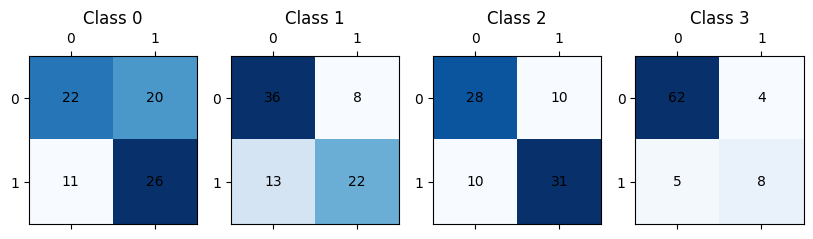

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.6122449 , 0.72413793, 0.69565217, 0.72727273]), array([0.81081081, 0.6       , 0.7804878 , 0.61538462]), array([0.69767442, 0.65625   , 0.73563218, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.61      0.81      0.70        37
           1       0.72      0.60      0.66        35
           2       0.70      0.78      0.74        41
           3       0.73      0.62      0.67        13

   micro avg       0.67      0.72      0.70       126
   macro avg       0.69      0.70      0.69       126
weighted avg       0.68      0.72      0.70       126
 samples avg       0.69      0.76      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


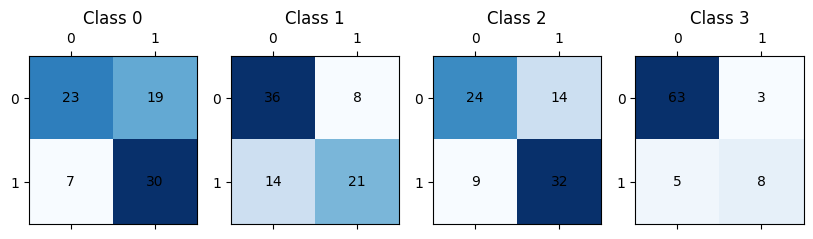

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.379746835443038 presition, reccall, f1 = (array([0.625     , 0.73333333, 0.73809524, 0.90909091]), array([0.81081081, 0.62857143, 0.75609756, 0.76923077]), array([0.70588235, 0.67692308, 0.74698795, 0.83333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.81      0.71        37
           1       0.73      0.63      0.68        35
           2       0.74      0.76      0.75        41
           3       0.91      0.77      0.83        13

   micro avg       0.71      0.74      0.72       126
   macro avg       0.75      0.74      0.74       126
weighted avg       0.72      0.74      0.72       126
 samples avg       0.68      0.77      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


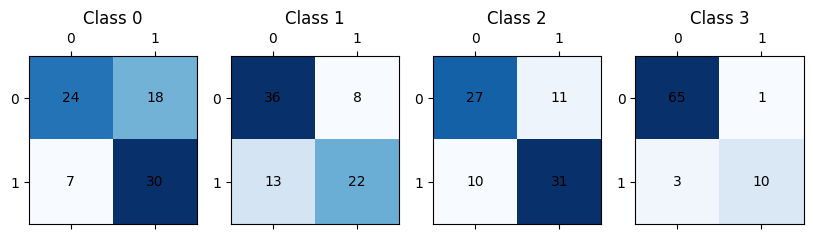

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.58695652, 0.69230769, 0.675     , 0.5       ]), array([0.72972973, 0.51428571, 0.65853659, 0.15384615]), array([0.65060241, 0.59016393, 0.66666667, 0.23529412]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.73      0.65        37
           1       0.69      0.51      0.59        35
           2       0.68      0.66      0.67        41
           3       0.50      0.15      0.24        13

   micro avg       0.64      0.59      0.61       126
   macro avg       0.61      0.51      0.54       126
weighted avg       0.64      0.59      0.60       126
 samples avg       0.60      0.61      0.57       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


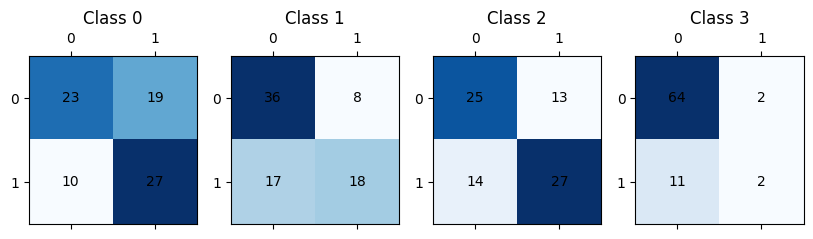

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.56      , 0.73913043, 0.63414634, 1.        ]), array([0.75675676, 0.48571429, 0.63414634, 0.61538462]), array([0.64367816, 0.5862069 , 0.63414634, 0.76190476]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.56      0.76      0.64        37
           1       0.74      0.49      0.59        35
           2       0.63      0.63      0.63        41
           3       1.00      0.62      0.76        13

   micro avg       0.65      0.63      0.64       126
   macro avg       0.73      0.62      0.66       126
weighted avg       0.68      0.63      0.64       126
 samples avg       0.63      0.67      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


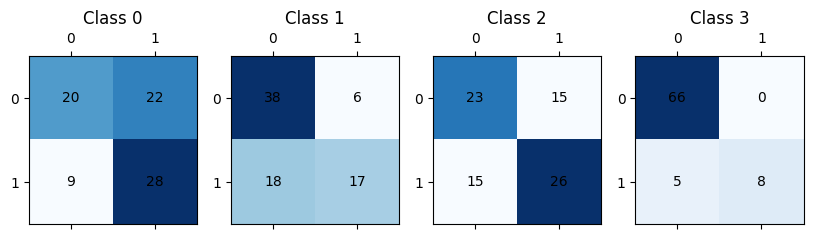

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.25316455696202533 presition, reccall, f1 = (array([0.54901961, 0.73913043, 0.65      , 0.75      ]), array([0.75675676, 0.48571429, 0.63414634, 0.69230769]), array([0.63636364, 0.5862069 , 0.64197531, 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.55      0.76      0.64        37
           1       0.74      0.49      0.59        35
           2       0.65      0.63      0.64        41
           3       0.75      0.69      0.72        13

   micro avg       0.63      0.63      0.63       126
   macro avg       0.67      0.64      0.65       126
weighted avg       0.66      0.63      0.63       126
 samples avg       0.60      0.67      0.60       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


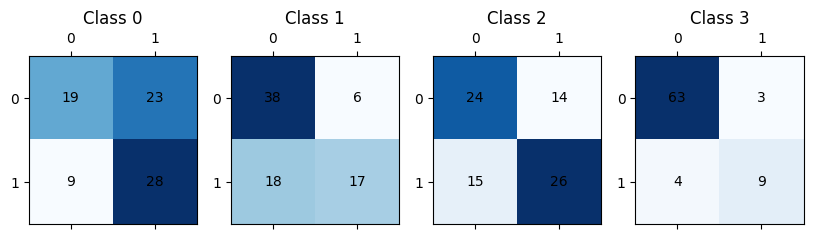

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.68292683, 0.76470588, 0.83783784, 0.625     ]), array([0.75675676, 0.74285714, 0.75609756, 0.76923077]), array([0.71794872, 0.75362319, 0.79487179, 0.68965517]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.76      0.72        37
           1       0.76      0.74      0.75        35
           2       0.84      0.76      0.79        41
           3       0.62      0.77      0.69        13

   micro avg       0.74      0.75      0.75       126
   macro avg       0.73      0.76      0.74       126
weighted avg       0.75      0.75      0.75       126
 samples avg       0.74      0.77      0.73       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


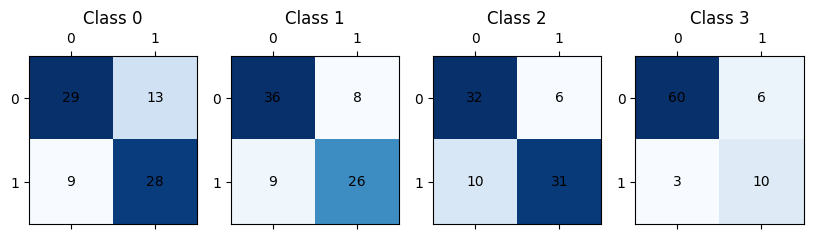

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.68571429, 0.76470588, 0.83783784, 0.75      ]), array([0.64864865, 0.74285714, 0.75609756, 0.69230769]), array([0.66666667, 0.75362319, 0.79487179, 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.65      0.67        37
           1       0.76      0.74      0.75        35
           2       0.84      0.76      0.79        41
           3       0.75      0.69      0.72        13

   micro avg       0.76      0.71      0.74       126
   macro avg       0.76      0.71      0.73       126
weighted avg       0.76      0.71      0.74       126
 samples avg       0.73      0.73      0.71     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


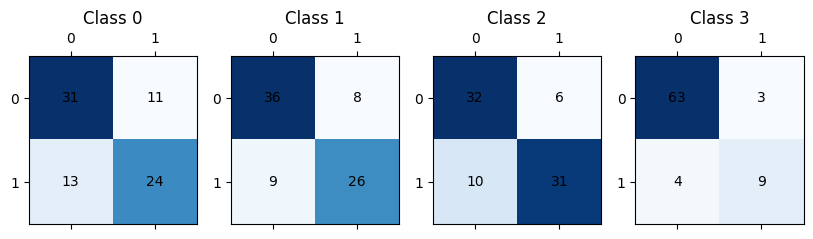

The MultiOutputClassifier(estimator=GradientBoostingClassifier())  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GradientBoostingClassifier())  Accuracy  is 0.5063291139240507 presition, reccall, f1 = (array([0.75      , 0.75757576, 0.79487179, 0.8       ]), array([0.81081081, 0.71428571, 0.75609756, 0.61538462]), array([0.77922078, 0.73529412, 0.775     , 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.75      0.81      0.78        37
           1       0.76      0.71      0.74        35
           2       0.79      0.76      0.77        41
           3       0.80      0.62      0.70        13

   micro avg       0.77      0.75      0.76       126
   macro avg       0.78      0.72      0.75       126
weighted avg       0.77      0.75      0.76       126
 samples avg       0.75      0.77      0.74  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


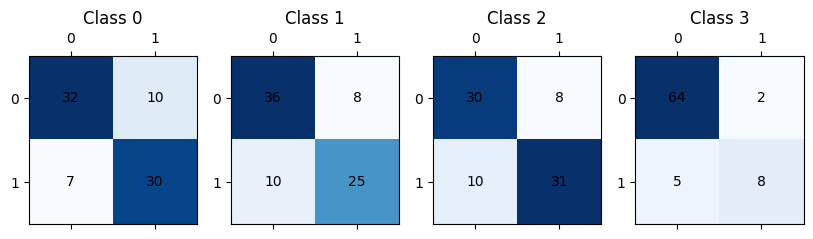

The MultiOutputClassifier(estimator=GaussianNB())  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.64705882, 0.25      ]), array([0.54054054, 0.74285714, 0.53658537, 0.46153846]), array([0.54054054, 0.64197531, 0.58666667, 0.32432432]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.65      0.54      0.59        41
           3       0.25      0.46      0.32        13

   micro avg       0.52      0.59      0.55       126
   macro avg       0.50      0.57      0.52       126
weighted avg       0.55      0.59      0.56       126
 samples avg       0.53      0.59      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


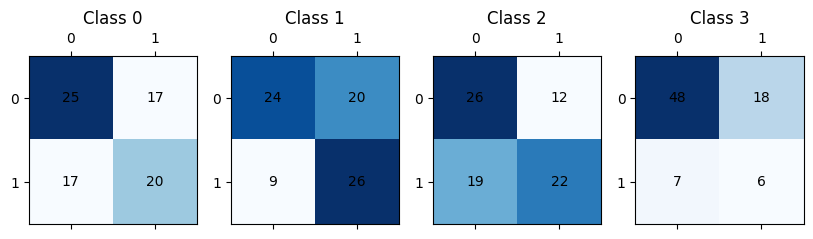

The MultiOutputClassifier(estimator=GaussianNB())  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.63636364, 0.28      ]), array([0.54054054, 0.74285714, 0.51219512, 0.53846154]), array([0.54054054, 0.64197531, 0.56756757, 0.36842105]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.64      0.51      0.57        41
           3       0.28      0.54      0.37        13

   micro avg       0.52      0.59      0.55       126
   macro avg       0.51      0.58      0.53       126
weighted avg       0.55      0.59      0.56       126
 samples avg       0.53      0.59      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


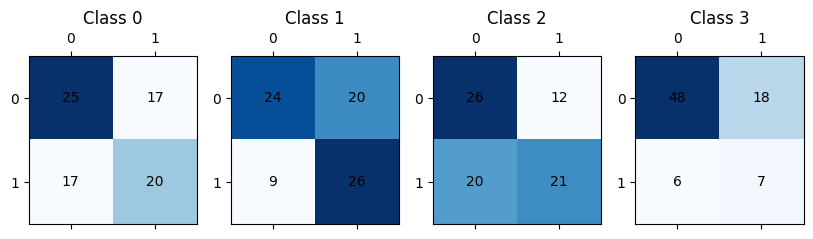

The MultiOutputClassifier(estimator=GaussianNB())  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.20253164556962025 presition, reccall, f1 = (array([0.53846154, 0.58139535, 0.69230769, 0.15789474]), array([0.56756757, 0.71428571, 0.65853659, 0.23076923]), array([0.55263158, 0.64102564, 0.675     , 0.1875    ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.57      0.55        37
           1       0.58      0.71      0.64        35
           2       0.69      0.66      0.68        41
           3       0.16      0.23      0.19        13

   micro avg       0.54      0.60      0.57       126
   macro avg       0.49      0.54      0.51       126
weighted avg       0.56      0.60      0.58       126
 samples avg       0.56      0.63      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


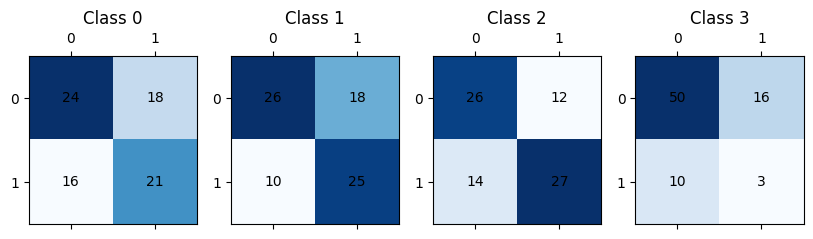

The MultiOutputClassifier(estimator=GaussianNB())  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.64705882, 0.25      ]), array([0.54054054, 0.74285714, 0.53658537, 0.46153846]), array([0.54054054, 0.64197531, 0.58666667, 0.32432432]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.65      0.54      0.59        41
           3       0.25      0.46      0.32        13

   micro avg       0.52      0.59      0.55       126
   macro avg       0.50      0.57      0.52       126
weighted avg       0.55      0.59      0.56       126
 samples avg       0.53      0.59      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


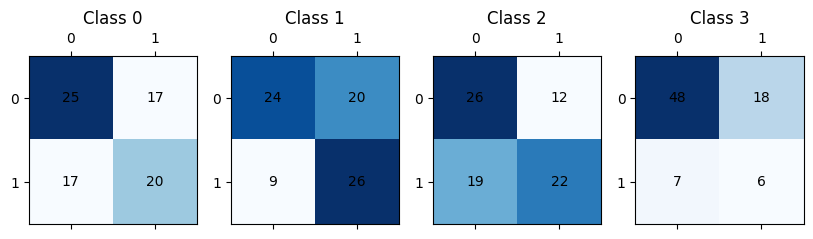

The MultiOutputClassifier(estimator=GaussianNB())  5 embedding name: glove basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.12658227848101267 presition, reccall, f1 = (array([0.54716981, 0.71875   , 0.56363636, 0.30555556]), array([0.78378378, 0.65714286, 0.75609756, 0.84615385]), array([0.64444444, 0.68656716, 0.64583333, 0.44897959]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.55      0.78      0.64        37
           1       0.72      0.66      0.69        35
           2       0.56      0.76      0.65        41
           3       0.31      0.85      0.45        13

   micro avg       0.53      0.75      0.62       126
   macro avg       0.53      0.76      0.61       126
weighted avg       0.58      0.75      0.64       126
 samples avg       0.47      0.72      0.54       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


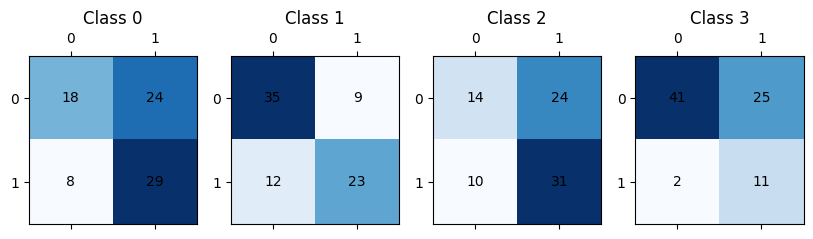

The MultiOutputClassifier(estimator=GaussianNB())  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.53703704, 0.675     , 0.6       , 0.61538462]), array([0.78378378, 0.77142857, 0.80487805, 0.61538462]), array([0.63736264, 0.72      , 0.6875    , 0.61538462]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.78      0.64        37
           1       0.68      0.77      0.72        35
           2       0.60      0.80      0.69        41
           3       0.62      0.62      0.62        13

   micro avg       0.60      0.77      0.67       126
   macro avg       0.61      0.74      0.67       126
weighted avg       0.60      0.77      0.67       126
 samples avg       0.51      0.75      0.58       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


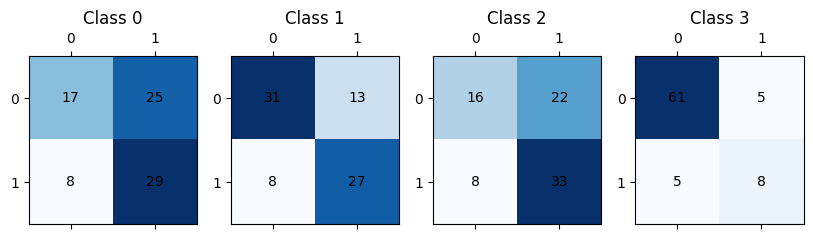

The MultiOutputClassifier(estimator=GaussianNB())  7 embedding name: use
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.6       , 0.72222222, 0.84848485, 0.55555556]), array([0.64864865, 0.74285714, 0.68292683, 0.76923077]), array([0.62337662, 0.73239437, 0.75675676, 0.64516129]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.65      0.62        37
           1       0.72      0.74      0.73        35
           2       0.85      0.68      0.76        41
           3       0.56      0.77      0.65        13

   micro avg       0.69      0.70      0.70       126
   macro avg       0.68      0.71      0.69       126
weighted avg       0.71      0.70      0.70       126
 samples avg       0.66      0.72      0.66       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


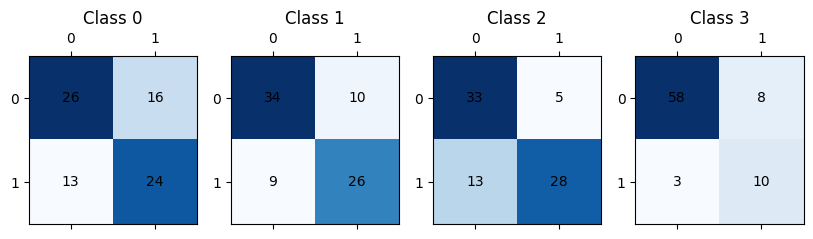

The MultiOutputClassifier(estimator=GaussianNB())  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.59183673, 0.65909091, 0.73913043, 0.71428571]), array([0.78378378, 0.82857143, 0.82926829, 0.76923077]), array([0.6744186 , 0.73417722, 0.7816092 , 0.74074074]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.78      0.67        37
           1       0.66      0.83      0.73        35
           2       0.74      0.83      0.78        41
           3       0.71      0.77      0.74        13

   micro avg       0.67      0.81      0.73       126
   macro avg       0.68      0.80      0.73       126
weighted avg       0.67      0.81      0.73       126
 samples avg       0.67      0.82      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


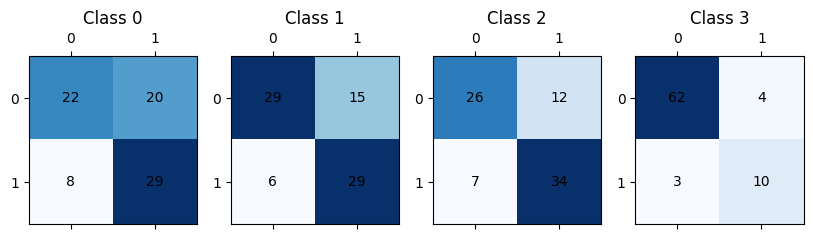

The MultiOutputClassifier(estimator=GaussianNB())  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.4050632911392405 presition, reccall, f1 = (array([0.63157895, 0.7027027 , 0.84375   , 0.55555556]), array([0.64864865, 0.74285714, 0.65853659, 0.76923077]), array([0.64      , 0.72222222, 0.73972603, 0.64516129]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.65      0.64        37
           1       0.70      0.74      0.72        35
           2       0.84      0.66      0.74        41
           3       0.56      0.77      0.65        13

   micro avg       0.70      0.69      0.69       126
   macro avg       0.68      0.70      0.69       126
weighted avg       0.71      0.69      0.70       126
 samples avg       0.65      0.70      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


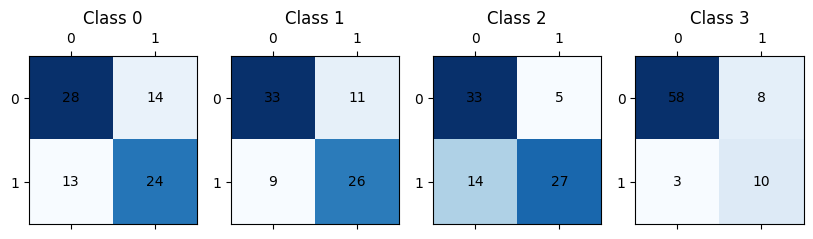

The MultiOutputClassifier(estimator=GaussianNB())  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.64102564, 0.75      , 0.825     , 0.66666667]), array([0.67567568, 0.68571429, 0.80487805, 0.92307692]), array([0.65789474, 0.71641791, 0.81481481, 0.77419355]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.68      0.66        37
           1       0.75      0.69      0.72        35
           2       0.82      0.80      0.81        41
           3       0.67      0.92      0.77        13

   micro avg       0.73      0.75      0.74       126
   macro avg       0.72      0.77      0.74       126
weighted avg       0.73      0.75      0.74       126
 samples avg       0.75      0.77      0.73       126



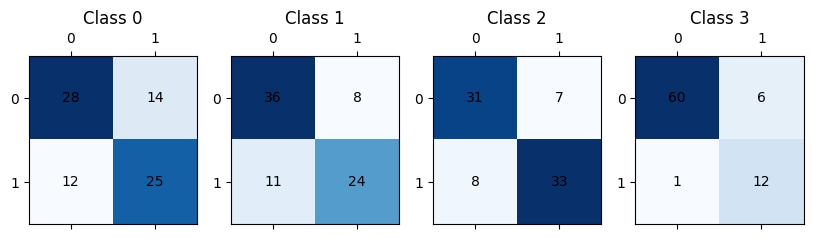

The MultiOutputClassifier(estimator=GaussianNB())  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.60416667, 0.69230769, 0.70833333, 0.64705882]), array([0.78378378, 0.77142857, 0.82926829, 0.84615385]), array([0.68235294, 0.72972973, 0.76404494, 0.73333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.78      0.68        37
           1       0.69      0.77      0.73        35
           2       0.71      0.83      0.76        41
           3       0.65      0.85      0.73        13

   micro avg       0.66      0.80      0.73       126
   macro avg       0.66      0.81      0.73       126
weighted avg       0.67      0.80      0.73       126
 samples avg       0.69      0.82      0.71       126



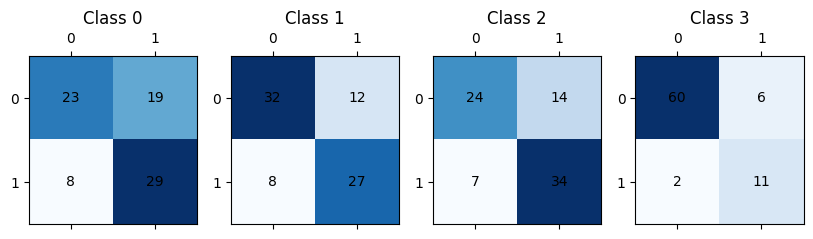

The MultiOutputClassifier(estimator=GaussianNB())  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.65      , 0.75      , 0.82051282, 0.61111111]), array([0.7027027 , 0.68571429, 0.7804878 , 0.84615385]), array([0.67532468, 0.71641791, 0.8       , 0.70967742]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.70      0.68        37
           1       0.75      0.69      0.72        35
           2       0.82      0.78      0.80        41
           3       0.61      0.85      0.71        13

   micro avg       0.72      0.74      0.73       126
   macro avg       0.71      0.75      0.73       126
weighted avg       0.73      0.74      0.73       126
 samples avg       0.73      0.76      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


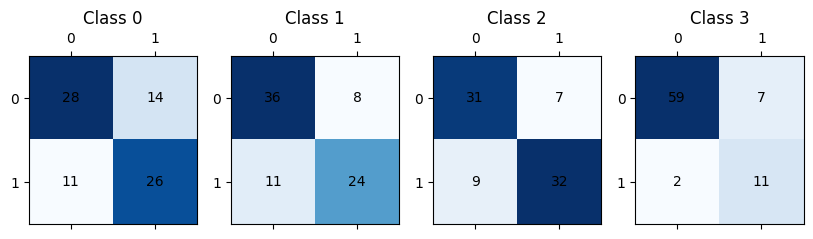

The MultiOutputClassifier(estimator=GaussianNB())  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.7       , 0.80645161, 0.69230769, 0.25925926]), array([0.56756757, 0.71428571, 0.65853659, 0.53846154]), array([0.62686567, 0.75757576, 0.675     , 0.35      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.57      0.63        37
           1       0.81      0.71      0.76        35
           2       0.69      0.66      0.68        41
           3       0.26      0.54      0.35        13

   micro avg       0.63      0.63      0.63       126
   macro avg       0.61      0.62      0.60       126
weighted avg       0.68      0.63      0.65       126
 samples avg       0.61      0.64      0.59       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


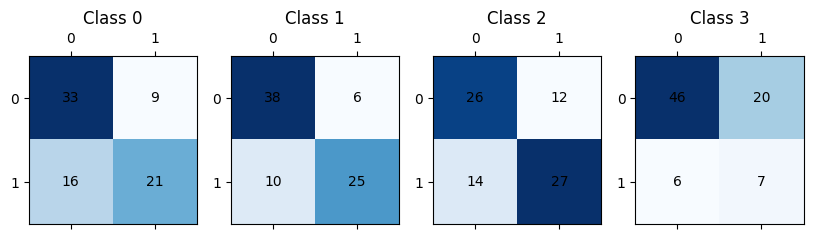

The MultiOutputClassifier(estimator=GaussianNB())  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.68      , 0.77777778, 0.67924528, 0.53333333]), array([0.91891892, 0.8       , 0.87804878, 0.61538462]), array([0.7816092 , 0.78873239, 0.76595745, 0.57142857]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.92      0.78        37
           1       0.78      0.80      0.79        35
           2       0.68      0.88      0.77        41
           3       0.53      0.62      0.57        13

   micro avg       0.69      0.84      0.76       126
   macro avg       0.67      0.80      0.73       126
weighted avg       0.69      0.84      0.76       126
 samples avg       0.70      0.86      0.75       126



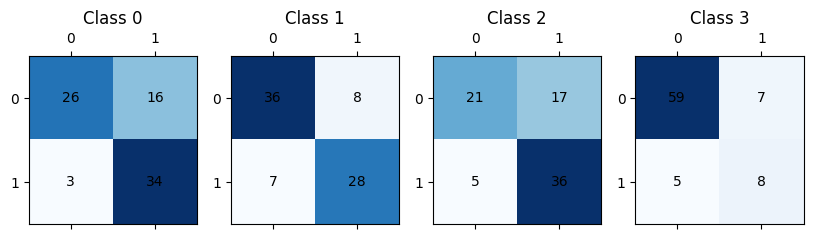

The MultiOutputClassifier(estimator=GaussianNB())  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.6875    , 0.80645161, 0.69230769, 0.30769231]), array([0.59459459, 0.71428571, 0.65853659, 0.61538462]), array([0.63768116, 0.75757576, 0.675     , 0.41025641]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.59      0.64        37
           1       0.81      0.71      0.76        35
           2       0.69      0.66      0.68        41
           3       0.31      0.62      0.41        13

   micro avg       0.64      0.65      0.65       126
   macro avg       0.62      0.65      0.62       126
weighted avg       0.68      0.65      0.66       126
 samples avg       0.64      0.66      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


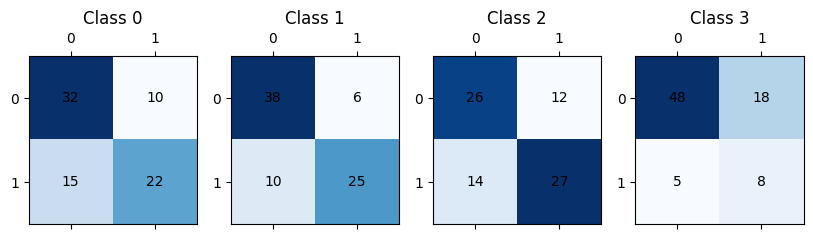

The MultiOutputClassifier(estimator=GaussianNB())  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.69444444, 0.78787879, 0.72222222, 0.31578947]), array([0.67567568, 0.74285714, 0.63414634, 0.46153846]), array([0.68493151, 0.76470588, 0.67532468, 0.375     ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.68      0.68        37
           1       0.79      0.74      0.76        35
           2       0.72      0.63      0.68        41
           3       0.32      0.46      0.37        13

   micro avg       0.67      0.66      0.66       126
   macro avg       0.63      0.63      0.62       126
weighted avg       0.69      0.66      0.67       126
 samples avg       0.64      0.65      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


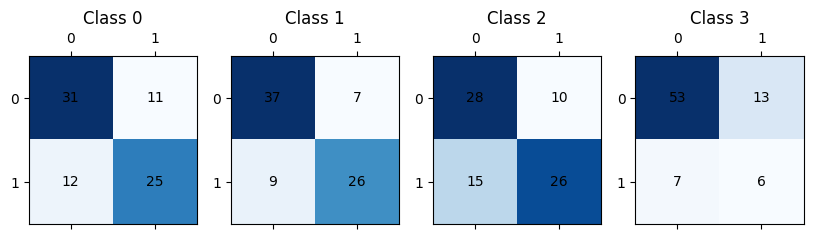

The MultiOutputClassifier(estimator=GaussianNB())  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.3291139240506329 presition, reccall, f1 = (array([0.62264151, 0.69047619, 0.63793103, 0.8       ]), array([0.89189189, 0.82857143, 0.90243902, 0.61538462]), array([0.73333333, 0.75324675, 0.74747475, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.89      0.73        37
           1       0.69      0.83      0.75        35
           2       0.64      0.90      0.75        41
           3       0.80      0.62      0.70        13

   micro avg       0.66      0.85      0.74       126
   macro avg       0.69      0.81      0.73       126
weighted avg       0.66      0.85      0.74       126
 samples avg       0.66      0.84      0.72       126



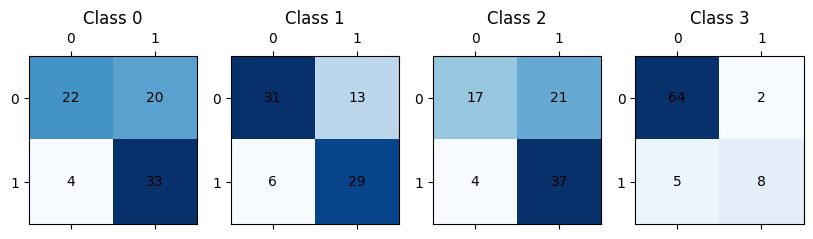

The MultiOutputClassifier(estimator=GaussianNB())  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.71052632, 0.78787879, 0.75      , 0.35      ]), array([0.72972973, 0.74285714, 0.65853659, 0.53846154]), array([0.72      , 0.76470588, 0.7012987 , 0.42424242]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.71      0.73      0.72        37
           1       0.79      0.74      0.76        35
           2       0.75      0.66      0.70        41
           3       0.35      0.54      0.42        13

   micro avg       0.69      0.69      0.69       126
   macro avg       0.65      0.67      0.65       126
weighted avg       0.71      0.69      0.70       126
 samples avg       0.67      0.69      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


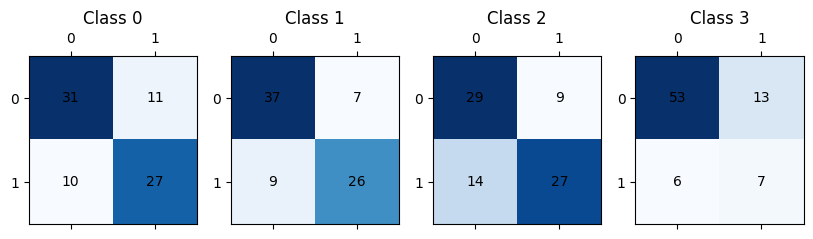

The MultiOutputClassifier(estimator=GaussianNB())  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.61363636, 0.77142857, 0.75609756, 0.58823529]), array([0.72972973, 0.77142857, 0.75609756, 0.76923077]), array([0.66666667, 0.77142857, 0.75609756, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.61      0.73      0.67        37
           1       0.77      0.77      0.77        35
           2       0.76      0.76      0.76        41
           3       0.59      0.77      0.67        13

   micro avg       0.69      0.75      0.72       126
   macro avg       0.68      0.76      0.72       126
weighted avg       0.70      0.75      0.72       126
 samples avg       0.73      0.79      0.73       126



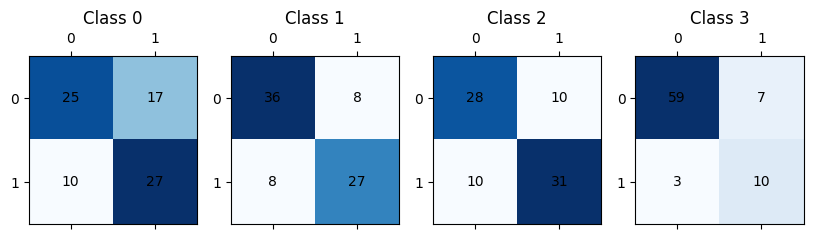

The MultiOutputClassifier(estimator=GaussianNB())  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.379746835443038 presition, reccall, f1 = (array([0.6       , 0.725     , 0.7173913 , 0.55555556]), array([0.81081081, 0.82857143, 0.80487805, 0.76923077]), array([0.68965517, 0.77333333, 0.75862069, 0.64516129]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.81      0.69        37
           1       0.72      0.83      0.77        35
           2       0.72      0.80      0.76        41
           3       0.56      0.77      0.65        13

   micro avg       0.66      0.81      0.73       126
   macro avg       0.65      0.80      0.72       126
weighted avg       0.67      0.81      0.73       126
 samples avg       0.70      0.83      0.73       126



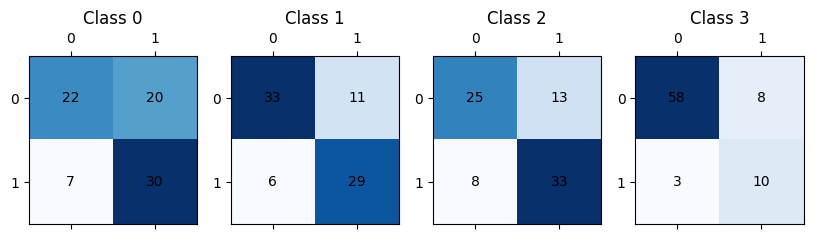

The MultiOutputClassifier(estimator=GaussianNB())  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.4050632911392405 presition, reccall, f1 = (array([0.61363636, 0.77777778, 0.75      , 0.58823529]), array([0.72972973, 0.8       , 0.73170732, 0.76923077]), array([0.66666667, 0.78873239, 0.74074074, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.61      0.73      0.67        37
           1       0.78      0.80      0.79        35
           2       0.75      0.73      0.74        41
           3       0.59      0.77      0.67        13

   micro avg       0.69      0.75      0.72       126
   macro avg       0.68      0.76      0.72       126
weighted avg       0.70      0.75      0.72       126
 samples avg       0.72      0.78      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


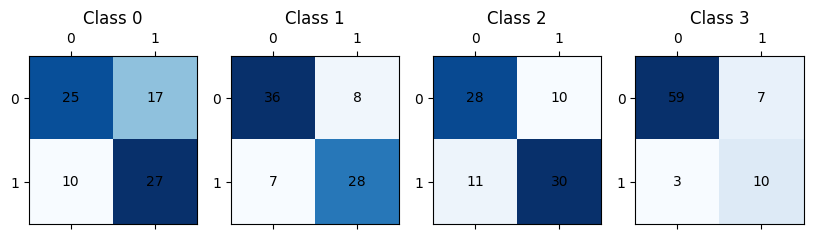

The MultiOutputClassifier(estimator=GaussianNB())  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.5952381 , 0.77419355, 0.67567568, 0.28571429]), array([0.67567568, 0.68571429, 0.6097561 , 0.46153846]), array([0.63291139, 0.72727273, 0.64102564, 0.35294118]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.68      0.63        37
           1       0.77      0.69      0.73        35
           2       0.68      0.61      0.64        41
           3       0.29      0.46      0.35        13

   micro avg       0.61      0.63      0.62       126
   macro avg       0.58      0.61      0.59       126
weighted avg       0.64      0.63      0.63       126
 samples avg       0.58      0.64      0.57       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


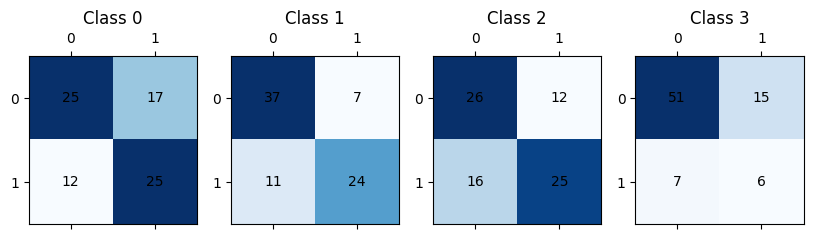

The MultiOutputClassifier(estimator=GaussianNB())  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.26582278481012656 presition, reccall, f1 = (array([0.55932203, 0.70454545, 0.62264151, 0.85714286]), array([0.89189189, 0.88571429, 0.80487805, 0.46153846]), array([0.6875    , 0.78481013, 0.70212766, 0.6       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.56      0.89      0.69        37
           1       0.70      0.89      0.78        35
           2       0.62      0.80      0.70        41
           3       0.86      0.46      0.60        13

   micro avg       0.63      0.82      0.71       126
   macro avg       0.69      0.76      0.69       126
weighted avg       0.65      0.82      0.71       126
 samples avg       0.61      0.80      0.67       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


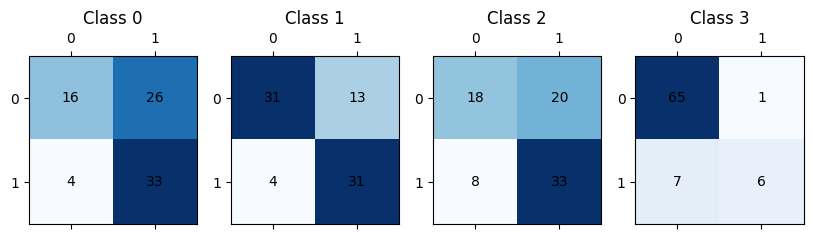

The MultiOutputClassifier(estimator=GaussianNB())  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.24050632911392406 presition, reccall, f1 = (array([0.60465116, 0.79310345, 0.68421053, 0.4       ]), array([0.7027027 , 0.65714286, 0.63414634, 0.61538462]), array([0.65      , 0.71875   , 0.65822785, 0.48484848]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.70      0.65        37
           1       0.79      0.66      0.72        35
           2       0.68      0.63      0.66        41
           3       0.40      0.62      0.48        13

   micro avg       0.64      0.66      0.65       126
   macro avg       0.62      0.65      0.63       126
weighted avg       0.66      0.66      0.65       126
 samples avg       0.63      0.67      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


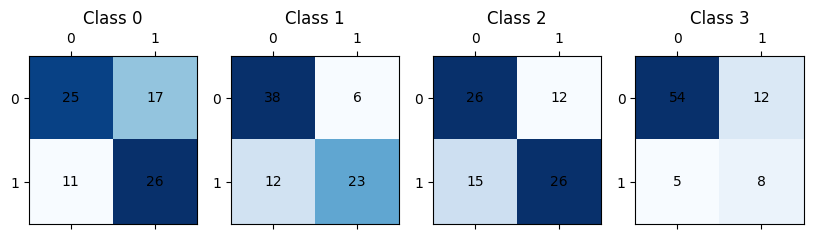

The MultiOutputClassifier(estimator=GaussianNB())  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.64705882, 0.25      ]), array([0.54054054, 0.74285714, 0.53658537, 0.46153846]), array([0.54054054, 0.64197531, 0.58666667, 0.32432432]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.65      0.54      0.59        41
           3       0.25      0.46      0.32        13

   micro avg       0.52      0.59      0.55       126
   macro avg       0.50      0.57      0.52       126
weighted avg       0.55      0.59      0.56       126
 samples avg       0.53      0.59      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


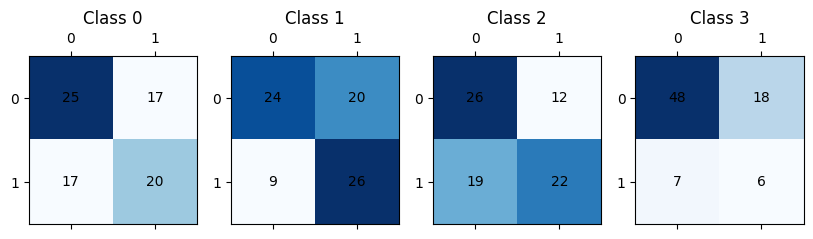

The MultiOutputClassifier(estimator=GaussianNB())  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.64705882, 0.28      ]), array([0.54054054, 0.74285714, 0.53658537, 0.53846154]), array([0.54054054, 0.64197531, 0.58666667, 0.36842105]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.65      0.54      0.59        41
           3       0.28      0.54      0.37        13

   micro avg       0.53      0.60      0.56       126
   macro avg       0.51      0.59      0.53       126
weighted avg       0.56      0.60      0.57       126
 samples avg       0.54      0.60      0.53       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


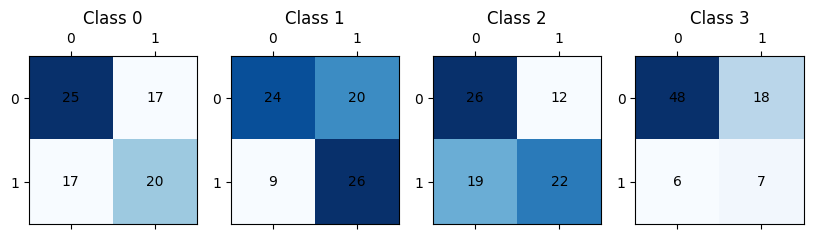

The MultiOutputClassifier(estimator=GaussianNB())  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=GaussianNB())  Accuracy  is 0.16455696202531644 presition, reccall, f1 = (array([0.54054054, 0.56521739, 0.64705882, 0.25      ]), array([0.54054054, 0.74285714, 0.53658537, 0.46153846]), array([0.54054054, 0.64197531, 0.58666667, 0.32432432]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.54      0.54        37
           1       0.57      0.74      0.64        35
           2       0.65      0.54      0.59        41
           3       0.25      0.46      0.32        13

   micro avg       0.52      0.59      0.55       126
   macro avg       0.50      0.57      0.52       126
weighted avg       0.55      0.59      0.56       126
 samples avg       0.53      0.59      0.52       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


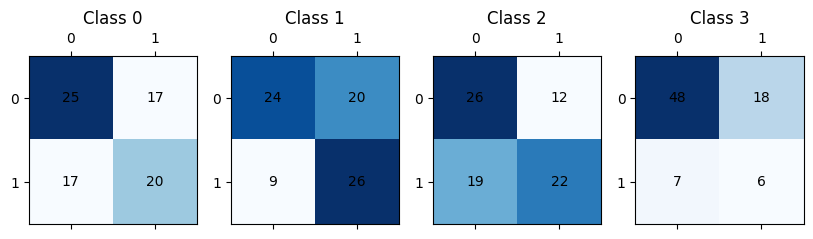

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.58974359, 0.84      , 0.62790698, 0.69230769]), array([0.62162162, 0.6       , 0.65853659, 0.69230769]), array([0.60526316, 0.7       , 0.64285714, 0.69230769]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.62      0.61        37
           1       0.84      0.60      0.70        35
           2       0.63      0.66      0.64        41
           3       0.69      0.69      0.69        13

   micro avg       0.67      0.63      0.65       126
   macro avg       0.69      0.64      0.66       126
weighted avg       0.68      0.63      0.65       126
 samples avg       0.66      0.65      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


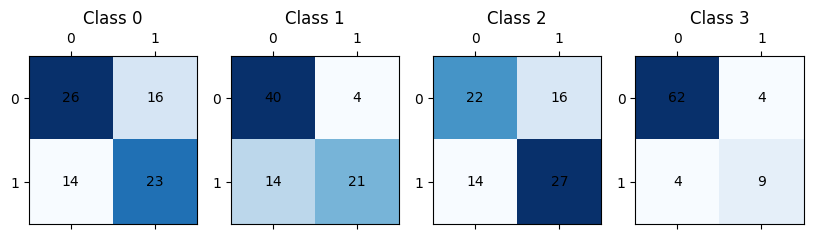

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.61538462, 0.81818182, 0.64444444, 0.75      ]), array([0.64864865, 0.51428571, 0.70731707, 0.69230769]), array([0.63157895, 0.63157895, 0.6744186 , 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.65      0.63        37
           1       0.82      0.51      0.63        35
           2       0.64      0.71      0.67        41
           3       0.75      0.69      0.72        13

   micro avg       0.68      0.63      0.66       126
   macro avg       0.71      0.64      0.66       126
weighted avg       0.70      0.63      0.65       126
 samples avg       0.66      0.66      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


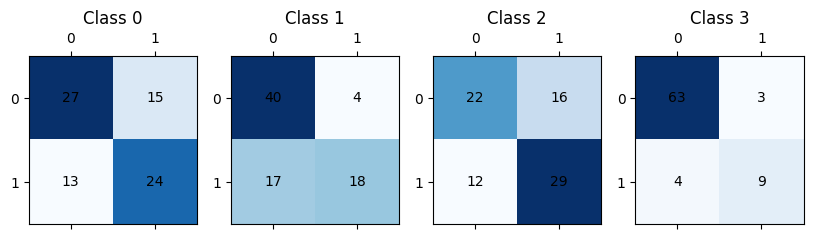

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.48484848, 0.83333333, 0.59574468, 0.        ]), array([0.43243243, 0.57142857, 0.68292683, 0.        ]), array([0.45714286, 0.6779661 , 0.63636364, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.48      0.43      0.46        37
           1       0.83      0.57      0.68        35
           2       0.60      0.68      0.64        41
           3       0.00      0.00      0.00        13

   micro avg       0.62      0.51      0.56       126
   macro avg       0.48      0.42      0.44       126
weighted avg       0.57      0.51      0.53       126
 samples avg       0.55      0.49      0.49       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


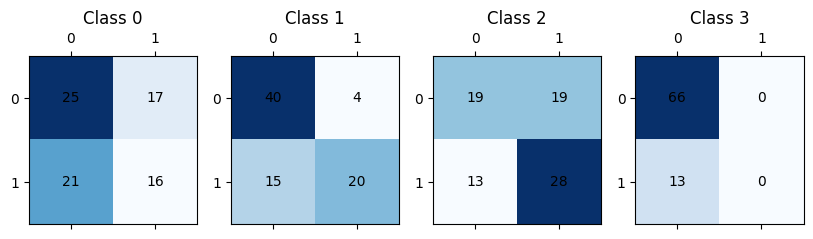

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.24050632911392406 presition, reccall, f1 = (array([0.55882353, 0.82608696, 0.56818182, 0.2       ]), array([0.51351351, 0.54285714, 0.6097561 , 0.07692308]), array([0.53521127, 0.65517241, 0.58823529, 0.11111111]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.56      0.51      0.54        37
           1       0.83      0.54      0.66        35
           2       0.57      0.61      0.59        41
           3       0.20      0.08      0.11        13

   micro avg       0.60      0.51      0.55       126
   macro avg       0.54      0.44      0.47       126
weighted avg       0.60      0.51      0.54       126
 samples avg       0.54      0.51      0.49       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


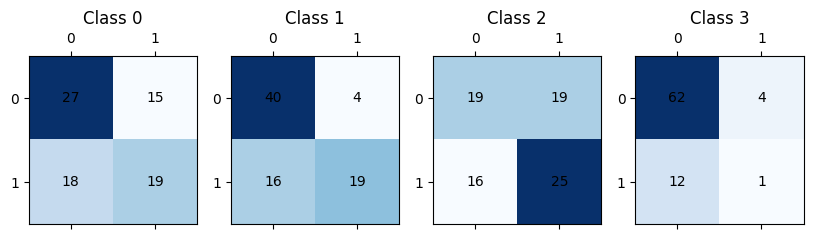

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  5 embedding name: glove basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.20253164556962025 presition, reccall, f1 = (array([0.58139535, 0.81818182, 0.64285714, 0.5       ]), array([0.67567568, 0.51428571, 0.87804878, 0.07692308]), array([0.625     , 0.63157895, 0.74226804, 0.13333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.58      0.68      0.63        37
           1       0.82      0.51      0.63        35
           2       0.64      0.88      0.74        41
           3       0.50      0.08      0.13        13

   micro avg       0.65      0.63      0.64       126
   macro avg       0.64      0.54      0.53       126
weighted avg       0.66      0.63      0.61       126
 samples avg       0.60      0.67      0.59       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


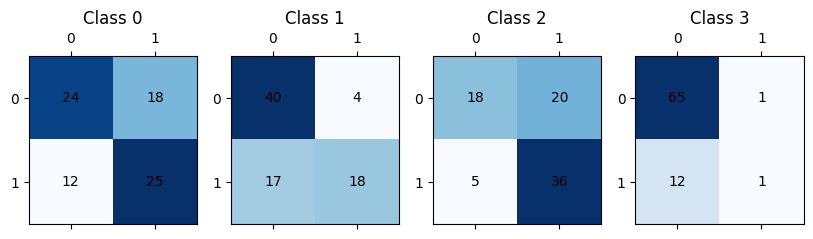

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.65853659, 0.81818182, 0.63793103, 0.88888889]), array([0.72972973, 0.51428571, 0.90243902, 0.61538462]), array([0.69230769, 0.63157895, 0.74747475, 0.72727273]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.66      0.73      0.69        37
           1       0.82      0.51      0.63        35
           2       0.64      0.90      0.75        41
           3       0.89      0.62      0.73        13

   micro avg       0.69      0.71      0.70       126
   macro avg       0.75      0.69      0.70       126
weighted avg       0.72      0.71      0.70       126
 samples avg       0.69      0.76      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


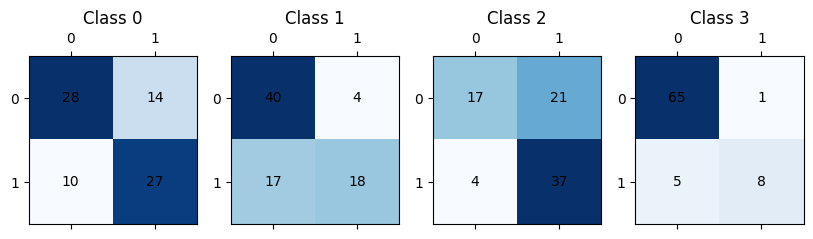

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  7 embedding name: use
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.64444444, 0.81481481, 0.74418605, 0.5625    ]), array([0.78378378, 0.62857143, 0.7804878 , 0.69230769]), array([0.70731707, 0.70967742, 0.76190476, 0.62068966]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.78      0.71        37
           1       0.81      0.63      0.71        35
           2       0.74      0.78      0.76        41
           3       0.56      0.69      0.62        13

   micro avg       0.70      0.73      0.72       126
   macro avg       0.69      0.72      0.70       126
weighted avg       0.72      0.73      0.72       126
 samples avg       0.68      0.76      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


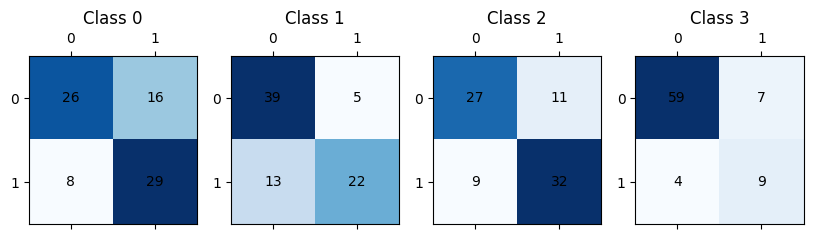

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.66666667, 0.81481481, 0.74418605, 0.625     ]), array([0.81081081, 0.62857143, 0.7804878 , 0.76923077]), array([0.73170732, 0.70967742, 0.76190476, 0.68965517]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73        37
           1       0.81      0.63      0.71        35
           2       0.74      0.78      0.76        41
           3       0.62      0.77      0.69        13

   micro avg       0.72      0.75      0.73       126
   macro avg       0.71      0.75      0.72       126
weighted avg       0.73      0.75      0.73       126
 samples avg       0.70      0.78      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


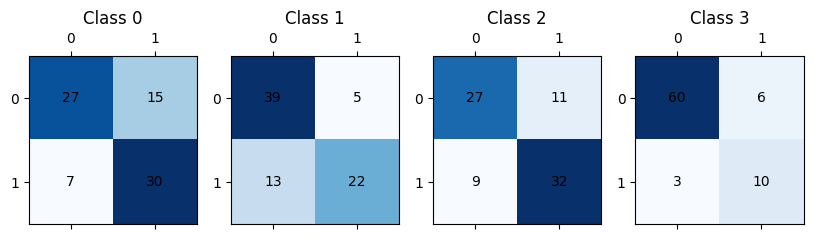

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.65217391, 0.81481481, 0.75609756, 0.625     ]), array([0.81081081, 0.62857143, 0.75609756, 0.76923077]), array([0.72289157, 0.70967742, 0.75609756, 0.68965517]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.81      0.72        37
           1       0.81      0.63      0.71        35
           2       0.76      0.76      0.76        41
           3       0.62      0.77      0.69        13

   micro avg       0.72      0.74      0.73       126
   macro avg       0.71      0.74      0.72       126
weighted avg       0.73      0.74      0.73       126
 samples avg       0.68      0.78      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


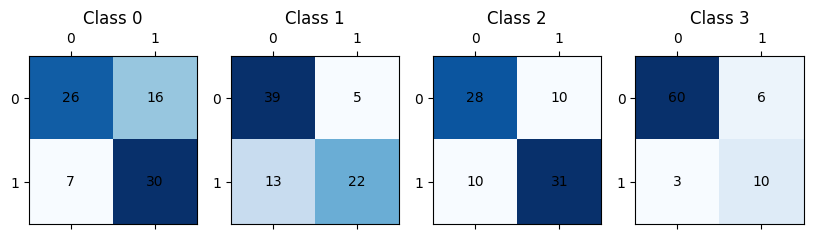

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.63414634, 0.75      , 0.88235294, 0.69230769]), array([0.7027027 , 0.68571429, 0.73170732, 0.69230769]), array([0.66666667, 0.71641791, 0.8       , 0.69230769]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.70      0.67        37
           1       0.75      0.69      0.72        35
           2       0.88      0.73      0.80        41
           3       0.69      0.69      0.69        13

   micro avg       0.74      0.71      0.72       126
   macro avg       0.74      0.70      0.72       126
weighted avg       0.75      0.71      0.73       126
 samples avg       0.72      0.74      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


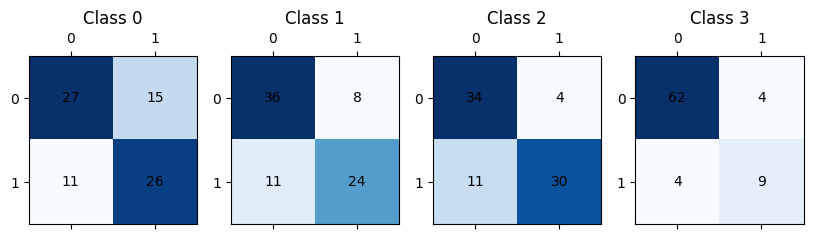

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.46835443037974683 presition, reccall, f1 = (array([0.63414634, 0.80645161, 0.88235294, 0.69230769]), array([0.7027027 , 0.71428571, 0.73170732, 0.69230769]), array([0.66666667, 0.75757576, 0.8       , 0.69230769]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.70      0.67        37
           1       0.81      0.71      0.76        35
           2       0.88      0.73      0.80        41
           3       0.69      0.69      0.69        13

   micro avg       0.76      0.71      0.73       126
   macro avg       0.75      0.71      0.73       126
weighted avg       0.77      0.71      0.74       126
 samples avg       0.73      0.74      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


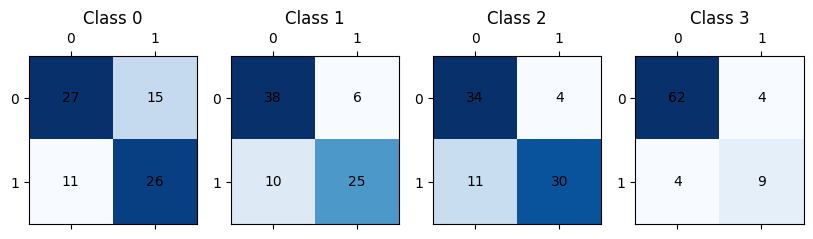

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.64285714, 0.8       , 0.88235294, 0.83333333]), array([0.72972973, 0.68571429, 0.73170732, 0.76923077]), array([0.6835443 , 0.73846154, 0.8       , 0.8       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.73      0.68        37
           1       0.80      0.69      0.74        35
           2       0.88      0.73      0.80        41
           3       0.83      0.77      0.80        13

   micro avg       0.77      0.72      0.75       126
   macro avg       0.79      0.73      0.76       126
weighted avg       0.78      0.72      0.75       126
 samples avg       0.73      0.75      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


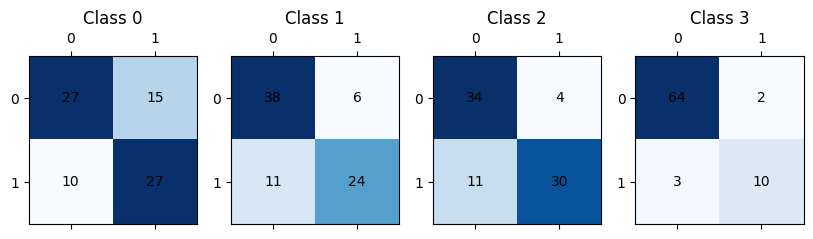

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.26582278481012656 presition, reccall, f1 = (array([0.575     , 0.73076923, 0.675     , 0.3       ]), array([0.62162162, 0.54285714, 0.65853659, 0.23076923]), array([0.5974026 , 0.62295082, 0.66666667, 0.26086957]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.62      0.60        37
           1       0.73      0.54      0.62        35
           2       0.68      0.66      0.67        41
           3       0.30      0.23      0.26        13

   micro avg       0.62      0.57      0.60       126
   macro avg       0.57      0.51      0.54       126
weighted avg       0.62      0.57      0.59       126
 samples avg       0.56      0.60      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


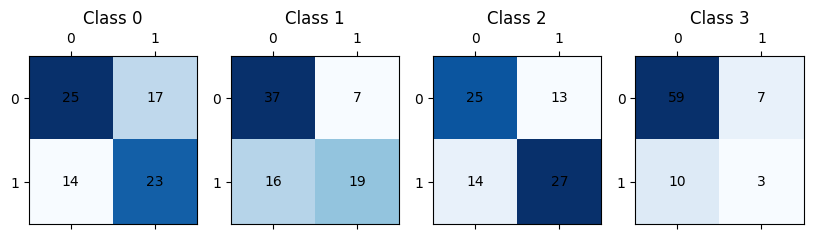

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.70454545, 0.73076923, 0.675     , 0.66666667]), array([0.83783784, 0.54285714, 0.65853659, 0.46153846]), array([0.7654321 , 0.62295082, 0.66666667, 0.54545455]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.84      0.77        37
           1       0.73      0.54      0.62        35
           2       0.68      0.66      0.67        41
           3       0.67      0.46      0.55        13

   micro avg       0.70      0.66      0.68       126
   macro avg       0.69      0.63      0.65       126
weighted avg       0.70      0.66      0.67       126
 samples avg       0.66      0.70      0.64       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


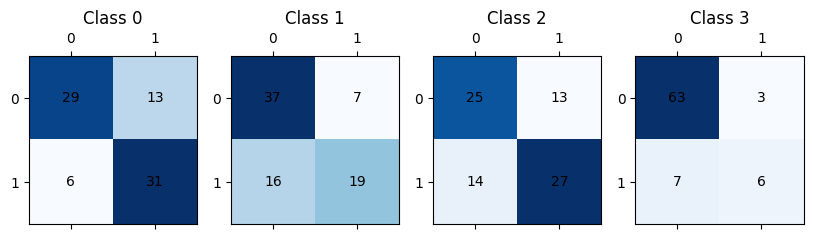

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.70454545, 0.71428571, 0.71794872, 0.71428571]), array([0.83783784, 0.57142857, 0.68292683, 0.38461538]), array([0.7654321 , 0.63492063, 0.7       , 0.5       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.84      0.77        37
           1       0.71      0.57      0.63        35
           2       0.72      0.68      0.70        41
           3       0.71      0.38      0.50        13

   micro avg       0.71      0.67      0.69       126
   macro avg       0.71      0.62      0.65       126
weighted avg       0.71      0.67      0.68       126
 samples avg       0.68      0.70      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


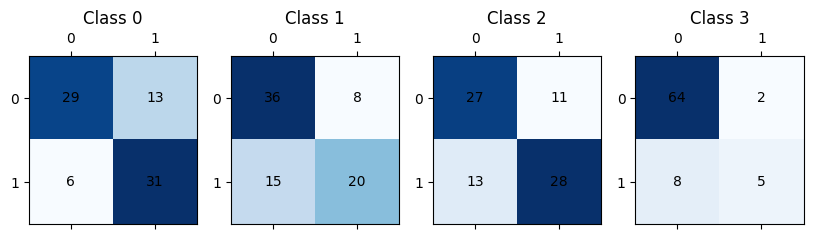

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.66666667, 0.77777778, 0.65853659, 0.5       ]), array([0.7027027 , 0.6       , 0.65853659, 0.23076923]), array([0.68421053, 0.67741935, 0.65853659, 0.31578947]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.70      0.68        37
           1       0.78      0.60      0.68        35
           2       0.66      0.66      0.66        41
           3       0.50      0.23      0.32        13

   micro avg       0.68      0.61      0.64       126
   macro avg       0.65      0.55      0.58       126
weighted avg       0.68      0.61      0.64       126
 samples avg       0.61      0.59      0.57       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


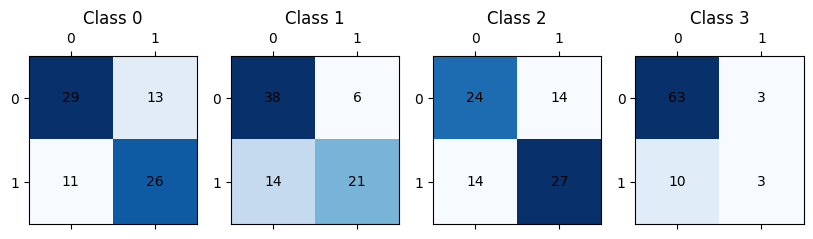

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.64444444, 0.75      , 0.6744186 , 0.66666667]), array([0.78378378, 0.6       , 0.70731707, 0.15384615]), array([0.70731707, 0.66666667, 0.69047619, 0.25      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.78      0.71        37
           1       0.75      0.60      0.67        35
           2       0.67      0.71      0.69        41
           3       0.67      0.15      0.25        13

   micro avg       0.68      0.64      0.66       126
   macro avg       0.68      0.56      0.58       126
weighted avg       0.69      0.64      0.64       126
 samples avg       0.62      0.64      0.59       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


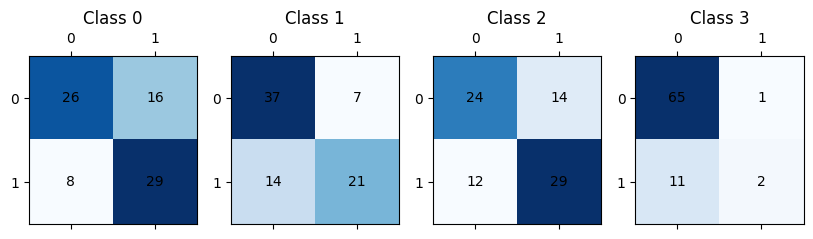

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.3037974683544304 presition, reccall, f1 = (array([0.6744186 , 0.81481481, 0.61904762, 0.75      ]), array([0.78378378, 0.62857143, 0.63414634, 0.46153846]), array([0.725     , 0.70967742, 0.62650602, 0.57142857]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.78      0.72        37
           1       0.81      0.63      0.71        35
           2       0.62      0.63      0.63        41
           3       0.75      0.46      0.57        13

   micro avg       0.69      0.66      0.67       126
   macro avg       0.71      0.63      0.66       126
weighted avg       0.70      0.66      0.67       126
 samples avg       0.63      0.65      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


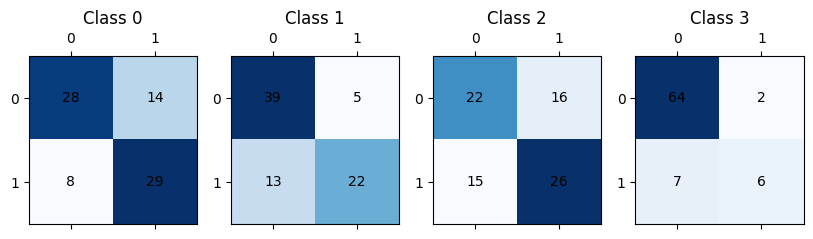

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.65217391, 0.74285714, 0.72093023, 0.63636364]), array([0.81081081, 0.74285714, 0.75609756, 0.53846154]), array([0.72289157, 0.74285714, 0.73809524, 0.58333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.81      0.72        37
           1       0.74      0.74      0.74        35
           2       0.72      0.76      0.74        41
           3       0.64      0.54      0.58        13

   micro avg       0.70      0.75      0.72       126
   macro avg       0.69      0.71      0.70       126
weighted avg       0.70      0.75      0.72       126
 samples avg       0.68      0.77      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


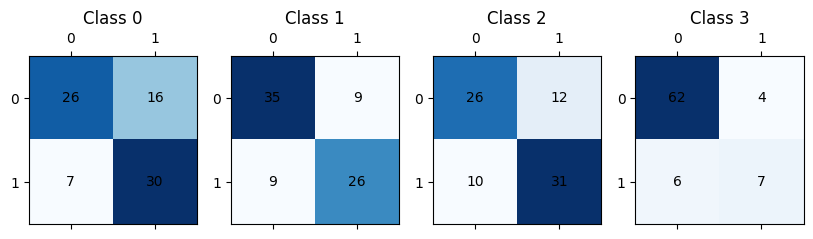

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.68181818, 0.74285714, 0.72093023, 0.63636364]), array([0.81081081, 0.74285714, 0.75609756, 0.53846154]), array([0.74074074, 0.74285714, 0.73809524, 0.58333333]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.81      0.74        37
           1       0.74      0.74      0.74        35
           2       0.72      0.76      0.74        41
           3       0.64      0.54      0.58        13

   micro avg       0.71      0.75      0.73       126
   macro avg       0.70      0.71      0.70       126
weighted avg       0.71      0.75      0.72       126
 samples avg       0.70      0.77      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


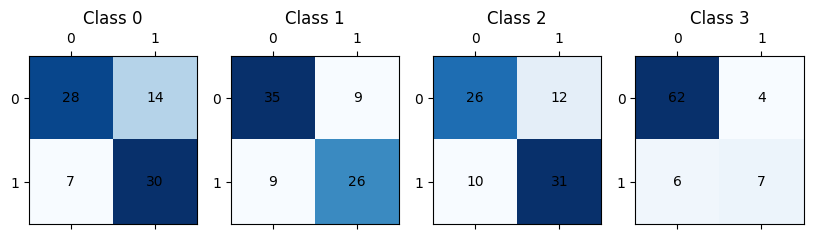

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.66666667, 0.74285714, 0.72093023, 0.61538462]), array([0.81081081, 0.74285714, 0.75609756, 0.61538462]), array([0.73170732, 0.74285714, 0.73809524, 0.61538462]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73        37
           1       0.74      0.74      0.74        35
           2       0.72      0.76      0.74        41
           3       0.62      0.62      0.62        13

   micro avg       0.70      0.75      0.73       126
   macro avg       0.69      0.73      0.71       126
weighted avg       0.70      0.75      0.72       126
 samples avg       0.70      0.78      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


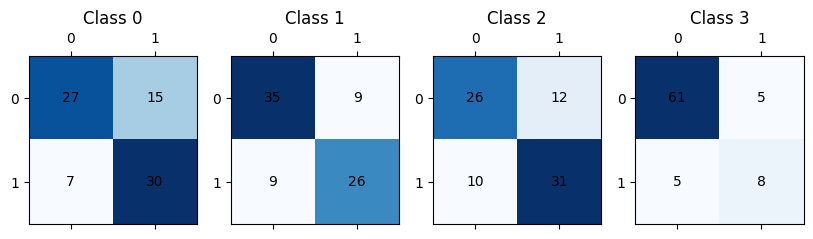

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.3037974683544304 presition, reccall, f1 = (array([0.57777778, 0.75      , 0.66666667, 1.        ]), array([0.7027027 , 0.6       , 0.68292683, 0.15384615]), array([0.63414634, 0.66666667, 0.6746988 , 0.26666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.58      0.70      0.63        37
           1       0.75      0.60      0.67        35
           2       0.67      0.68      0.67        41
           3       1.00      0.15      0.27        13

   micro avg       0.66      0.61      0.63       126
   macro avg       0.75      0.53      0.56       126
weighted avg       0.70      0.61      0.62       126
 samples avg       0.60      0.62      0.58       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


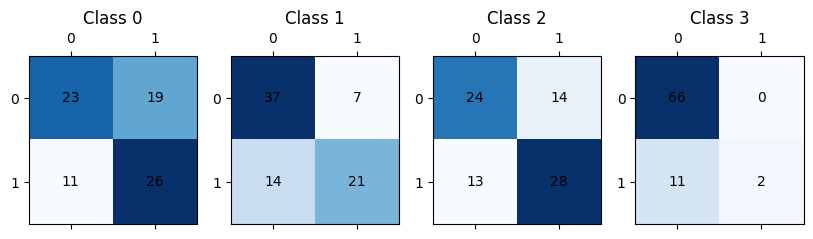

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.63043478, 0.76      , 0.66666667, 1.        ]), array([0.78378378, 0.54285714, 0.68292683, 0.38461538]), array([0.69879518, 0.63333333, 0.6746988 , 0.55555556]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.78      0.70        37
           1       0.76      0.54      0.63        35
           2       0.67      0.68      0.67        41
           3       1.00      0.38      0.56        13

   micro avg       0.69      0.64      0.66       126
   macro avg       0.76      0.60      0.64       126
weighted avg       0.72      0.64      0.66       126
 samples avg       0.66      0.67      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


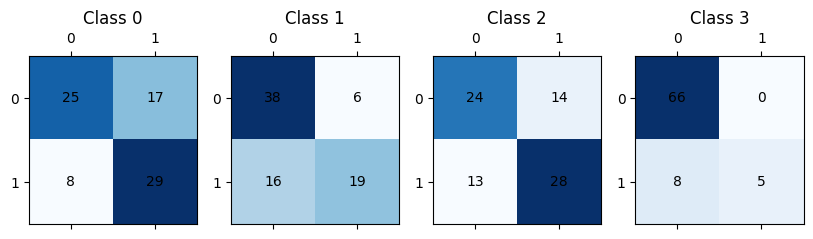

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.57142857, 0.75      , 0.66666667, 0.72727273]), array([0.75675676, 0.6       , 0.68292683, 0.61538462]), array([0.65116279, 0.66666667, 0.6746988 , 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.76      0.65        37
           1       0.75      0.60      0.67        35
           2       0.67      0.68      0.67        41
           3       0.73      0.62      0.67        13

   micro avg       0.65      0.67      0.66       126
   macro avg       0.68      0.66      0.66       126
weighted avg       0.67      0.67      0.66       126
 samples avg       0.62      0.70      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


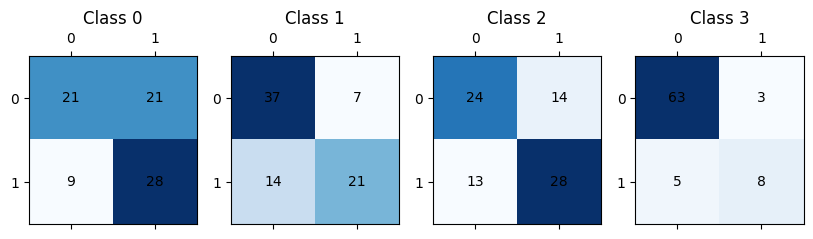

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.66666667, 0.82758621, 0.86842105, 0.75      ]), array([0.7027027 , 0.68571429, 0.80487805, 0.69230769]), array([0.68421053, 0.75      , 0.83544304, 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.70      0.68        37
           1       0.83      0.69      0.75        35
           2       0.87      0.80      0.84        41
           3       0.75      0.69      0.72        13

   micro avg       0.78      0.73      0.75       126
   macro avg       0.78      0.72      0.75       126
weighted avg       0.79      0.73      0.76       126
 samples avg       0.77      0.76      0.73       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


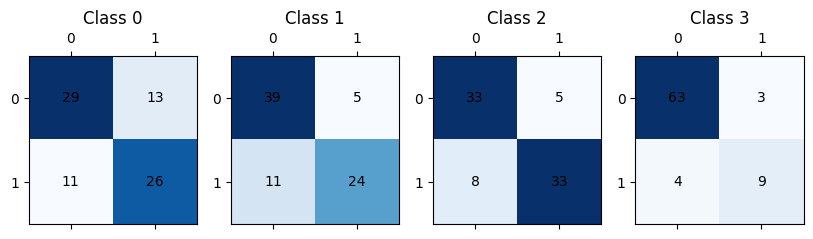

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.7027027 , 0.83333333, 0.86842105, 0.75      ]), array([0.7027027 , 0.71428571, 0.80487805, 0.69230769]), array([0.7027027 , 0.76923077, 0.83544304, 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.70      0.70        37
           1       0.83      0.71      0.77        35
           2       0.87      0.80      0.84        41
           3       0.75      0.69      0.72        13

   micro avg       0.79      0.74      0.77       126
   macro avg       0.79      0.73      0.76       126
weighted avg       0.80      0.74      0.77       126
 samples avg       0.79      0.77      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


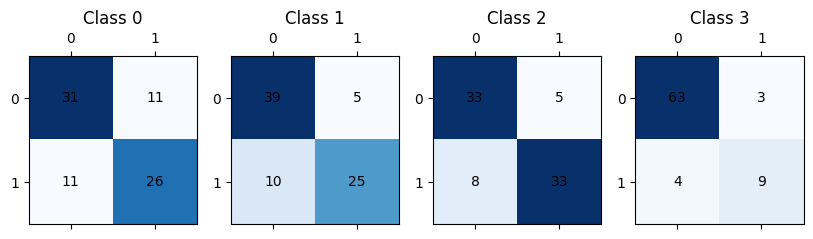

The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=HistGradientBoostingClassifier())  Accuracy  is 0.5063291139240507 presition, reccall, f1 = (array([0.7       , 0.82758621, 0.86842105, 0.91666667]), array([0.75675676, 0.68571429, 0.80487805, 0.84615385]), array([0.72727273, 0.75      , 0.83544304, 0.88      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.83      0.69      0.75        35
           2       0.87      0.80      0.84        41
           3       0.92      0.85      0.88        13

   micro avg       0.81      0.76      0.78       126
   macro avg       0.83      0.77      0.80       126
weighted avg       0.81      0.76      0.78       126
 samples avg       0.82      0.80    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


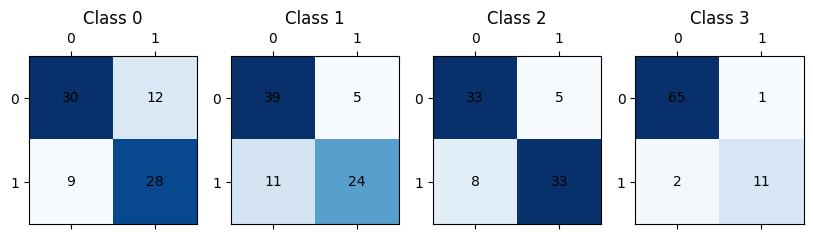

The MultiOutputClassifier(estimator=RandomForestClassifier())  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.75862069, 0.96      , 0.6875    , 1.        ]), array([0.59459459, 0.68571429, 0.80487805, 0.46153846]), array([0.66666667, 0.8       , 0.74157303, 0.63157895]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.76      0.59      0.67        37
           1       0.96      0.69      0.80        35
           2       0.69      0.80      0.74        41
           3       1.00      0.46      0.63        13

   micro avg       0.79      0.67      0.73       126
   macro avg       0.85      0.64      0.71       126
weighted avg       0.82      0.67      0.72       126
 samples avg       0.73      0.69      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


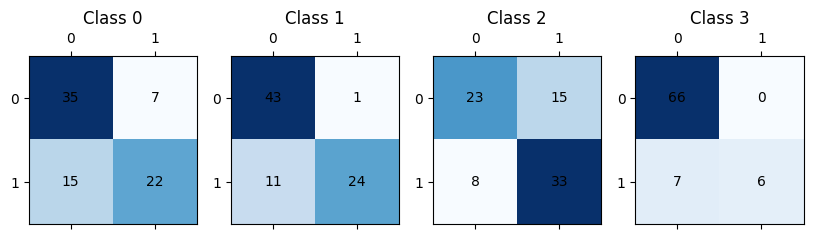

The MultiOutputClassifier(estimator=RandomForestClassifier())  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.65625   , 0.91666667, 0.68181818, 1.        ]), array([0.56756757, 0.62857143, 0.73170732, 0.30769231]), array([0.60869565, 0.74576271, 0.70588235, 0.47058824]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.66      0.57      0.61        37
           1       0.92      0.63      0.75        35
           2       0.68      0.73      0.71        41
           3       1.00      0.31      0.47        13

   micro avg       0.74      0.61      0.67       126
   macro avg       0.81      0.56      0.63       126
weighted avg       0.77      0.61      0.66       126
 samples avg       0.65      0.63      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


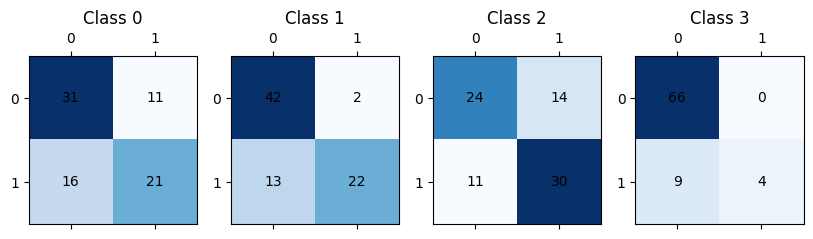

The MultiOutputClassifier(estimator=RandomForestClassifier())  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.875     , 0.9047619 , 0.65957447, 0.75      ]), array([0.56756757, 0.54285714, 0.75609756, 0.23076923]), array([0.68852459, 0.67857143, 0.70454545, 0.35294118]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.88      0.57      0.69        37
           1       0.90      0.54      0.68        35
           2       0.66      0.76      0.70        41
           3       0.75      0.23      0.35        13

   micro avg       0.77      0.59      0.67       126
   macro avg       0.80      0.52      0.61       126
weighted avg       0.80      0.59      0.66       126
 samples avg       0.64      0.60      0.60       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


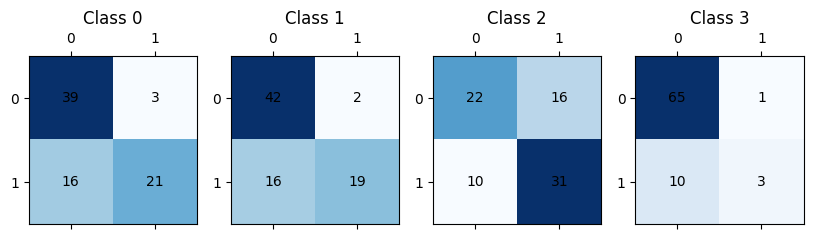

The MultiOutputClassifier(estimator=RandomForestClassifier())  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.69565217, 0.91666667, 0.6       , 0.66666667]), array([0.43243243, 0.62857143, 0.73170732, 0.15384615]), array([0.53333333, 0.74576271, 0.65934066, 0.25      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.43      0.53        37
           1       0.92      0.63      0.75        35
           2       0.60      0.73      0.66        41
           3       0.67      0.15      0.25        13

   micro avg       0.70      0.56      0.62       126
   macro avg       0.72      0.49      0.55       126
weighted avg       0.72      0.56      0.60       126
 samples avg       0.59      0.57      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


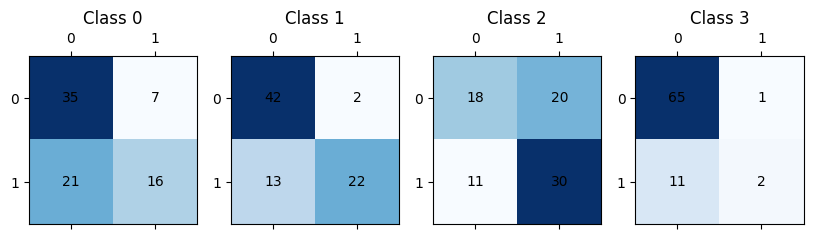

The MultiOutputClassifier(estimator=RandomForestClassifier())  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.68965517, 0.91304348, 0.66666667, 0.        ]), array([0.54054054, 0.6       , 0.73170732, 0.        ]), array([0.60606061, 0.72413793, 0.69767442, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.54      0.61        37
           1       0.91      0.60      0.72        35
           2       0.67      0.73      0.70        41
           3       0.00      0.00      0.00        13

   micro avg       0.72      0.56      0.63       126
   macro avg       0.57      0.47      0.51       126
weighted avg       0.67      0.56      0.61       126
 samples avg       0.62      0.56      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


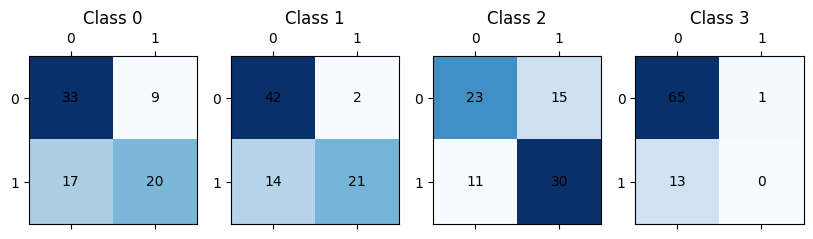

The MultiOutputClassifier(estimator=RandomForestClassifier())  5 embedding name: glove basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.26582278481012656 presition, reccall, f1 = (array([0.625     , 0.88235294, 0.62068966, 0.        ]), array([0.67567568, 0.42857143, 0.87804878, 0.        ]), array([0.64935065, 0.57692308, 0.72727273, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.68      0.65        37
           1       0.88      0.43      0.58        35
           2       0.62      0.88      0.73        41
           3       0.00      0.00      0.00        13

   micro avg       0.66      0.60      0.63       126
   macro avg       0.53      0.50      0.49       126
weighted avg       0.63      0.60      0.59       126
 samples avg       0.58      0.59      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


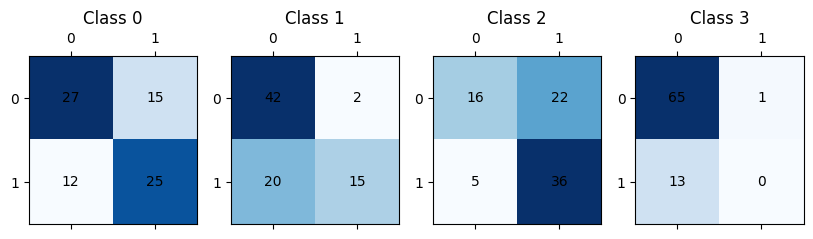

The MultiOutputClassifier(estimator=RandomForestClassifier())  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.67567568, 0.94444444, 0.60784314, 0.        ]), array([0.67567568, 0.48571429, 0.75609756, 0.        ]), array([0.67567568, 0.64150943, 0.67391304, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.68      0.68        37
           1       0.94      0.49      0.64        35
           2       0.61      0.76      0.67        41
           3       0.00      0.00      0.00        13

   micro avg       0.69      0.58      0.63       126
   macro avg       0.56      0.48      0.50       126
weighted avg       0.66      0.58      0.60       126
 samples avg       0.57      0.57      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


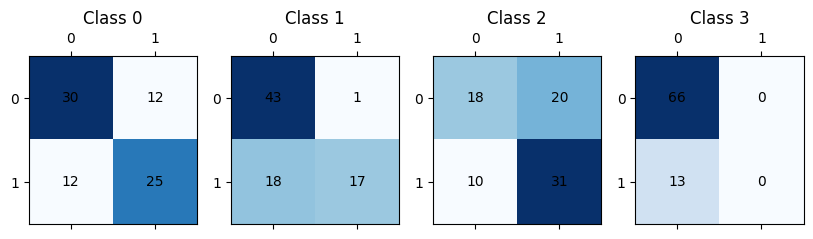

The MultiOutputClassifier(estimator=RandomForestClassifier())  7 embedding name: use
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.6       , 0.85185185, 0.70454545, 1.        ]), array([0.64864865, 0.65714286, 0.75609756, 0.23076923]), array([0.62337662, 0.74193548, 0.72941176, 0.375     ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.65      0.62        37
           1       0.85      0.66      0.74        35
           2       0.70      0.76      0.73        41
           3       1.00      0.23      0.38        13

   micro avg       0.71      0.64      0.67       126
   macro avg       0.79      0.57      0.62       126
weighted avg       0.75      0.64      0.67       126
 samples avg       0.62      0.63      0.60       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


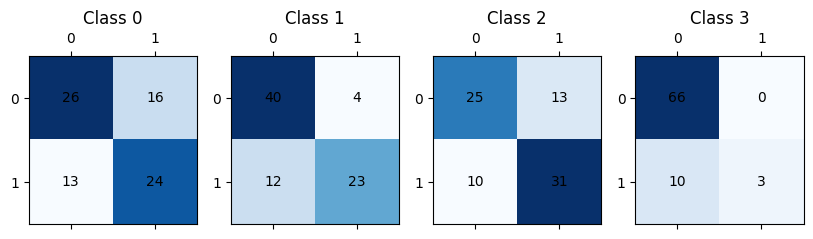

The MultiOutputClassifier(estimator=RandomForestClassifier())  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.55813953, 0.85714286, 0.68888889, 1.        ]), array([0.64864865, 0.68571429, 0.75609756, 0.30769231]), array([0.6       , 0.76190476, 0.72093023, 0.47058824]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.56      0.65      0.60        37
           1       0.86      0.69      0.76        35
           2       0.69      0.76      0.72        41
           3       1.00      0.31      0.47        13

   micro avg       0.69      0.66      0.67       126
   macro avg       0.78      0.60      0.64       126
weighted avg       0.73      0.66      0.67       126
 samples avg       0.63      0.68      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


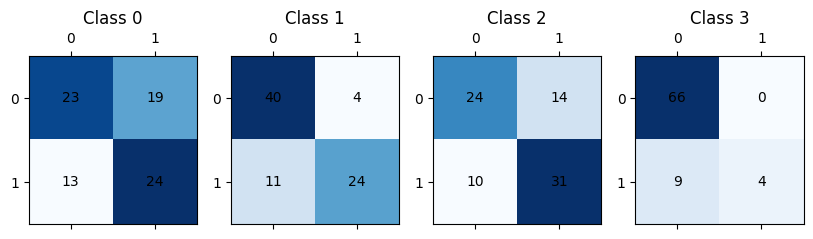

The MultiOutputClassifier(estimator=RandomForestClassifier())  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.7       , 0.82608696, 0.69565217, 1.        ]), array([0.75675676, 0.54285714, 0.7804878 , 0.23076923]), array([0.72727273, 0.65517241, 0.73563218, 0.375     ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.83      0.54      0.66        35
           2       0.70      0.78      0.74        41
           3       1.00      0.23      0.38        13

   micro avg       0.73      0.65      0.69       126
   macro avg       0.81      0.58      0.62       126
weighted avg       0.76      0.65      0.67       126
 samples avg       0.68      0.66      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


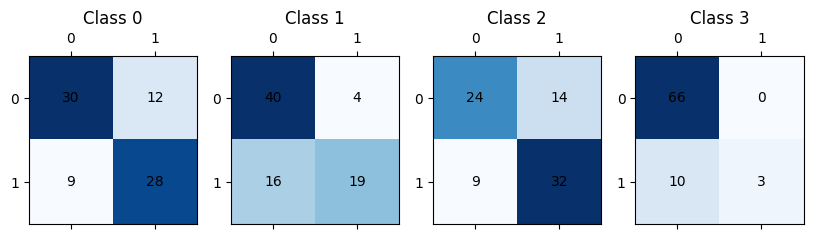

The MultiOutputClassifier(estimator=RandomForestClassifier())  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.73529412, 0.79310345, 0.775     , 0.875     ]), array([0.67567568, 0.65714286, 0.75609756, 0.53846154]), array([0.70422535, 0.71875   , 0.7654321 , 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.74      0.68      0.70        37
           1       0.79      0.66      0.72        35
           2       0.78      0.76      0.77        41
           3       0.88      0.54      0.67        13

   micro avg       0.77      0.68      0.73       126
   macro avg       0.79      0.66      0.71       126
weighted avg       0.78      0.68      0.72       126
 samples avg       0.74      0.72      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


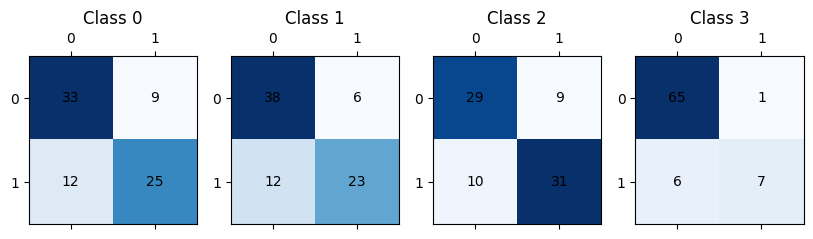

The MultiOutputClassifier(estimator=RandomForestClassifier())  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.68421053, 0.81481481, 0.79069767, 0.85714286]), array([0.7027027 , 0.62857143, 0.82926829, 0.46153846]), array([0.69333333, 0.70967742, 0.80952381, 0.6       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.70      0.69        37
           1       0.81      0.63      0.71        35
           2       0.79      0.83      0.81        41
           3       0.86      0.46      0.60        13

   micro avg       0.77      0.70      0.73       126
   macro avg       0.79      0.66      0.70       126
weighted avg       0.77      0.70      0.73       126
 samples avg       0.70      0.73      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


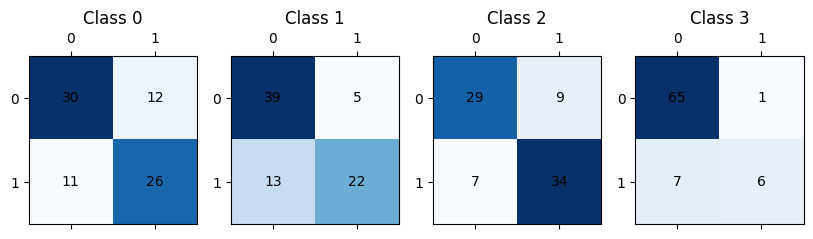

The MultiOutputClassifier(estimator=RandomForestClassifier())  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.45569620253164556 presition, reccall, f1 = (array([0.69230769, 0.77777778, 0.75      , 0.88888889]), array([0.72972973, 0.6       , 0.80487805, 0.61538462]), array([0.71052632, 0.67741935, 0.77647059, 0.72727273]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.73      0.71        37
           1       0.78      0.60      0.68        35
           2       0.75      0.80      0.78        41
           3       0.89      0.62      0.73        13

   micro avg       0.75      0.71      0.73       126
   macro avg       0.78      0.69      0.72       126
weighted avg       0.76      0.71      0.72       126
 samples avg       0.75      0.74      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


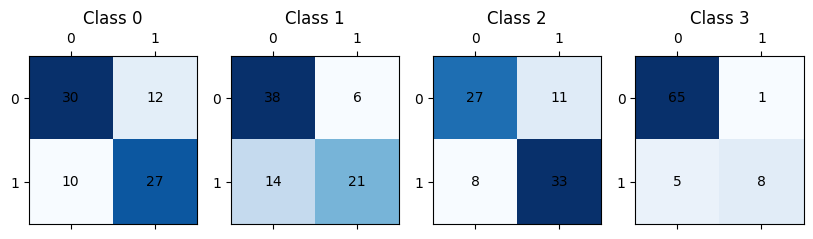

The MultiOutputClassifier(estimator=RandomForestClassifier())  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.69444444, 0.78571429, 0.6744186 , 0.        ]), array([0.67567568, 0.62857143, 0.70731707, 0.        ]), array([0.68493151, 0.6984127 , 0.69047619, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.69      0.68      0.68        37
           1       0.79      0.63      0.70        35
           2       0.67      0.71      0.69        41
           3       0.00      0.00      0.00        13

   micro avg       0.71      0.60      0.65       126
   macro avg       0.54      0.50      0.52       126
weighted avg       0.64      0.60      0.62       126
 samples avg       0.58      0.58      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


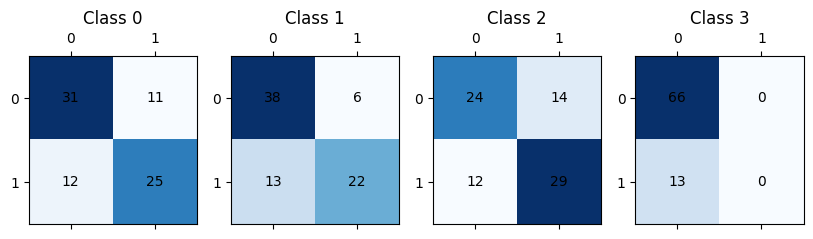

The MultiOutputClassifier(estimator=RandomForestClassifier())  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.7       , 0.83333333, 0.65384615, 0.        ]), array([0.75675676, 0.57142857, 0.82926829, 0.        ]), array([0.72727273, 0.6779661 , 0.7311828 , 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.83      0.57      0.68        35
           2       0.65      0.83      0.73        41
           3       0.00      0.00      0.00        13

   micro avg       0.71      0.65      0.68       126
   macro avg       0.55      0.54      0.53       126
weighted avg       0.65      0.65      0.64       126
 samples avg       0.63      0.64      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


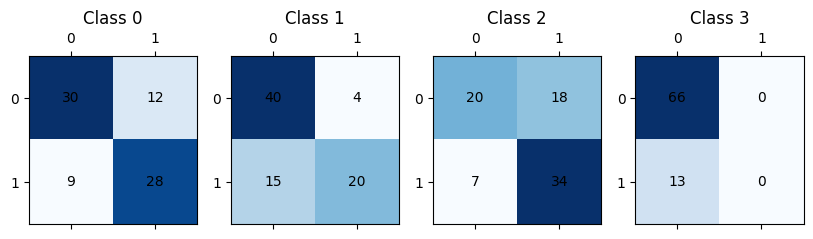

The MultiOutputClassifier(estimator=RandomForestClassifier())  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.575     , 0.86956522, 0.67391304, 0.        ]), array([0.62162162, 0.57142857, 0.75609756, 0.        ]), array([0.5974026 , 0.68965517, 0.71264368, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.62      0.60        37
           1       0.87      0.57      0.69        35
           2       0.67      0.76      0.71        41
           3       0.00      0.00      0.00        13

   micro avg       0.68      0.59      0.63       126
   macro avg       0.53      0.49      0.50       126
weighted avg       0.63      0.59      0.60       126
 samples avg       0.59      0.59      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


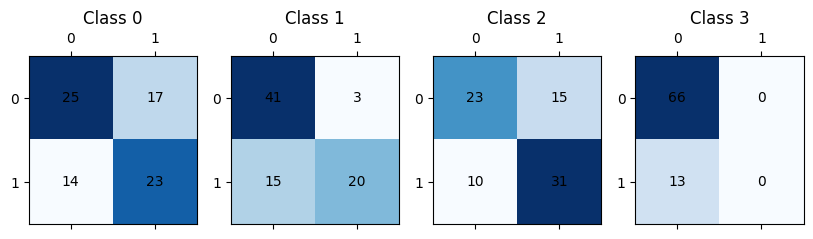

The MultiOutputClassifier(estimator=RandomForestClassifier())  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.31645569620253167 presition, reccall, f1 = (array([0.63888889, 0.85714286, 0.61538462, 0.        ]), array([0.62162162, 0.68571429, 0.7804878 , 0.        ]), array([0.63013699, 0.76190476, 0.68817204, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.62      0.63        37
           1       0.86      0.69      0.76        35
           2       0.62      0.78      0.69        41
           3       0.00      0.00      0.00        13

   micro avg       0.68      0.63      0.65       126
   macro avg       0.53      0.52      0.52       126
weighted avg       0.63      0.63      0.62       126
 samples avg       0.64      0.63      0.61       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


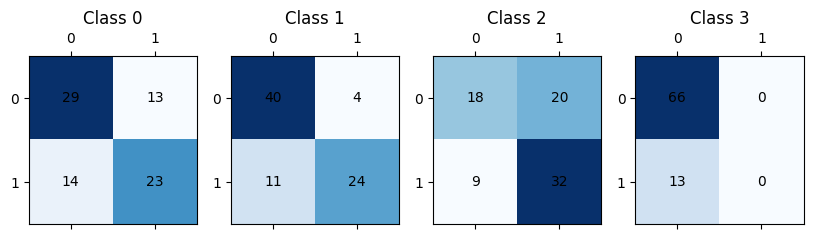

The MultiOutputClassifier(estimator=RandomForestClassifier())  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3291139240506329 presition, reccall, f1 = (array([0.65      , 0.875     , 0.63636364, 0.        ]), array([0.7027027 , 0.6       , 0.68292683, 0.        ]), array([0.67532468, 0.71186441, 0.65882353, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.70      0.68        37
           1       0.88      0.60      0.71        35
           2       0.64      0.68      0.66        41
           3       0.00      0.00      0.00        13

   micro avg       0.69      0.60      0.64       126
   macro avg       0.54      0.50      0.51       126
weighted avg       0.64      0.60      0.61       126
 samples avg       0.59      0.60      0.57       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


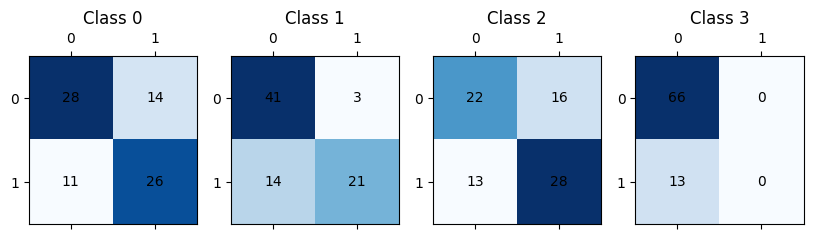

The MultiOutputClassifier(estimator=RandomForestClassifier())  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.70731707, 0.90909091, 0.64      , 0.        ]), array([0.78378378, 0.57142857, 0.7804878 , 0.        ]), array([0.74358974, 0.70175439, 0.7032967 , 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.71      0.78      0.74        37
           1       0.91      0.57      0.70        35
           2       0.64      0.78      0.70        41
           3       0.00      0.00      0.00        13

   micro avg       0.72      0.64      0.68       126
   macro avg       0.56      0.53      0.54       126
weighted avg       0.67      0.64      0.64       126
 samples avg       0.70      0.65      0.65       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


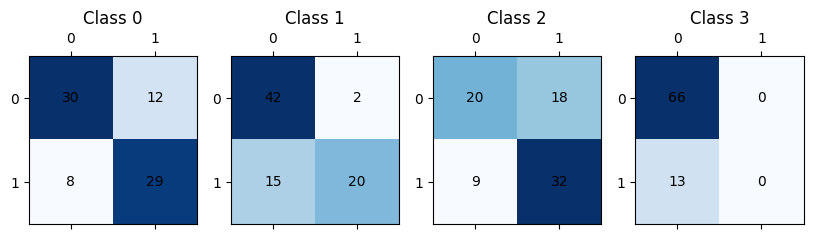

The MultiOutputClassifier(estimator=RandomForestClassifier())  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.68292683, 0.82142857, 0.75555556, 0.8       ]), array([0.75675676, 0.65714286, 0.82926829, 0.61538462]), array([0.71794872, 0.73015873, 0.79069767, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.76      0.72        37
           1       0.82      0.66      0.73        35
           2       0.76      0.83      0.79        41
           3       0.80      0.62      0.70        13

   micro avg       0.75      0.74      0.74       126
   macro avg       0.76      0.71      0.73       126
weighted avg       0.76      0.74      0.74       126
 samples avg       0.74      0.76      0.73       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


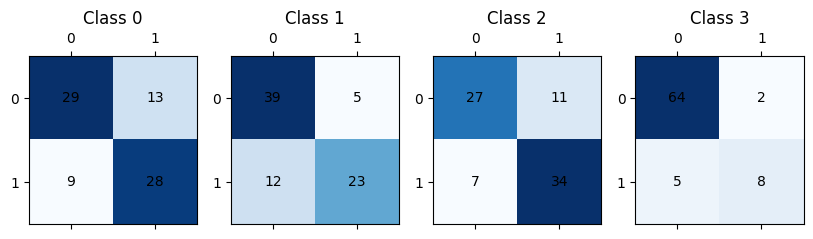

The MultiOutputClassifier(estimator=RandomForestClassifier())  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.66666667, 0.80769231, 0.7173913 , 0.72727273]), array([0.75675676, 0.6       , 0.80487805, 0.61538462]), array([0.70886076, 0.68852459, 0.75862069, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.76      0.71        37
           1       0.81      0.60      0.69        35
           2       0.72      0.80      0.76        41
           3       0.73      0.62      0.67        13

   micro avg       0.72      0.71      0.72       126
   macro avg       0.73      0.69      0.71       126
weighted avg       0.73      0.71      0.72       126
 samples avg       0.72      0.75      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


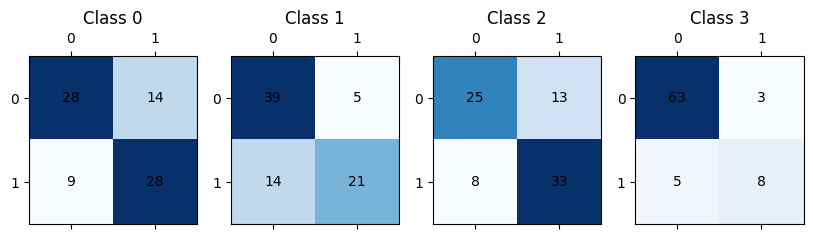

The MultiOutputClassifier(estimator=RandomForestClassifier())  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4430379746835443 presition, reccall, f1 = (array([0.65116279, 0.84      , 0.70212766, 0.72727273]), array([0.75675676, 0.6       , 0.80487805, 0.61538462]), array([0.7       , 0.7       , 0.75      , 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.76      0.70        37
           1       0.84      0.60      0.70        35
           2       0.70      0.80      0.75        41
           3       0.73      0.62      0.67        13

   micro avg       0.71      0.71      0.71       126
   macro avg       0.73      0.69      0.70       126
weighted avg       0.73      0.71      0.71       126
 samples avg       0.72      0.75      0.71       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


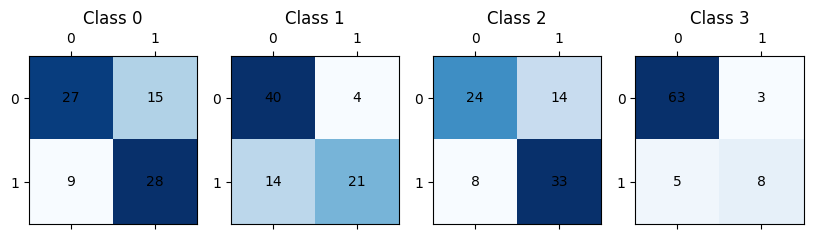

The MultiOutputClassifier(estimator=RandomForestClassifier())  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.53333333, 0.78947368, 0.61363636, 0.        ]), array([0.64864865, 0.42857143, 0.65853659, 0.        ]), array([0.58536585, 0.55555556, 0.63529412, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.53      0.65      0.59        37
           1       0.79      0.43      0.56        35
           2       0.61      0.66      0.64        41
           3       0.00      0.00      0.00        13

   micro avg       0.61      0.52      0.56       126
   macro avg       0.48      0.43      0.44       126
weighted avg       0.58      0.52      0.53       126
 samples avg       0.52      0.53      0.50       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


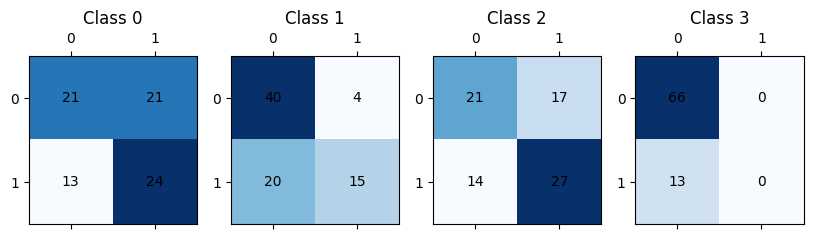

The MultiOutputClassifier(estimator=RandomForestClassifier())  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.20253164556962025 presition, reccall, f1 = (array([0.59090909, 0.78947368, 0.63829787, 0.        ]), array([0.7027027 , 0.42857143, 0.73170732, 0.        ]), array([0.64197531, 0.55555556, 0.68181818, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.70      0.64        37
           1       0.79      0.43      0.56        35
           2       0.64      0.73      0.68        41
           3       0.00      0.00      0.00        13

   micro avg       0.65      0.56      0.60       126
   macro avg       0.50      0.47      0.47       126
weighted avg       0.60      0.56      0.56       126
 samples avg       0.56      0.56      0.53       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


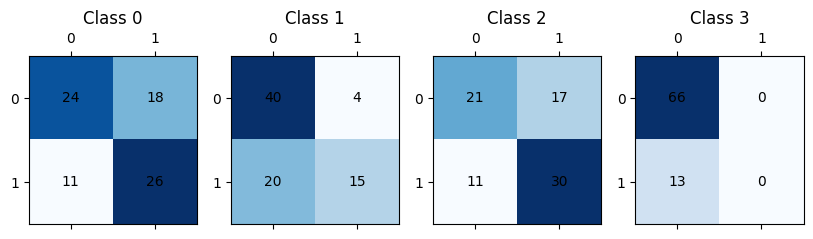

The MultiOutputClassifier(estimator=RandomForestClassifier())  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.3037974683544304 presition, reccall, f1 = (array([0.61538462, 0.8       , 0.64583333, 1.        ]), array([0.64864865, 0.34285714, 0.75609756, 0.15384615]), array([0.63157895, 0.48      , 0.69662921, 0.26666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.65      0.63        37
           1       0.80      0.34      0.48        35
           2       0.65      0.76      0.70        41
           3       1.00      0.15      0.27        13

   micro avg       0.66      0.55      0.60       126
   macro avg       0.77      0.48      0.52       126
weighted avg       0.72      0.55      0.57       126
 samples avg       0.60      0.59      0.56       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


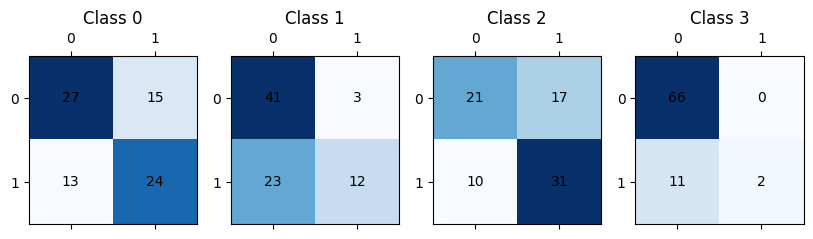

The MultiOutputClassifier(estimator=RandomForestClassifier())  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.70588235, 0.85714286, 0.84210526, 0.83333333]), array([0.64864865, 0.68571429, 0.7804878 , 0.38461538]), array([0.67605634, 0.76190476, 0.81012658, 0.52631579]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.71      0.65      0.68        37
           1       0.86      0.69      0.76        35
           2       0.84      0.78      0.81        41
           3       0.83      0.38      0.53        13

   micro avg       0.80      0.67      0.73       126
   macro avg       0.81      0.62      0.69       126
weighted avg       0.81      0.67      0.73       126
 samples avg       0.74      0.70      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


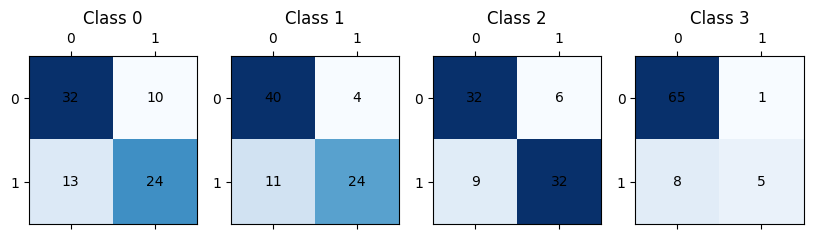

The MultiOutputClassifier(estimator=RandomForestClassifier())  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.65      , 0.80769231, 0.775     , 0.75      ]), array([0.7027027 , 0.6       , 0.75609756, 0.46153846]), array([0.67532468, 0.68852459, 0.7654321 , 0.57142857]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.70      0.68        37
           1       0.81      0.60      0.69        35
           2       0.78      0.76      0.77        41
           3       0.75      0.46      0.57        13

   micro avg       0.74      0.67      0.70       126
   macro avg       0.75      0.63      0.68       126
weighted avg       0.74      0.67      0.70       126
 samples avg       0.69      0.69      0.66       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


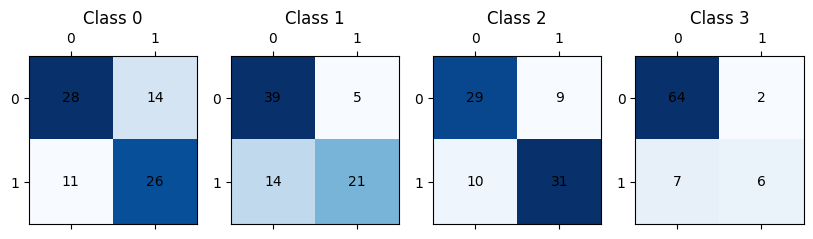

The MultiOutputClassifier(estimator=RandomForestClassifier())  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=RandomForestClassifier())  Accuracy  is 0.46835443037974683 presition, reccall, f1 = (array([0.6744186 , 0.79310345, 0.825     , 0.7       ]), array([0.78378378, 0.65714286, 0.80487805, 0.53846154]), array([0.725     , 0.71875   , 0.81481481, 0.60869565]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.78      0.72        37
           1       0.79      0.66      0.72        35
           2       0.82      0.80      0.81        41
           3       0.70      0.54      0.61        13

   micro avg       0.75      0.73      0.74       126
   macro avg       0.75      0.70      0.72       126
weighted avg       0.76      0.73      0.74       126
 samples avg       0.76      0.77      0.73       12

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


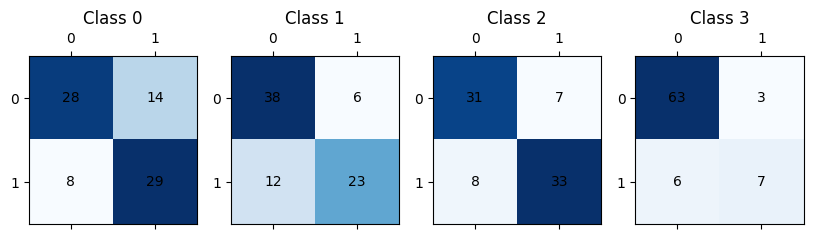

The MultiOutputClassifier(estimator=LogisticRegression())  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.2911392405063291 presition, reccall, f1 = (array([0.65217391, 0.82608696, 0.64150943, 0.66666667]), array([0.81081081, 0.54285714, 0.82926829, 0.30769231]), array([0.72289157, 0.65517241, 0.72340426, 0.42105263]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.81      0.72        37
           1       0.83      0.54      0.66        35
           2       0.64      0.83      0.72        41
           3       0.67      0.31      0.42        13

   micro avg       0.68      0.69      0.69       126
   macro avg       0.70      0.62      0.63       126
weighted avg       0.70      0.69      0.67       126
 samples avg       0.64      0.72      0.64       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


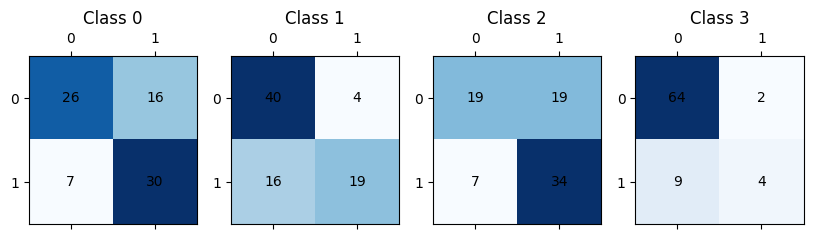

The MultiOutputClassifier(estimator=LogisticRegression())  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.65909091, 0.82608696, 0.65454545, 0.75      ]), array([0.78378378, 0.54285714, 0.87804878, 0.69230769]), array([0.71604938, 0.65517241, 0.75      , 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.66      0.78      0.72        37
           1       0.83      0.54      0.66        35
           2       0.65      0.88      0.75        41
           3       0.75      0.69      0.72        13

   micro avg       0.69      0.74      0.72       126
   macro avg       0.72      0.72      0.71       126
weighted avg       0.71      0.74      0.71       126
 samples avg       0.71      0.80      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


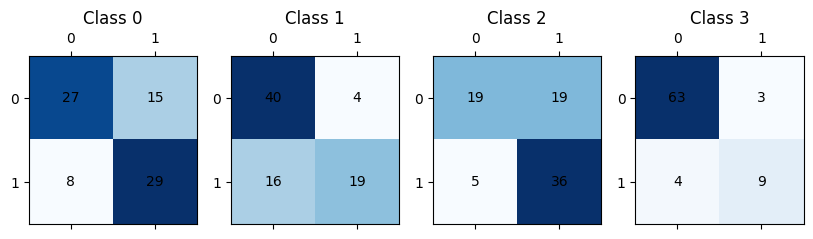

The MultiOutputClassifier(estimator=LogisticRegression())  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.6097561 , 0.92307692, 0.62903226, 0.        ]), array([0.67567568, 0.34285714, 0.95121951, 0.        ]), array([0.64102564, 0.5       , 0.75728155, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.61      0.68      0.64        37
           1       0.92      0.34      0.50        35
           2       0.63      0.95      0.76        41
           3       0.00      0.00      0.00        13

   micro avg       0.66      0.60      0.63       126
   macro avg       0.54      0.49      0.47       126
weighted avg       0.64      0.60      0.57       126
 samples avg       0.61      0.61      0.58       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


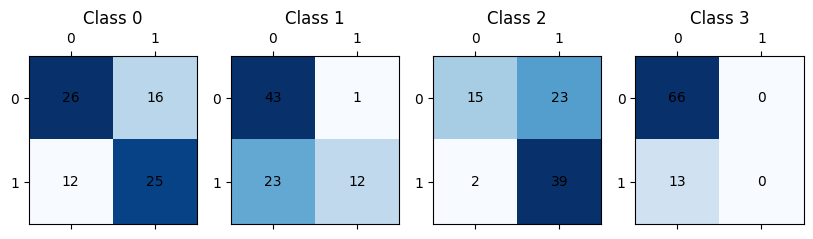

The MultiOutputClassifier(estimator=LogisticRegression())  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3037974683544304 presition, reccall, f1 = (array([0.61764706, 0.92857143, 0.64      , 0.        ]), array([0.56756757, 0.37142857, 0.7804878 , 0.        ]), array([0.5915493 , 0.53061224, 0.7032967 , 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.57      0.59        37
           1       0.93      0.37      0.53        35
           2       0.64      0.78      0.70        41
           3       0.00      0.00      0.00        13

   micro avg       0.67      0.52      0.59       126
   macro avg       0.55      0.43      0.46       126
weighted avg       0.65      0.52      0.55       126
 samples avg       0.61      0.56      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


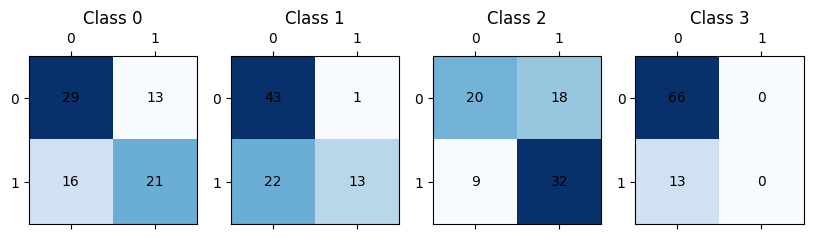

The MultiOutputClassifier(estimator=LogisticRegression())  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.35443037974683544 presition, reccall, f1 = (array([0.6       , 0.85714286, 0.7173913 , 0.        ]), array([0.64864865, 0.51428571, 0.80487805, 0.        ]), array([0.62337662, 0.64285714, 0.75862069, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.65      0.62        37
           1       0.86      0.51      0.64        35
           2       0.72      0.80      0.76        41
           3       0.00      0.00      0.00        13

   micro avg       0.70      0.60      0.64       126
   macro avg       0.54      0.49      0.51       126
weighted avg       0.65      0.60      0.61       126
 samples avg       0.63      0.63      0.60       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


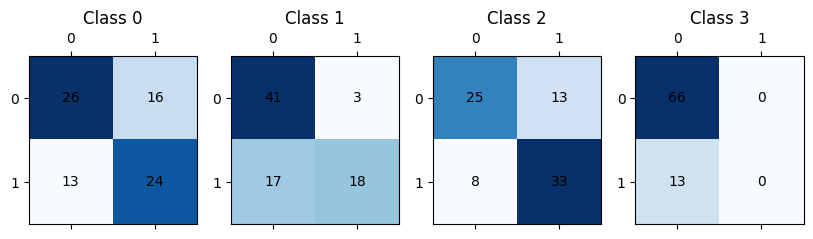

The MultiOutputClassifier(estimator=LogisticRegression())  5 embedding name: glove basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.54347826, 0.90909091, 0.625     , 0.625     ]), array([0.67567568, 0.57142857, 0.73170732, 0.38461538]), array([0.60240964, 0.70175439, 0.6741573 , 0.47619048]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.54      0.68      0.60        37
           1       0.91      0.57      0.70        35
           2       0.62      0.73      0.67        41
           3       0.62      0.38      0.48        13

   micro avg       0.65      0.63      0.64       126
   macro avg       0.68      0.59      0.61       126
weighted avg       0.68      0.63      0.64       126
 samples avg       0.60      0.65      0.59       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


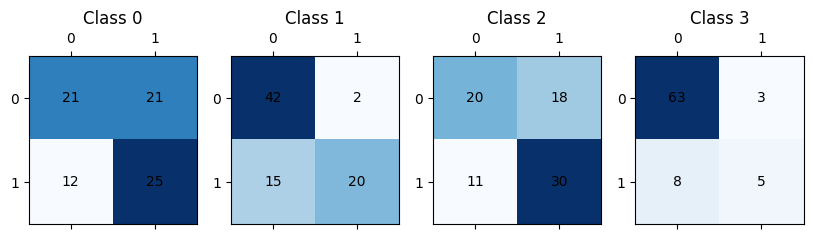

The MultiOutputClassifier(estimator=LogisticRegression())  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.62790698, 0.77777778, 0.67346939, 0.88888889]), array([0.72972973, 0.6       , 0.80487805, 0.61538462]), array([0.675     , 0.67741935, 0.73333333, 0.72727273]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.73      0.68        37
           1       0.78      0.60      0.68        35
           2       0.67      0.80      0.73        41
           3       0.89      0.62      0.73        13

   micro avg       0.70      0.71      0.70       126
   macro avg       0.74      0.69      0.70       126
weighted avg       0.71      0.71      0.70       126
 samples avg       0.69      0.74      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


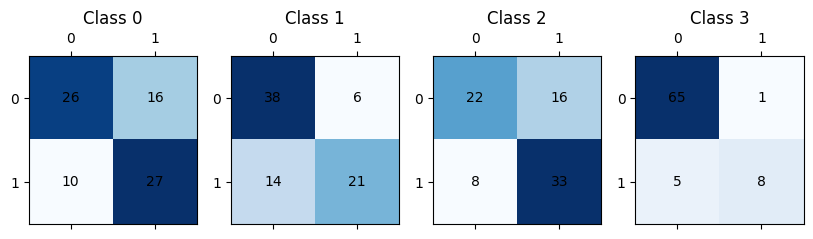

The MultiOutputClassifier(estimator=LogisticRegression())  7 embedding name: use
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.57446809, 0.88461538, 0.73809524, 1.        ]), array([0.72972973, 0.65714286, 0.75609756, 0.07692308]), array([0.64285714, 0.75409836, 0.74698795, 0.14285714]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.57      0.73      0.64        37
           1       0.88      0.66      0.75        35
           2       0.74      0.76      0.75        41
           3       1.00      0.08      0.14        13

   micro avg       0.71      0.65      0.68       126
   macro avg       0.80      0.55      0.57       126
weighted avg       0.76      0.65      0.66       126
 samples avg       0.65      0.65      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


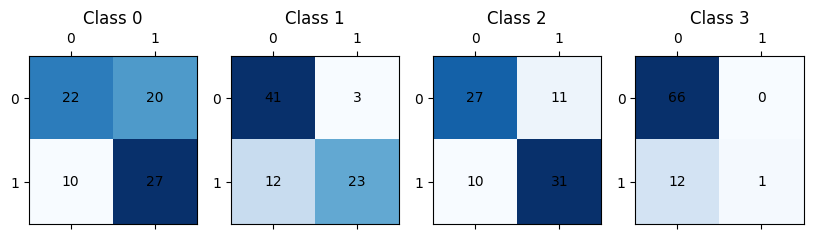

The MultiOutputClassifier(estimator=LogisticRegression())  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.46835443037974683 presition, reccall, f1 = (array([0.62      , 0.85185185, 0.74468085, 0.81818182]), array([0.83783784, 0.65714286, 0.85365854, 0.69230769]), array([0.71264368, 0.74193548, 0.79545455, 0.75      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.84      0.71        37
           1       0.85      0.66      0.74        35
           2       0.74      0.85      0.80        41
           3       0.82      0.69      0.75        13

   micro avg       0.73      0.78      0.75       126
   macro avg       0.76      0.76      0.75       126
weighted avg       0.75      0.78      0.75       126
 samples avg       0.74      0.80      0.74       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


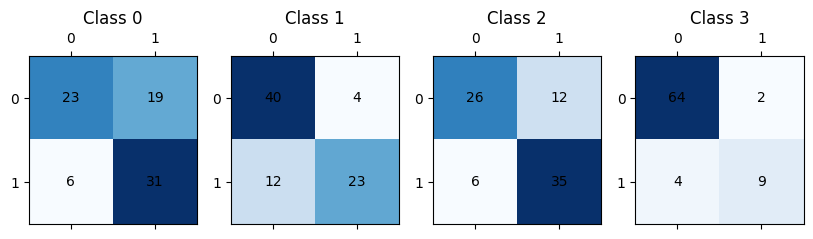

The MultiOutputClassifier(estimator=LogisticRegression())  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4050632911392405 presition, reccall, f1 = (array([0.64      , 0.83333333, 0.6875    , 0.8       ]), array([0.86486486, 0.57142857, 0.80487805, 0.61538462]), array([0.73563218, 0.6779661 , 0.74157303, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.64      0.86      0.74        37
           1       0.83      0.57      0.68        35
           2       0.69      0.80      0.74        41
           3       0.80      0.62      0.70        13

   micro avg       0.70      0.74      0.72       126
   macro avg       0.74      0.71      0.71       126
weighted avg       0.73      0.74      0.72       126
 samples avg       0.70      0.75      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


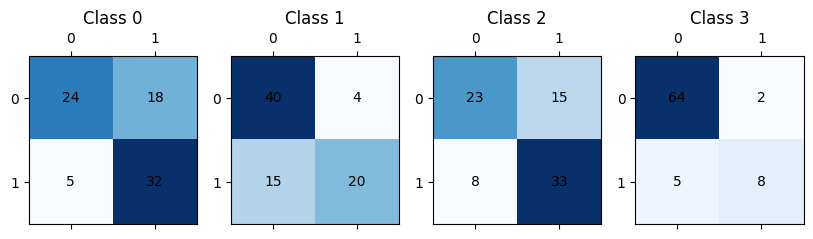

The MultiOutputClassifier(estimator=LogisticRegression())  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.65853659, 0.79310345, 0.73469388, 0.83333333]), array([0.72972973, 0.65714286, 0.87804878, 0.38461538]), array([0.69230769, 0.71875   , 0.8       , 0.52631579]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.66      0.73      0.69        37
           1       0.79      0.66      0.72        35
           2       0.73      0.88      0.80        41
           3       0.83      0.38      0.53        13

   micro avg       0.73      0.72      0.73       126
   macro avg       0.75      0.66      0.68       126
weighted avg       0.74      0.72      0.72       126
 samples avg       0.73      0.76      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


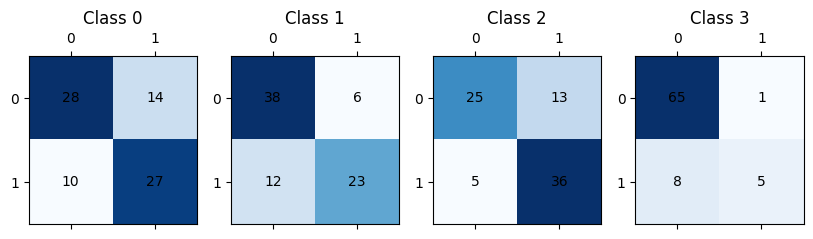

The MultiOutputClassifier(estimator=LogisticRegression())  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.65909091, 0.75      , 0.64150943, 0.9       ]), array([0.78378378, 0.6       , 0.82926829, 0.69230769]), array([0.71604938, 0.66666667, 0.72340426, 0.7826087 ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.66      0.78      0.72        37
           1       0.75      0.60      0.67        35
           2       0.64      0.83      0.72        41
           3       0.90      0.69      0.78        13

   micro avg       0.69      0.74      0.71       126
   macro avg       0.74      0.73      0.72       126
weighted avg       0.70      0.74      0.71       126
 samples avg       0.70      0.78      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


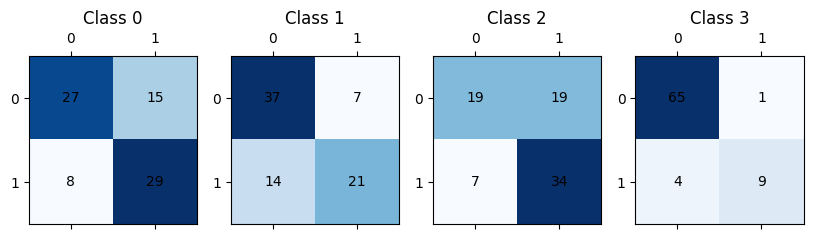

The MultiOutputClassifier(estimator=LogisticRegression())  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.68085106, 0.78571429, 0.74468085, 0.8       ]), array([0.86486486, 0.62857143, 0.85365854, 0.61538462]), array([0.76190476, 0.6984127 , 0.79545455, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.68      0.86      0.76        37
           1       0.79      0.63      0.70        35
           2       0.74      0.85      0.80        41
           3       0.80      0.62      0.70        13

   micro avg       0.73      0.77      0.75       126
   macro avg       0.75      0.74      0.74       126
weighted avg       0.74      0.77      0.75       126
 samples avg       0.76      0.80      0.74       126



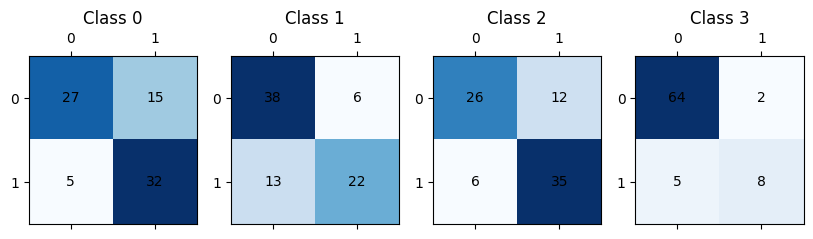

The MultiOutputClassifier(estimator=LogisticRegression())  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3037974683544304 presition, reccall, f1 = (array([0.72222222, 0.84615385, 0.625     , 0.        ]), array([0.7027027 , 0.62857143, 0.73170732, 0.        ]), array([0.71232877, 0.72131148, 0.6741573 , 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.72      0.70      0.71        37
           1       0.85      0.63      0.72        35
           2       0.62      0.73      0.67        41
           3       0.00      0.00      0.00        13

   micro avg       0.71      0.62      0.66       126
   macro avg       0.55      0.52      0.53       126
weighted avg       0.65      0.62      0.63       126
 samples avg       0.61      0.61      0.58       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


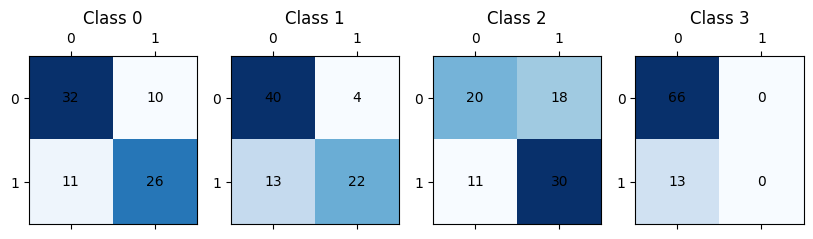

The MultiOutputClassifier(estimator=LogisticRegression())  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3291139240506329 presition, reccall, f1 = (array([0.7       , 0.76190476, 0.66666667, 0.9       ]), array([0.75675676, 0.45714286, 0.92682927, 0.69230769]), array([0.72727273, 0.57142857, 0.7755102 , 0.7826087 ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.76      0.46      0.57        35
           2       0.67      0.93      0.78        41
           3       0.90      0.69      0.78        13

   micro avg       0.71      0.72      0.72       126
   macro avg       0.76      0.71      0.71       126
weighted avg       0.73      0.72      0.71       126
 samples avg       0.70      0.78      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


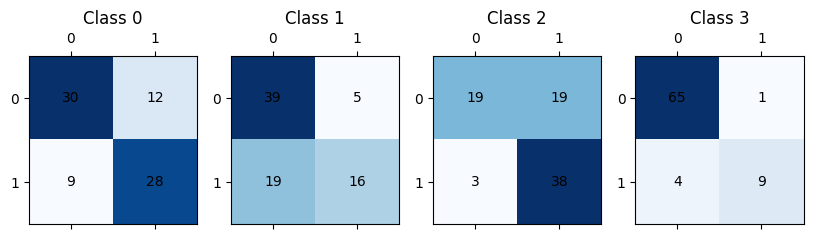

The MultiOutputClassifier(estimator=LogisticRegression())  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.73170732, 0.82142857, 0.66666667, 0.77777778]), array([0.81081081, 0.65714286, 0.82926829, 0.53846154]), array([0.76923077, 0.73015873, 0.73913043, 0.63636364]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.73      0.81      0.77        37
           1       0.82      0.66      0.73        35
           2       0.67      0.83      0.74        41
           3       0.78      0.54      0.64        13

   micro avg       0.73      0.75      0.74       126
   macro avg       0.75      0.71      0.72       126
weighted avg       0.74      0.75      0.73       126
 samples avg       0.68      0.77      0.69       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


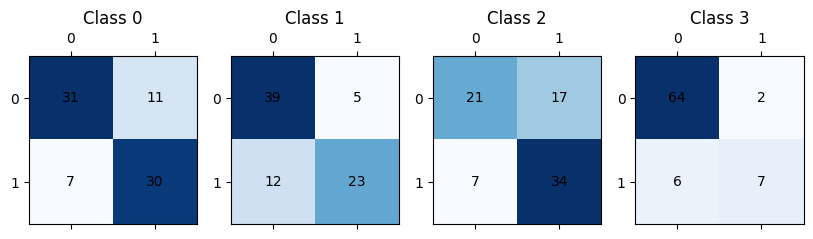

The MultiOutputClassifier(estimator=LogisticRegression())  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4050632911392405 presition, reccall, f1 = (array([0.71052632, 0.84      , 0.66666667, 0.        ]), array([0.72972973, 0.6       , 0.82926829, 0.        ]), array([0.72      , 0.7       , 0.73913043, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.71      0.73      0.72        37
           1       0.84      0.60      0.70        35
           2       0.67      0.83      0.74        41
           3       0.00      0.00      0.00        13

   micro avg       0.72      0.65      0.68       126
   macro avg       0.55      0.54      0.54       126
weighted avg       0.66      0.65      0.65       126
 samples avg       0.67      0.64      0.63       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


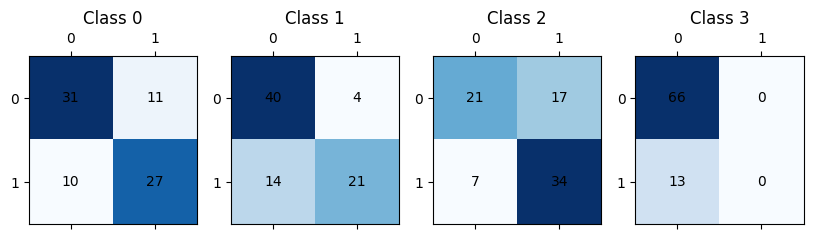

The MultiOutputClassifier(estimator=LogisticRegression())  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.34177215189873417 presition, reccall, f1 = (array([0.71794872, 0.83333333, 0.62711864, 0.75      ]), array([0.75675676, 0.57142857, 0.90243902, 0.69230769]), array([0.73684211, 0.6779661 , 0.74      , 0.72      ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.72      0.76      0.74        37
           1       0.83      0.57      0.68        35
           2       0.63      0.90      0.74        41
           3       0.75      0.69      0.72        13

   micro avg       0.70      0.75      0.72       126
   macro avg       0.73      0.73      0.72       126
weighted avg       0.72      0.75      0.72       126
 samples avg       0.69      0.78      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


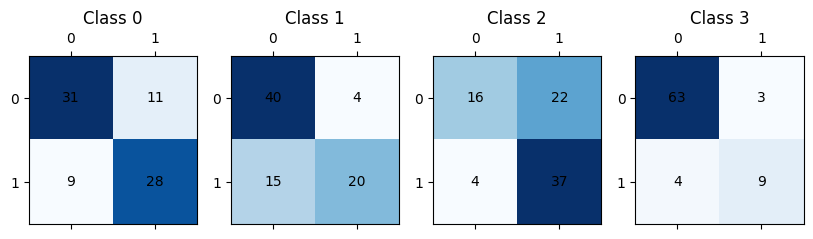

The MultiOutputClassifier(estimator=LogisticRegression())  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3670886075949367 presition, reccall, f1 = (array([0.73170732, 0.82142857, 0.66037736, 0.77777778]), array([0.81081081, 0.65714286, 0.85365854, 0.53846154]), array([0.76923077, 0.73015873, 0.74468085, 0.63636364]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.73      0.81      0.77        37
           1       0.82      0.66      0.73        35
           2       0.66      0.85      0.74        41
           3       0.78      0.54      0.64        13

   micro avg       0.73      0.75      0.74       126
   macro avg       0.75      0.72      0.72       126
weighted avg       0.74      0.75      0.74       126
 samples avg       0.70      0.78      0.70       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


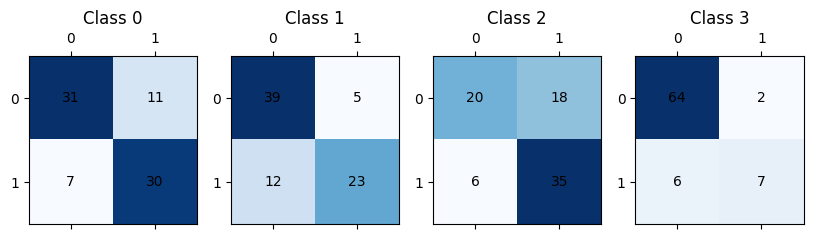

The MultiOutputClassifier(estimator=LogisticRegression())  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.60465116, 0.83333333, 0.6875    , 1.        ]), array([0.7027027 , 0.57142857, 0.80487805, 0.53846154]), array([0.65      , 0.6779661 , 0.74157303, 0.7       ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.60      0.70      0.65        37
           1       0.83      0.57      0.68        35
           2       0.69      0.80      0.74        41
           3       1.00      0.54      0.70        13

   micro avg       0.70      0.68      0.69       126
   macro avg       0.78      0.65      0.69       126
weighted avg       0.74      0.68      0.69       126
 samples avg       0.70      0.72      0.68       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


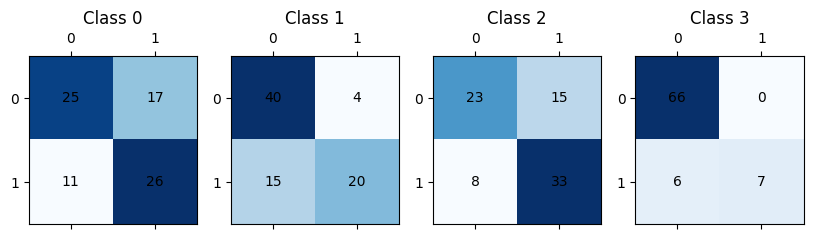

The MultiOutputClassifier(estimator=LogisticRegression())  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.3924050632911392 presition, reccall, f1 = (array([0.63043478, 0.83333333, 0.67924528, 1.        ]), array([0.78378378, 0.57142857, 0.87804878, 0.69230769]), array([0.69879518, 0.6779661 , 0.76595745, 0.81818182]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.78      0.70        37
           1       0.83      0.57      0.68        35
           2       0.68      0.88      0.77        41
           3       1.00      0.69      0.82        13

   micro avg       0.71      0.75      0.73       126
   macro avg       0.79      0.73      0.74       126
weighted avg       0.74      0.75      0.73       126
 samples avg       0.71      0.79      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


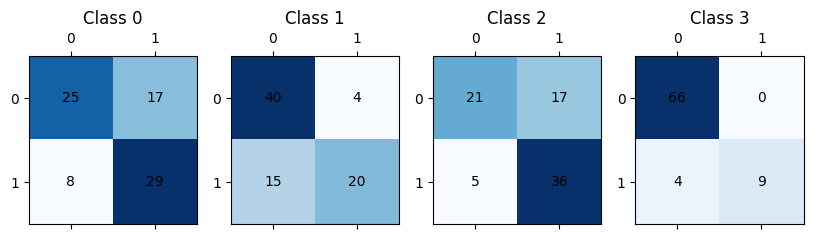

The MultiOutputClassifier(estimator=LogisticRegression())  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.43037974683544306 presition, reccall, f1 = (array([0.65217391, 0.86206897, 0.68      , 0.8       ]), array([0.81081081, 0.71428571, 0.82926829, 0.61538462]), array([0.72289157, 0.78125   , 0.74725275, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.65      0.81      0.72        37
           1       0.86      0.71      0.78        35
           2       0.68      0.83      0.75        41
           3       0.80      0.62      0.70        13

   micro avg       0.72      0.77      0.74       126
   macro avg       0.75      0.74      0.74       126
weighted avg       0.73      0.77      0.74       126
 samples avg       0.72      0.79      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


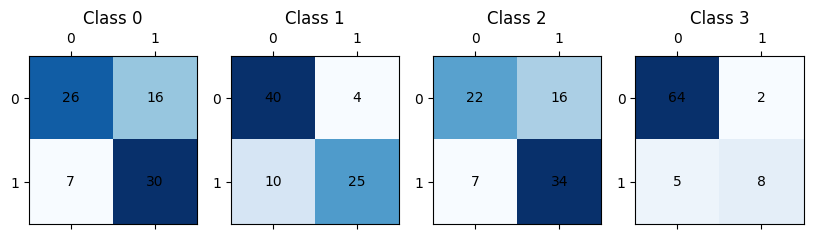

The MultiOutputClassifier(estimator=LogisticRegression())  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.24050632911392406 presition, reccall, f1 = (array([0.59183673, 0.86666667, 0.59615385, 0.        ]), array([0.78378378, 0.37142857, 0.75609756, 0.        ]), array([0.6744186 , 0.52      , 0.66666667, 0.        ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.59      0.78      0.67        37
           1       0.87      0.37      0.52        35
           2       0.60      0.76      0.67        41
           3       0.00      0.00      0.00        13

   micro avg       0.63      0.58      0.60       126
   macro avg       0.51      0.48      0.47       126
weighted avg       0.61      0.58      0.56       126
 samples avg       0.58      0.59      0.55       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


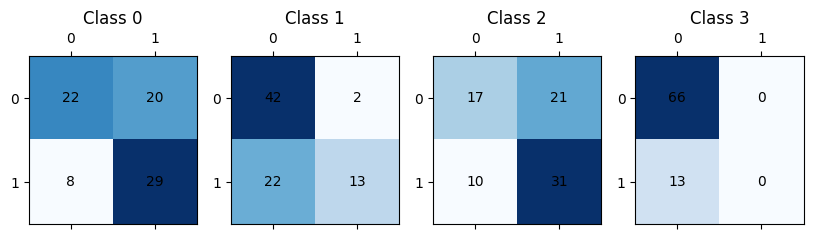

The MultiOutputClassifier(estimator=LogisticRegression())  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.27848101265822783 presition, reccall, f1 = (array([0.625     , 0.91666667, 0.6       , 0.72727273]), array([0.81081081, 0.31428571, 0.95121951, 0.61538462]), array([0.70588235, 0.46808511, 0.73584906, 0.66666667]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.62      0.81      0.71        37
           1       0.92      0.31      0.47        35
           2       0.60      0.95      0.74        41
           3       0.73      0.62      0.67        13

   micro avg       0.65      0.70      0.67       126
   macro avg       0.72      0.67      0.64       126
weighted avg       0.71      0.70      0.65       126
 samples avg       0.65      0.76      0.67       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


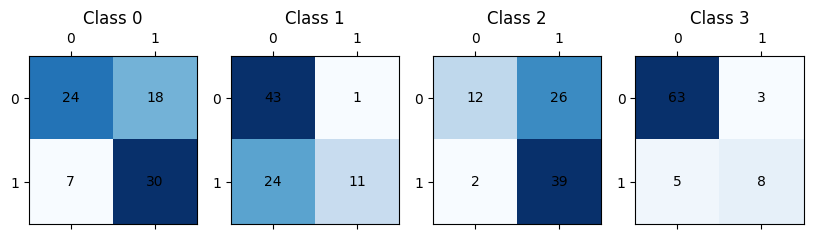

The MultiOutputClassifier(estimator=LogisticRegression())  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.21518987341772153 presition, reccall, f1 = (array([0.63265306, 0.84210526, 0.62264151, 0.66666667]), array([0.83783784, 0.45714286, 0.80487805, 0.30769231]), array([0.72093023, 0.59259259, 0.70212766, 0.42105263]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.63      0.84      0.72        37
           1       0.84      0.46      0.59        35
           2       0.62      0.80      0.70        41
           3       0.67      0.31      0.42        13

   micro avg       0.66      0.67      0.66       126
   macro avg       0.69      0.60      0.61       126
weighted avg       0.69      0.67      0.65       126
 samples avg       0.61      0.70      0.62       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


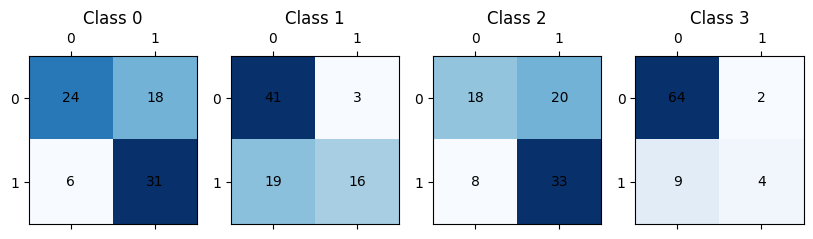

The MultiOutputClassifier(estimator=LogisticRegression())  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4810126582278481 presition, reccall, f1 = (array([0.7       , 0.86666667, 0.82926829, 0.625     ]), array([0.75675676, 0.74285714, 0.82926829, 0.38461538]), array([0.72727273, 0.8       , 0.82926829, 0.47619048]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.87      0.74      0.80        35
           2       0.83      0.83      0.83        41
           3       0.62      0.38      0.48        13

   micro avg       0.78      0.74      0.76       126
   macro avg       0.76      0.68      0.71       126
weighted avg       0.78      0.74      0.75       126
 samples avg       0.74      0.77      0.72       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


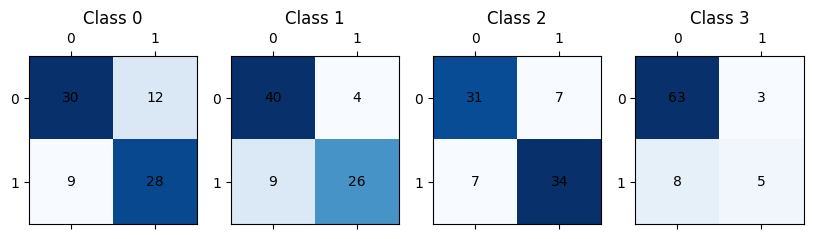

The MultiOutputClassifier(estimator=LogisticRegression())  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4177215189873418 presition, reccall, f1 = (array([0.66666667, 0.88888889, 0.72340426, 0.9       ]), array([0.81081081, 0.68571429, 0.82926829, 0.69230769]), array([0.73170732, 0.77419355, 0.77272727, 0.7826087 ]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73        37
           1       0.89      0.69      0.77        35
           2       0.72      0.83      0.77        41
           3       0.90      0.69      0.78        13

   micro avg       0.75      0.77      0.76       126
   macro avg       0.79      0.75      0.77       126
weighted avg       0.77      0.77      0.76       126
 samples avg       0.77      0.81      0.75       126



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


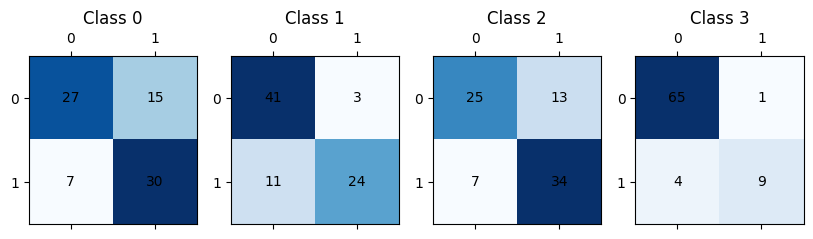

The MultiOutputClassifier(estimator=LogisticRegression())  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=LogisticRegression())  Accuracy  is 0.4050632911392405 presition, reccall, f1 = (array([0.67391304, 0.86206897, 0.70833333, 0.8       ]), array([0.83783784, 0.71428571, 0.82926829, 0.61538462]), array([0.74698795, 0.78125   , 0.76404494, 0.69565217]), array([37, 35, 41, 13])) 
classification report               precision    recall  f1-score   support

           0       0.67      0.84      0.75        37
           1       0.86      0.71      0.78        35
           2       0.71      0.83      0.76        41
           3       0.80      0.62      0.70        13

   micro avg       0.74      0.78      0.76       126
   macro avg       0.76      0.75      0.75       126
weighted avg       0.75      0.78      0.76       126
 samples avg       0.77      0.81      0.75       126



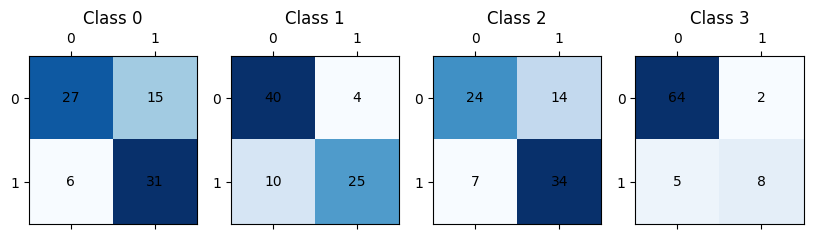

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


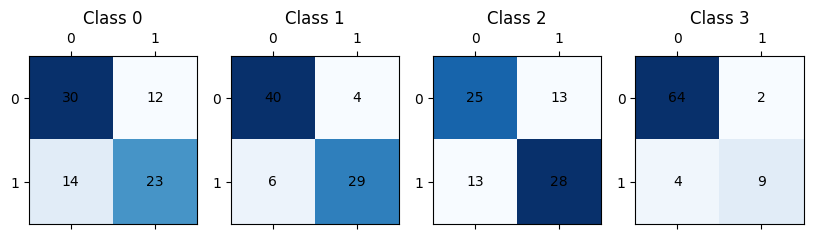

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


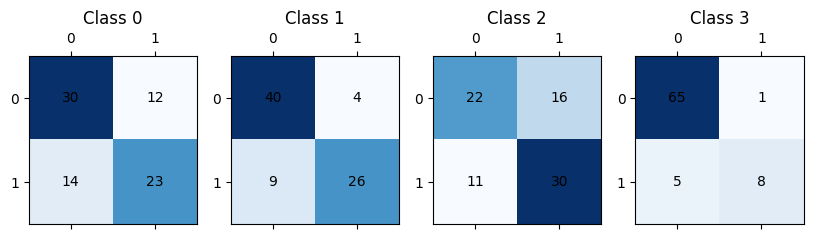

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


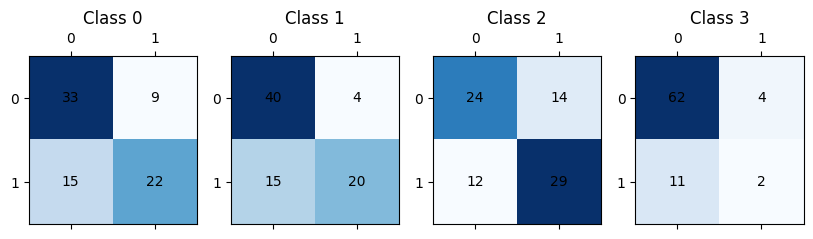

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


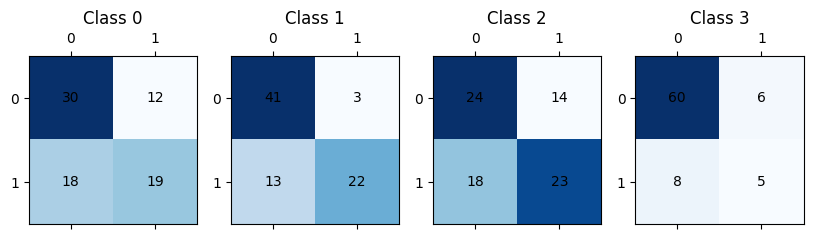

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


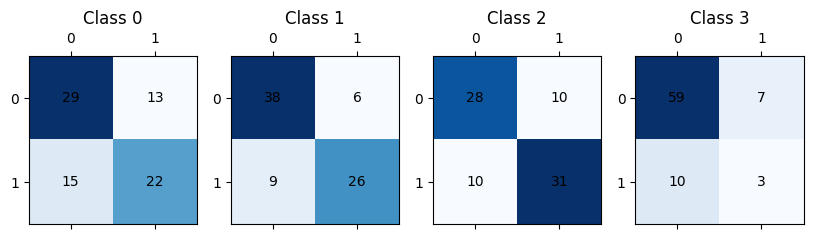

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


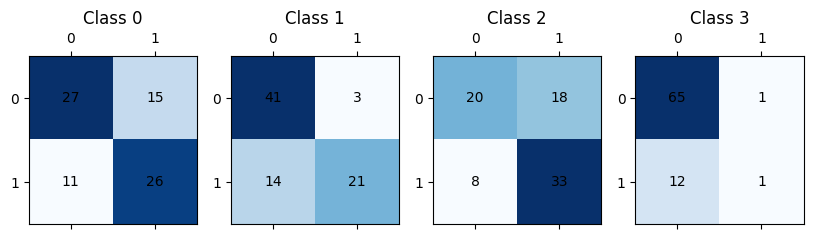

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


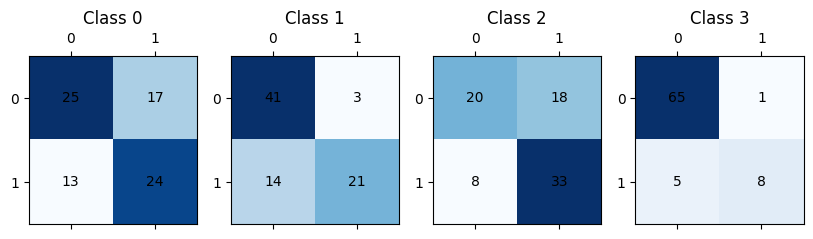

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


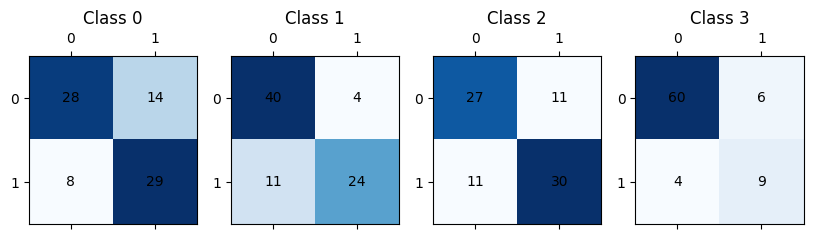

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


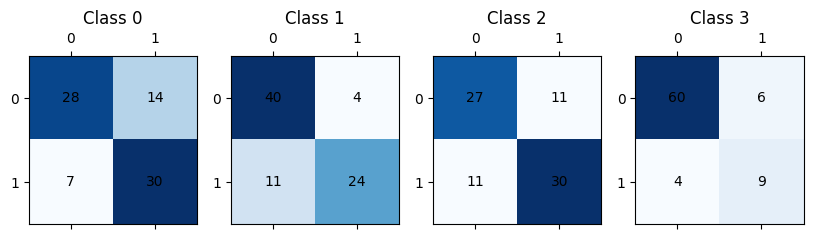

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


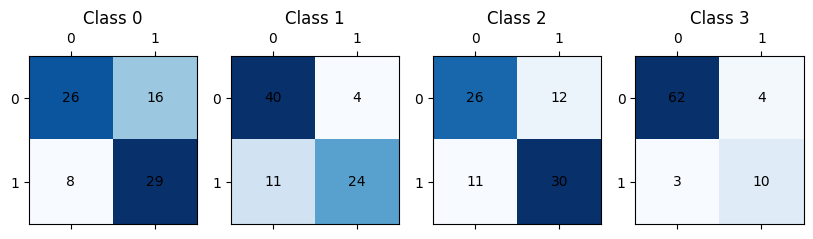

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


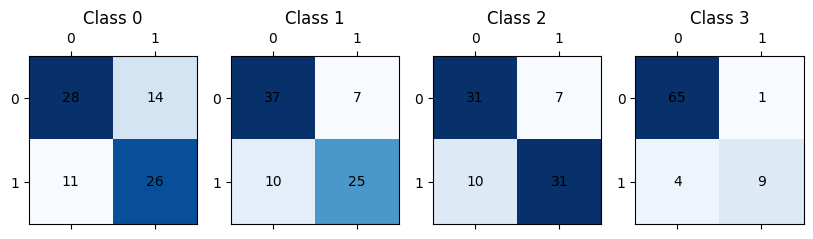

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


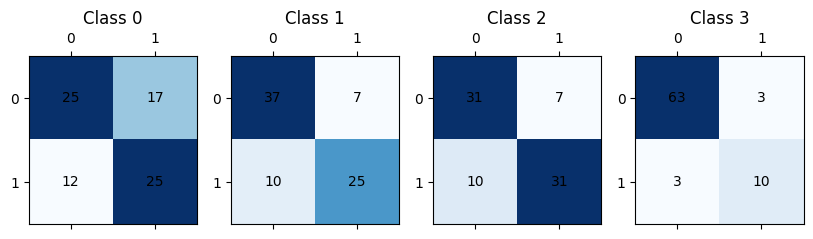

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


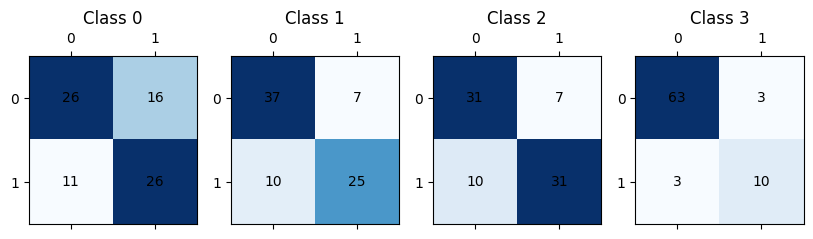

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


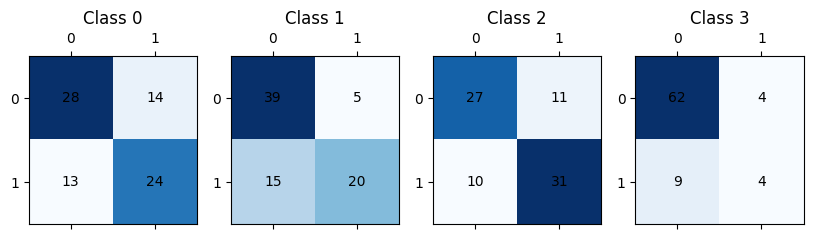

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


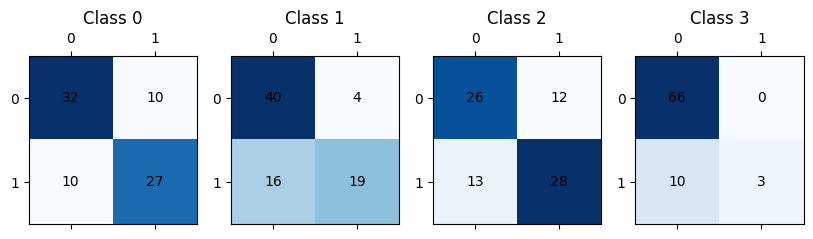

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


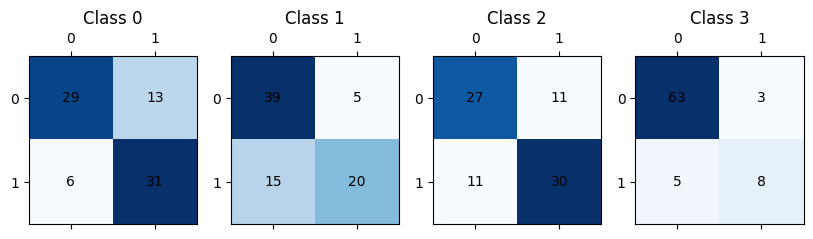

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


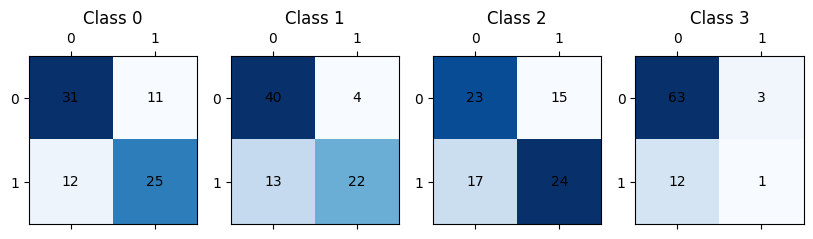

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


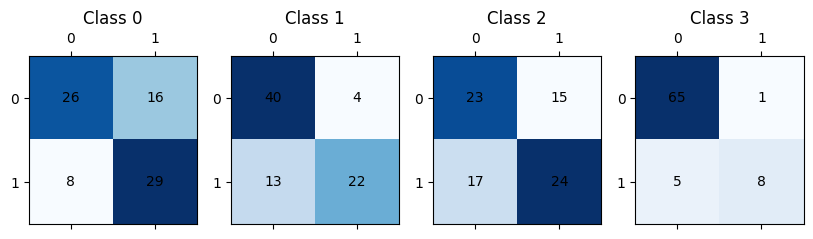

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


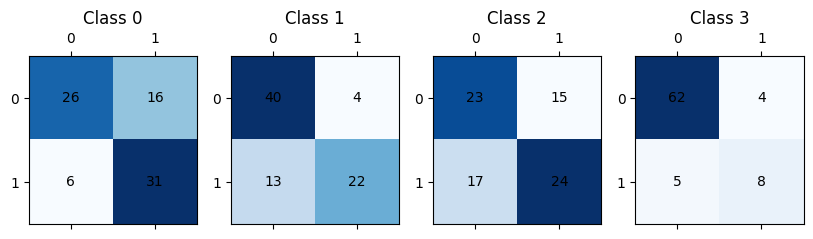

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


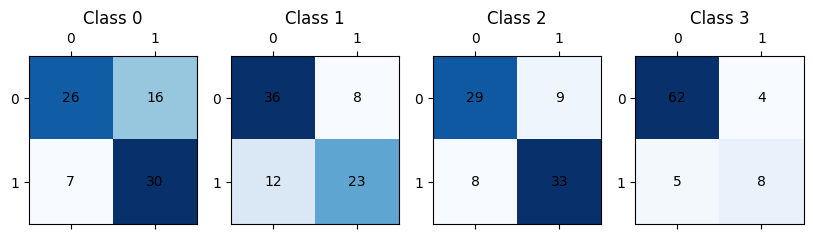

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


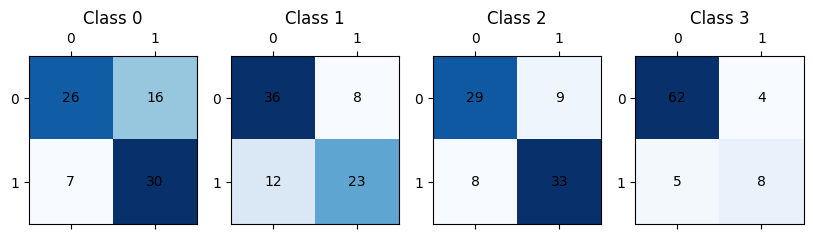

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


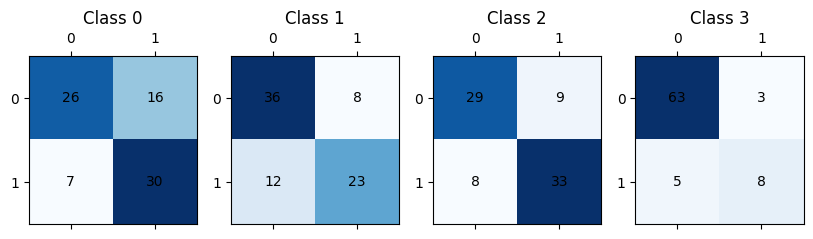

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


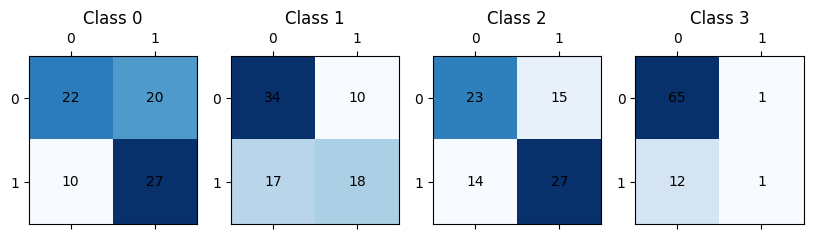

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


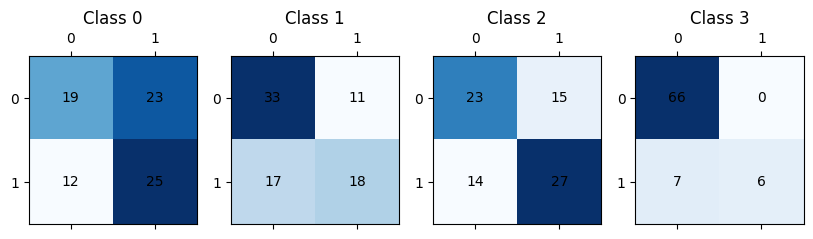

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


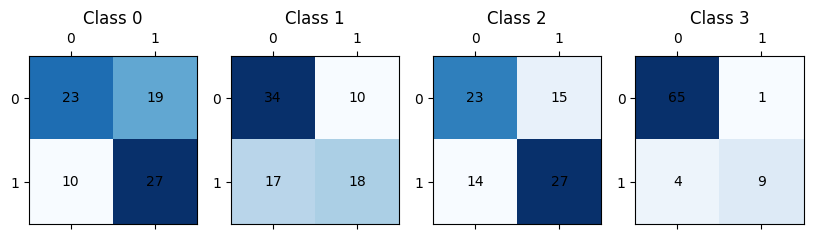

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


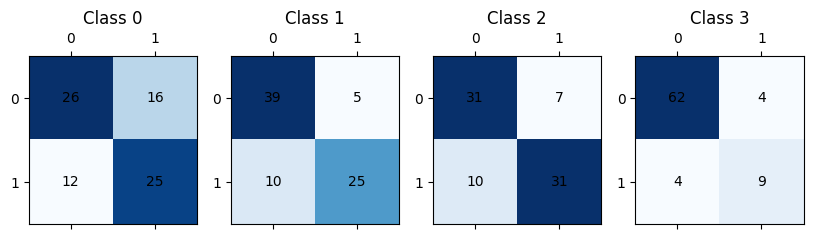

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


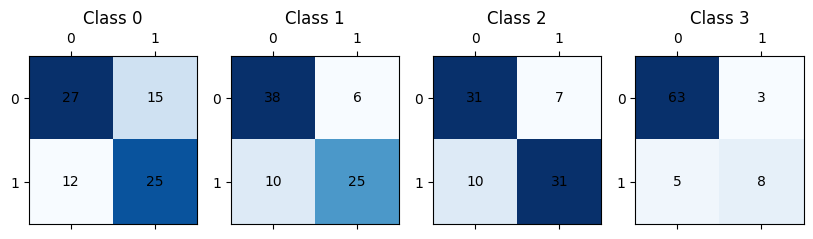

The MultiOutputClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_types=None, gamma=None,
                                              gpu_id=None, grow_policy=None,
                                              importance_type=None,
                                              interaction_constraints=None,
                                              learning_rate=None, max_bin=None,
                                              max_cat_thresh

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


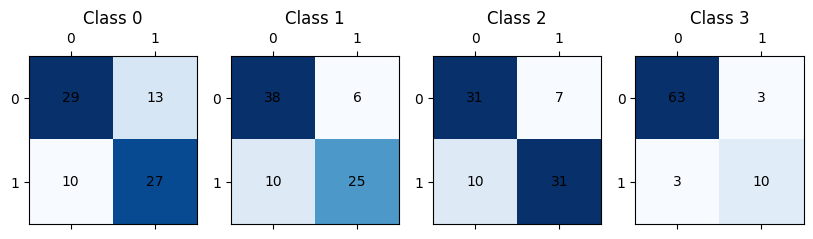

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000146 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 174
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 13
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


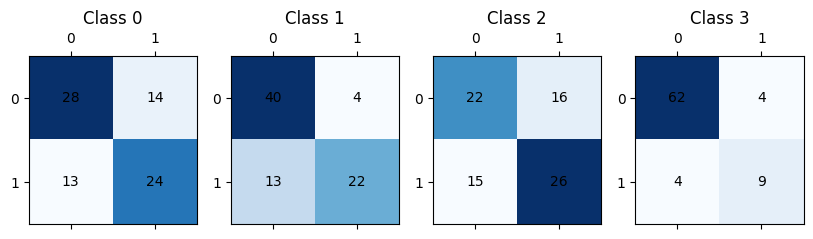

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000147 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 175
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 15
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


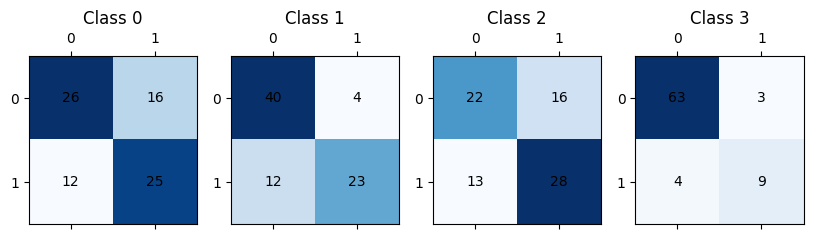

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 547
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 33
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


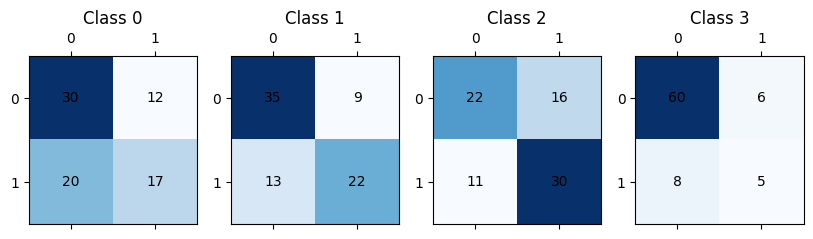

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000124 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 118
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 9
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


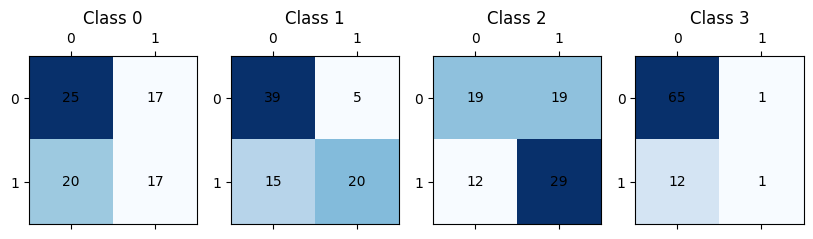

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 169
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 12
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


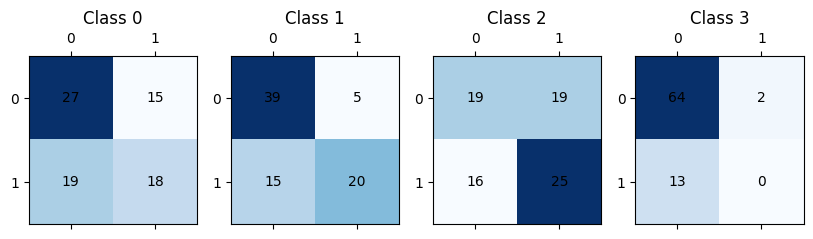

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18805
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 300
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


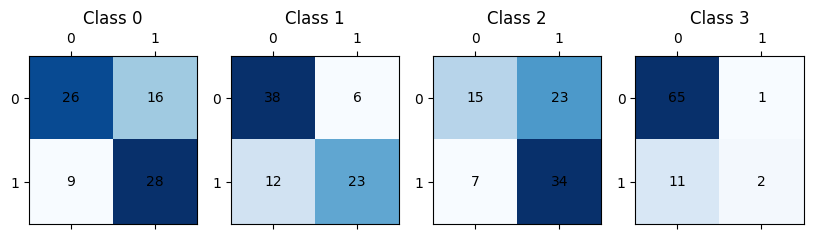

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 18811
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 303
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


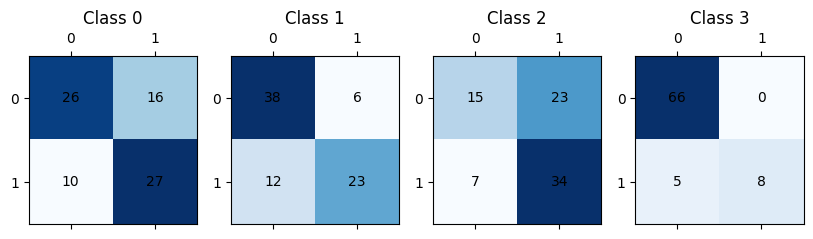

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32256
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 512
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


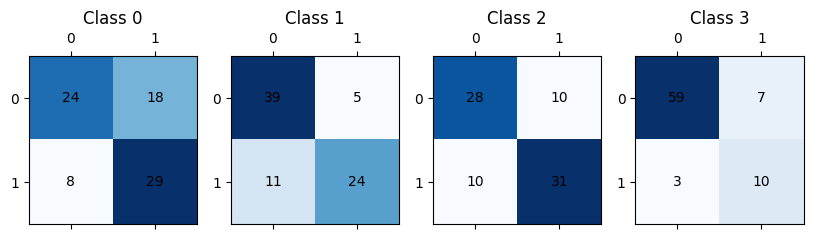

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002914 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32262
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 515
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


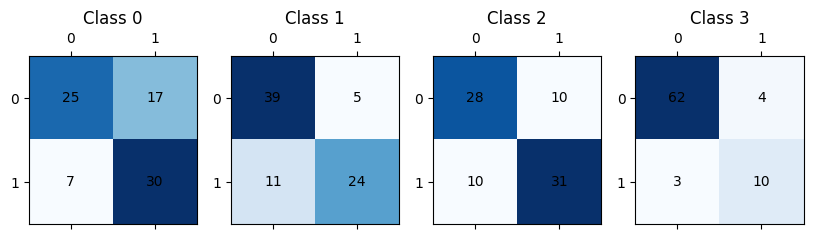

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 32261
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 513
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


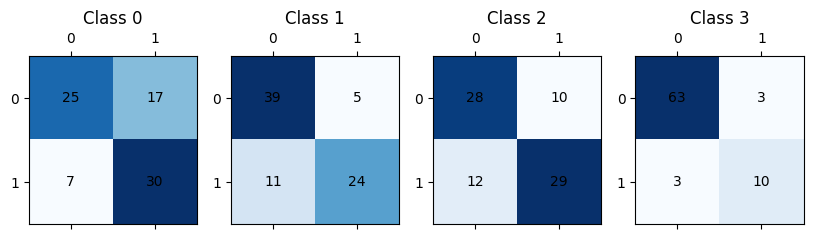

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24192
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


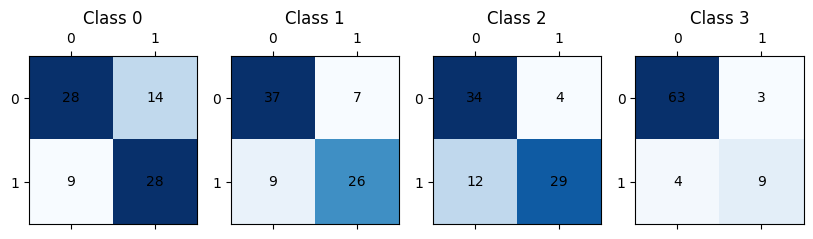

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 24201
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 387
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


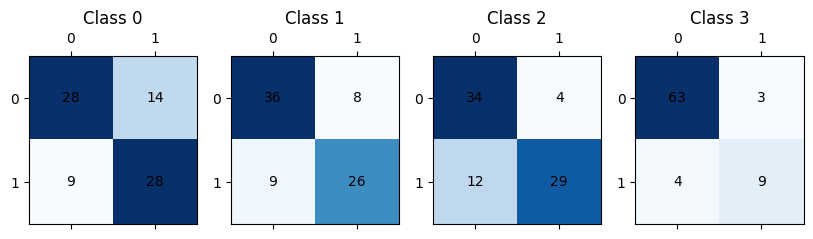

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001942 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24197
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 385
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


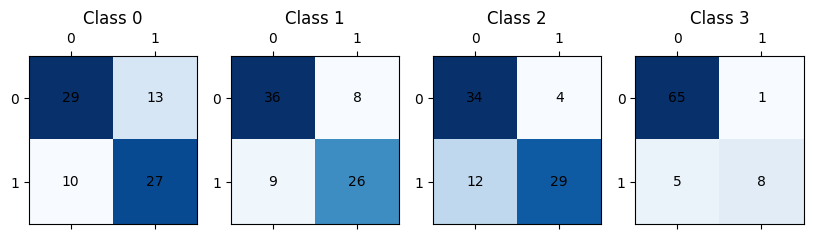

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001871 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24192
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


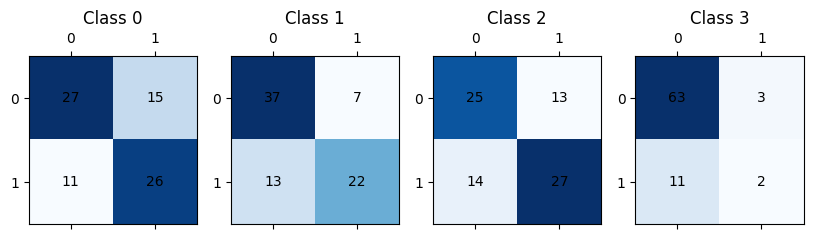

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24202
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 387
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


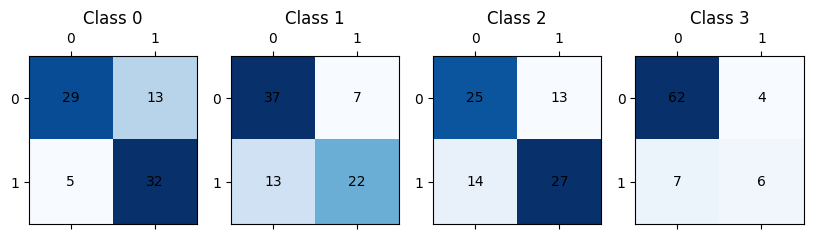

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001894 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24197
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 385
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


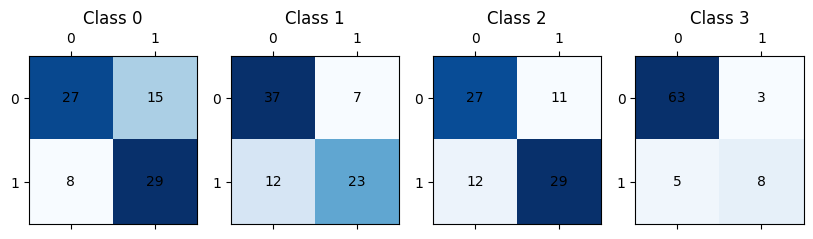

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24191
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


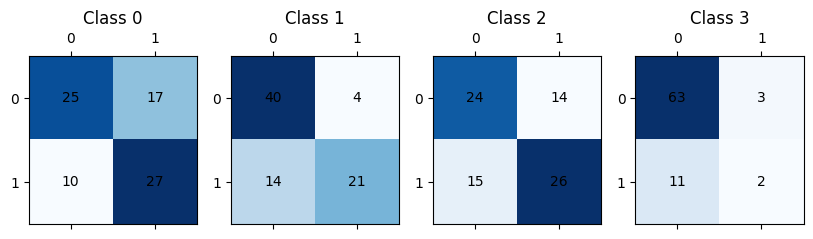

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24199
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 387
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


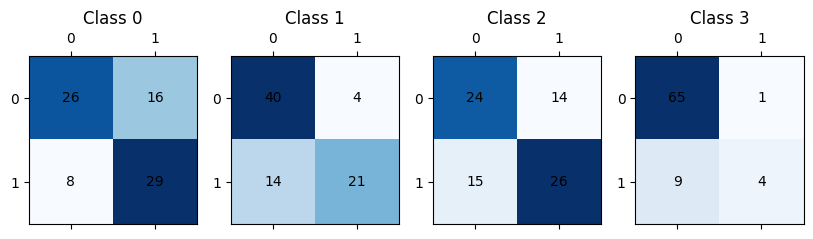

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24196
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 385
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


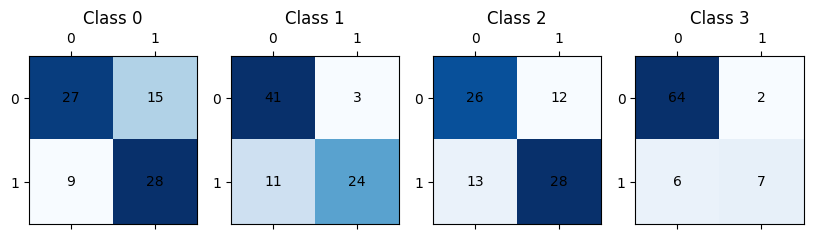

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002576 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48384
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


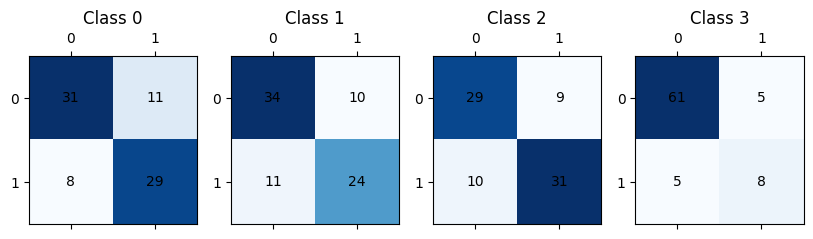

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48393
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 771
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


classification report               precision    recall  f1-score   support

           0       0.68      0.73      0.70        37
           1       0.71      0.69      0.70        35
           2       0.78      0.76      0.77        41
           3       0.62      0.62      0.62        13

   micro avg       0.71      0.71      0.71       126
   macro avg       0.69      0.70      0.69       126
weighted avg       0.71      0.71      0.71       126
 samples avg       0.71      0.75      0.70       126



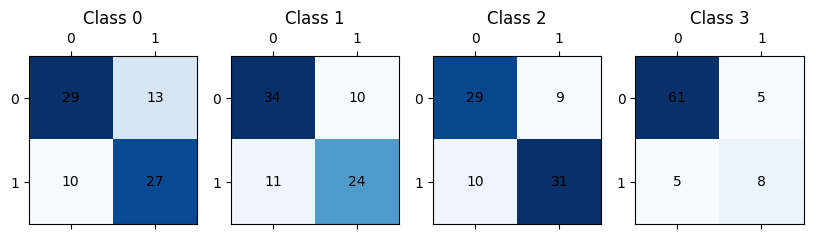

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 48389
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 769
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


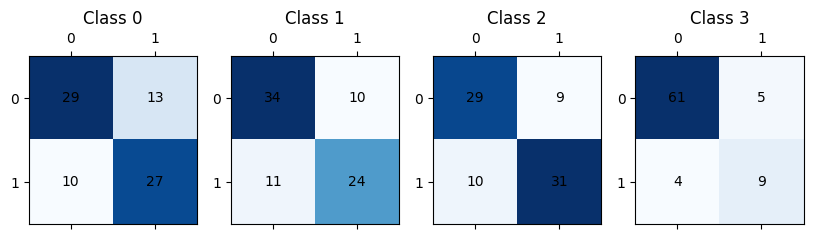

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002446 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24192
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 384
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


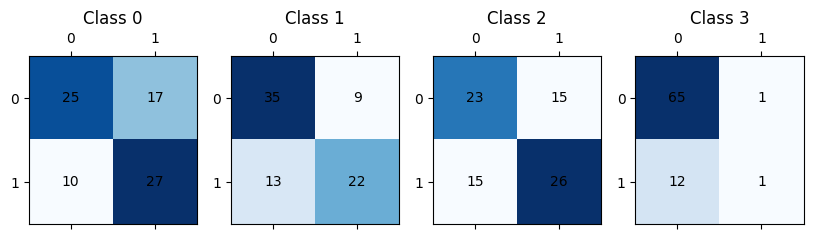

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24201
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 387
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


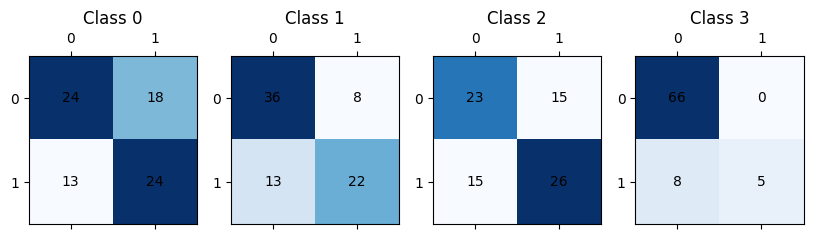

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24197
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 385
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


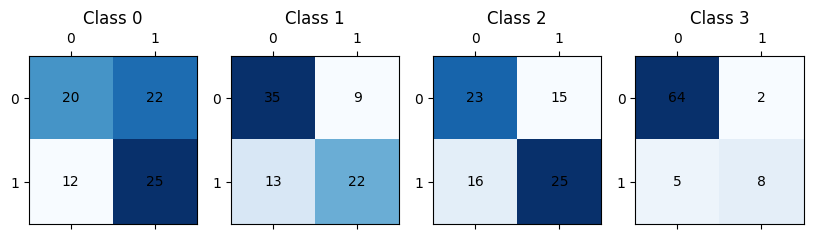

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002236 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24361
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 396
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


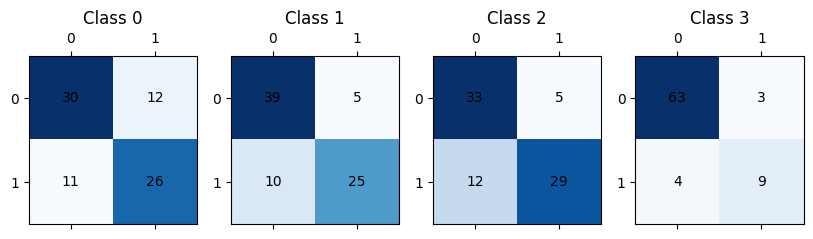

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24370
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 399
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


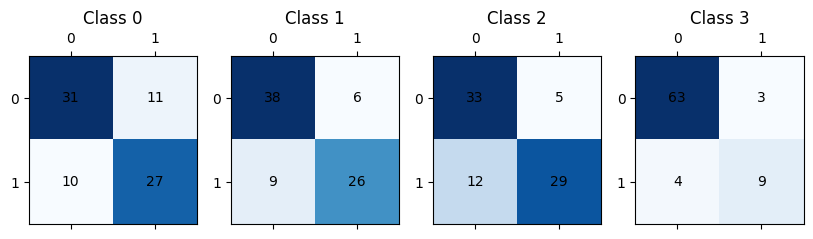

[LightGBM] [Info] Number of positive: 94, number of negative: 90
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 24366
[LightGBM] [Info] Number of data points in the train set: 184, number of used features: 397
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.510870 -> initscore=0.043485
[LightGBM] [Info] Start training from score 0.043485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


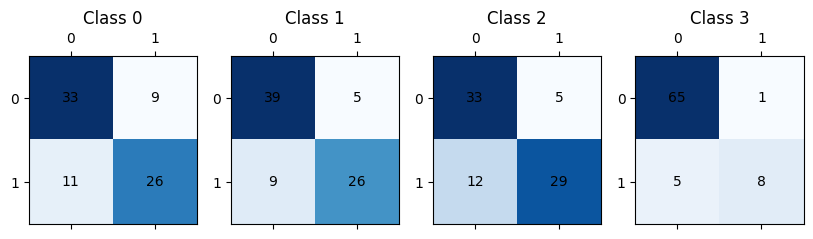

In [132]:

#testCategories = np.delete(global_data['y']['y_test_categories'], (), axis=1)

#trainCategories = np.delete(global_data['y']['y_train_categories'], (), axis=1)

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)


from sklearn.metrics import confusion_matrix, multilabel_confusion_matrix, classification_report, accuracy_score, precision_recall_fscore_support
from sklearn.metrics import classification_report


for classifier in classifiers:
  n =0
  for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
    try:
      classifier.fit(train_embedding, trainCategories)

      # Get the predicted categories for the test data
      y_pred = classifier.predict(test_embedding)

      print(f'The {classifier}  {n} embedding name: {name}' )
      print(f'The {classifier}  Accuracy  is {accuracy_score(testCategories,classifier.predict(test_embedding)) } presition, reccall, f1 = {precision_recall_fscore_support(testCategories,classifier.predict(test_embedding)) } ' )
      print('classification report', classification_report(testCategories,y_pred))
      # Compute the confusion matrix for each class
      cm = multilabel_confusion_matrix(testCategories, y_pred)

      # Invert the true positives and true negatives in the confusion matrix
      #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

      # Plot the confusion matrix for each class
      fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
      for i, c in enumerate(cm):
          ax = axes[i]
          ax.matshow(c, cmap=plt.cm.Blues)
          ax.set_title(f'Class {i}')
          for j in range(c.shape[0]):
              for k in range(c.shape[1]):
                  ax.text(k, j, str(c[j, k]), va='center', ha='center')
      plt.show()

    except:
      continue
    finally:
      n=n+1


##### subcategories prediction

In [ ]:
# global_data['y']['y_train_sub_categories']
# global_data['y']['y_test_sub_categories']

# testSubCategories = global_data['y']['y_test_sub_categories']

In [ ]:
# from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
# for classifier in classifiers:
#   n =0
#   for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
#     try:
#       classifier.fit(train_embedding, global_data['y']['y_train_sub_categories'])
#       print(f'The {classifier}  {n} embedding name: {name}' )
#       print(f'The {classifier}  Accuracy  is {accuracy_score(testSubCategories,classifier.predict(test_embedding)) }' )
#     except:
#       continue
#     finally:
#       n=n+1

#### best performing classifier xgb

In [ ]:

# #Create a multiclass SVM classifier with a DAG structure
# testCategories = np.delete(global_data['y']['y_test_categories'], (), axis=1)

# # Delete the second row (index starts from zero)
# trainCategories = np.delete(global_data['y']['y_train_categories'], (), axis=1)


# train_embedding = global_data['embeddings']['mini_lm']['X_train']
# test_embedding = global_data['embeddings']['mini_lm']['X_test']

# clf = MultiOutputClassifier(XGBClassifier(scale_pos_weight=0.8)) #scale_pos_weight [default=1]
# clf.fit(train_embedding,trainCategories)



# print(accuracy_score(testCategories,clf.predict(test_embedding)))

# #clf.predict(test_embedding)

# import xgboost as xgb
# from xgboost import plot_tree
# import matplotlib.pyplot as plt

# # assuming clf is your trained XGBClassifier model
# #ooster = clf.estimators_[0]

# # plot the first tree
# #xgb.plot_tree(booster, num_trees=0)
# #plt.show()

In [ ]:
# from sklearn.metrics import multilabel_confusion_matrix
# from sklearn.metrics import confusion_matrix

# # Compute the confusion matrix for each class
# #cm = [confusion_matrix(y_test_categories[:, i], y_pred[:, i]) for i in range(y_test_categories.shape[1])]

# # Compute the confusion matrix for each class
# cm = multilabel_confusion_matrix(testCategories,clf.predict(test_embedding))

# # Invert the true positives and true negatives in the confusion matrix
# #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

# # Plot the confusion matrix for each class
# fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
# for i, c in enumerate(cm):
#     ax = axes[i]
#     ax.matshow(c, cmap=plt.cm.Blues)
#     ax.set_title(f'Class {i}')
#     for j in range(c.shape[0]):
#         for k in range(c.shape[1]):
#             ax.text(k, j, str(c[j, k]), va='center', ha='center')
# plt.show()

## SVM classifier

#### categories

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score, classification_report, precision_recall_fscore_support

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

svm = SVC(kernel='rbf', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)
n =0
for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
  try:
    multi_svm.fit(train_embedding, trainCategories)
    print(f'The {multi_svm}  {n} embedding name: {name}' )
    print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )
    print(f'accuracy other method:  {multi_svm.score(test_embedding, testCategories )}')
  except:
    print('error')
    continue
  finally:
    n=n+1

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
accuracy other method:  0.3037974683544304
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
accuracy other method:  0.3037974683544304
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True)) 

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.68181818, 1.        , 0.6       , 0.64285714]), array([0.81081081, 0.2       , 0.95121951, 0.69230769]), array([0.74074074, 0.33333333, 0.73584906, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7311688311688311, 0.6635845038284063, 0.6191474493361285, None)
micro results (0.6538461538461539, 0.6746031746031746, 0.6640625, None)
sample results (0.6729957805907173, 0.7331223628691983, 0.6687763713080168, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.81      0.74        37
           1       1.00      0.20      0.33        35
           2       0.60      0.95      0.74   

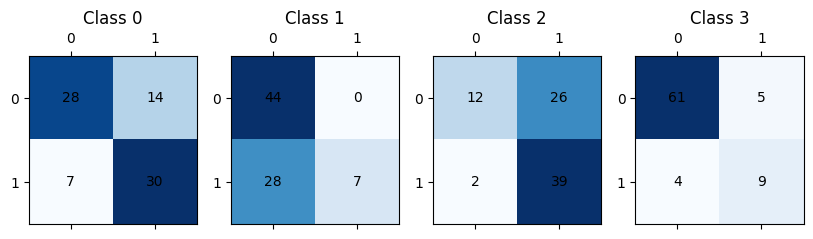

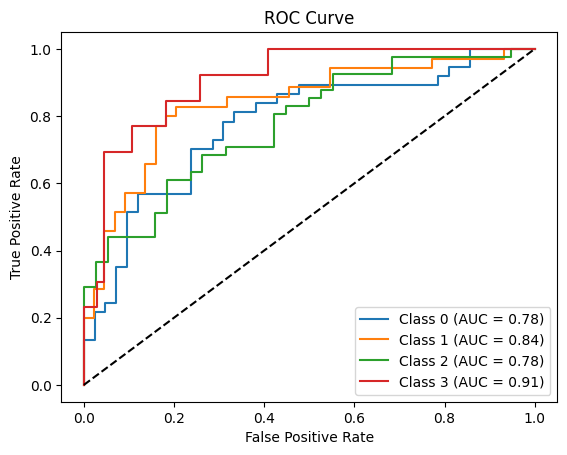

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.68181818, 0.85714286, 0.609375  , 0.75      ]), array([0.81081081, 0.34285714, 0.95121951, 0.69230769]), array([0.74074074, 0.48979592, 0.74285714, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7245840097402597, 0.6992987895426921, 0.6733484504913075, None)
micro results (0.6716417910447762, 0.7142857142857143, 0.6923076923076923, None)
sample results (0.681434599156118, 0.7710970464135021, 0.690295358649789, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.81      0.74        37
           1       0.86      0.34      0.49        35
           2       0.61      0.95  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


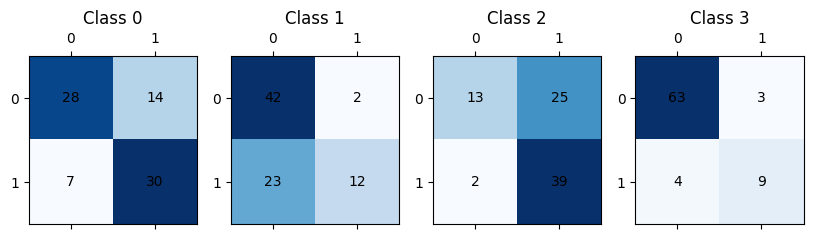

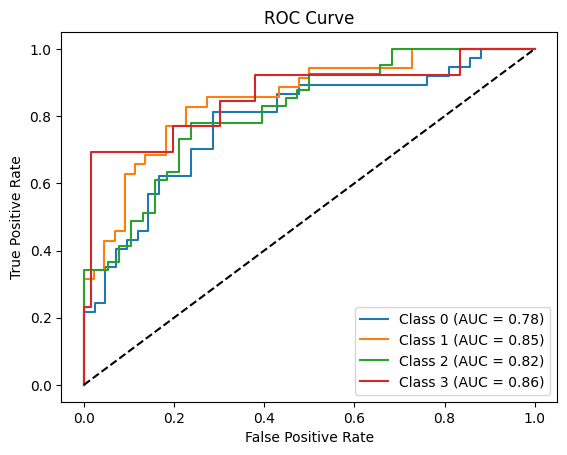

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.26582278481012656
individual results (array([0.625     , 0.91666667, 0.61904762, 0.        ]), array([0.67567568, 0.31428571, 0.95121951, 0.        ]), array([0.64935065, 0.46808511, 0.75      , 0.        ]), array([37, 35, 41, 13]))
macro results (0.5401785714285714, 0.48529522553912796, 0.466858938933407, None)
micro results (0.6521739130434783, 0.5952380952380952, 0.6224066390041495, None)
sample results (0.6033755274261603, 0.600210970464135, 0.5716094032549728, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.68      0.65        37
           1       0.92      0.31      0.47        35
           2       0.62      0.95      0.75     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

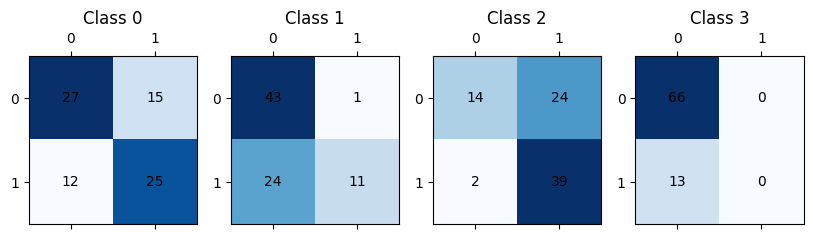

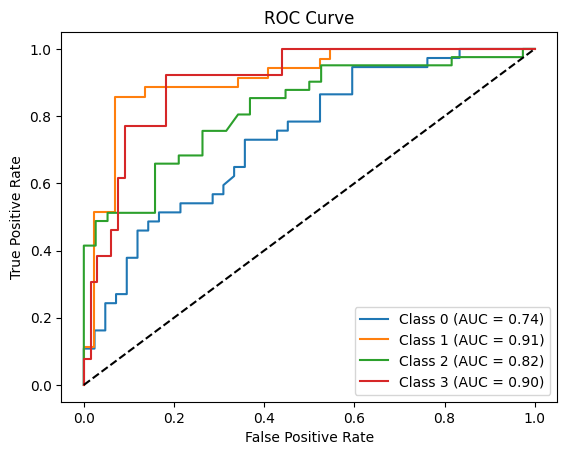

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.63636364, 0.92307692, 0.63265306, 0.        ]), array([0.56756757, 0.34285714, 0.75609756, 0.        ]), array([0.6       , 0.5       , 0.68888889, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5480234051662624, 0.41663056785008, 0.44722222222222224, None)
micro results (0.6736842105263158, 0.5079365079365079, 0.579185520361991, None)
sample results (0.6075949367088608, 0.5453586497890295, 0.5476793248945147, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.57      0.60        37
           1       0.92      0.34      0.50        35
           2       0.63      0.76      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

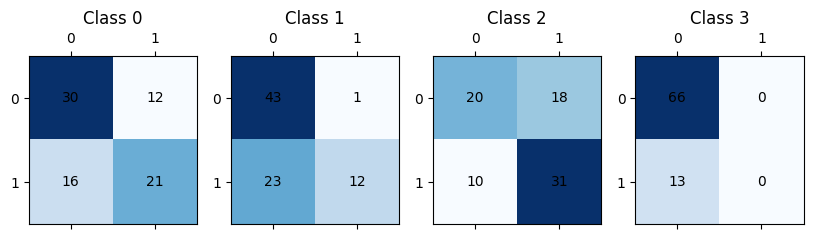

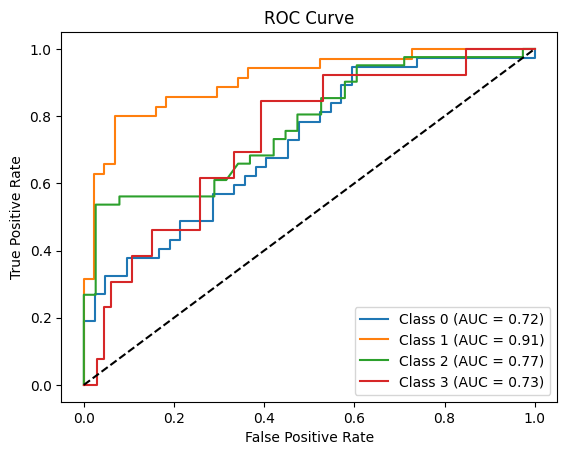

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.61538462, 0.85714286, 0.69565217, 0.        ]), array([0.64864865, 0.51428571, 0.7804878 , 0.        ]), array([0.63157895, 0.64285714, 0.73563218, 0.        ]), array([37, 35, 41, 13]))
macro results (0.542044911610129, 0.48585554195310293, 0.5025170685334025, None)
micro results (0.6981132075471698, 0.5873015873015873, 0.6379310344827586, None)
sample results (0.6265822784810127, 0.620253164556962, 0.5932489451476792, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.65      0.63        37
           1       0.86      0.51      0.64        35
           2       0.70      0.78      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

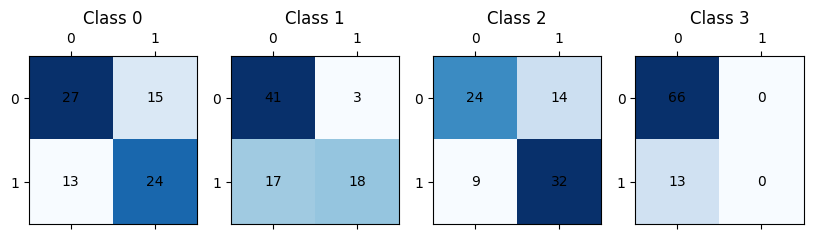

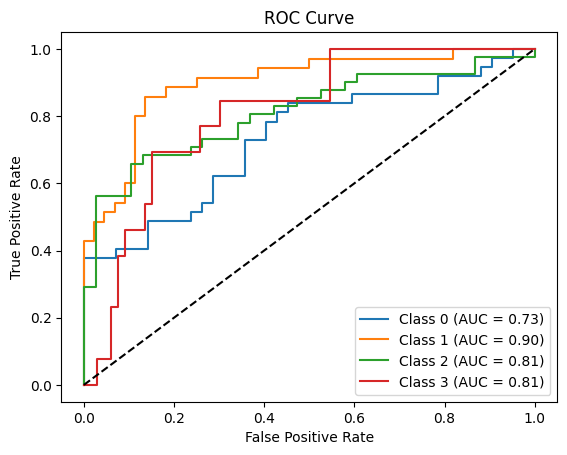

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  5 embedding name: glove basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.16455696202531644
individual results (array([0.515625  , 0.9375    , 0.55384615, 0.        ]), array([0.89189189, 0.42857143, 0.87804878, 0.        ]), array([0.65346535, 0.58823529, 0.67924528, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5017427884615384, 0.5496280252377813, 0.48023648091779203, None)
micro results (0.5793103448275863, 0.6666666666666666, 0.6199261992619925, None)
sample results (0.540084388185654, 0.6550632911392406, 0.5669680530440023, None)
classification report               precision    recall  f1-score   support

           0       0.52      0.89      0.65        37
           1       0.94      0.43      0.59        35
           2       0.55      0.88      0.68   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

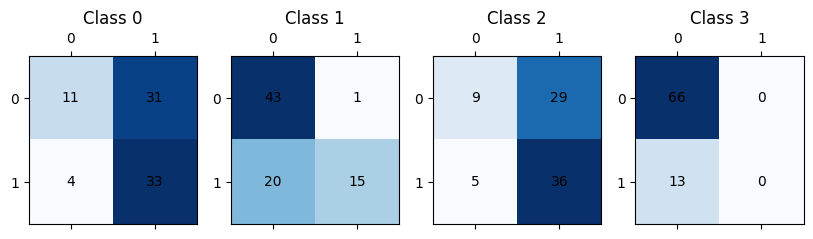

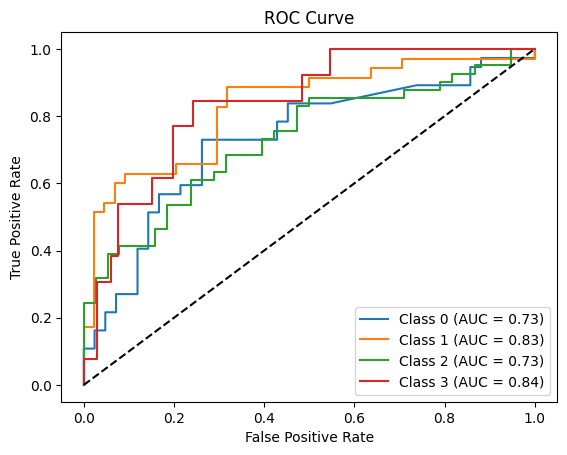

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.67567568, 0.88235294, 0.61666667, 0.88888889]), array([0.67567568, 0.42857143, 0.90243902, 0.61538462]), array([0.67567568, 0.57692308, 0.73267327, 0.72727273]), array([37, 35, 41, 13]))
macro results (0.7658960431019254, 0.6555176860054909, 0.6781361867995532, None)
micro results (0.6910569105691057, 0.6746031746031746, 0.6827309236947791, None)
sample results (0.689873417721519, 0.7257383966244725, 0.6759493670886075, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.68      0.68        37
           1       0.88      0.43      0.58        35
           2       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


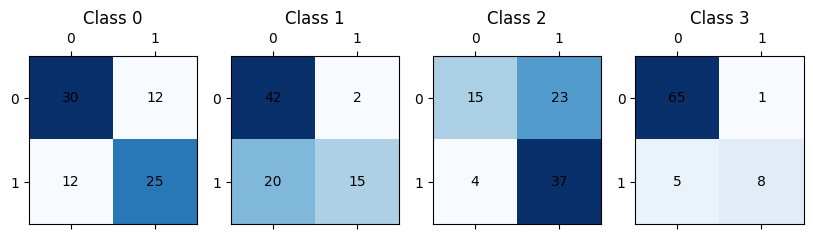

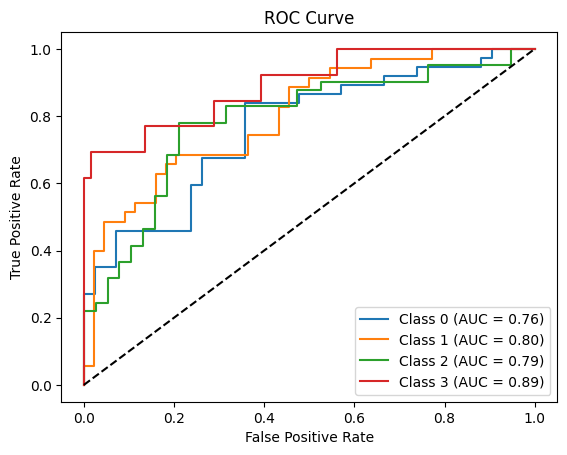

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  7 embedding name: use
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.46835443037974683
individual results (array([0.62790698, 0.92592593, 0.8       , 1.        ]), array([0.72972973, 0.71428571, 0.7804878 , 0.15384615]), array([0.675     , 0.80645161, 0.79012346, 0.26666667]), array([37, 35, 41, 13]))
macro results (0.8384582256675279, 0.5945873506849116, 0.634560434090004, None)
micro results (0.7678571428571429, 0.6825396825396826, 0.7226890756302521, None)
sample results (0.6772151898734177, 0.6824894514767933, 0.662326702833032, None)
classification report               precision    recall  f1-score   support

           0       0.63      0.73      0.68        37
           1       0.93      0.71      0.81        35
           2       0.80      0.78      0.79        41
  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


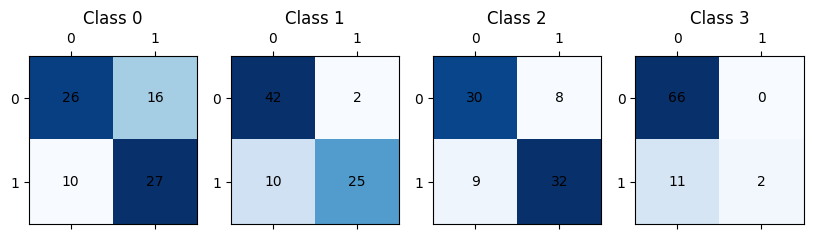

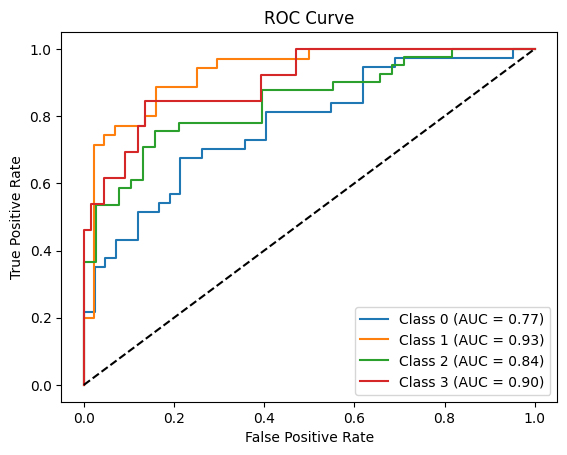

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.63265306, 0.81481481, 0.65454545, 0.75      ]), array([0.83783784, 0.62857143, 0.87804878, 0.69230769]), array([0.72093023, 0.70967742, 0.75      , 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7130033326461898, 0.7591914348011908, 0.7251519129782444, None)
micro results (0.6853146853146853, 0.7777777777777778, 0.728624535315985, None)
sample results (0.689873417721519, 0.8048523206751054, 0.7176009644364074, None)
classification report               precision    recall  f1-score   support

           0       0.63      0.84      0.72        37
           1       0.81      0.63      0.71        35
           2       0.65      0.8

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


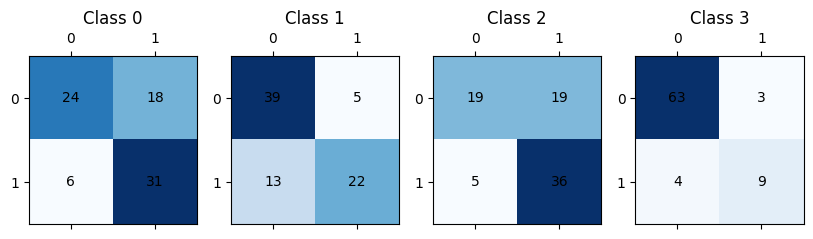

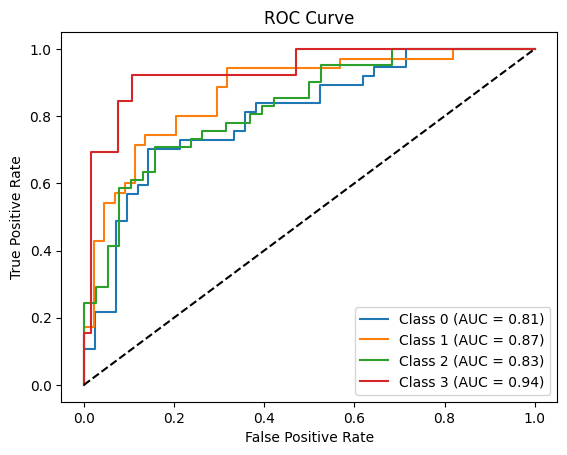

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.27848101265822783
individual results (array([0.61538462, 0.81481481, 0.625     , 0.64285714]), array([0.86486486, 0.62857143, 0.97560976, 0.69230769]), array([0.71910112, 0.70967742, 0.76190476, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6745141432641433, 0.7903384354603866, 0.7143374928804431, None)
micro results (0.6560509554140127, 0.8174603174603174, 0.7279151943462898, None)
sample results (0.6772151898734177, 0.8449367088607594, 0.7213984327908378, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.86      0.72        37
           1       0.81      0.63      0.71        35
           2       0.62  

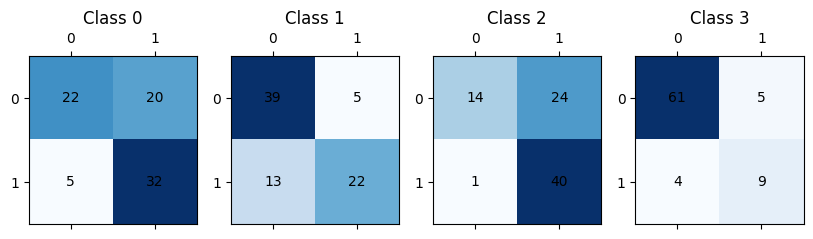

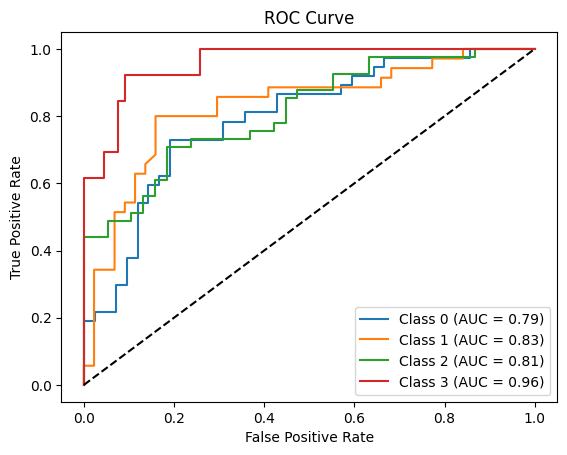

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.71428571, 0.79310345, 0.7826087 , 0.71428571]), array([0.67567568, 0.65714286, 0.87804878, 0.76923077]), array([0.69444444, 0.71875   , 0.82758621, 0.74074074]), array([37, 35, 41, 13]))
macro results (0.7510708931248662, 0.7450245206342767, 0.7453803480204343, None)
micro results (0.7580645161290323, 0.746031746031746, 0.752, None)
sample results (0.7679324894514769, 0.7784810126582279, 0.7451476793248943, None)
classification report               precision    recall  f1-score   support

           0       0.71      0.68      0.69        37
           1       0.79      0.66      0.72        35
           2       0.78      0.88      0.83        41
   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


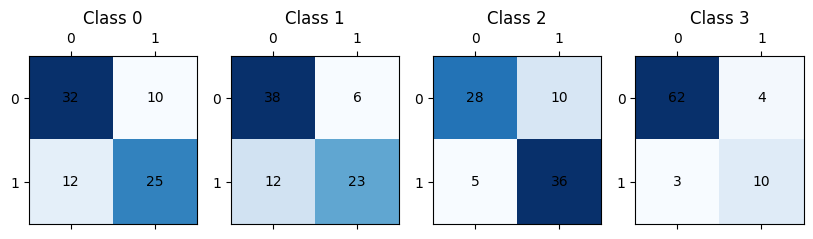

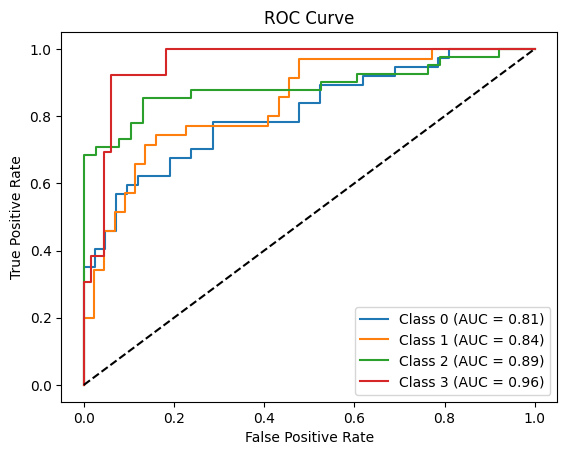

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.63829787, 0.77777778, 0.67272727, 0.81818182]), array([0.81081081, 0.6       , 0.90243902, 0.69230769]), array([0.71428571, 0.67741935, 0.77083333, 0.75      ]), array([37, 35, 41, 13]))
macro results (0.7267461852568237, 0.7513893818771868, 0.7281346006144394, None)
micro results (0.6928571428571428, 0.7698412698412699, 0.7293233082706767, None)
sample results (0.7088607594936709, 0.8037974683544303, 0.7181434599156117, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.81      0.71        37
           1       0.78      0.60      0.68        35
           2       0.67 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


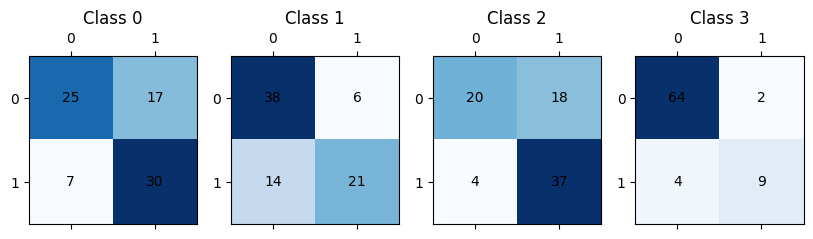

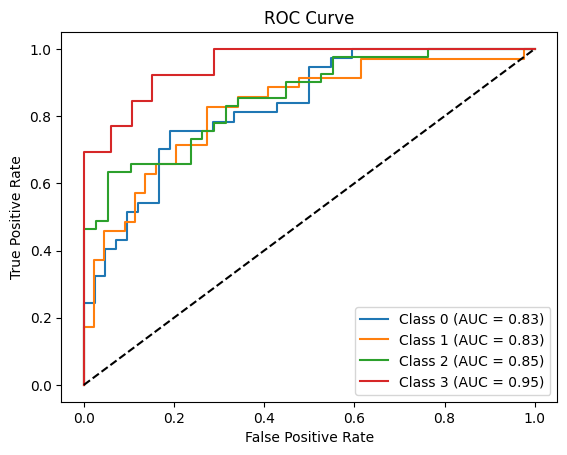

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.26582278481012656
individual results (array([0.65957447, 0.67741935, 0.61904762, 0.75      ]), array([0.83783784, 0.6       , 0.95121951, 0.69230769]), array([0.73809524, 0.63636364, 0.75      , 0.72      ]), array([37, 35, 41, 13]))
macro results (0.6765103604928587, 0.770341260585163, 0.7111147186147185, None)
micro results (0.6535947712418301, 0.7936507936507936, 0.7168458781362007, None)
sample results (0.6751054852320676, 0.8175105485232069, 0.6994575045207956, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.84      0.74        37
           1       0.68      0.60      0.64        35
           2       0.6

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


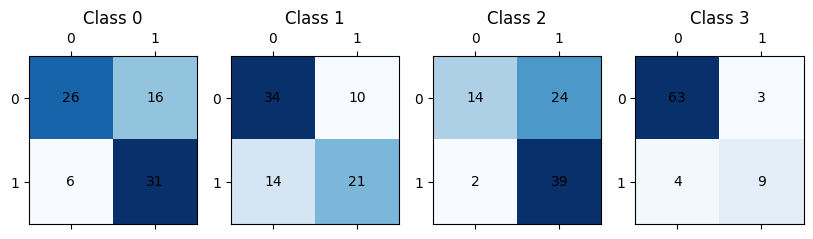

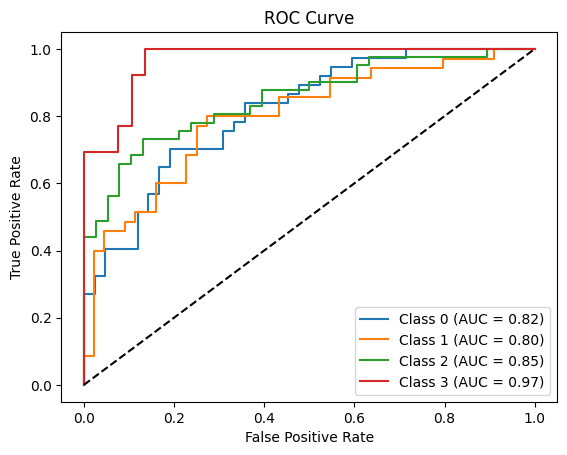

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.75862069, 0.90909091, 0.625     , 0.        ]), array([0.59459459, 0.57142857, 0.73170732, 0.        ]), array([0.66666667, 0.70175439, 0.6741573 , 0.        ]), array([37, 35, 41, 13]))
macro results (0.5731778996865203, 0.47443262077408416, 0.5106445890005914, None)
micro results (0.7272727272727273, 0.5714285714285714, 0.64, None)
sample results (0.6329113924050632, 0.5812236286919831, 0.5755274261603374, None)
classification report               precision    recall  f1-score   support

           0       0.76      0.59      0.67        37
           1       0.91      0.57      0.70        35
           2       0.62      0.73      0.67  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

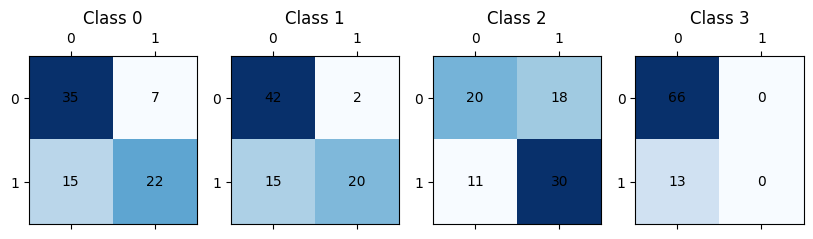

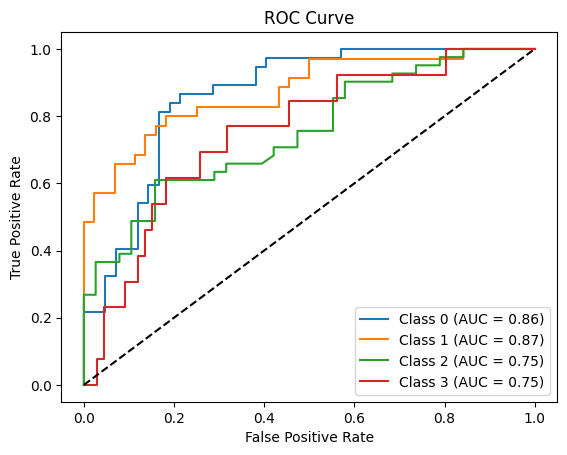

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.65909091, 0.73913043, 0.62903226, 0.69230769]), array([0.78378378, 0.48571429, 0.95121951, 0.69230769]), array([0.71604938, 0.5862069 , 0.75728155, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.6798903235614315, 0.7282563185002209, 0.6879613812433809, None)
micro results (0.6619718309859155, 0.746031746031746, 0.7014925373134329, None)
sample results (0.681434599156118, 0.7964135021097046, 0.7007233273056057, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.78      0.72        37
           1       0.74      0.49      0.59        35
           2   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


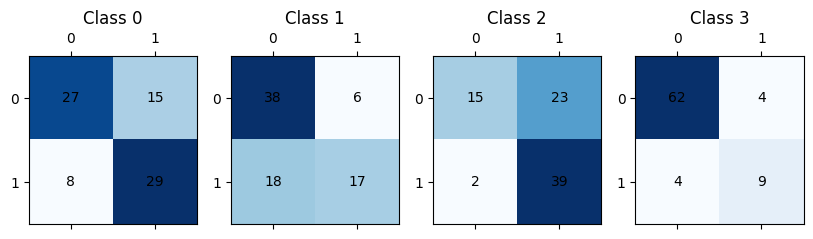

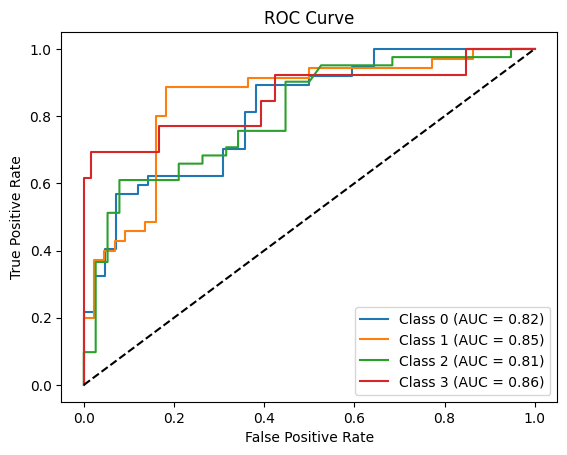

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.27848101265822783
individual results (array([0.66666667, 0.70588235, 0.6       , 0.64285714]), array([0.75675676, 0.34285714, 0.95121951, 0.69230769]), array([0.70886076, 0.46153846, 0.73584906, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6538515406162465, 0.6857852760291785, 0.6432287360756431, None)
micro results (0.6376811594202898, 0.6984126984126984, 0.6666666666666666, None)
sample results (0.6603375527426161, 0.7521097046413502, 0.6649789029535864, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.76      0.71        37
           1       0.71      0.34      0.46        35
           

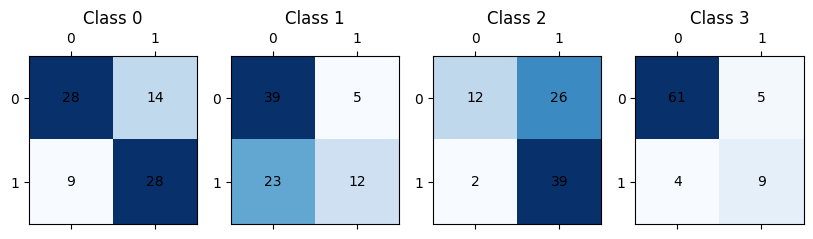

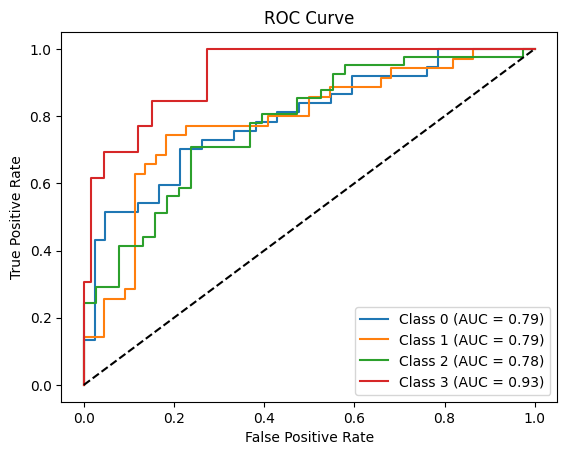

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.75862069, 0.88      , 0.62      , 0.        ]), array([0.59459459, 0.62857143, 0.75609756, 0.        ]), array([0.66666667, 0.73333333, 0.68131868, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5646551724137931, 0.49481589603540826, 0.5203296703296704, None)
micro results (0.7211538461538461, 0.5952380952380952, 0.6521739130434783, None)
sample results (0.6371308016877637, 0.6002109704641351, 0.5936708860759493, None)
classification report               precision    recall  f1-score   support

           0       0.76      0.59      0.67        37
           1       0.88      0.63      0.73        35
           2       0.62      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

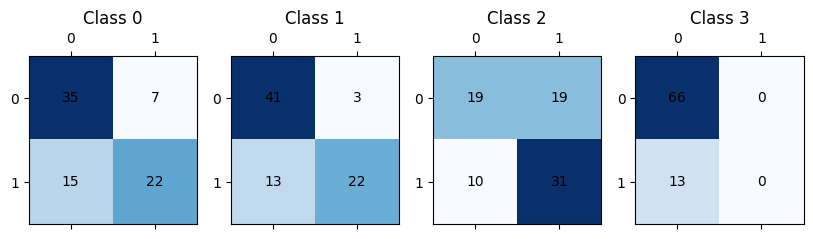

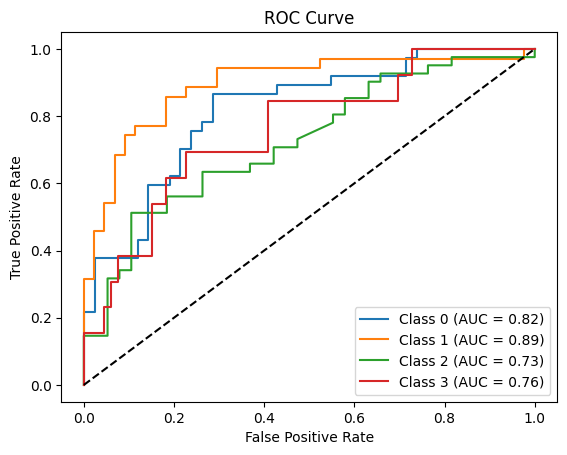

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.725     , 0.85185185, 0.62903226, 0.69230769]), array([0.78378378, 0.65714286, 0.95121951, 0.69230769]), array([0.75324675, 0.74193548, 0.75728155, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.7245479505560151, 0.7711134613573638, 0.7361928707058678, None)
micro results (0.704225352112676, 0.7936507936507936, 0.7462686567164178, None)
sample results (0.7088607594936709, 0.8312236286919832, 0.7329113924050633, None)
classification report               precision    recall  f1-score   support

           0       0.72      0.78      0.75        37
           1       0.85      0.66      0.74        35
           2 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


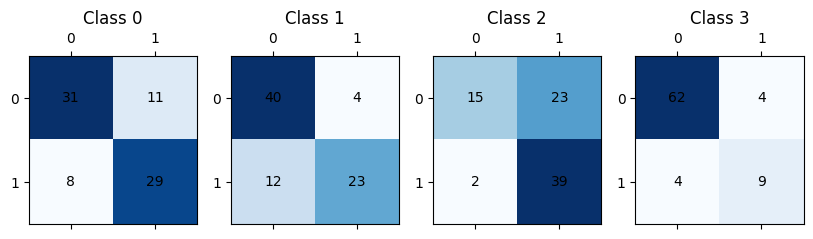

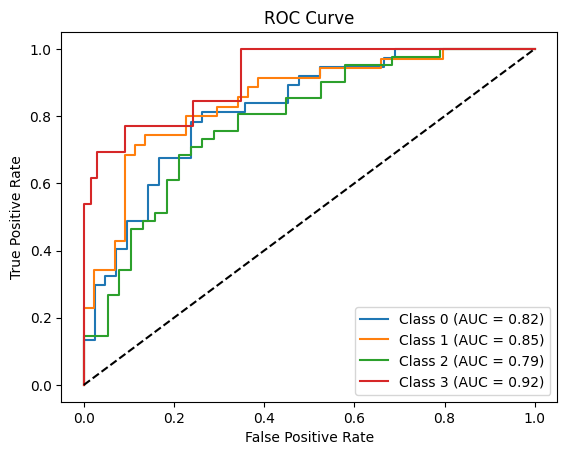

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.69767442, 0.85      , 0.6       , 0.64285714]), array([0.81081081, 0.48571429, 0.95121951, 0.69230769]), array([0.75      , 0.61818182, 0.73584906, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6976328903654485, 0.7350130752569777, 0.6926743853630646, None)
micro results (0.6690140845070423, 0.753968253968254, 0.708955223880597, None)
sample results (0.6751054852320675, 0.7858649789029536, 0.6928270042194093, None)
classification report               precision    recall  f1-score   support

           0       0.70      0.81      0.75        37
           1       0.85      0.49      0.62        35
           2 

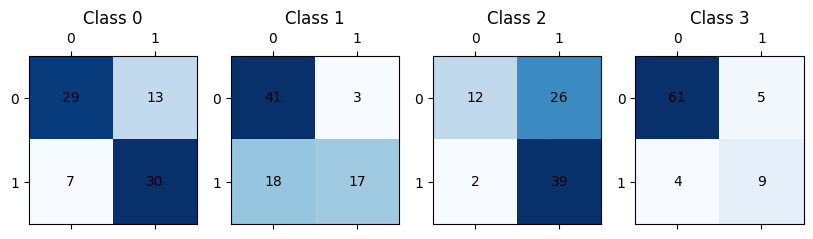

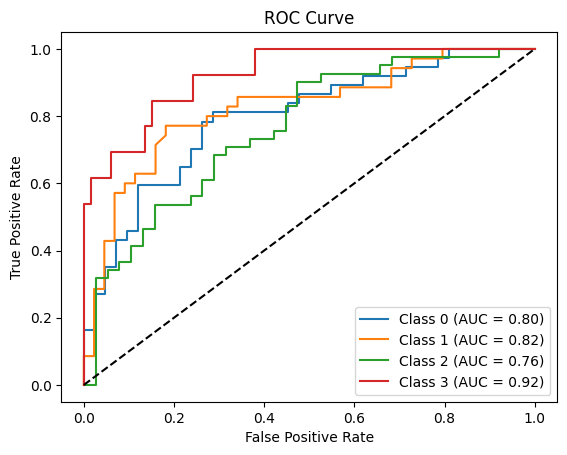

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.675     , 0.84615385, 0.70212766, 0.90909091]), array([0.72972973, 0.62857143, 0.80487805, 0.76923077]), array([0.7012987 , 0.72131148, 0.75      , 0.83333333]), array([37, 35, 41, 13]))
macro results (0.7830931037048059, 0.7331024940781039, 0.7514858775104676, None)
micro results (0.7419354838709677, 0.7301587301587301, 0.736, None)
sample results (0.7383966244725738, 0.7637130801687764, 0.7232067510548521, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.73      0.70        37
           1       0.85      0.63      0.72        35
           2       0.70

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


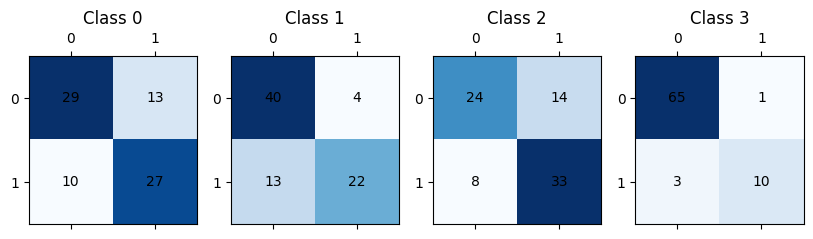

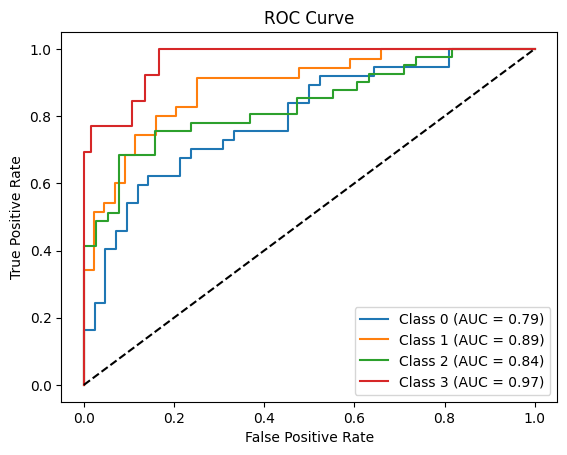

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.4050632911392405
individual results (array([0.68888889, 0.77142857, 0.70588235, 0.75      ]), array([0.83783784, 0.77142857, 0.87804878, 0.69230769]), array([0.75609756, 0.77142857, 0.7826087 , 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7290499533146593, 0.7949057205154766, 0.7575337070140887, None)
micro results (0.7202797202797203, 0.8174603174603174, 0.7657992565055763, None)
sample results (0.7383966244725738, 0.8417721518987342, 0.7565400843881857, None)
classification report               precision    recall  f1-score   support

           0       0.69      0.84      0.76        37
           1       0.77      0.77      0.77   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


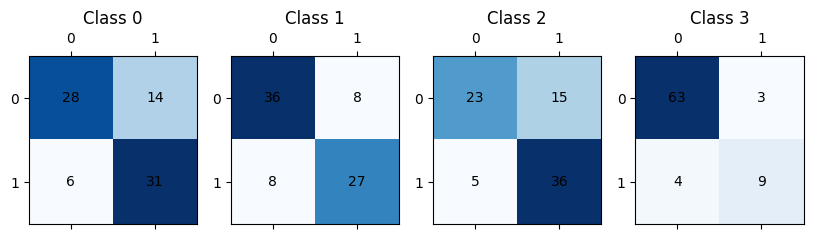

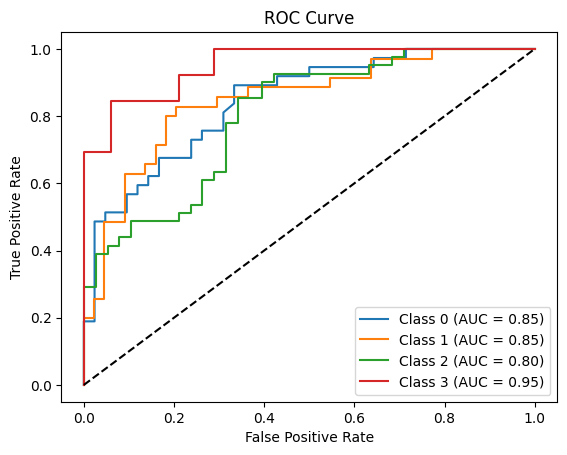

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.6122449 , 0.78787879, 0.625     , 0.64285714]), array([0.81081081, 0.74285714, 0.97560976, 0.69230769]), array([0.69767442, 0.76470588, 0.76190476, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6669952071737786, 0.8053963505183017, 0.7227379323822553, None)
micro results (0.65625, 0.8333333333333334, 0.7342657342657342, None)
sample results (0.6708860759493671, 0.84915611814346, 0.7197106690777576, None)
classification report               precision    recall  f1-score   support

           0       0.61      0.81      0.70        37
           1       0.79      0.74      0.76        35
    

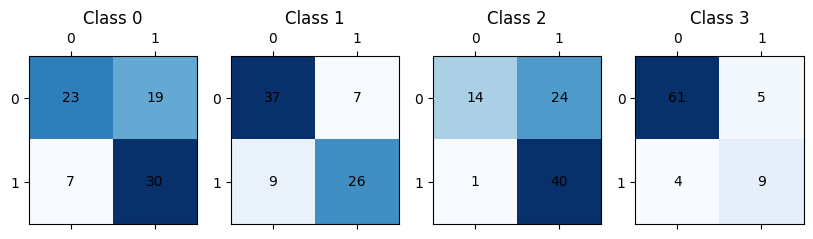

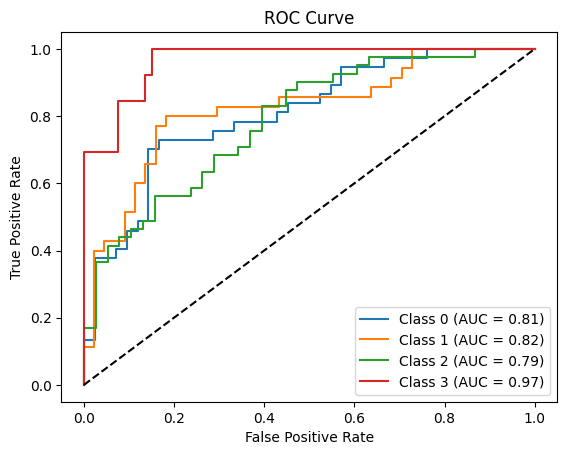

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.65116279, 0.86956522, 0.61702128, 0.        ]), array([0.75675676, 0.57142857, 0.70731707, 0.        ]), array([0.7       , 0.68965517, 0.65909091, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5344373211711809, 0.5088756003390149, 0.5121865203761755, None)
micro results (0.6814159292035398, 0.6111111111111112, 0.6443514644351465, None)
sample results (0.6118143459915613, 0.6107594936708861, 0.5855334538878842, None)
classification report               precision    recall  f1-score   support

           0       0.65      0.76      0.70        37
           1       0.87      0.57      0.69        35
           2       0.62  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

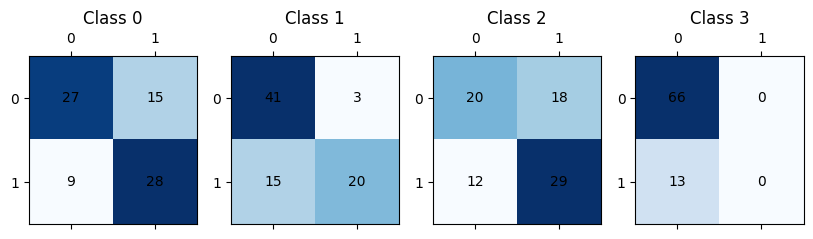

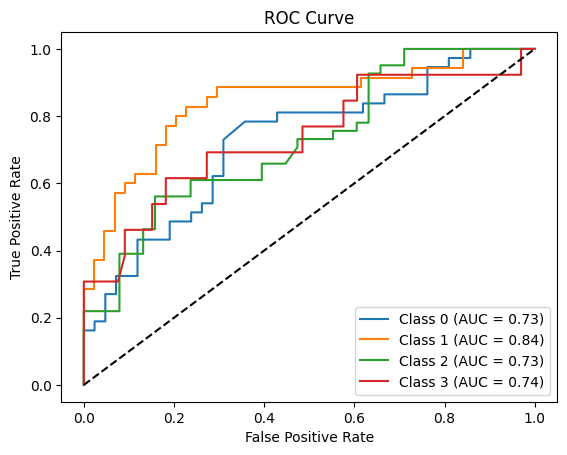

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.27848101265822783
individual results (array([0.64444444, 0.73333333, 0.6       , 0.69230769]), array([0.78378378, 0.31428571, 0.95121951, 0.69230769]), array([0.70731707, 0.44      , 0.73584906, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.6675213675213676, 0.6853991756430782, 0.6438684555205494, None)
micro results (0.6376811594202898, 0.6984126984126984, 0.6666666666666666, None)
sample results (0.6603375527426161, 0.760548523206751, 0.6682338758288126, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.78      0.71        37
           1       0.73      0.31      0.44        35
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


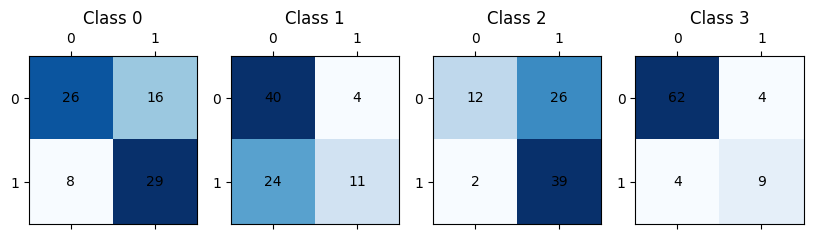

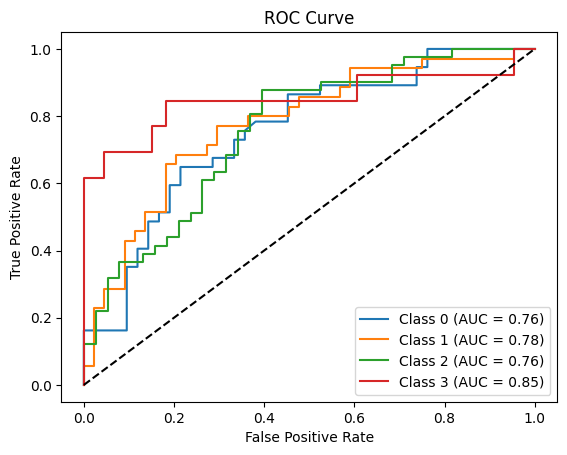

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.26582278481012656
individual results (array([0.61702128, 0.8       , 0.6       , 0.64285714]), array([0.78378378, 0.11428571, 0.95121951, 0.69230769]), array([0.69047619, 0.2       , 0.73584906, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6649696048632219, 0.6353991756430781, 0.5732479784366576, None)
micro results (0.6183206106870229, 0.6428571428571429, 0.6303501945525293, None)
sample results (0.6350210970464135, 0.7025316455696202, 0.6329113924050632, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.78      0.69        37
           1       0.80      0.11      0.20        35
    

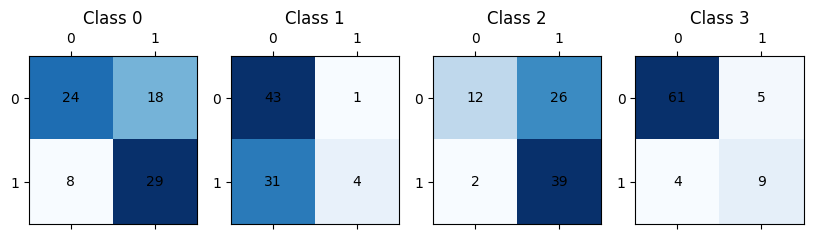

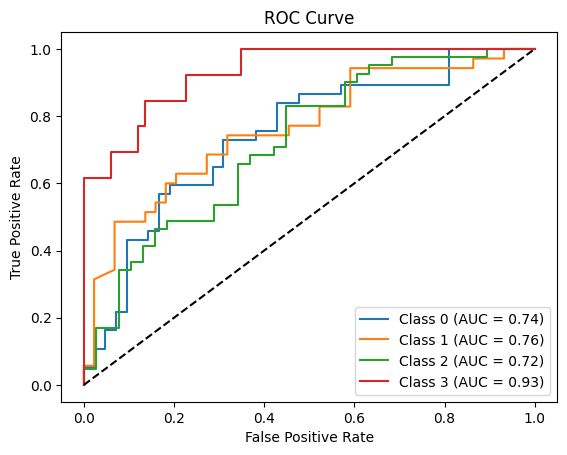

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.5189873417721519
individual results (array([0.72972973, 0.89655172, 0.85      , 0.66666667]), array([0.72972973, 0.74285714, 0.82926829, 0.46153846]), array([0.72972973, 0.8125    , 0.83950617, 0.54545455]), array([37, 35, 41, 13]))
macro results (0.7857370301335819, 0.6908484067020653, 0.7317976120059454, None)
micro results (0.808695652173913, 0.7380952380952381, 0.7717842323651453, None)
sample results (0.7721518987341772, 0.7742616033755275, 0.7447257383966244, None)
classification report               precision    recall  f1-score   support

           0       0.73      0.73      0.73        37
           1       0.90      0.74      0.81       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


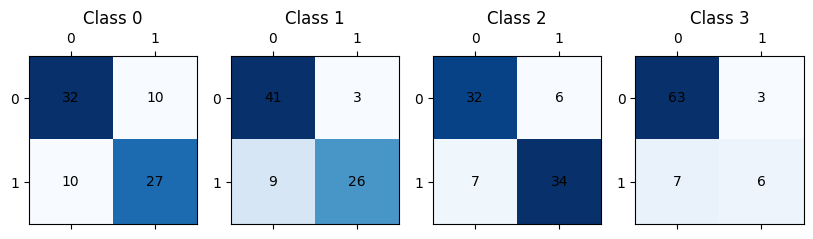

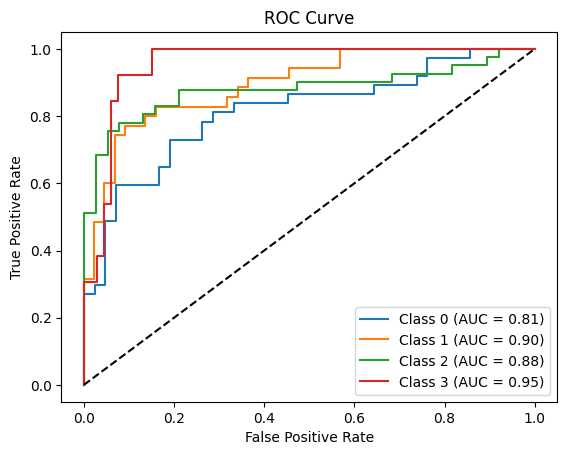

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.35443037974683544
individual results (array([0.67391304, 0.86666667, 0.65454545, 0.9       ]), array([0.83783784, 0.74285714, 0.87804878, 0.69230769]), array([0.74698795, 0.8       , 0.75      , 0.7826087 ]), array([37, 35, 41, 13]))
macro results (0.7737812911725955, 0.7877628633726195, 0.7698991618648507, None)
micro results (0.723404255319149, 0.8095238095238095, 0.7640449438202246, None)
sample results (0.7383966244725738, 0.8459915611814346, 0.7531645569620252, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.84      0.75        37
           1       0.87  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


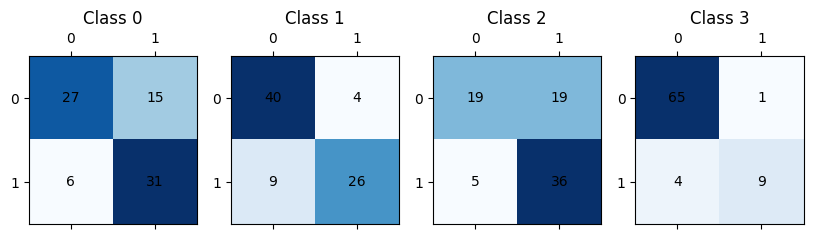

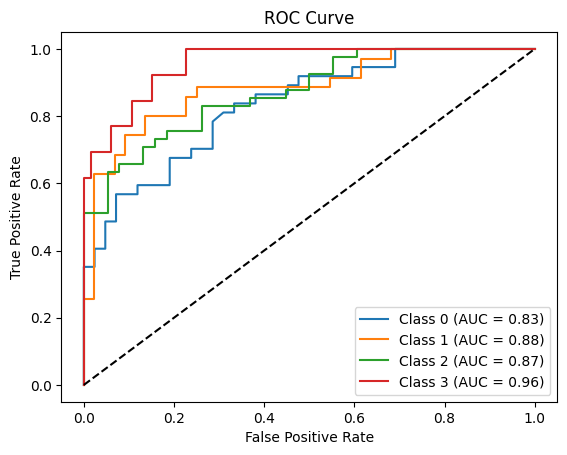

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1},
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.66666667, 0.85185185, 0.625     , 0.75      ]), array([0.86486486, 0.65714286, 0.97560976, 0.69230769]), array([0.75294118, 0.74193548, 0.76190476, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7233796296296297, 0.7974812926032437, 0.7441953555615795, None)
micro results (0.6887417218543046, 0.8253968253968254, 0.7509025270758122, None)
sample results (0.7194092827004219, 0.8533755274261604, 0.7429174201326099, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.86      0.75        37
           1       0.

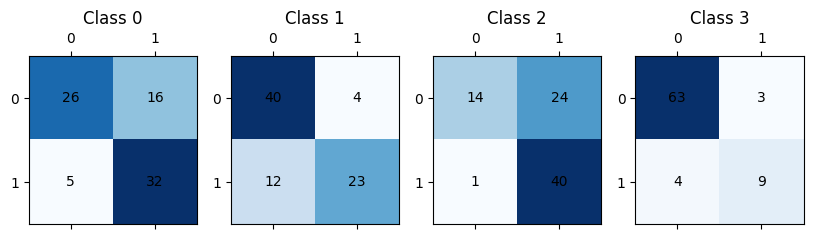

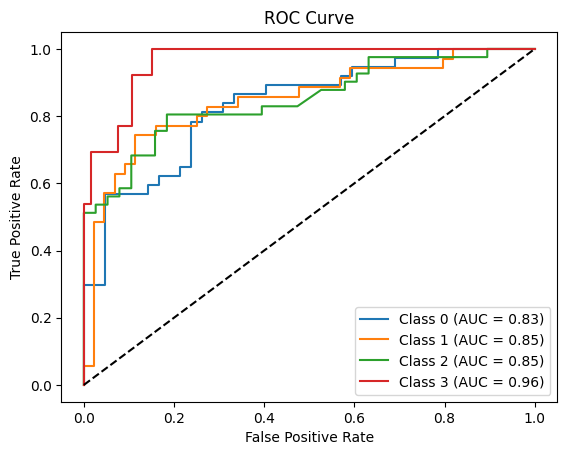

In [127]:
# m with rbf kernel
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score, classification_report
from sklearn.metrics import roc_curve, auc

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

svm = SVC(kernel='rbf', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)
n =0
for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
  try:
    multi_svm.fit(train_embedding, trainCategories)
    print(f'The {multi_svm}  {n} embedding name: {name}' )
    print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )

    # Get the predicted categories for the test data
    y_pred = multi_svm.predict(test_embedding)

    print('individual results', precision_recall_fscore_support(testCategories,y_pred) )
    print('macro results', precision_recall_fscore_support(testCategories,y_pred, average='macro') )
    print('micro results', precision_recall_fscore_support(testCategories,y_pred, average='micro') )
    print('sample results', precision_recall_fscore_support(testCategories,y_pred, average='samples') )
    print('classification report', classification_report(testCategories,y_pred))

    # Compute the confusion matrix for each class
    cm = multilabel_confusion_matrix(testCategories, y_pred)

    # Invert the true positives and true negatives in the confusion matrix
    #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

    # Plot the confusion matrix for each class
    fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
    for i, c in enumerate(cm):
        ax = axes[i]
        ax.matshow(c, cmap=plt.cm.Blues)
        ax.set_title(f'Class {i}')
        for j in range(c.shape[0]):
            for k in range(c.shape[1]):
                ax.text(k, j, str(c[j, k]), va='center', ha='center')
    plt.show()

    # Get the predicted probabilities for the positive class
    y_score = multi_svm.predict_proba(test_embedding)

    # Compute the ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(testCategories.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(testCategories[:, i], y_score[i][:, 1]) # we can change between 0 an 1 at the rigth to get the inverse, having the rock curve over or under the 45% axis
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot the ROC curve for each class
    for i in range(testCategories.shape[1]):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

  except:
    print('error')
    continue
  finally:
    n=n+1

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4050632911392405
individual results (array([0.69047619, 0.83333333, 0.73333333, 0.72727273]), array([0.78378378, 0.71428571, 0.80487805, 0.61538462]), array([0.73417722, 0.76923077, 0.76744186, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7461038961038962, 0.7295830405586504, 0.7343791278881064, None)
micro results (0.7421875, 0.753968253968254, 0.7480314960629921, None)
sample results (0.7531645569620253, 0.8059071729957805, 0.741350210970464, None)
classification report               precision    recall  f1-score   support

           0       0.69      0.78      0.73        37
           1       0.83      0.71      0.77        35
           2  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


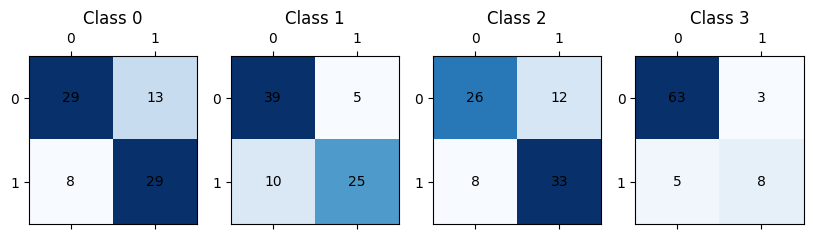

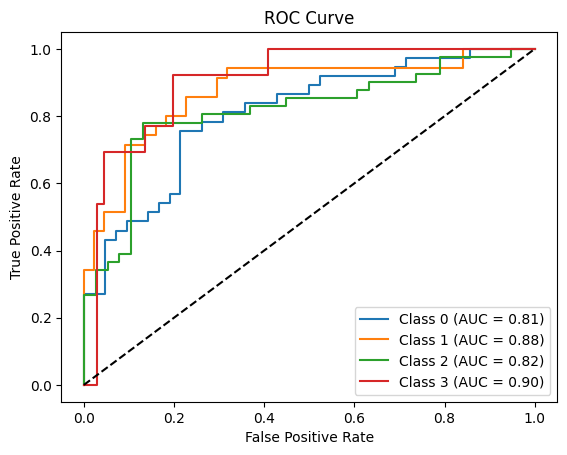

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.43037974683544306
individual results (array([0.70731707, 0.83333333, 0.75      , 0.75      ]), array([0.78378378, 0.71428571, 0.80487805, 0.69230769]), array([0.74358974, 0.76923077, 0.77647059, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7601626016260162, 0.7488138097894197, 0.7523227752639516, None)
micro results (0.7559055118110236, 0.7619047619047619, 0.758893280632411, None)
sample results (0.7679324894514769, 0.8185654008438817, 0.7582278481012658, None)
classification report               precision    recall  f1-score   support

           0       0.71      0.78      0.74        37
           1       0.83      0.71      0.77        35

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


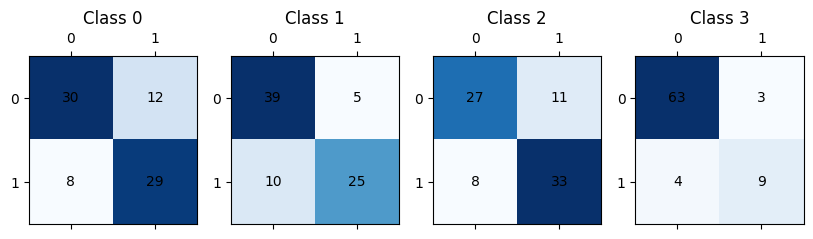

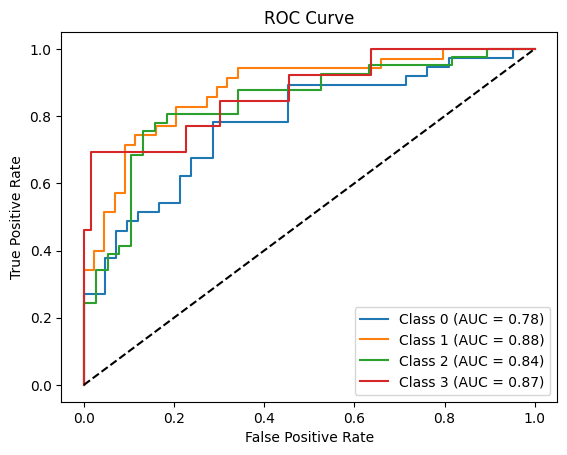

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4050632911392405
individual results (array([0.63157895, 0.90909091, 0.72916667, 0.66666667]), array([0.64864865, 0.57142857, 0.85365854, 0.30769231]), array([0.64      , 0.70175439, 0.78651685, 0.42105263]), array([37, 35, 41, 13]))
macro results (0.7341257974481658, 0.5953570160887234, 0.637330967869111, None)
micro results (0.7280701754385965, 0.6587301587301587, 0.6916666666666667, None)
sample results (0.6666666666666666, 0.6793248945147679, 0.6510548523206751, None)
classification report               precision    recall  f1-score   support

           0       0.63      0.65      0.64        37
           1       0.91      0.57      0.70        35
           2   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


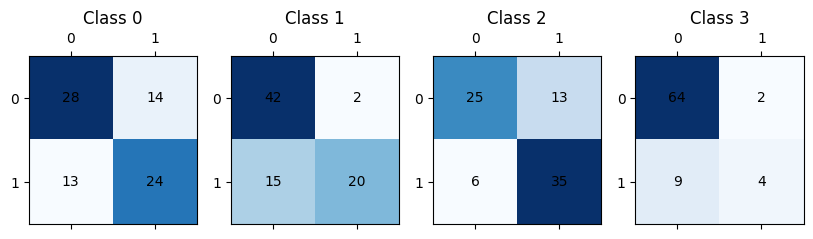

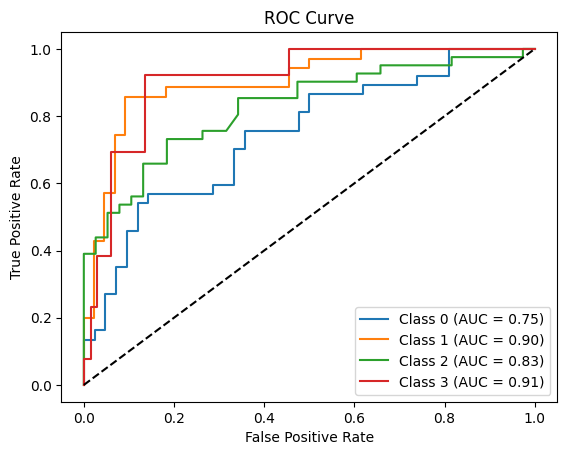

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.62857143, 0.88461538, 0.72727273, 0.33333333]), array([0.59459459, 0.65714286, 0.58536585, 0.07692308]), array([0.61111111, 0.75409836, 0.64864865, 0.125     ]), array([37, 35, 41, 13]))
macro results (0.6434482184482185, 0.4785065955797663, 0.5347145301038744, None)
micro results (0.7216494845360825, 0.5555555555555556, 0.6278026905829597, None)
sample results (0.6160337552742616, 0.5970464135021097, 0.5789029535864978, None)
classification report               precision    recall  f1-score   support

           0       0.63      0.59      0.61        37
           1       0.88      0.66      0.75        35
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


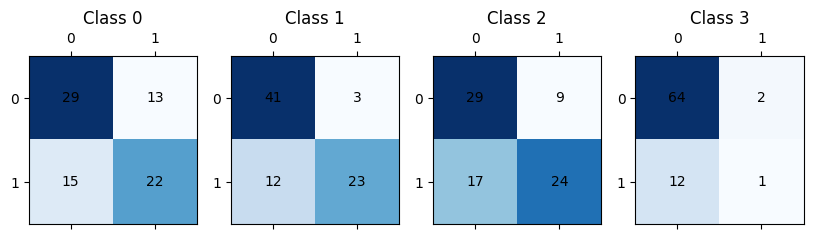

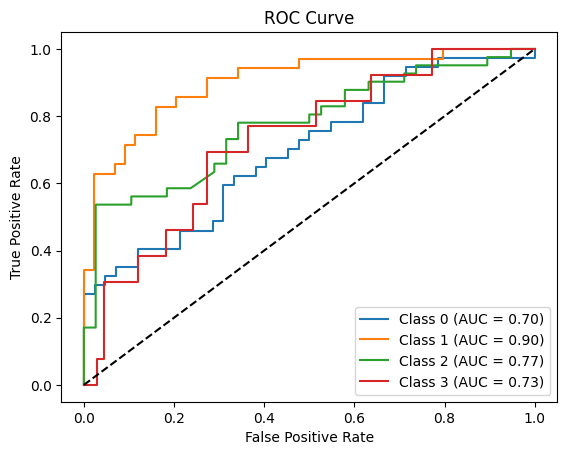

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.625, 0.8  , 0.775, 0.   ]), array([0.67567568, 0.57142857, 0.75609756, 0.        ]), array([0.64935065, 0.66666667, 0.7654321 , 0.        ]), array([37, 35, 41, 13]))
macro results (0.55, 0.5008004520199643, 0.520362353695687, None)
micro results (0.7169811320754716, 0.6031746031746031, 0.6551724137931034, None)
sample results (0.6455696202531646, 0.6392405063291139, 0.6080168776371307, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.68      0.65        37
           1       0.80      0.57      0.67        35
           2       0.78      0.76      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


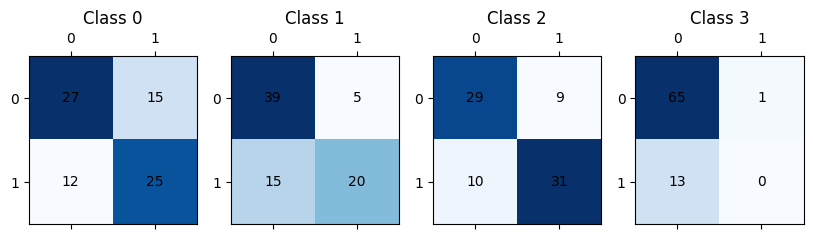

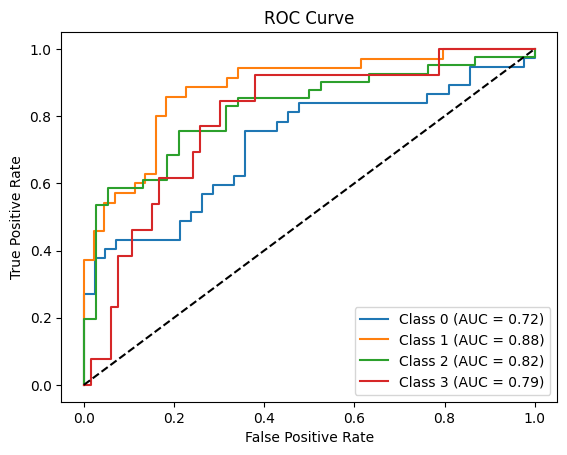

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  5 embedding name: glove basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.25316455696202533
individual results (array([0.64102564, 0.84615385, 0.62790698, 0.42857143]), array([0.67567568, 0.62857143, 0.65853659, 0.46153846]), array([0.65789474, 0.72131148, 0.64285714, 0.44444444]), array([37, 35, 41, 13]))
macro results (0.6359144731237755, 0.6060805377878549, 0.6166269498883822, None)
micro results (0.6557377049180327, 0.6349206349206349, 0.6451612903225806, None)
sample results (0.6265822784810126, 0.6698312236286921, 0.6159132007233271, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.68      0.66        37
           1       0.85      0.63      0.72        35
           2

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


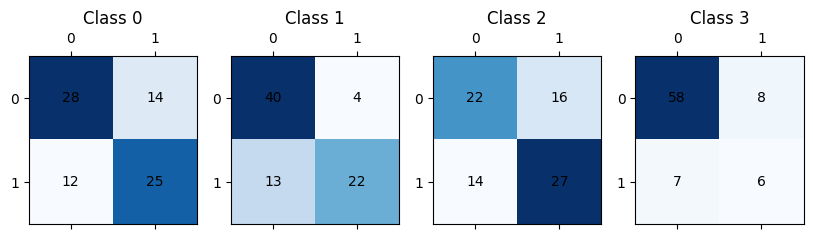

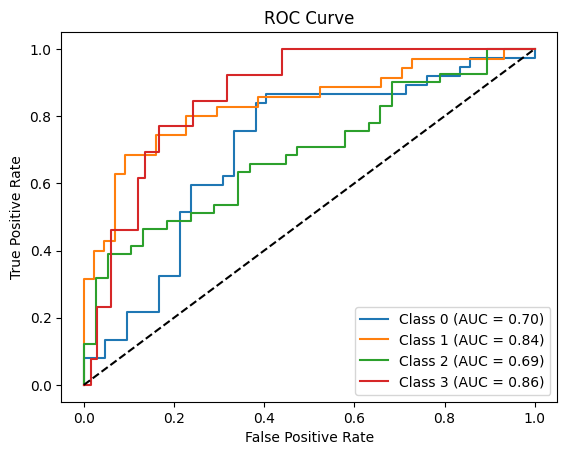

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.65853659, 0.75862069, 0.64444444, 0.76923077]), array([0.72972973, 0.62857143, 0.70731707, 0.76923077]), array([0.69230769, 0.6875    , 0.6744186 , 0.76923077]), array([37, 35, 41, 13]))
macro results (0.7077081221740599, 0.7087122501756649, 0.7058642665474061, None)
micro results (0.6875, 0.6984126984126984, 0.6929133858267716, None)
sample results (0.70042194092827, 0.7310126582278481, 0.6855334538878842, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.73      0.69        37
           1       0.76      0.63      0.69        35
  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


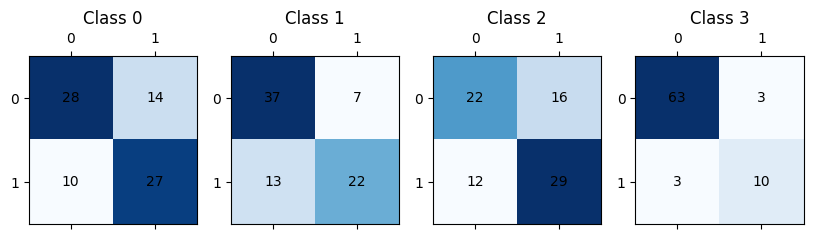

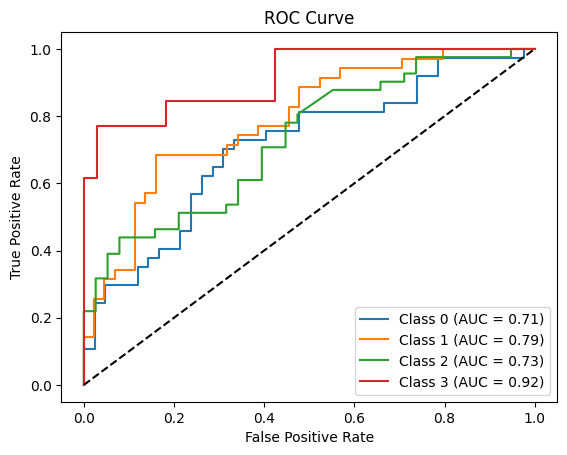

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  7 embedding name: use
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4430379746835443
individual results (array([0.6       , 0.89655172, 0.73809524, 1.        ]), array([0.81081081, 0.74285714, 0.75609756, 0.46153846]), array([0.68965517, 0.8125    , 0.74698795, 0.63157895]), array([37, 35, 41, 13]))
macro results (0.8086617405582923, 0.6928259940455064, 0.7201805178973608, None)
micro results (0.7322834645669292, 0.7380952380952381, 0.7351778656126482, None)
sample results (0.7109704641350211, 0.7521097046413503, 0.7057866184448462, None)
classification report               precision    recall  f1-score   support

           0       0.60      0.81      0.69        37
           1       0.90      0.74      0.81        35
           2       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


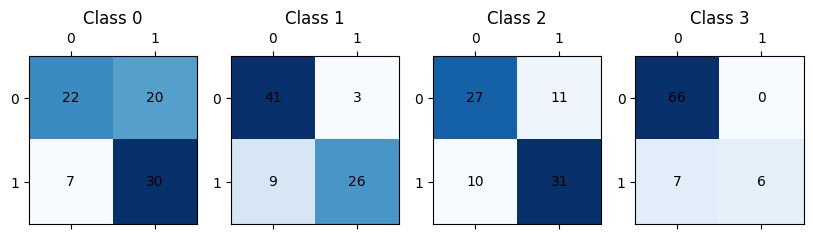

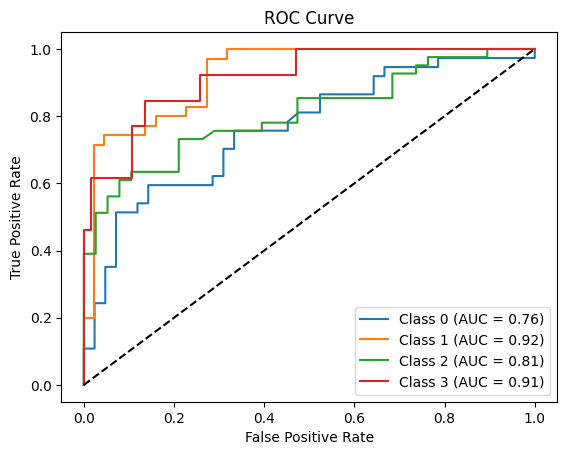

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.5063291139240507
individual results (array([0.65957447, 0.89285714, 0.74418605, 0.75      ]), array([0.83783784, 0.71428571, 0.7804878 , 0.69230769]), array([0.73809524, 0.79365079, 0.76190476, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7616544143634693, 0.7562297623273233, 0.7534126984126984, None)
micro results (0.7461538461538462, 0.7698412698412699, 0.7578125000000001, None)
sample results (0.7341772151898734, 0.7774261603375527, 0.7357444243520193, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.84      0.74        37
           1       0.89      0.71      0.79       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


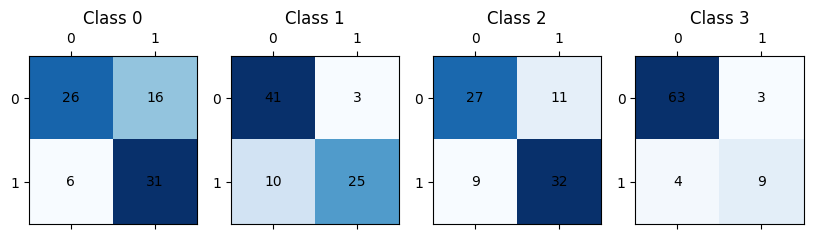

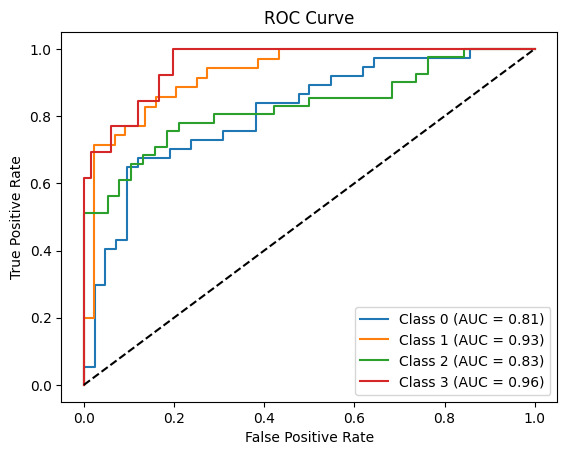

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.46835443037974683
individual results (array([0.64705882, 0.88888889, 0.76744186, 0.75      ]), array([0.89189189, 0.68571429, 0.80487805, 0.69230769]), array([0.75      , 0.77419355, 0.78571429, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7633473932208542, 0.7686979796735895, 0.7574769585253456, None)
micro results (0.7443609022556391, 0.7857142857142857, 0.7644787644787644, None)
sample results (0.7426160337552742, 0.7921940928270044, 0.7412296564195298, None)
classification report               precision    recall  f1-score   support

           0       0.65      0.89      0.75        37
           1       0.89      0.69      0.77  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


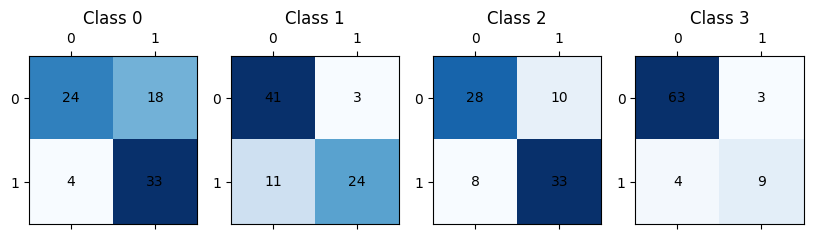

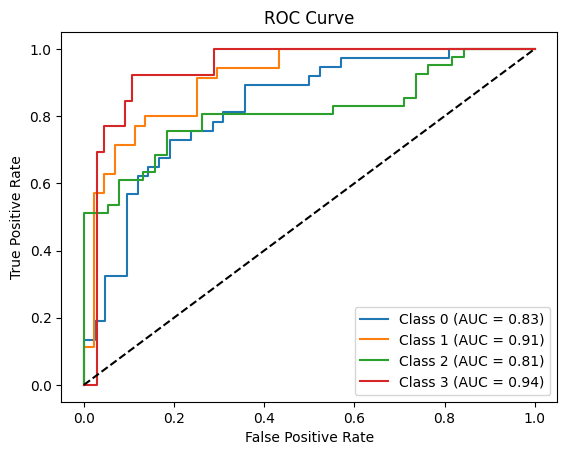

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4430379746835443
individual results (array([0.69230769, 0.78125   , 0.75      , 0.66666667]), array([0.72972973, 0.71428571, 0.87804878, 0.76923077]), array([0.71052632, 0.74626866, 0.80898876, 0.71428571]), array([37, 35, 41, 13]))
macro results (0.7225560897435898, 0.7728237484335045, 0.7450173627091374, None)
micro results (0.7313432835820896, 0.7777777777777778, 0.7538461538461538, None)
sample results (0.7552742616033756, 0.8164556962025317, 0.751054852320675, None)
classification report               precision    recall  f1-score   support

           0       0.69      0.73      0.71        37
           1       0.78      0.71      0.75        35
           

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


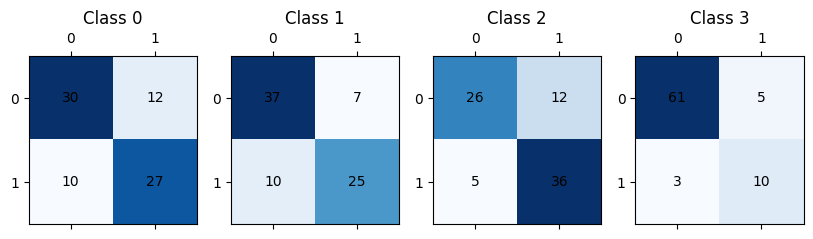

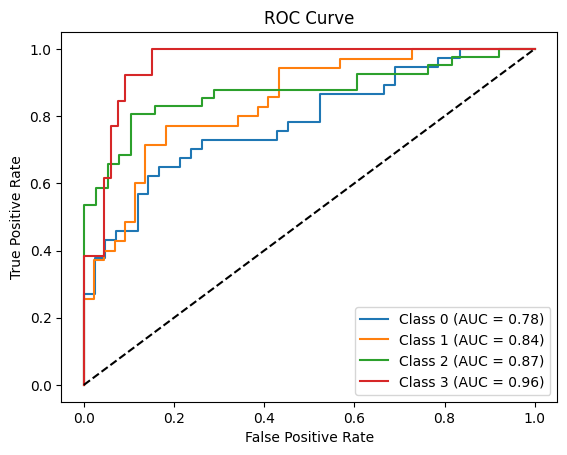

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.64444444, 0.73333333, 0.65454545, 0.81818182]), array([0.78378378, 0.62857143, 0.87804878, 0.69230769]), array([0.70731707, 0.67692308, 0.75      , 0.75      ]), array([37, 35, 41, 13]))
macro results (0.7126262626262627, 0.7456779212876774, 0.7210600375234522, None)
micro results (0.6808510638297872, 0.7619047619047619, 0.7191011235955055, None)
sample results (0.70042194092827, 0.7953586497890296, 0.7071729957805907, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.78      0.71        37
           1       0.73      0.63      0.68   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


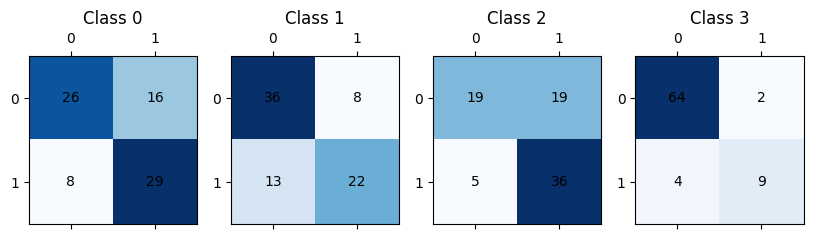

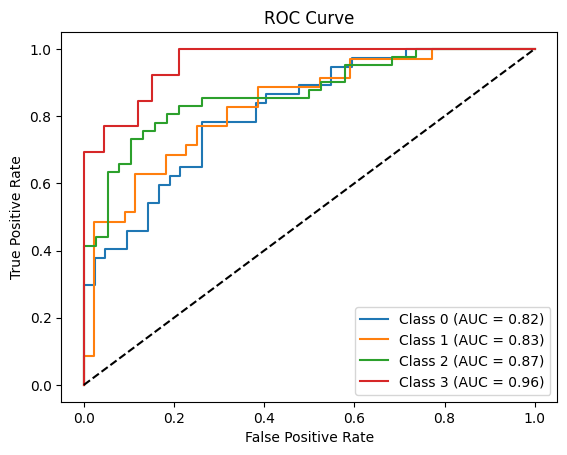

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.67391304, 0.78125   , 0.70588235, 0.76923077]), array([0.83783784, 0.71428571, 0.87804878, 0.76923077]), array([0.74698795, 0.74626866, 0.7826087 , 0.76923077]), array([37, 35, 41, 13]))
macro results (0.7325690414125516, 0.7998507754605315, 0.7612740183516474, None)
micro results (0.7183098591549296, 0.8095238095238095, 0.7611940298507462, None)
sample results (0.7552742616033755, 0.8354430379746836, 0.7548523206751054, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.84      0.75        37
           1       0.78      0.71      0.75

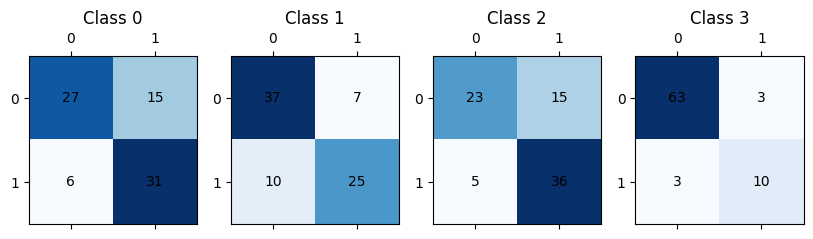

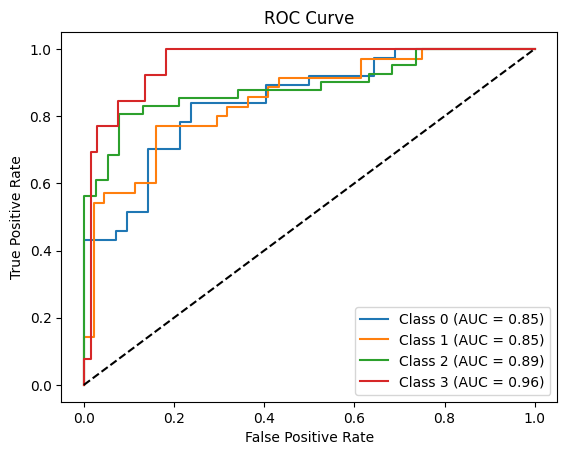

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.80645161, 0.84      , 0.63829787, 0.        ]), array([0.67567568, 0.6       , 0.73170732, 0.        ]), array([0.73529412, 0.7       , 0.68181818, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5711873713109128, 0.5018457481872116, 0.5292780748663102, None)
micro results (0.7378640776699029, 0.6031746031746031, 0.6637554585152838, None)
sample results (0.6434599156118143, 0.609704641350211, 0.5978902953586497, None)
classification report               precision    recall  f1-score   support

           0       0.81      0.68      0.74        37
           1       0.84      0.60      0.70        3

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

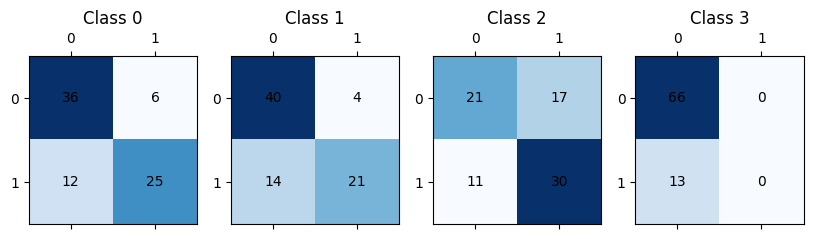

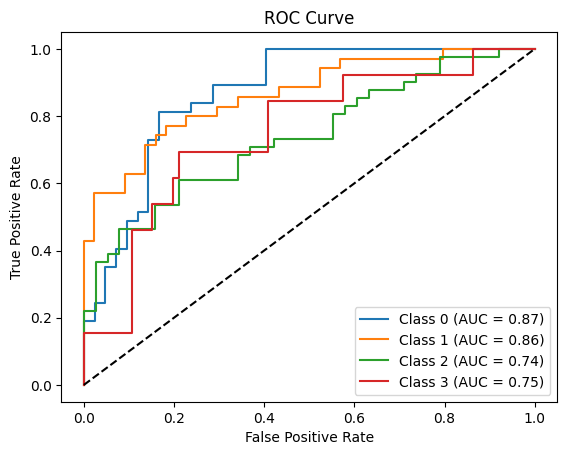

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.6744186 , 0.82758621, 0.6       , 0.69230769]), array([0.78378378, 0.68571429, 0.95121951, 0.69230769]), array([0.725     , 0.75      , 0.73584906, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.6985781259638517, 0.7782563185002209, 0.7257891872278666, None)
micro results (0.6733333333333333, 0.8015873015873016, 0.7318840579710145, None)
sample results (0.7067510548523206, 0.8417721518987342, 0.7354430379746835, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.78      0.72        37
           1       0.83      0.6

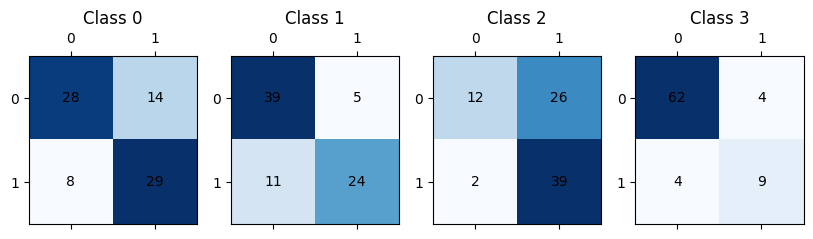

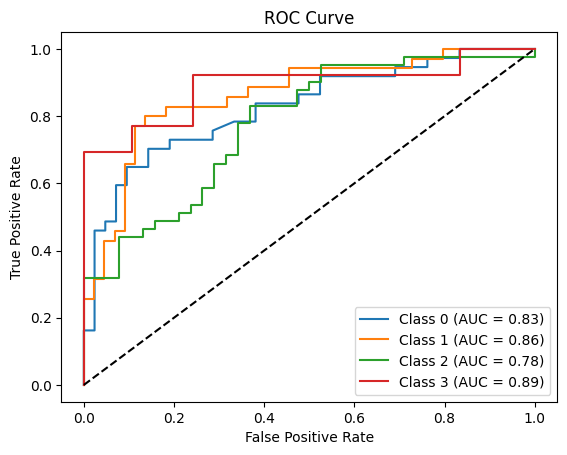

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.72093023, 0.80645161, 0.64705882, 0.8       ]), array([0.83783784, 0.71428571, 0.80487805, 0.61538462]), array([0.775     , 0.75757576, 0.7173913 , 0.69565217]), array([37, 35, 41, 13]))
macro results (0.7436101672476942, 0.7430965540721638, 0.7364048089591567, None)
micro results (0.7185185185185186, 0.7698412698412699, 0.7432950191570882, None)
sample results (0.7088607594936708, 0.8037974683544303, 0.721097046413502, None)
classification report               precision    recall  f1-score   support

           0       0.72      0.84      0.77        37
           1       0.81      0.71 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


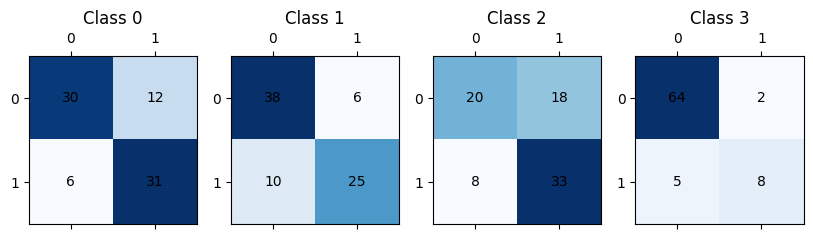

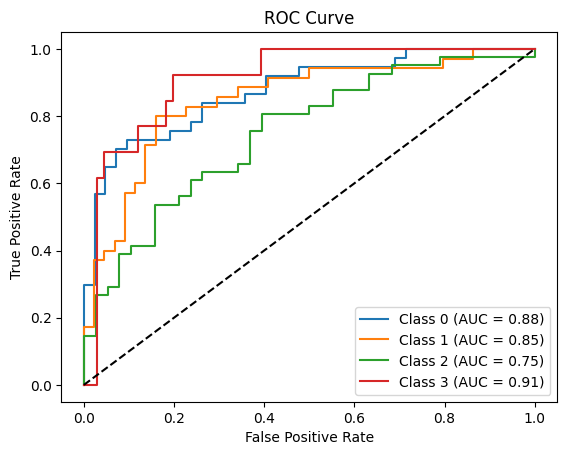

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.73076923, 0.85714286, 0.65957447, 0.        ]), array([0.51351351, 0.68571429, 0.75609756, 0.        ]), array([0.6031746 , 0.76190476, 0.70454545, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5618716389992986, 0.4888313400508522, 0.5174062049062049, None)
micro results (0.7326732673267327, 0.5873015873015873, 0.6519823788546256, None)
sample results (0.620253164556962, 0.5791139240506329, 0.5746835443037974, None)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

classification report               precision    recall  f1-score   support

           0       0.73      0.51      0.60        37
           1       0.86      0.69      0.76        35
           2       0.66      0.76      0.70        41
           3       0.00      0.00      0.00        13

   micro avg       0.73      0.59      0.65       126
   macro avg       0.56      0.49      0.52       126
weighted avg       0.67      0.59      0.62       126
 samples avg       0.62      0.58      0.57       126



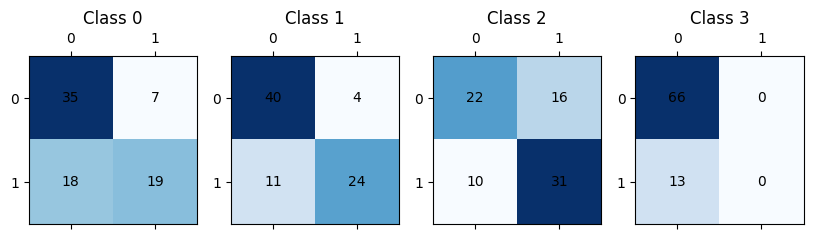

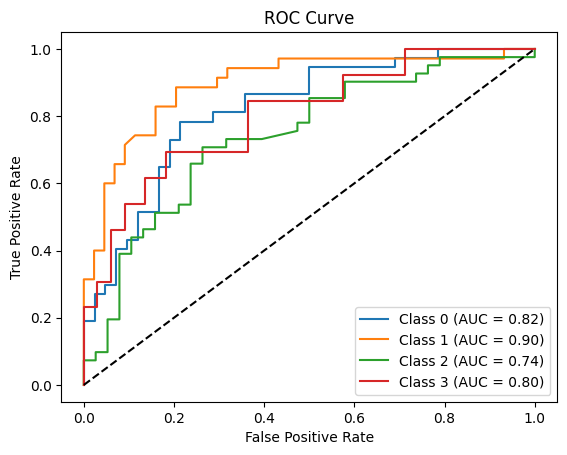

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.69767442, 0.86206897, 0.6       , 0.69230769]), array([0.81081081, 0.71428571, 0.95121951, 0.69230769]), array([0.75      , 0.78125   , 0.73584906, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.7130127691073962, 0.7921559323998348, 0.7398516872278664, None)
micro results (0.6866666666666666, 0.8174603174603174, 0.7463768115942029, None)
sample results (0.7046413502109704, 0.8459915611814347, 0.739662447257384, None)
classification report               precision    recall  f1-score   support

           0       0.70      0.81      0.75        37
           1       0.86      0.7

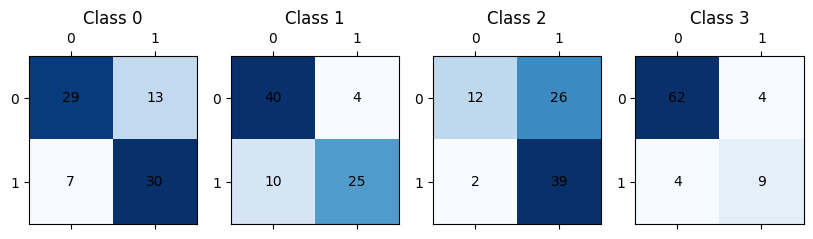

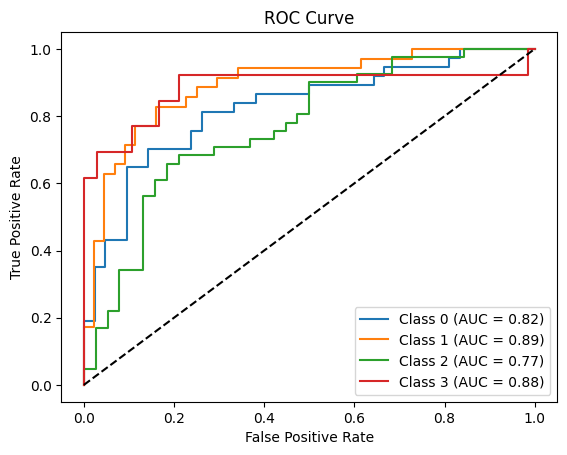

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.73809524, 0.83333333, 0.64      , 0.8       ]), array([0.83783784, 0.71428571, 0.7804878 , 0.61538462]), array([0.78481013, 0.76923077, 0.7032967 , 0.69565217]), array([37, 35, 41, 13]))
macro results (0.7528571428571429, 0.736998993096554, 0.7382474432556987, None)
micro results (0.7272727272727273, 0.7619047619047619, 0.7441860465116279, None)
sample results (0.70042194092827, 0.7753164556962026, 0.7067510548523207, None)
classification report               precision    recall  f1-score   support

           0       0.74      0.84      0.78        37
           1       0.83      0.71  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


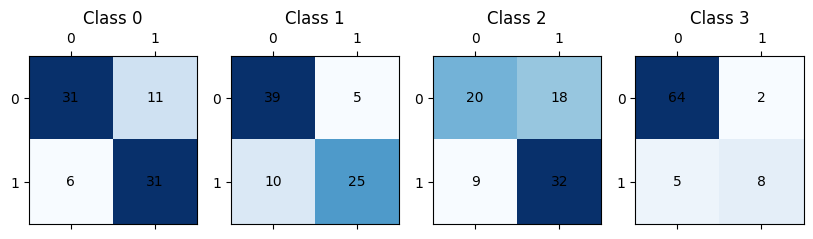

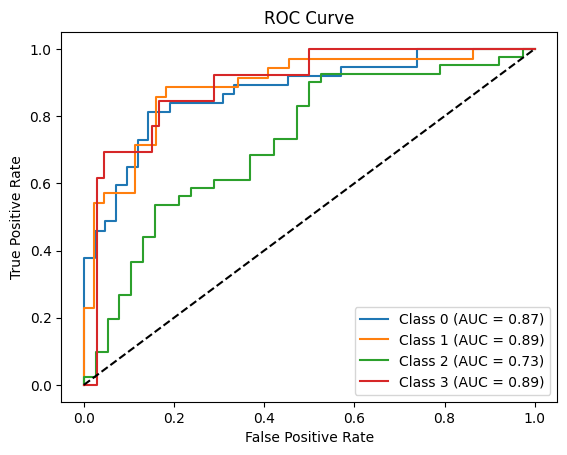

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.66666667, 0.88      , 0.65306122, 0.90909091]), array([0.7027027 , 0.62857143, 0.7804878 , 0.76923077]), array([0.68421053, 0.73333333, 0.71111111, 0.83333333]), array([37, 35, 41, 13]))
macro results (0.777204700061843, 0.7202481763457373, 0.7404970760233918, None)
micro results (0.7258064516129032, 0.7142857142857143, 0.7200000000000001, None)
sample results (0.7194092827004219, 0.7468354430379747, 0.7054852320675103, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.70      0.68        37
           1       0.88      0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


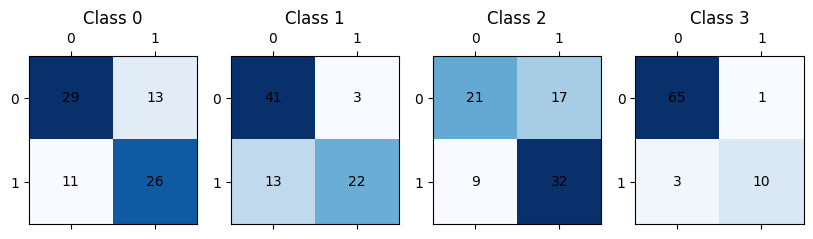

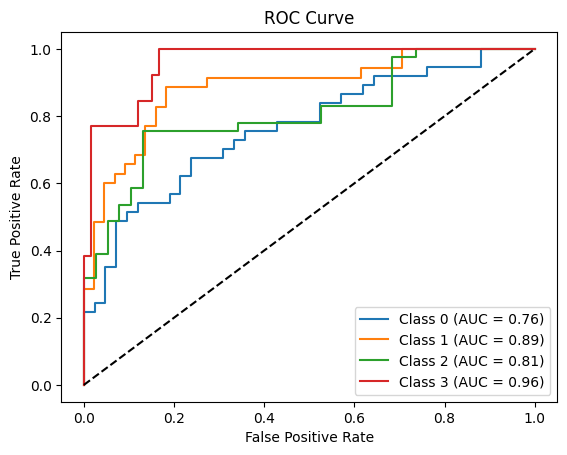

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4050632911392405
individual results (array([0.66666667, 0.8125    , 0.64814815, 0.69230769]), array([0.81081081, 0.74285714, 0.85365854, 0.69230769]), array([0.73170732, 0.7761194 , 0.73684211, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.7049056267806268, 0.7749085456402529, 0.7342441294072739, None)
micro results (0.6944444444444444, 0.7936507936507936, 0.7407407407407406, None)
sample results (0.7109704641350211, 0.8206751054852321, 0.7345991561181433, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73        37
           1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


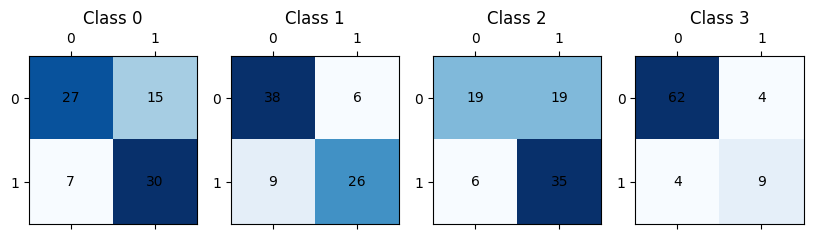

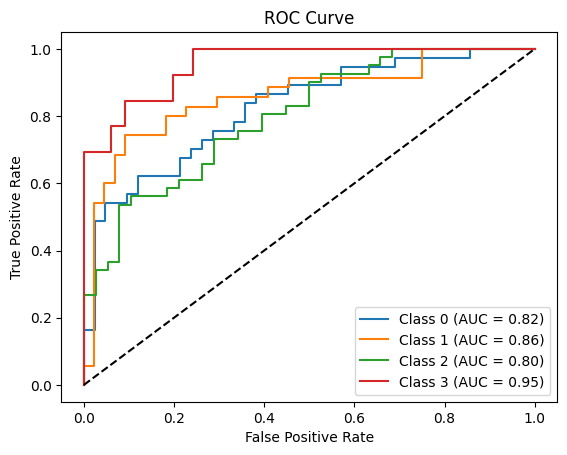

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4810126582278481
individual results (array([0.70454545, 0.88888889, 0.68085106, 0.83333333]), array([0.83783784, 0.68571429, 0.7804878 , 0.76923077]), array([0.7654321 , 0.77419355, 0.72727273, 0.8       ]), array([37, 35, 41, 13]))
macro results (0.7769046851493661, 0.7683176744152354, 0.7667245936063141, None)
micro results (0.7461538461538462, 0.7698412698412699, 0.7578125000000001, None)
sample results (0.7489451476793249, 0.8016877637130801, 0.7455696202531644, None)
classification report               precision    recall  f1-score   support

           0       0.70      0.84      0.77        37
           

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


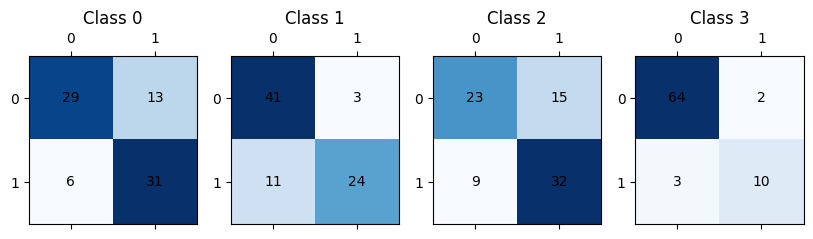

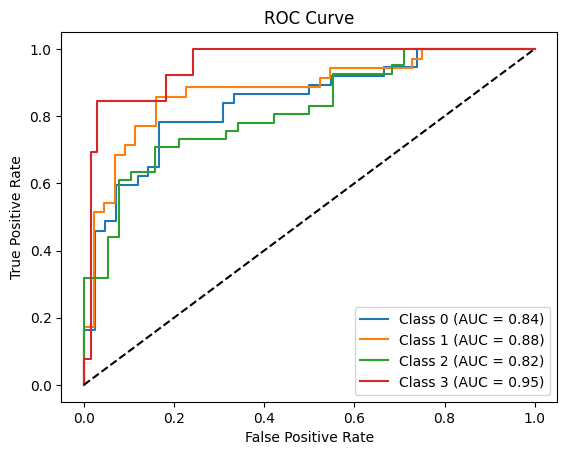

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.63829787, 0.86956522, 0.6122449 , 0.        ]), array([0.81081081, 0.57142857, 0.73170732, 0.        ]), array([0.71428571, 0.68965517, 0.66666667, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5300269969227285, 0.5284866748281383, 0.5176518883415435, None)
micro results (0.6722689075630253, 0.6349206349206349, 0.6530612244897959, None)
sample results (0.6075949367088607, 0.629746835443038, 0.593550331525015, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.81      0.71        37
           1       0.87      0.57      0.69    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

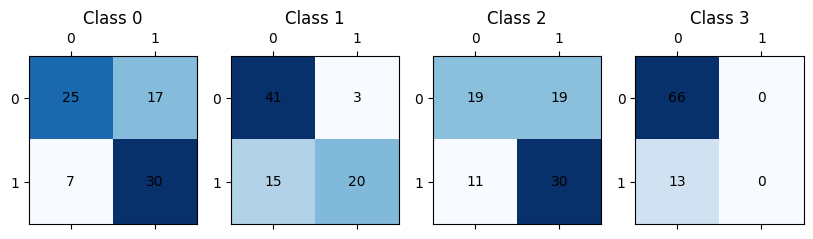

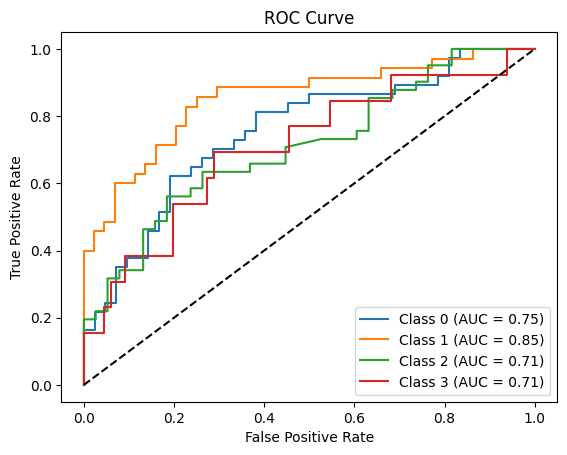

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3037974683544304
individual results (array([0.63265306, 0.88235294, 0.6       , 0.69230769]), array([0.83783784, 0.42857143, 0.95121951, 0.69230769]), array([0.72093023, 0.57692308, 0.73584906, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.7018284236771632, 0.7274841177280202, 0.6815025145981706, None)
micro results (0.6527777777777778, 0.746031746031746, 0.6962962962962964, None)
sample results (0.6645569620253164, 0.7964135021097046, 0.6935503315250151, None)
classification report               precision    recall  f1-score   support

           0       0.63      0.84      0.72        37
           1       0.88    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


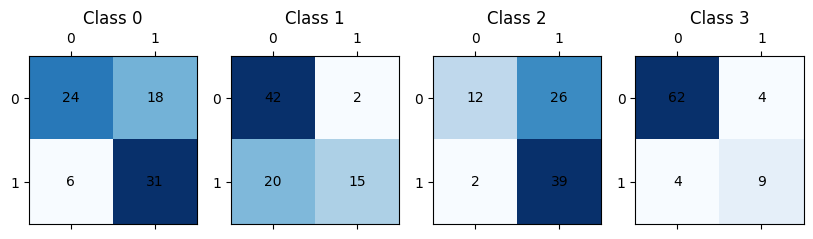

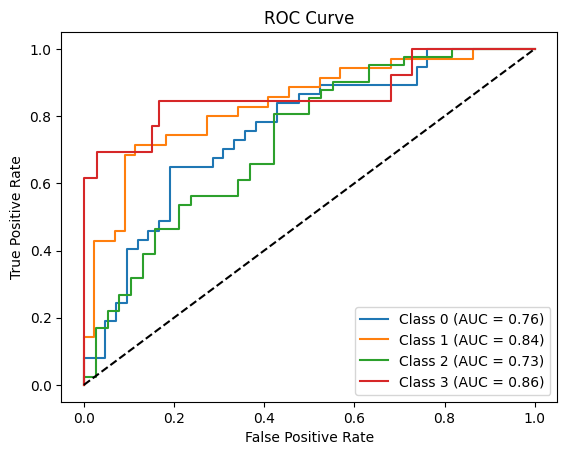

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.27848101265822783
individual results (array([0.65306122, 0.86363636, 0.60714286, 0.75      ]), array([0.86486486, 0.54285714, 0.82926829, 0.46153846]), array([0.74418605, 0.66666667, 0.70103093, 0.57142857]), array([37, 35, 41, 13]))
macro results (0.7184601113172542, 0.674632190485849, 0.6708280531104793, None)
micro results (0.674074074074074, 0.7222222222222222, 0.6973180076628352, None)
sample results (0.6624472573839663, 0.75, 0.6690777576853526, None)
classification report               precision    recall  f1-score   support

           0       0.65      0.86      0.74        37
           1       0.86      0.54      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


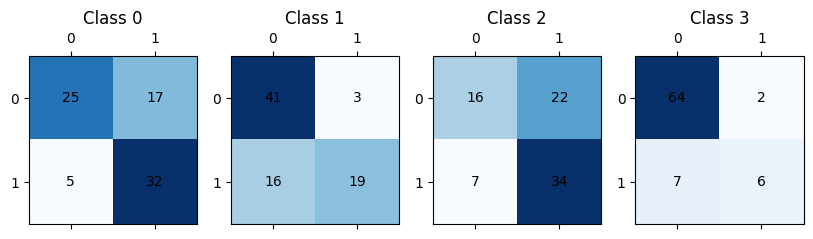

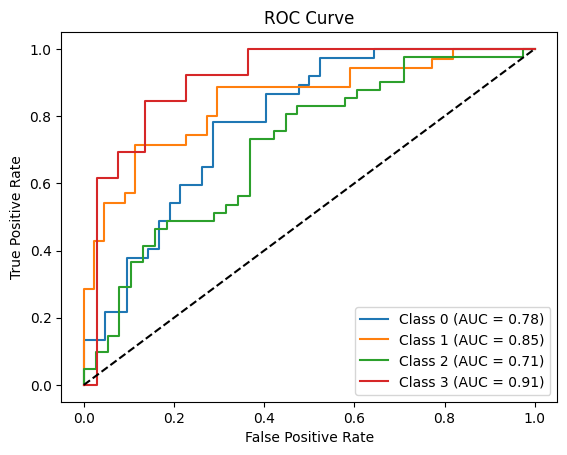

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.65      , 0.81818182, 0.88571429, 0.70588235]), array([0.7027027 , 0.77142857, 0.75609756, 0.92307692]), array([0.67532468, 0.79411765, 0.81578947, 0.8       ]), array([37, 35, 41, 13]))
macro results (0.7649446142093201, 0.7883264395459517, 0.7713079490169275, None)
micro results (0.768, 0.7619047619047619, 0.7649402390438246, None)
sample results (0.7763713080168776, 0.8048523206751055, 0.7552742616033754, None)
classification report               precision    recall  f1-score   support

           0       0.65      0.70      0.68        37
           1       0.82    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


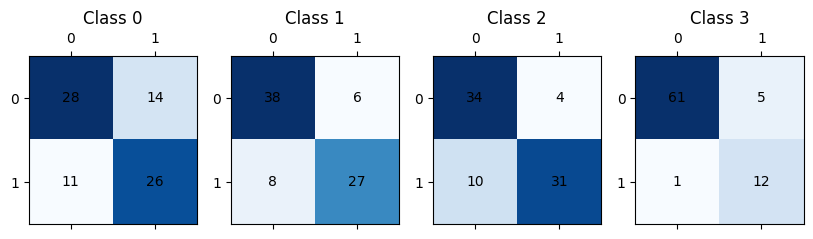

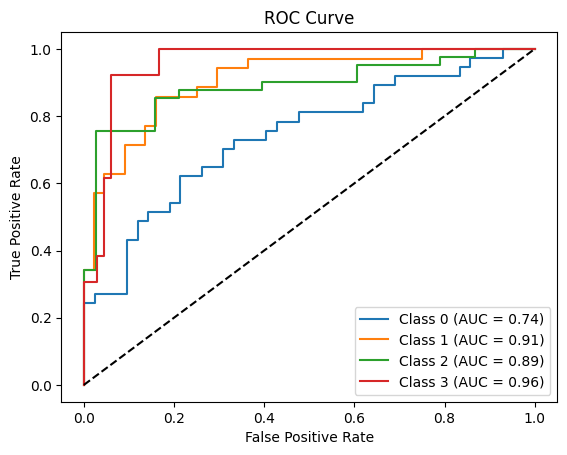

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.68421053, 0.84375   , 0.86486486, 0.76923077]), array([0.7027027 , 0.77142857, 0.7804878 , 0.76923077]), array([0.69333333, 0.80597015, 0.82051282, 0.76923077]), array([37, 35, 41, 13]))
macro results (0.7905140401028559, 0.755962462060023, 0.7722617680826637, None)
micro results (0.7916666666666666, 0.753968253968254, 0.7723577235772358, None)
sample results (0.7932489451476793, 0.8069620253164557, 0.7637130801687763, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.70      0.69   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


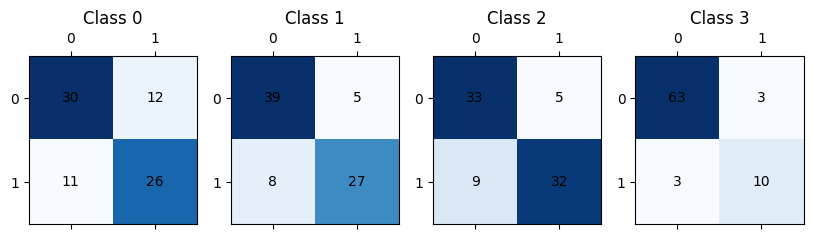

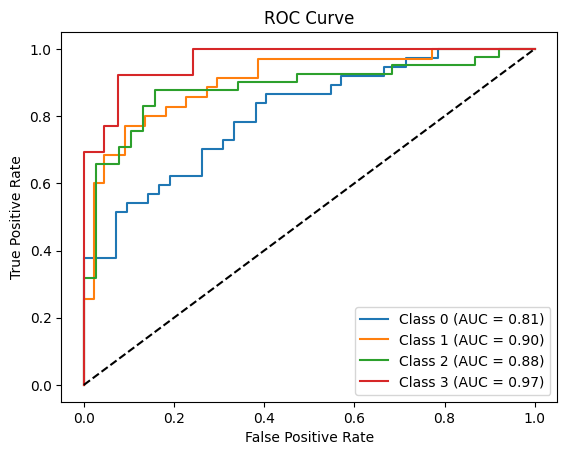

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='linear',
                                    probability=True))  Accuracy  is 0.45569620253164556
individual results (array([0.65909091, 0.84375   , 0.91891892, 0.71428571]), array([0.78378378, 0.77142857, 0.82926829, 0.76923077]), array([0.71604938, 0.80597015, 0.87179487, 0.74074074]), array([37, 35, 41, 13]))
macro results (0.7840113855738856, 0.7884278542815127, 0.7836387861263484, None)
micro results (0.7874015748031497, 0.7936507936507936, 0.7905138339920948, None)
sample results (0.8016877637130801, 0.8375527426160339, 0.7860759493670886, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.78      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


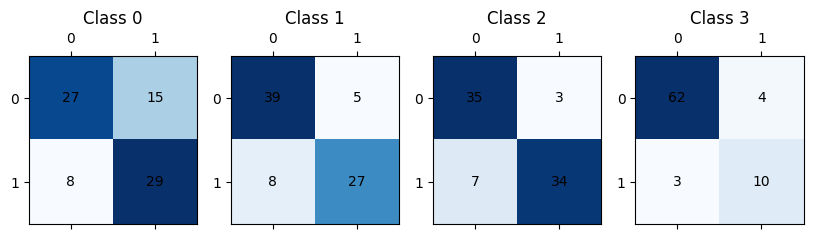

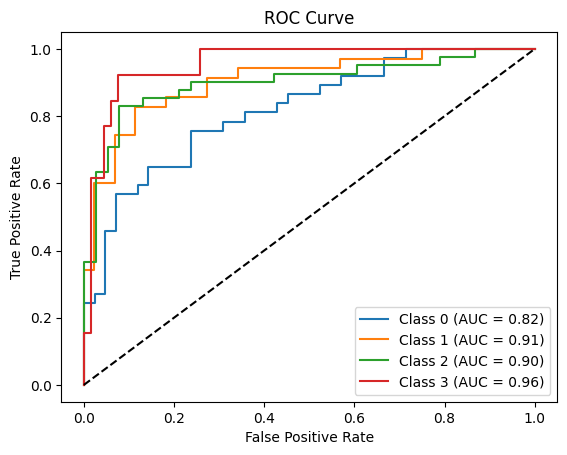

In [128]:
# with linear kernel
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

svm = SVC(kernel='linear', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)
n =0
for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
  try:
    multi_svm.fit(train_embedding, trainCategories)
    print(f'The {multi_svm}  {n} embedding name: {name}' )
    print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )
    # Get the predicted categories for the test data
    y_pred = multi_svm.predict(test_embedding)

    print('individual results', precision_recall_fscore_support(testCategories,y_pred) )
    print('macro results', precision_recall_fscore_support(testCategories,y_pred, average='macro') )
    print('micro results', precision_recall_fscore_support(testCategories,y_pred, average='micro') )
    print('sample results', precision_recall_fscore_support(testCategories,y_pred, average='samples') )
    print('classification report', classification_report(testCategories,y_pred))

    # Compute the confusion matrix for each class
    cm = multilabel_confusion_matrix(testCategories, y_pred)

    # Invert the true positives and true negatives in the confusion matrix
    #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

    # Plot the confusion matrix for each class
    fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
    for i, c in enumerate(cm):
        ax = axes[i]
        ax.matshow(c, cmap=plt.cm.Blues)
        ax.set_title(f'Class {i}')
        for j in range(c.shape[0]):
            for k in range(c.shape[1]):
                ax.text(k, j, str(c[j, k]), va='center', ha='center')
    plt.show()

    # Get the predicted probabilities for the positive class
    y_score = multi_svm.predict_proba(test_embedding)

    # Compute the ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(testCategories.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(testCategories[:, i], y_score[i][:, 1]) # we can change between 0 an 1 at the rigth to get the inverse, having the rock curve over or under the 45% axis
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot the ROC curve for each class
    for i in range(testCategories.shape[1]):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

  except:
    print('error')
    continue
  finally:
    n=n+1

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.24050632911392406
individual results (array([0.74074074, 0.75      , 0.61538462, 0.64285714]), array([0.54054054, 0.25714286, 0.3902439 , 0.69230769]), array([0.625     , 0.38297872, 0.47761194, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6872456247456248, 0.4700587481075286, 0.5380643325923573, None)
micro results (0.6835443037974683, 0.42857142857142855, 0.526829268292683, None)
sample results (0.419831223628692, 0.4831223628691983, 0.42700421940928274, None)
classification report               precision    recall  f1-score   support

           0       0.74      0.54      0.62        37
           1       0.75      0.26      0.38        35
      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


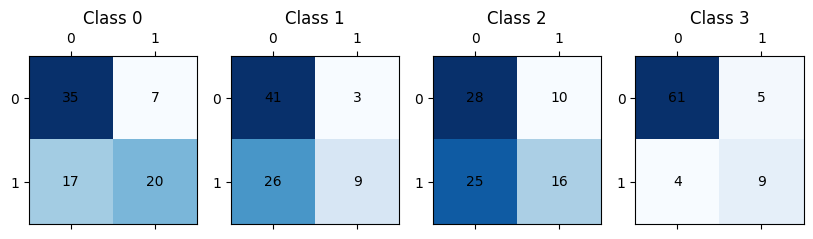

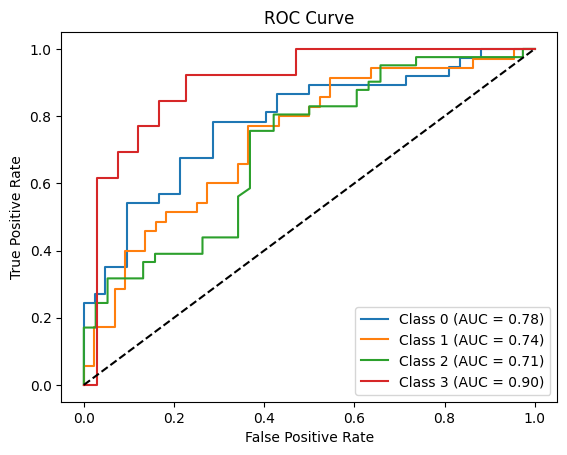

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.66666667, 0.8125    , 0.61666667, 0.75      ]), array([0.81081081, 0.37142857, 0.90243902, 0.69230769]), array([0.73170732, 0.50980392, 0.73267327, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7114583333333333, 0.6942465247343297, 0.6735461264921327, None)
micro results (0.6691729323308271, 0.7063492063492064, 0.6872586872586873, None)
sample results (0.6772151898734177, 0.760548523206751, 0.6827004219409283, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73        37
           1       0.81      0.37      0.51        35
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


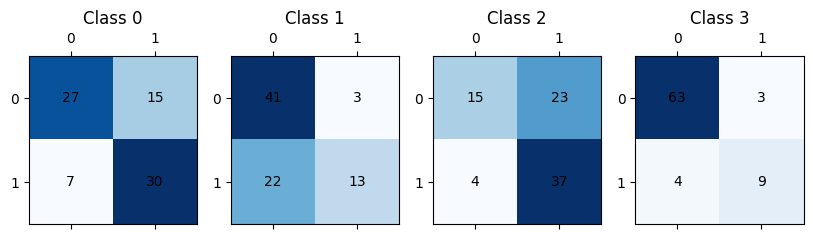

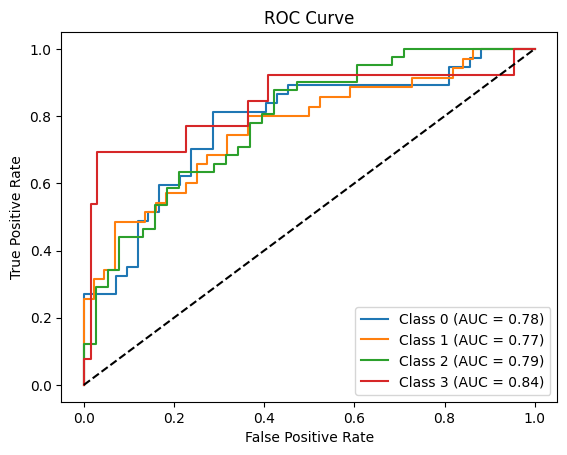

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.24050632911392406
individual results (array([0.61363636, 1.        , 0.52564103, 0.        ]), array([0.72972973, 0.05714286, 1.        , 0.        ]), array([0.66666667, 0.10810811, 0.68907563, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5348193473193473, 0.4467181467181467, 0.3659626012567189, None)
micro results (0.5645161290322581, 0.5555555555555556, 0.5599999999999999, None)
sample results (0.5738396624472574, 0.5907172995780591, 0.5518987341772151, None)
classification report               precision    recall  f1-score   support

           0       0.61      0.73      0.67        37
           1       1.00      0.06      0.11        35
           2     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


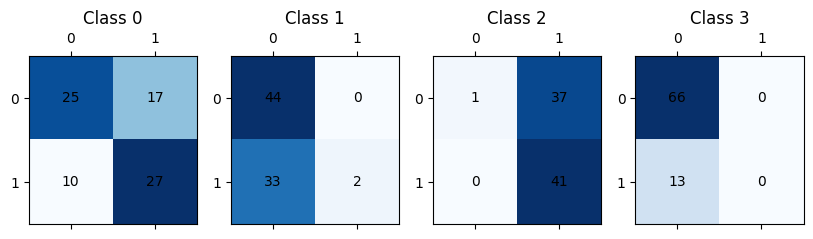

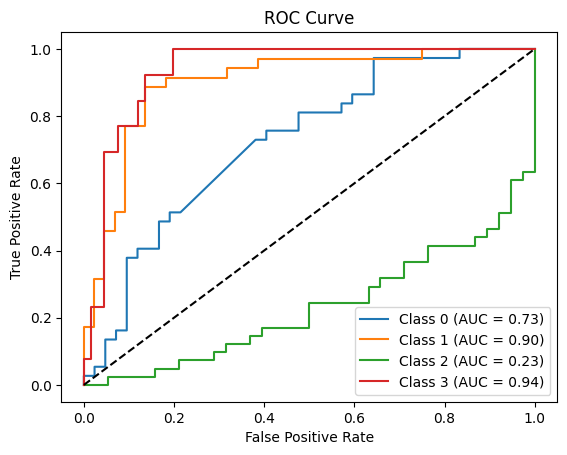

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.17721518987341772
individual results (array([0.54545455, 1.        , 0.53333333, 0.        ]), array([0.64864865, 0.08571429, 0.97560976, 0.        ]), array([0.59259259, 0.15789474, 0.68965517, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5196969696969697, 0.4274931726151239, 0.36003562546212275, None)
micro results (0.5491803278688525, 0.5317460317460317, 0.5403225806451613, None)
sample results (0.5569620253164557, 0.5791139240506329, 0.531223628691983, None)
classification report               precision    recall  f1-score   support

           0       0.55      0.65      0.59        37
           1       1.00      0.09      0.16        35
       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


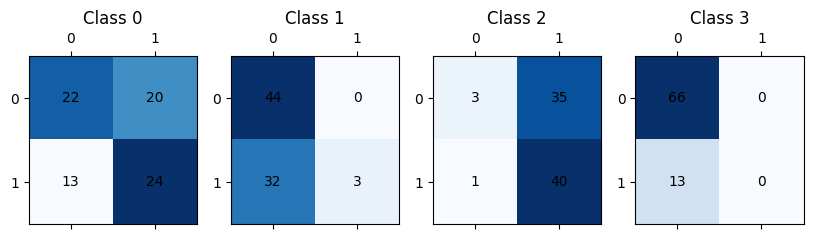

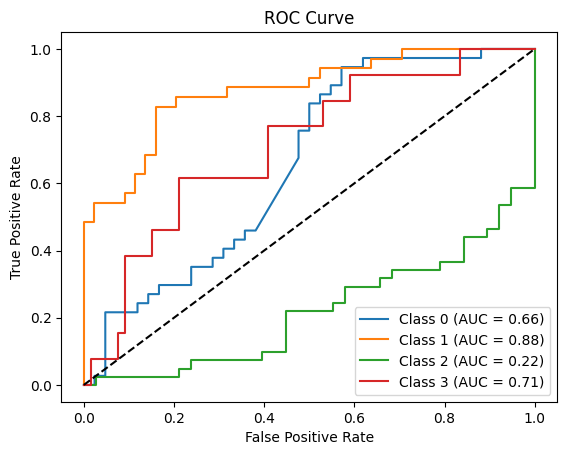

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.21518987341772153
individual results (array([0.61363636, 1.        , 0.53424658, 0.        ]), array([0.72972973, 0.11428571, 0.95121951, 0.        ]), array([0.66666667, 0.20512821, 0.68421053, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5369707347447074, 0.4488087390526415, 0.3890013495276653, None)
micro results (0.5785123966942148, 0.5555555555555556, 0.5668016194331983, None)
sample results (0.5886075949367089, 0.6107594936708861, 0.5620253164556961, None)
classification report               precision    recall  f1-score   support

           0       0.61      0.73      0.67        37
           1       1.00      0.11      0.21        35
        

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

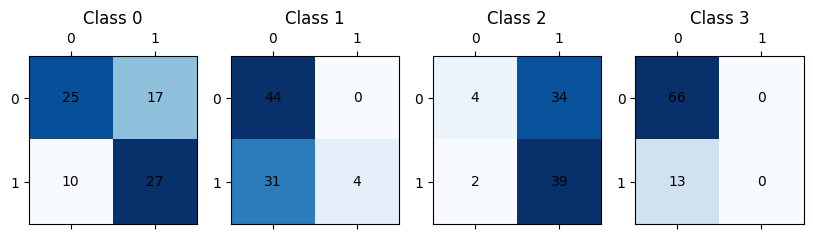

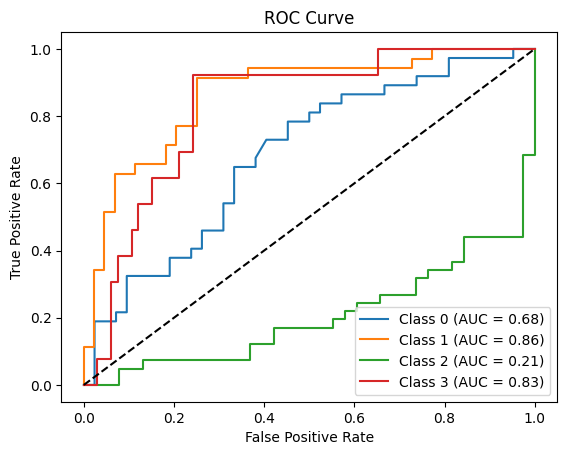

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  5 embedding name: glove basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.13924050632911392
individual results (array([0.51666667, 0.84615385, 0.55384615, 0.        ]), array([0.83783784, 0.31428571, 0.87804878, 0.        ]), array([0.63917526, 0.45833333, 0.67924528, 0.        ]), array([37, 35, 41, 13]))
macro results (0.4791666666666667, 0.5075430831528392, 0.44418846852104, None)
micro results (0.5652173913043478, 0.6190476190476191, 0.5909090909090909, None)
sample results (0.5232067510548523, 0.6223628691983123, 0.5375527426160336, None)
classification report               precision    recall  f1-score   support

           0       0.52      0.84      0.64        37
           1       0.85      0.31      0.46        35
           2      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

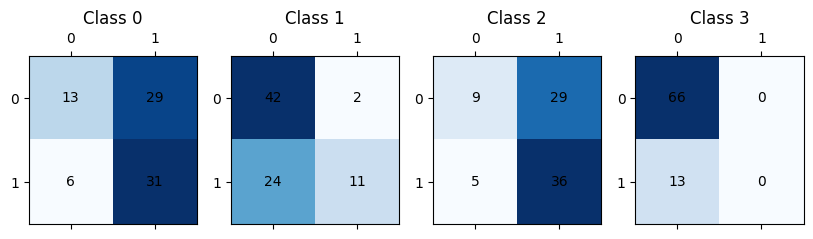

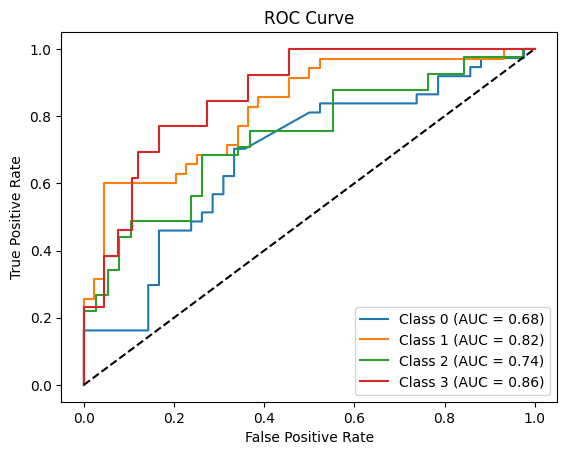

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.67567568, 0.85714286, 0.65454545, 0.8       ]), array([0.67567568, 0.34285714, 0.87804878, 0.61538462]), array([0.67567568, 0.48979592, 0.75      , 0.69565217]), array([37, 35, 41, 13]))
macro results (0.7468409968409968, 0.6279915536013096, 0.6527809419890165, None)
micro results (0.6982758620689655, 0.6428571428571429, 0.6694214876033058, None)
sample results (0.6856540084388185, 0.7056962025316456, 0.6654008438818565, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.68      0.68        37
           1       0.86      0.34      0.49  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


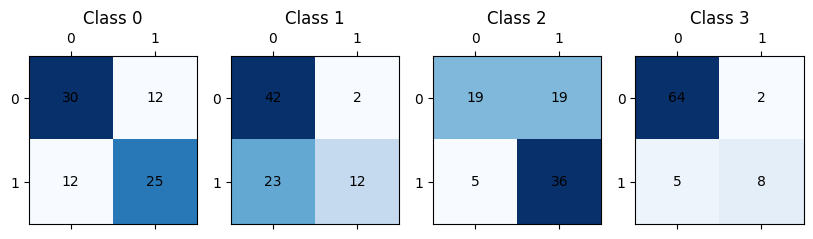

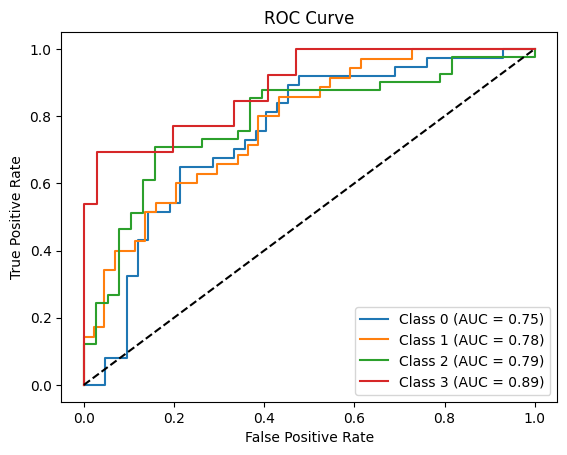

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  7 embedding name: use
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.43037974683544306
individual results (array([0.64102564, 0.91666667, 0.76744186, 0.        ]), array([0.67567568, 0.62857143, 0.80487805, 0.        ]), array([0.65789474, 0.74576271, 0.78571429, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5812835420393561, 0.527281288256898, 0.5473429336051994, None)
micro results (0.7547169811320755, 0.6349206349206349, 0.6896551724137931, None)
sample results (0.6265822784810127, 0.619198312236287, 0.6070524412296564, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.68      0.66        37
           1       0.92      0.63      0.75        35
           2       0.77   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

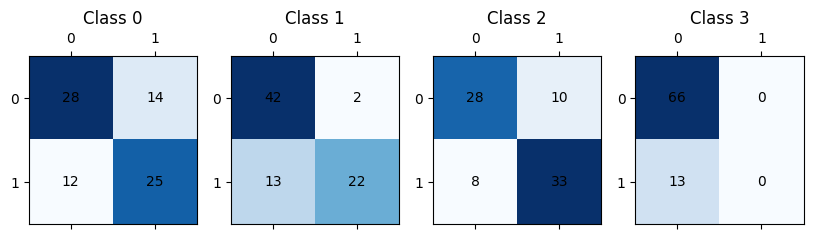

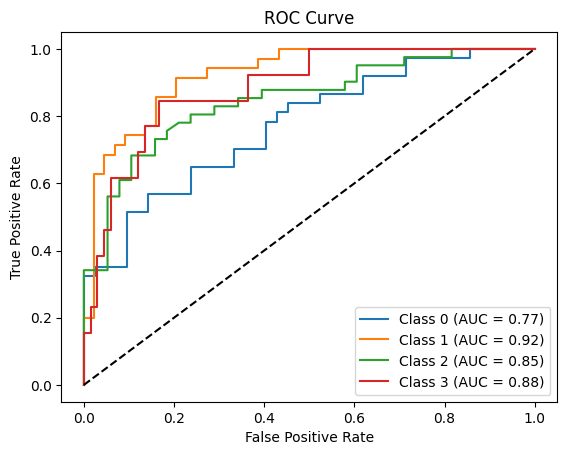

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.63829787, 0.79166667, 0.68627451, 0.75      ]), array([0.81081081, 0.54285714, 0.85365854, 0.69230769]), array([0.71428571, 0.6440678 , 0.76086957, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7165597622027535, 0.7249085456402529, 0.7098057690283187, None)
micro results (0.6940298507462687, 0.7380952380952381, 0.7153846153846155, None)
sample results (0.6835443037974683, 0.760548523206751, 0.6935503315250151, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.81      0.71        37
           1       0.79      0.54      0.64        35
  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


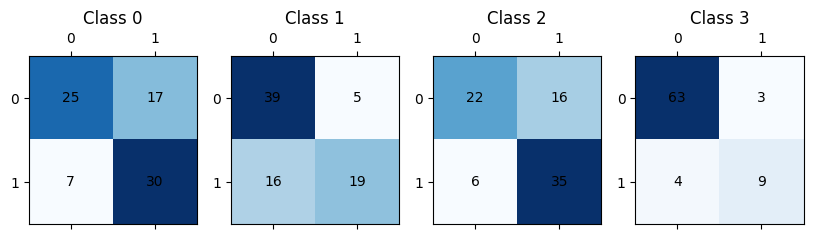

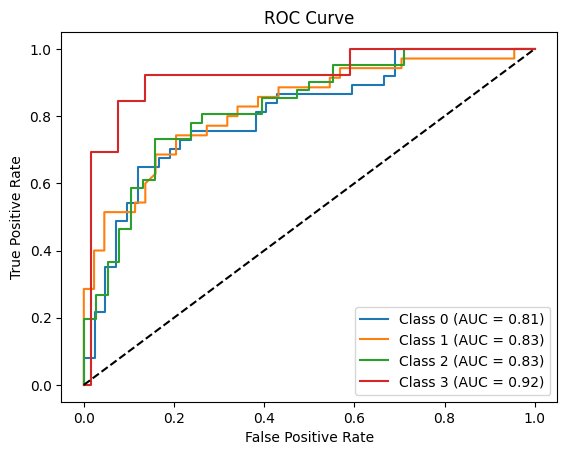

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.74193548, 0.8       , 0.75      , 0.64285714]), array([0.62162162, 0.34285714, 0.51219512, 0.69230769]), array([0.67647059, 0.48      , 0.60869565, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7336981566820276, 0.542245394684419, 0.6079582267689685, None)
micro results (0.7386363636363636, 0.5158730158730159, 0.6074766355140188, None)
sample results (0.5569620253164557, 0.5643459915611814, 0.5337552742616033, None)
classification report               precision    recall  f1-score   support

           0       0.74      0.62      0.68        37
           1       0.80      0.34      0.48        

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


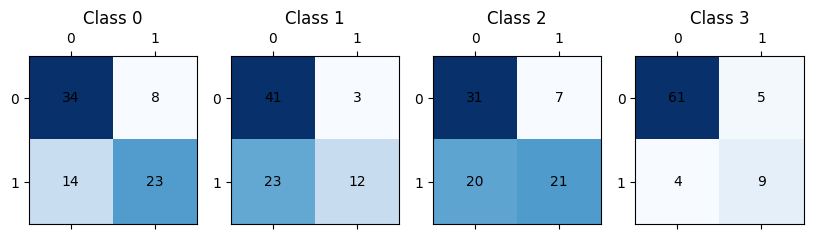

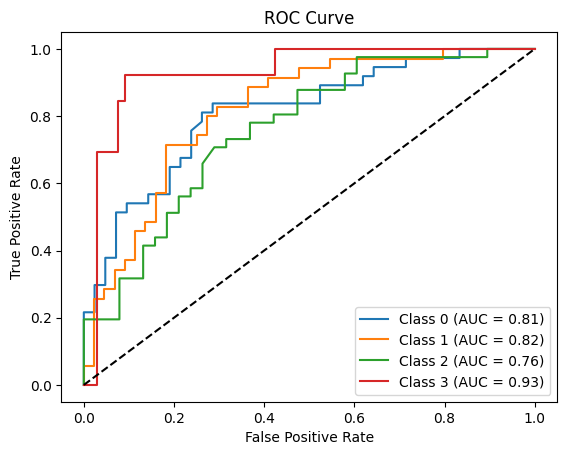

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.5189873417721519
individual results (array([0.73529412, 0.82142857, 0.81818182, 0.71428571]), array([0.67567568, 0.65714286, 0.87804878, 0.76923077]), array([0.70422535, 0.73015873, 0.84705882, 0.74074074]), array([37, 35, 41, 13]))
macro results (0.7722975553857907, 0.7450245206342767, 0.7555459116353898, None)
micro results (0.7833333333333333, 0.746031746031746, 0.7642276422764228, None)
sample results (0.7763713080168776, 0.7732067510548523, 0.7493670886075949, None)
classification report               precision    recall  f1-score   support

           0       0.74      0.68      0.70        37
           1       0.82      0.66      0.73        35
           2   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


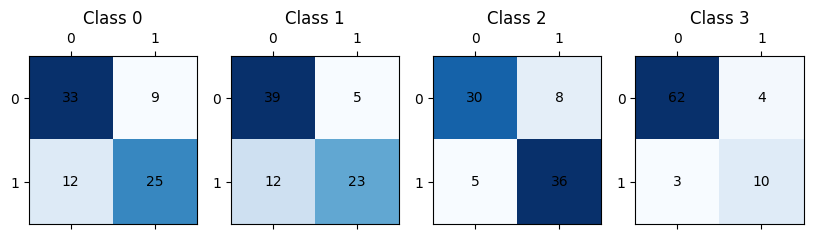

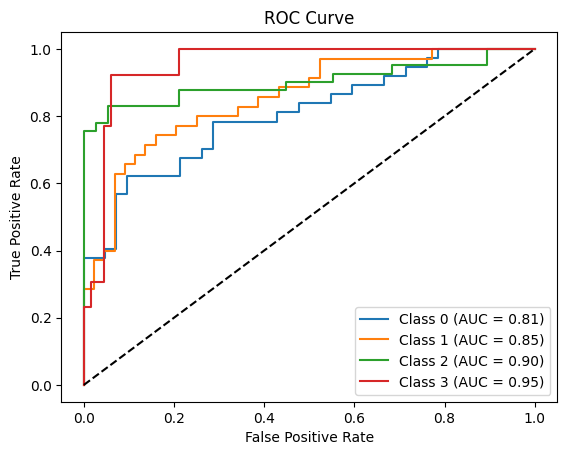

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.379746835443038
individual results (array([0.65957447, 0.79310345, 0.68627451, 0.9       ]), array([0.83783784, 0.65714286, 0.85365854, 0.69230769]), array([0.73809524, 0.71875   , 0.76086957, 0.7826087 ]), array([37, 35, 41, 13]))
macro results (0.7597381065412224, 0.7602367309684384, 0.7500808747412008, None)
micro results (0.7153284671532847, 0.7777777777777778, 0.7452471482889734, None)
sample results (0.7194092827004219, 0.7932489451476793, 0.7227848101265822, None)
classification report               precision    recall  f1-score   support

           0       0.66      0.84      0.74        37
           1       0.79      0.66      0.72       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


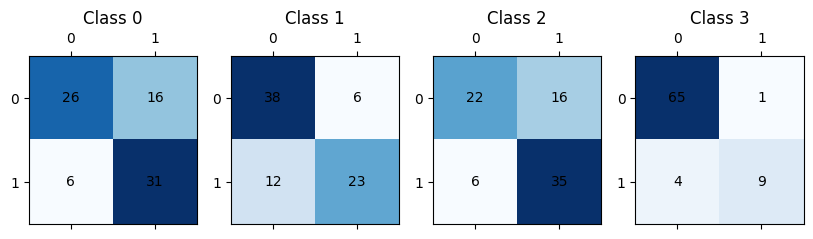

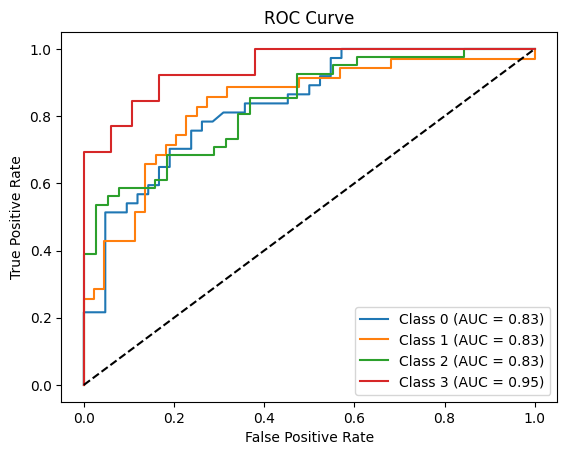

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.80769231, 0.75      , 0.6969697 , 0.64285714]), array([0.56756757, 0.34285714, 0.56097561, 0.69230769]), array([0.66666667, 0.47058824, 0.62162162, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7243797868797869, 0.5409270031221252, 0.6063857975622682, None)
micro results (0.7303370786516854, 0.5158730158730159, 0.6046511627906976, None)
sample results (0.559071729957806, 0.5559071729957805, 0.5341772151898735, None)
classification report               precision    recall  f1-score   support

           0       0.81      0.57      0.67        37
           1       0.75      0.34      0.47   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


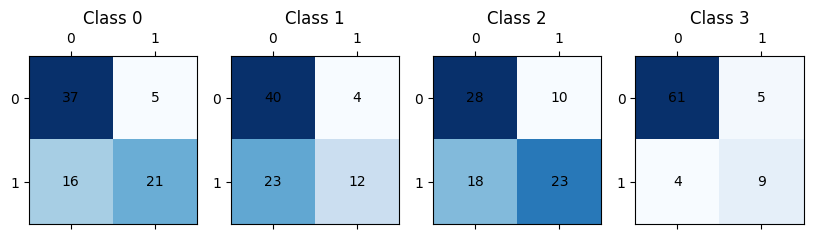

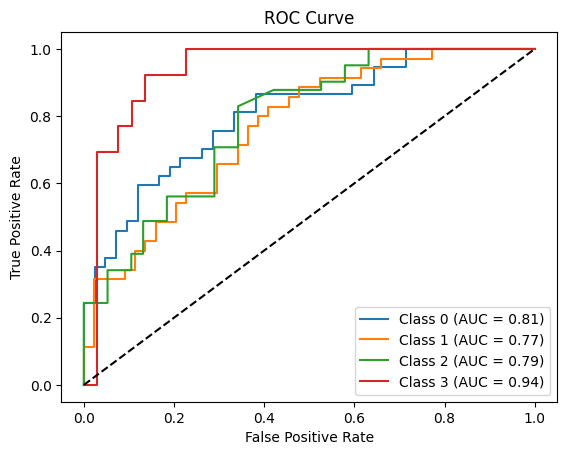

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.76470588, 0.86956522, 0.62222222, 0.        ]), array([0.7027027 , 0.57142857, 0.68292683, 0.        ]), array([0.73239437, 0.68965517, 0.65116279, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5641233304916169, 0.4892645258498918, 0.5183030823271626, None)
micro results (0.7254901960784313, 0.5873015873015873, 0.6491228070175439, None)
sample results (0.6139240506329113, 0.5907172995780591, 0.5742616033755273, None)
classification report               precision    recall  f1-score   support

           0       0.76      0.70      0.73        37
           1       0.87      0.57      0.69        35
  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

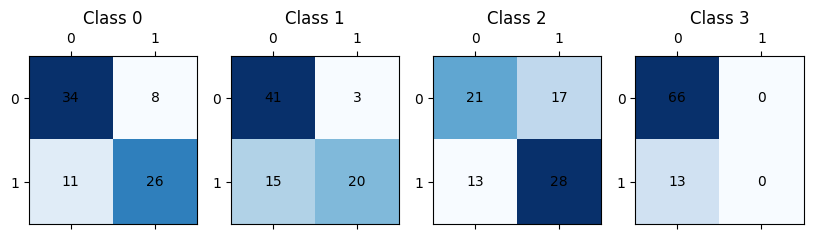

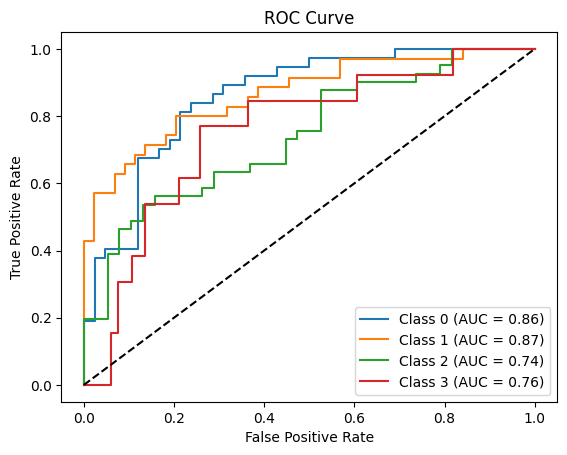

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.65116279, 0.74074074, 0.66071429, 0.69230769]), array([0.75675676, 0.57142857, 0.90243902, 0.69230769]), array([0.7       , 0.64516129, 0.7628866 , 0.69230769]), array([37, 35, 41, 13]))
macro results (0.6862313773650983, 0.7307330112208161, 0.7000888951421043, None)
micro results (0.6762589928057554, 0.746031746031746, 0.709433962264151, None)
sample results (0.679324894514768, 0.7858649789029535, 0.6952380952380953, None)
classification report               precision    recall  f1-score   support

           0       0.65      0.76      0.70        37
           1       0.74      0.57      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


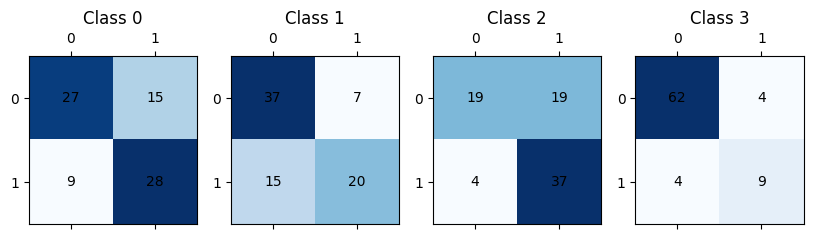

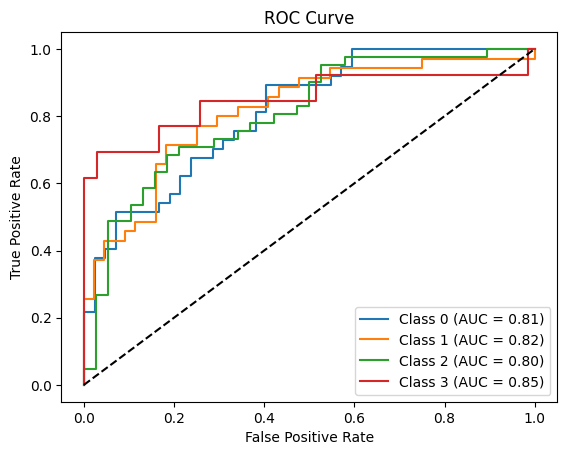

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.189873417721519
individual results (array([0.73333333, 0.53846154, 0.6       , 0.64285714]), array([0.59459459, 0.2       , 0.43902439, 0.69230769]), array([0.65671642, 0.29166667, 0.50704225, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6286630036630036, 0.48148166928654734, 0.530523001191227, None)
micro results (0.6436781609195402, 0.4444444444444444, 0.5258215962441315, None)
sample results (0.4156118143459915, 0.4936708860759494, 0.42784810126582273, None)
classification report               precision    recall  f1-score   support

           0       0.73      0.59      0.66        37
           1       0.54      0.20   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


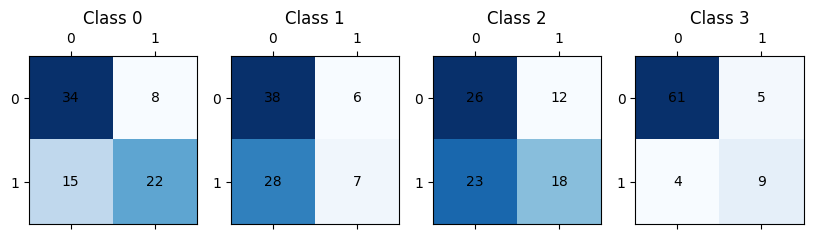

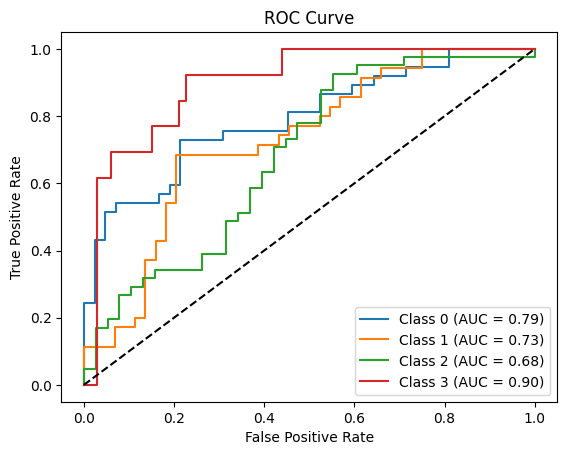

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.72972973, 0.85714286, 0.60416667, 0.        ]), array([0.72972973, 0.51428571, 0.70731707, 0.        ]), array([0.72972973, 0.64285714, 0.65168539, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5477598133848134, 0.48783312929654393, 0.5060680664613249, None)
micro results (0.6981132075471698, 0.5873015873015873, 0.6379310344827586, None)
sample results (0.6054852320675105, 0.5833333333333334, 0.5675105485232067, None)
classification report               precision    recall  f1-score   support

           0       0.73      0.73      0.73        37
           1       0.86      0.51      0.64        35

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

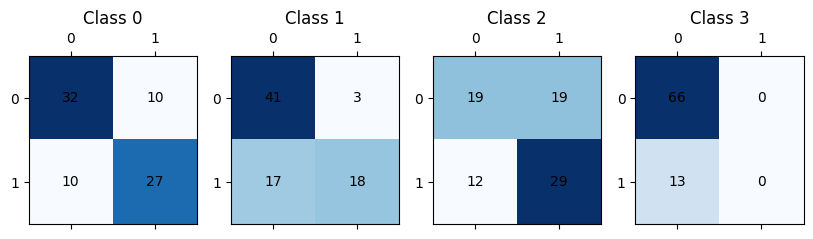

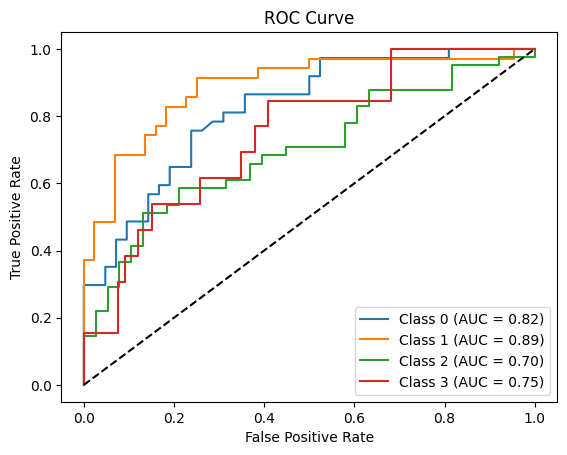

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.3670886075949367
individual results (array([0.7       , 0.8       , 0.63157895, 0.75      ]), array([0.75675676, 0.57142857, 0.87804878, 0.69230769]), array([0.72727273, 0.66666667, 0.73469388, 0.72      ]), array([37, 35, 41, 13]))
macro results (0.7203947368421053, 0.7246354502452064, 0.7121583178726035, None)
micro results (0.6940298507462687, 0.7380952380952381, 0.7153846153846155, None)
sample results (0.6983122362869199, 0.7848101265822784, 0.7016877637130802, None)
classification report               precision    recall  f1-score   support

           0       0.70      0.76      0.73        37
           1       0.80      0.57   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


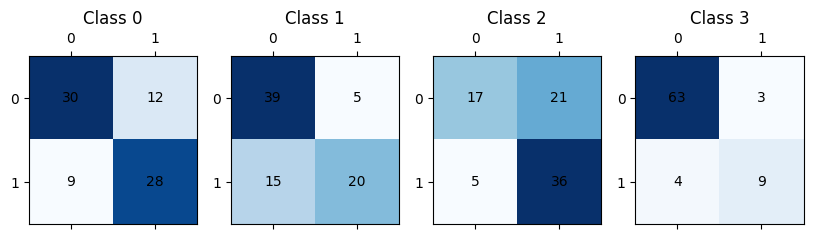

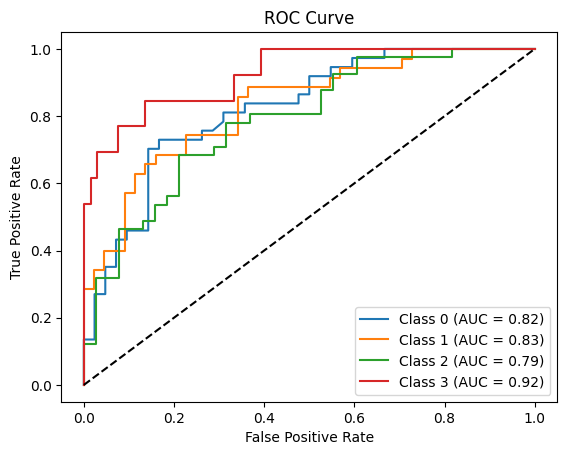

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.22784810126582278
individual results (array([0.75      , 0.73333333, 0.59375   , 0.64285714]), array([0.64864865, 0.31428571, 0.46341463, 0.69230769]), array([0.69565217, 0.44      , 0.52054795, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.679985119047619, 0.5296641723470992, 0.5807166964462973, None)
micro results (0.6774193548387096, 0.5, 0.5753424657534247, None)
sample results (0.44092827004219415, 0.5295358649789029, 0.4586497890295359, None)
classification report               precision    recall  f1-score   support

           0       0.75      0.65      0.70        37
           1       0.73      0.31      0.44      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


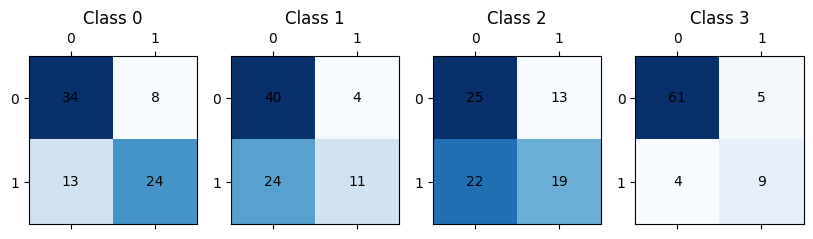

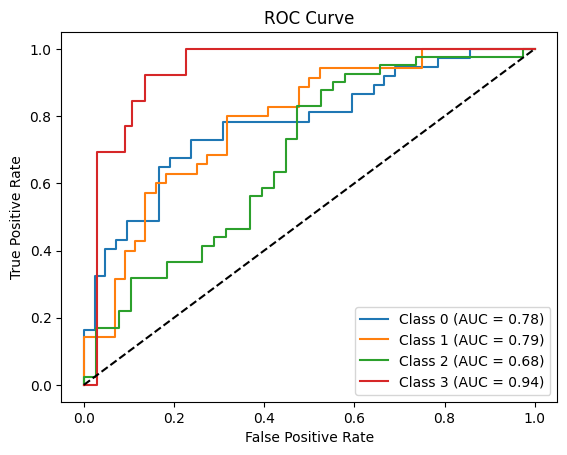

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.46835443037974683
individual results (array([0.68292683, 0.85714286, 0.75555556, 0.9       ]), array([0.75675676, 0.68571429, 0.82926829, 0.69230769]), array([0.71794872, 0.76190476, 0.79069767, 0.7826087 ]), array([37, 35, 41, 13]))
macro results (0.7989063104916764, 0.7410117568654153, 0.7632899624810646, None)
micro results (0.7661290322580645, 0.753968253968254, 0.76, None)
sample results (0.7552742616033756, 0.7763713080168777, 0.7375527426160338, None)
classification report               precision    recall  f1-score   support

           0       0.68      0.76      0.72        37
           1       0.86      0.69      0.76      

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


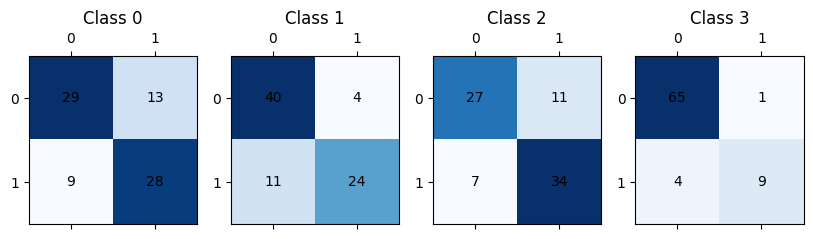

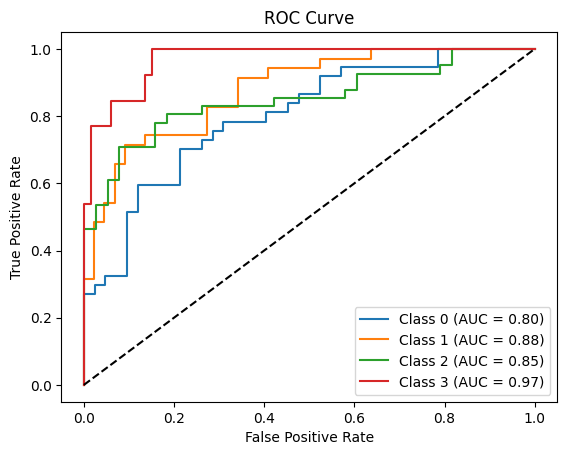

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.43037974683544306
individual results (array([0.70212766, 0.74285714, 0.70212766, 0.81818182]), array([0.89189189, 0.74285714, 0.80487805, 0.69230769]), array([0.78571429, 0.74285714, 0.75      , 0.75      ]), array([37, 35, 41, 13]))
macro results (0.7413235700469744, 0.7829836939593038, 0.7571428571428571, None)
micro results (0.7214285714285714, 0.8015873015873016, 0.7593984962406015, None)
sample results (0.7383966244725738, 0.8227848101265823, 0.7489451476793249, None)
classification report               precision    recall  f1-score   support

           0       0.70      0.89      0.79        37
           1   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


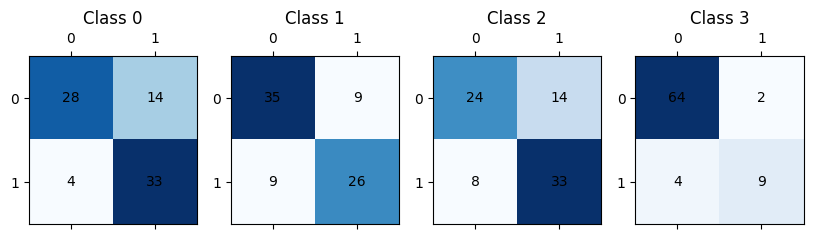

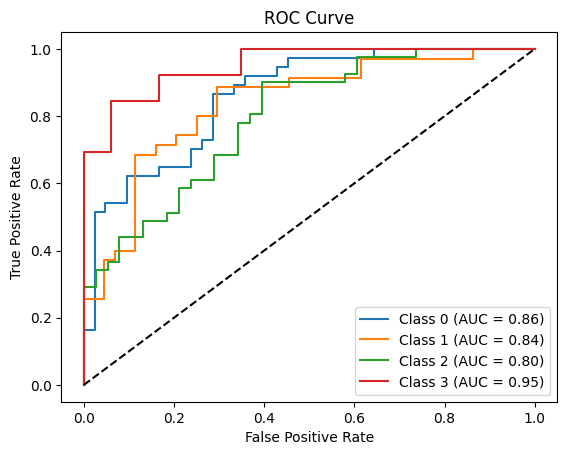

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.35443037974683544
individual results (array([0.78571429, 0.92307692, 0.70588235, 0.64285714]), array([0.59459459, 0.34285714, 0.58536585, 0.69230769]), array([0.67692308, 0.5       , 0.64      , 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7643826761473821, 0.5537813208544915, 0.620897435897436, None)
micro results (0.7528089887640449, 0.5317460317460317, 0.6232558139534884, None)
sample results (0.5654008438818566, 0.5770042194092826, 0.5468354430379746, None)
classification report               precision    recall  f1-score   support

           0       0.79      0.59      0.68        37
           1   

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


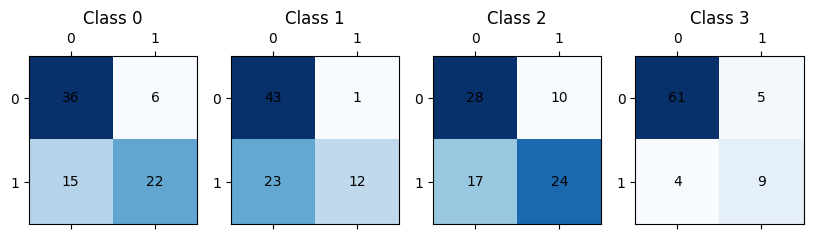

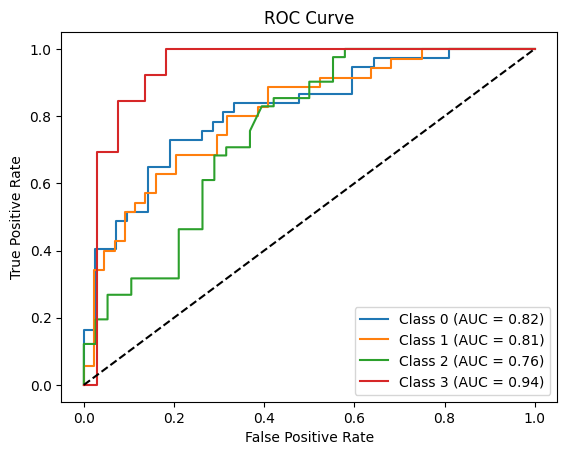

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.25316455696202533
individual results (array([0.62162162, 0.83333333, 0.62222222, 0.        ]), array([0.62162162, 0.57142857, 0.68292683, 0.        ]), array([0.62162162, 0.6779661 , 0.65116279, 0.        ]), array([37, 35, 41, 13]))
macro results (0.5192942942942943, 0.4689942555796215, 0.48768762850355274, None)
micro results (0.6698113207547169, 0.5634920634920635, 0.6120689655172414, None)
sample results (0.5590717299578059, 0.5516877637130801, 0.5294153104279686, None)
classification report               precision    recall  f1-score   support

           0       0.62      0.62      0.62        37
           1       0.83      0.57      0.68    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

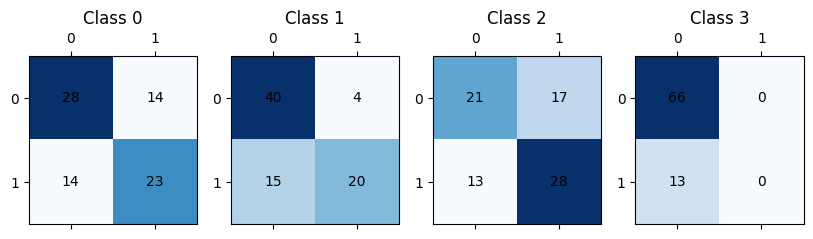

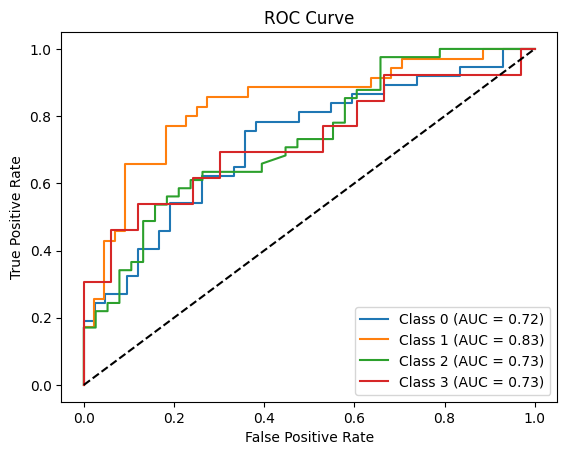

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.2911392405063291
individual results (array([0.63829787, 0.68181818, 0.61666667, 0.69230769]), array([0.81081081, 0.42857143, 0.90243902, 0.69230769]), array([0.71428571, 0.52631579, 0.73267327, 0.69230769]), array([37, 35, 41, 13]))
macro results (0.6572726032832417, 0.7085322390200439, 0.6663956158484559, None)
micro results (0.6408450704225352, 0.7222222222222222, 0.6791044776119404, None)
sample results (0.6434599156118143, 0.7753164556962026, 0.6707655213984327, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.81      0.71        37
           1       0.68      0

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


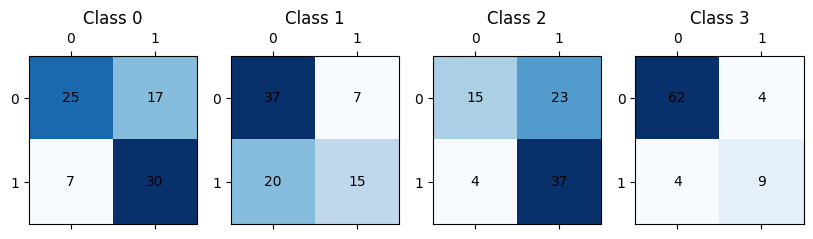

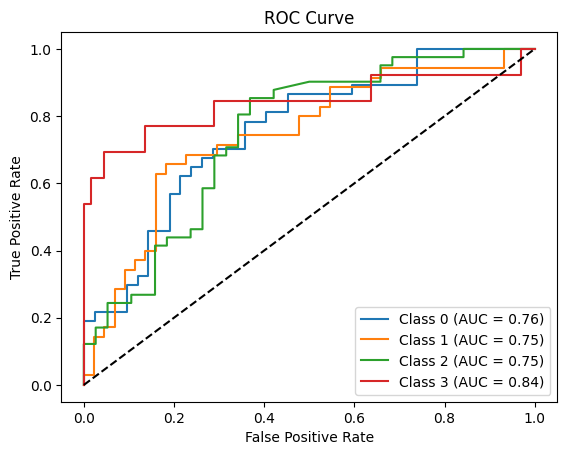

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.189873417721519
individual results (array([0.6875    , 0.63636364, 0.59375   , 0.64285714]), array([0.59459459, 0.2       , 0.46341463, 0.69230769]), array([0.63768116, 0.30434783, 0.52054795, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.6401176948051948, 0.4875792302621571, 0.5323108993448481, None)
micro results (0.6404494382022472, 0.4523809523809524, 0.530232558139535, None)
sample results (0.4050632911392405, 0.5, 0.42784810126582273, None)
classification report               precision    recall  f1-score   support

           0       0.69      0.59      0.64        37
           1       0.64      0.20      0.30  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


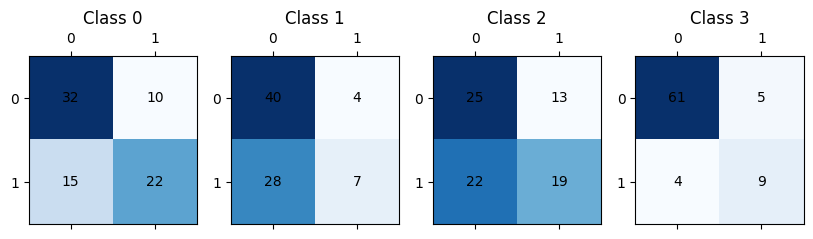

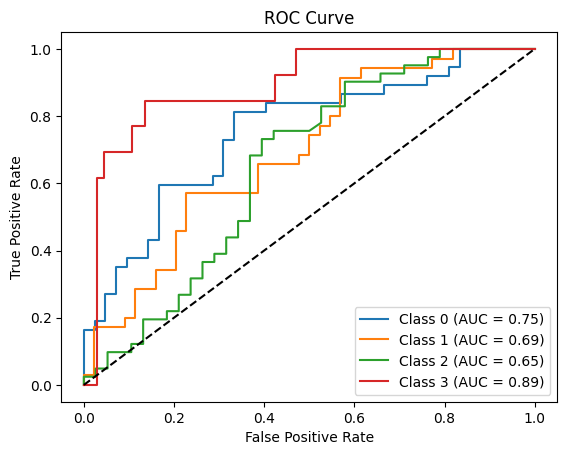

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.4177215189873418
individual results (array([0.74285714, 0.9047619 , 0.82926829, 1.        ]), array([0.7027027 , 0.54285714, 0.82926829, 0.07692308]), array([0.72222222, 0.67857143, 0.82926829, 0.14285714]), array([37, 35, 41, 13]))
macro results (0.8692218350754936, 0.5379378037914624, 0.59322977158343, None)
micro results (0.8163265306122449, 0.6349206349206349, 0.7142857142857143, None)
sample results (0.6835443037974683, 0.6624472573839663, 0.6417721518987343, None)
classification report               precision    recall  f1-score   support

           0       0.74      0.70      0.72        37
           1       0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


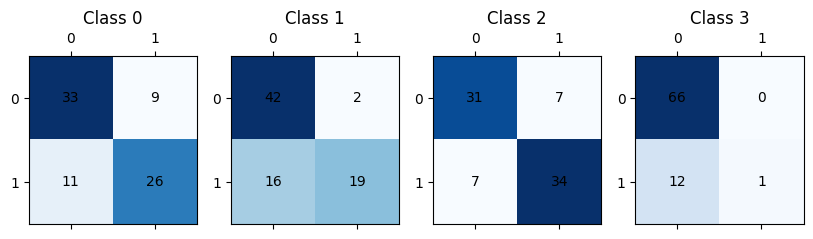

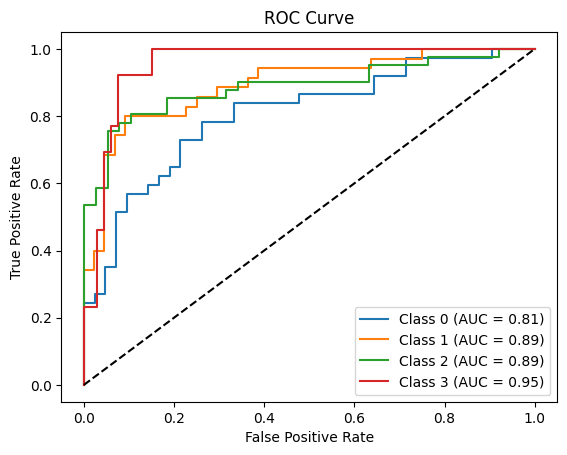

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.66666667, 0.85      , 0.68518519, 0.9       ]), array([0.81081081, 0.48571429, 0.90243902, 0.69230769]), array([0.73170732, 0.61818182, 0.77894737, 0.7826087 ]), array([37, 35, 41, 13]))
macro results (0.7754629629629629, 0.7228179533057582, 0.7278612998320539, None)
micro results (0.7209302325581395, 0.7380952380952381, 0.7294117647058824, None)
sample results (0.7215189873417722, 0.7848101265822784, 0.7135021097046413, None)
classification report               precision    recall  f1-score   support

           0       0.67      0.81      0.73     

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


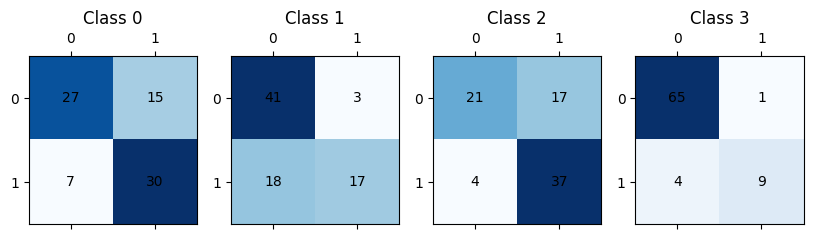

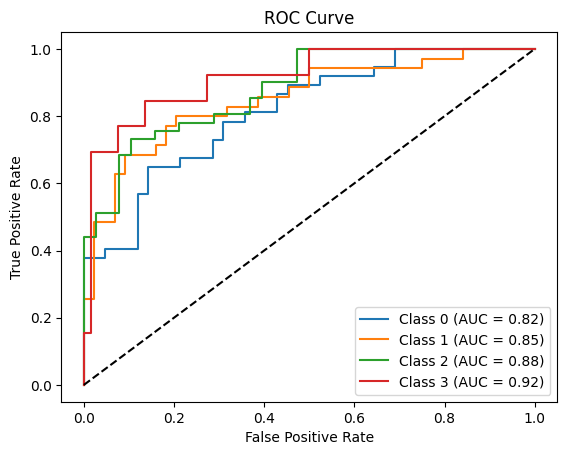

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 1}, kernel='poly',
                                    probability=True))  Accuracy  is 0.35443037974683544
individual results (array([0.79310345, 0.78947368, 0.83333333, 0.64285714]), array([0.62162162, 0.42857143, 0.48780488, 0.69230769]), array([0.6969697 , 0.55555556, 0.61538462, 0.66666667]), array([37, 35, 41, 13]))
macro results (0.7646919021692161, 0.5575764051373807, 0.6336441336441336, None)
micro results (0.7790697674418605, 0.5317460317460317, 0.6320754716981133, None)
sample results (0.5843881856540085, 0.5822784810126582, 0.5569620253164557, None)
classification report               precision    recall  f1-score   support

           0       0.79      0.62      0.70 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


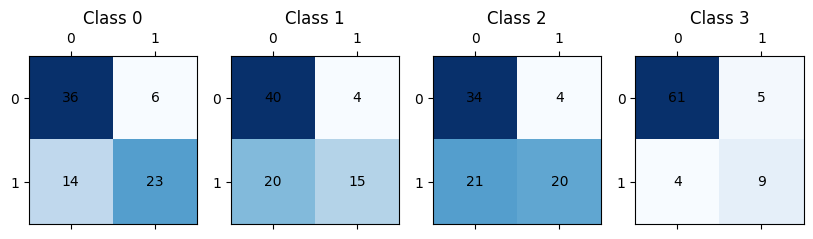

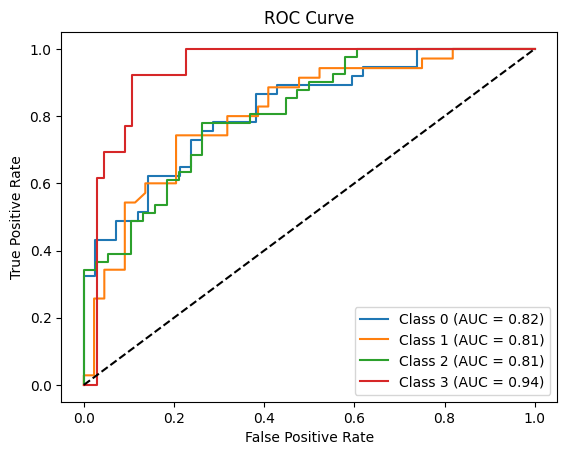

In [129]:
# with poly kernel
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

svm = SVC(kernel='poly', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)
n =0
for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
  try:
    multi_svm.fit(train_embedding, trainCategories)
    print(f'The {multi_svm}  {n} embedding name: {name}' )
    print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )
    # Get the predicted categories for the test data
    y_pred = multi_svm.predict(test_embedding)

    print('individual results', precision_recall_fscore_support(testCategories,y_pred) )
    print('macro results', precision_recall_fscore_support(testCategories,y_pred, average='macro') )
    print('micro results', precision_recall_fscore_support(testCategories,y_pred, average='micro') )
    print('sample results', precision_recall_fscore_support(testCategories,y_pred, average='samples') )
    print('classification report', classification_report(testCategories,y_pred))

    # Compute the confusion matrix for each class
    cm = multilabel_confusion_matrix(testCategories, y_pred)

    # Invert the true positives and true negatives in the confusion matrix
    #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

    # Plot the confusion matrix for each class
    fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
    for i, c in enumerate(cm):
        ax = axes[i]
        ax.matshow(c, cmap=plt.cm.Blues)
        ax.set_title(f'Class {i}')
        for j in range(c.shape[0]):
            for k in range(c.shape[1]):
                ax.text(k, j, str(c[j, k]), va='center', ha='center')
    plt.show()

    # Get the predicted probabilities for the positive class
    y_score = multi_svm.predict_proba(test_embedding)

    # Compute the ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(testCategories.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(testCategories[:, i], y_score[i][:, 1]) # we can change between 0 an 1 at the rigth to get the inverse, having the rock curve over or under the 45% axis
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot the ROC curve for each class
    for i in range(testCategories.shape[1]):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

  except:
    print('error')
    continue
  finally:
    n=n+1

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  0 embedding name: tfid one hot stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.31645569620253167
individual results (array([0.64      , 0.74285714, 0.64285714, 0.66666667]), array([0.86486486, 0.74285714, 0.87804878, 0.61538462]), array([0.73563218, 0.74285714, 0.74226804, 0.64      ]), array([37, 35, 41, 13]))
macro results (0.6730952380952381, 0.775288850898607, 0.7151893420005756, None)
micro results (0.6666666666666666, 0.8095238095238095, 0.7311827956989246, None)
sample results (0.70042194092827, 0.8417721518987342, 0.7265822784810126, None)
classification report               precision    recall  f1-score   support

           0       0.64      0.86      0.74        37
           1       0.74      0.74      0.74        35
     

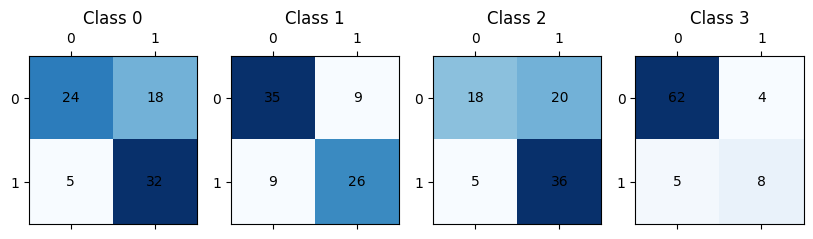

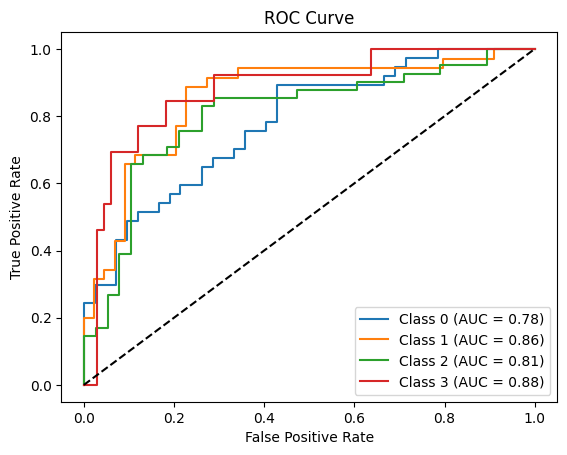

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.31645569620253167
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6722524565381708
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.8095238095238095
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  1 embedding name: tfid categorical stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.34177215189873417
individual results (array([0.56862745, 0.72972973, 0.67272727, 0.75      ]), array([0.78378378, 0.77142857, 0.90243902, 0.6923076

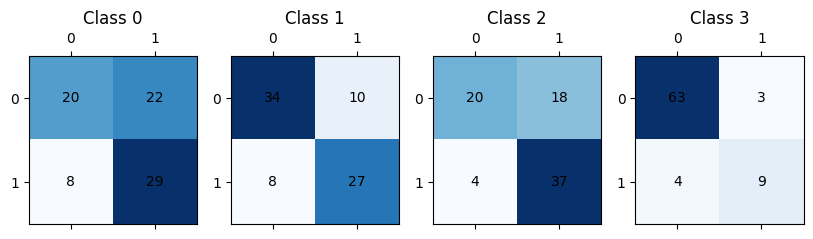

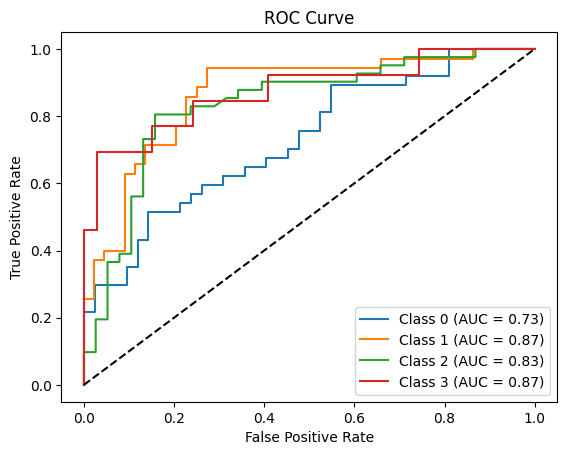

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.34177215189873417
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6659648762589939
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.8095238095238095
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  2 embedding name: tfid basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3291139240506329
individual results (array([0.59574468, 0.85185185, 0.66666667, 0.66666667]), array([0.75675676, 0.65714286, 0.87804878, 0.46153846]), array([0.66

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


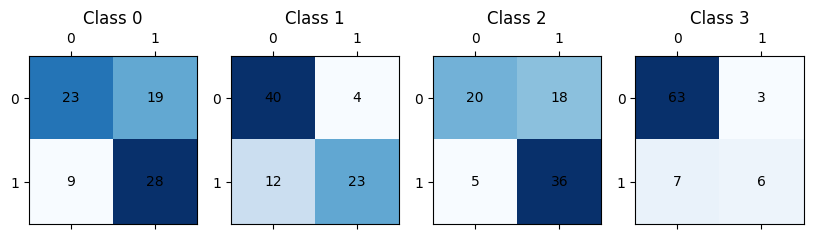

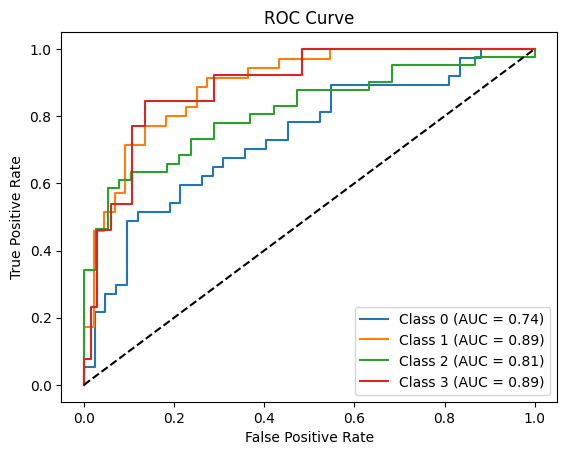

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3291139240506329
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6972806984627317
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.7380952380952381
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  3 embedding name: tfid basic leminized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.26582278481012656
individual results (array([0.54      , 0.79411765, 0.62962963, 0.33333333]), array([0.72972973, 0.77142857, 0.82926829, 0.15384615]), a

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


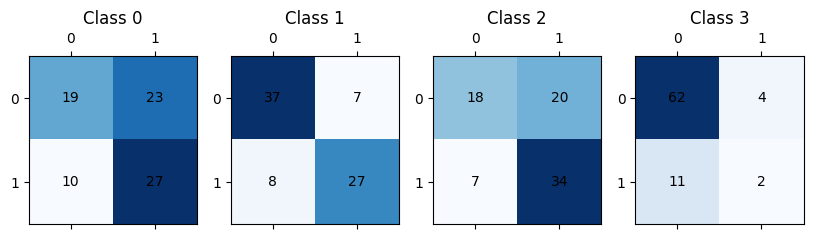

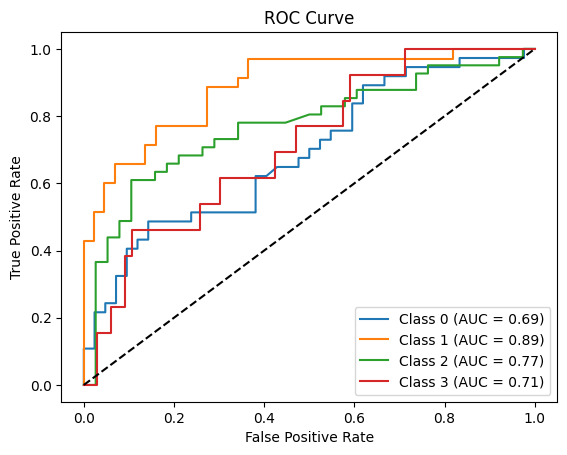

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.26582278481012656
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6184306809143411
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.7142857142857143
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  4 embedding name: tfid basic stemized
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.2911392405063291
individual results (array([0.58      , 0.74285714, 0.66666667, 0.375     ]), array([0.78378378, 0.74285714, 0.87804878, 0.23076923]), ar

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


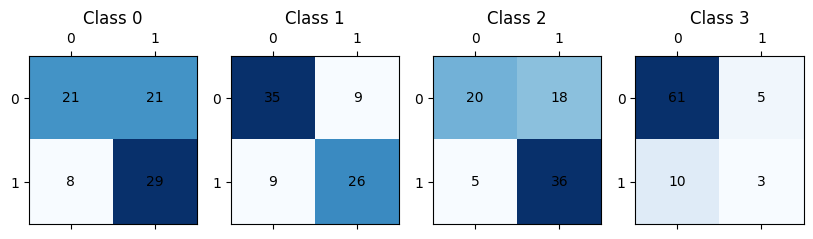

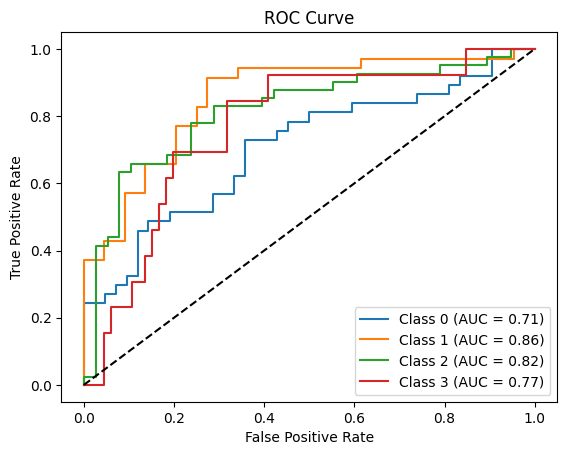

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.2911392405063291
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6322883597883597
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.746031746031746
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  5 embedding name: glove basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
individual results (array([0.53448276, 0.77419355, 0.60377358, 0.38461538]), array([0.83783784, 0.68571429, 0.7804878 , 0.76923077]), array([0.65

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


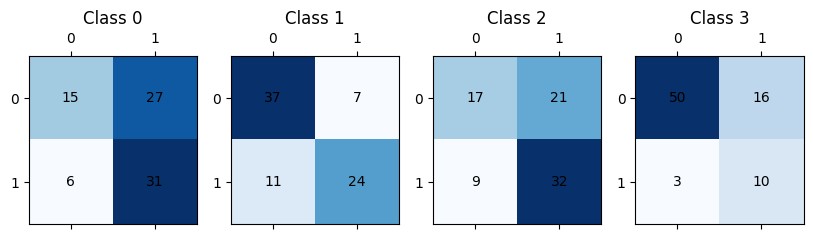

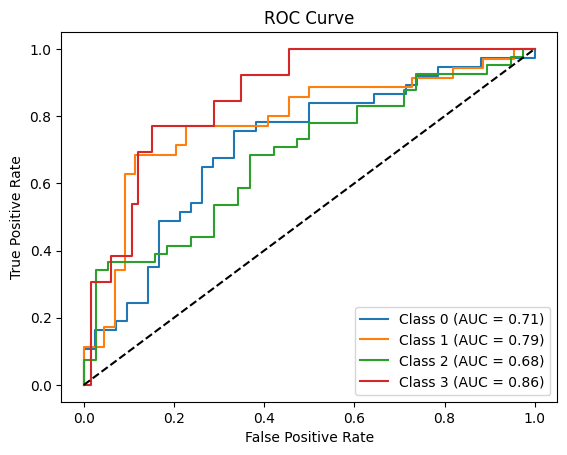

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6081535971717935
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.7698412698412699
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  6 embedding name:  glove basci categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.22784810126582278
individual results (array([0.55357143, 0.65714286, 0.59649123, 0.6875    ]), array([0.83783784, 0.65714286, 0.8292682

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True)) Overall Accuracy for this run is 0.703335342575849
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True)) Overall Precision for this run is 0.5856516607654696
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True)) Overall Recall for this run is 0.8751574703955657


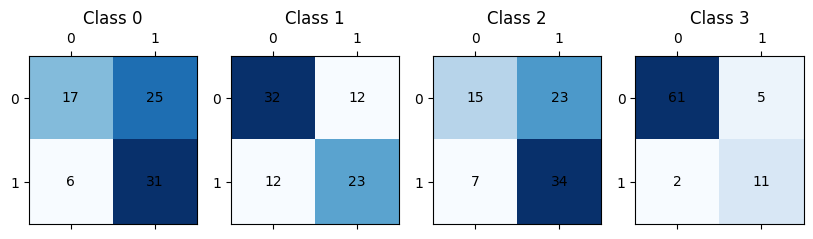

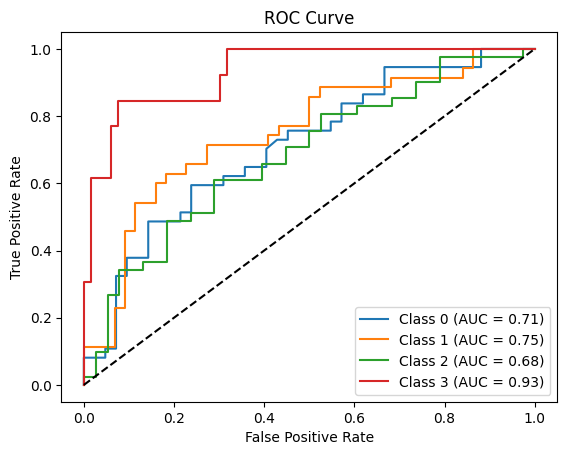

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.22784810126582278
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6101252635557147
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.7857142857142857
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  7 embedding name: use
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.189873417721519
individual results (array([0.52941176, 0.75609756, 0.62903226, 0.57894737]), array([0.97297297, 0.88571429, 0.95121951, 0.84615385]), array([0.68571429, 

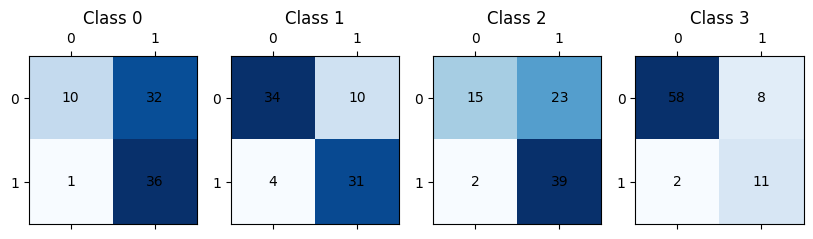

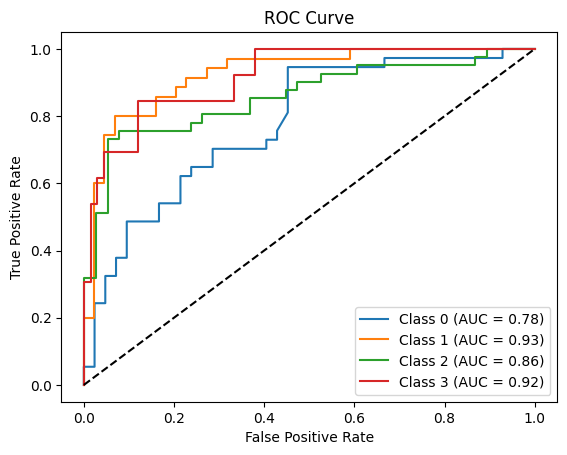

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.189873417721519
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6299070499871654
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9285714285714286
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  8 embedding name: use categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
individual results (array([0.5625    , 0.69565217, 0.61904762, 0.71428571]), array([0.97297297, 0.91428571, 0.95121951, 0.769230

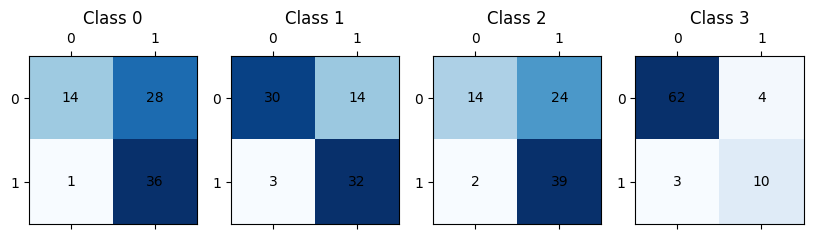

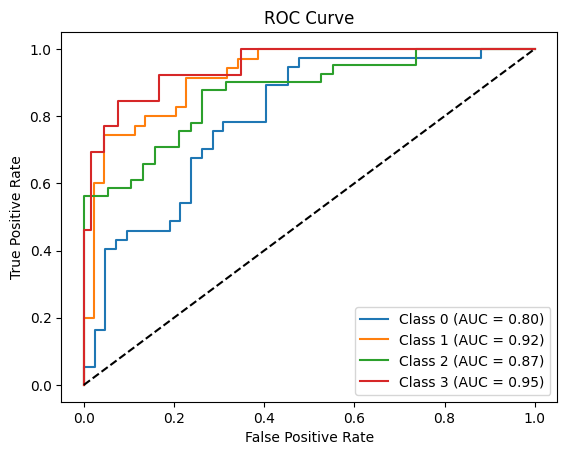

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.633547561536692
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9285714285714286
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  9 embedding name: use one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.25316455696202533
individual results (array([0.57142857, 0.72093023, 0.61290323, 0.76923077]), array([0.97297297, 0.88571429, 0.92682927, 0.7

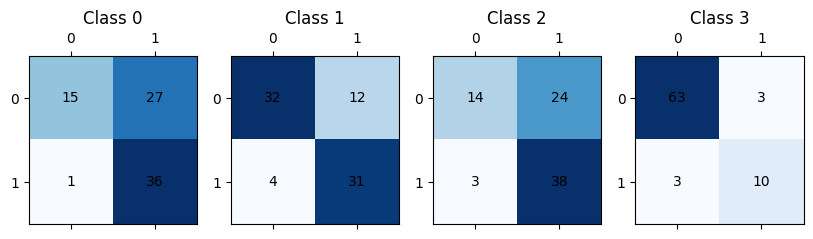

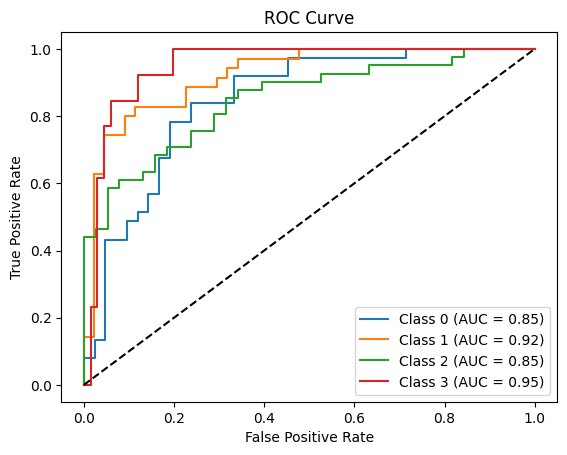

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.25316455696202533
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6468606947655281
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  10 embedding name: mini lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.16455696202531644
individual results (array([0.52380952, 0.63829787, 0.60606061, 0.6       ]), array([0.89189189, 0.85714286, 0.97560976, 0.92307692]), array(

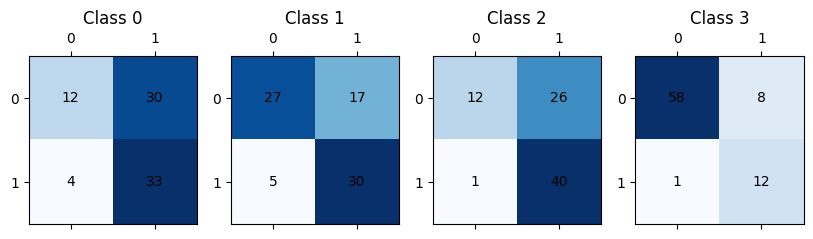

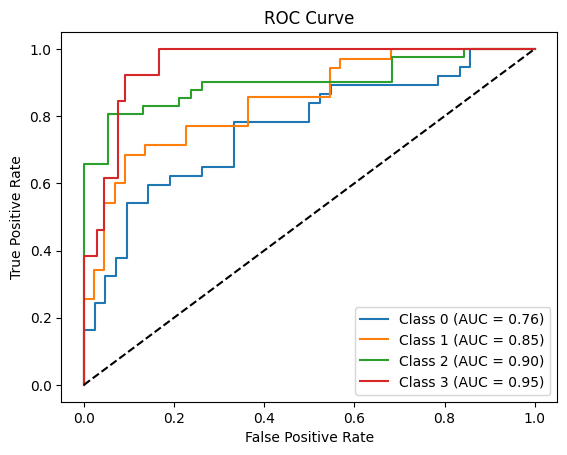

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.16455696202531644
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5902370060424772
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  11 embedding name: mini lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.189873417721519
individual results (array([0.5625    , 0.57142857, 0.58823529, 0.78571429]), array([0.97297297, 0.91428571, 0.97560976, 0.8

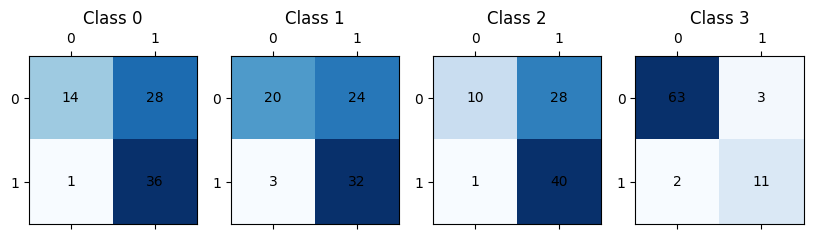

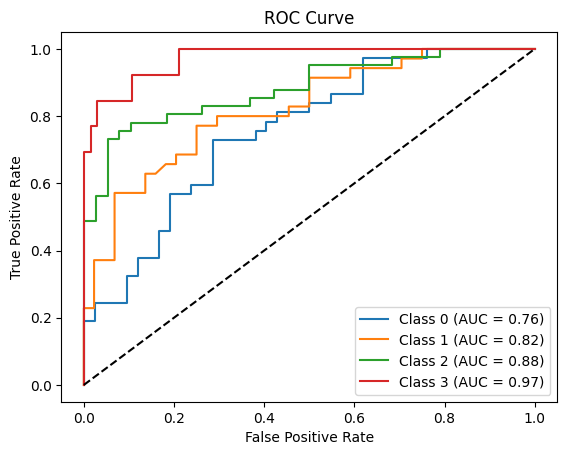

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.189873417721519
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5963843870881687
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9444444444444444
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  12 embedding name: minilm one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
individual results (array([0.578125  , 0.63043478, 0.6119403 , 0.6       ]), array([1.        , 0.82857143, 1.        , 

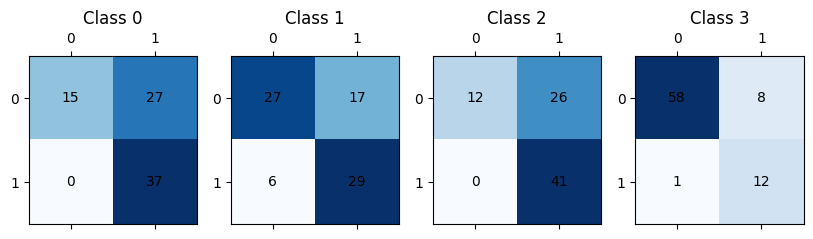

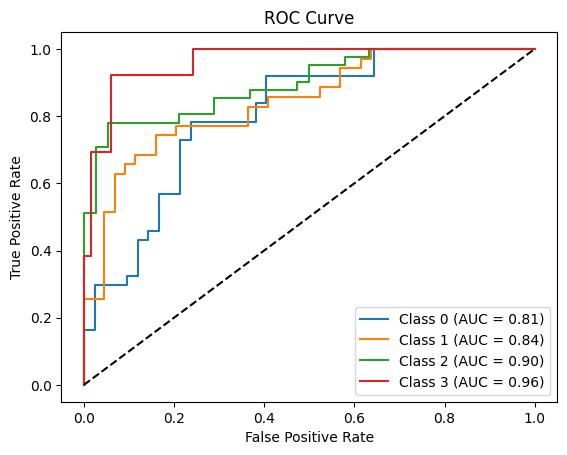

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6059158303977008
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9444444444444444
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  13 embedding name: all-MiniLM-L6-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.13924050632911392
individual results (array([0.52112676, 0.63829787, 0.54166667, 0.33333333]), array([1.        , 0.85714286, 0.95121951, 0.615384

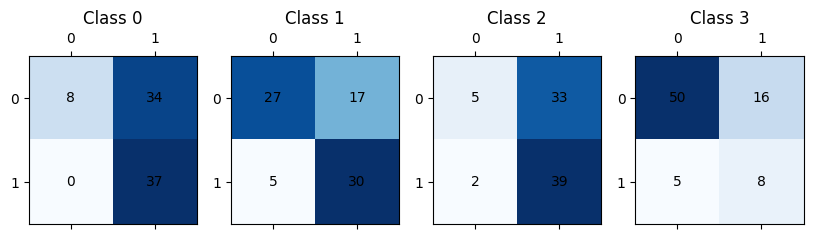

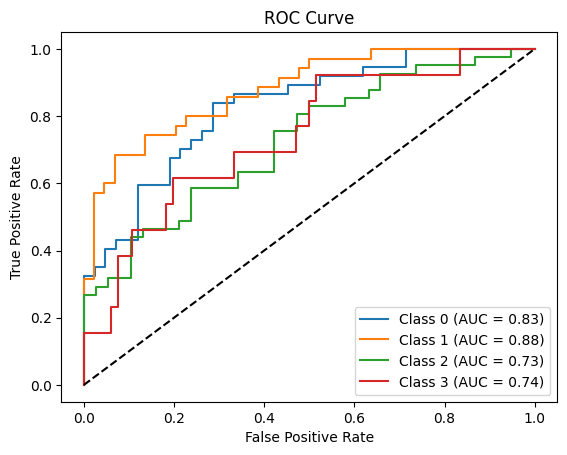

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.13924050632911392
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5409823995192589
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9047619047619048
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  14 embedding name: all-MiniLM-L6-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
individual results (array([0.5       , 0.61111111, 0.54054054, 0.64285714]), array([0.89189189, 0.94285714, 0

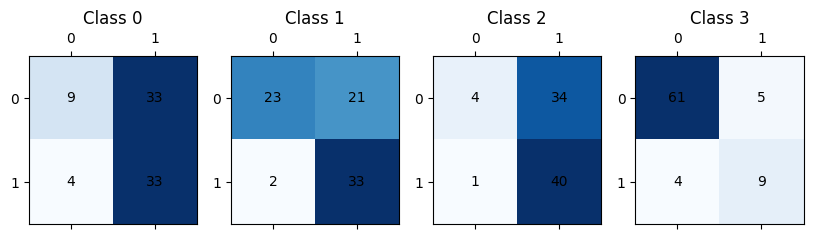

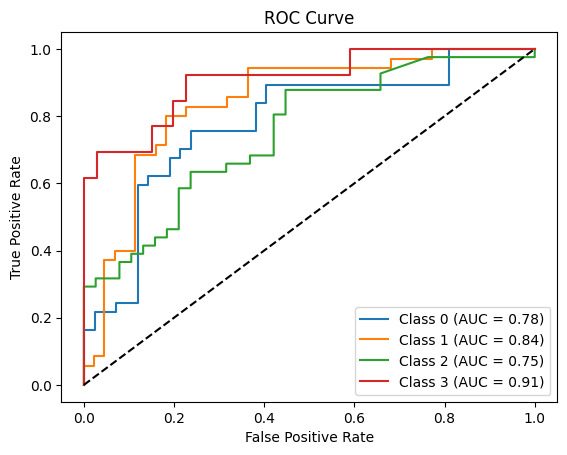

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5587951897475707
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  15 embedding name: all-MiniLM-L6-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.24050632911392406
individual results (array([0.60655738, 0.68888889, 0.56521739, 0.66666667]), array([1.        , 0.88571429, 

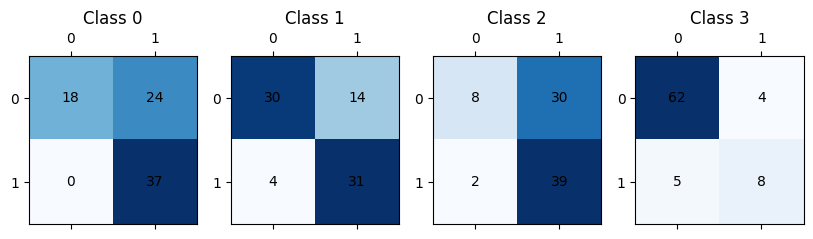

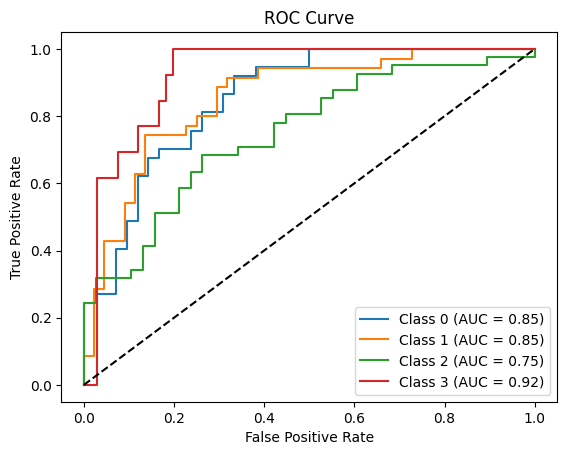

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.24050632911392406
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6221770934291723
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  16 embedding name: all-MiniLM-L12-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.1518987341772152
individual results (array([0.51388889, 0.68085106, 0.51948052, 0.38888889]), array([1.        , 0.91428571, 0.97560976, 0.538461

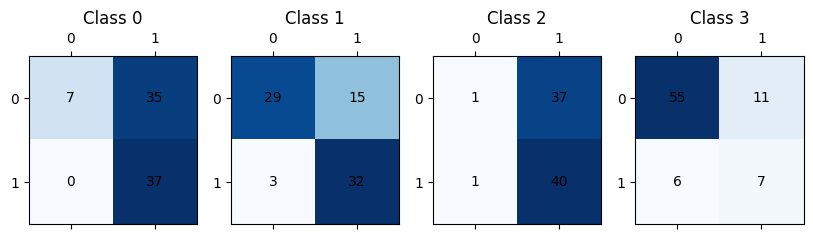

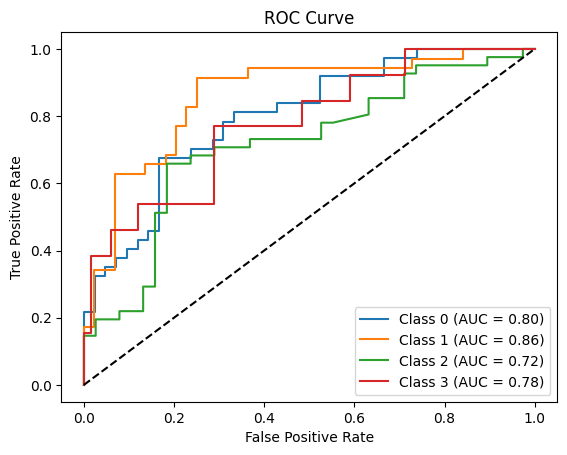

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.1518987341772152
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5491899442633992
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9206349206349206
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  17 embedding name: all-MiniLM-L12-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
individual results (array([0.5       , 0.58490566, 0.54054054, 0.64285714]), array([0.91891892, 0.88571429, 0

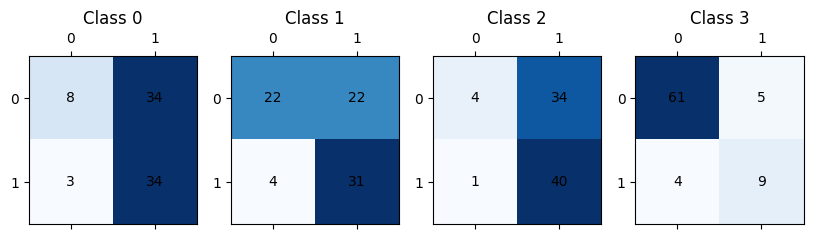

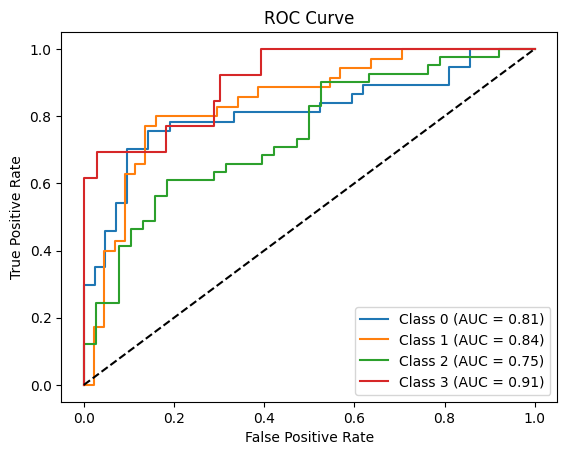

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5515158978770839
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9047619047619048
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  18 embedding name: all-MiniLM-L12-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.13924050632911392
individual results (array([0.53623188, 0.6       , 0.54166667, 0.64285714]), array([1.        , 0.85714286,

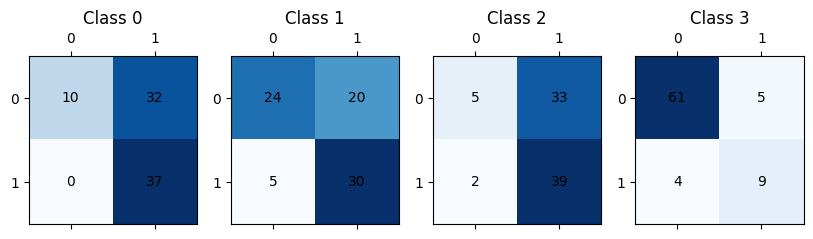

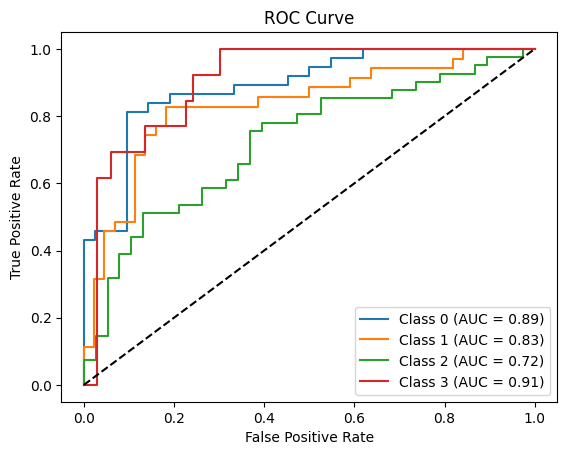

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.13924050632911392
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5667147293700089
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  19 embedding name: paraphrase-multilingual-mpnet-base-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
individual results (array([0.5483871 , 0.66666667, 0.58571429, 0.61111111]), array([0.91891892, 0.91428571,

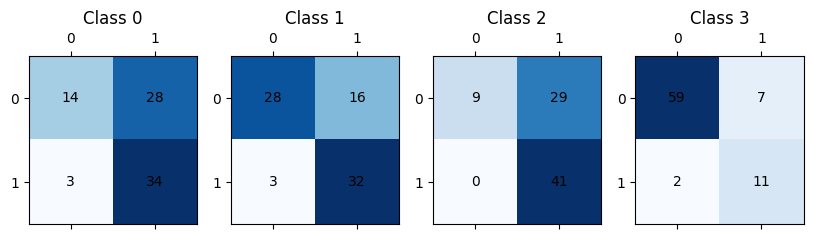

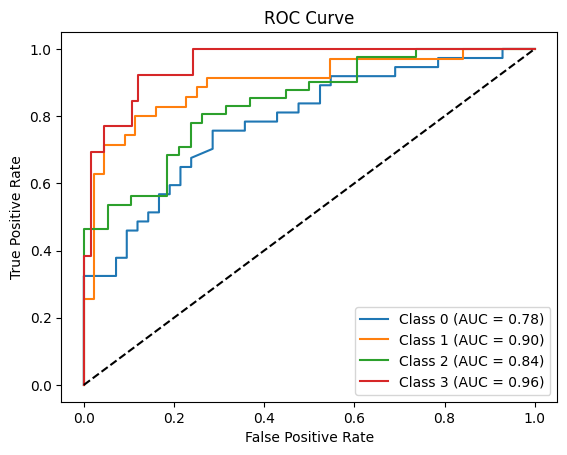

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.20253164556962025
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5998602069262592
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9365079365079365
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  20 embedding name: paraphrase-multilingual-mpnet-base-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.1518987341772152
individual results (array([0.54545455, 0.62745098, 0.57971014, 0.625     ]), array([0.972

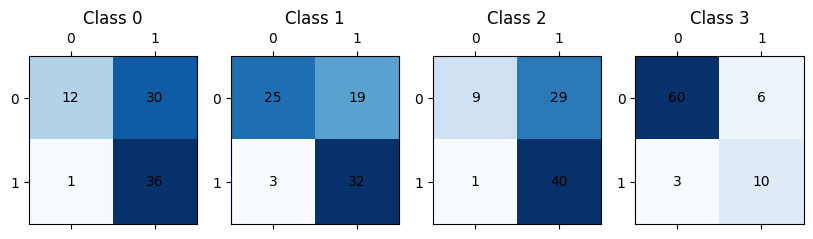

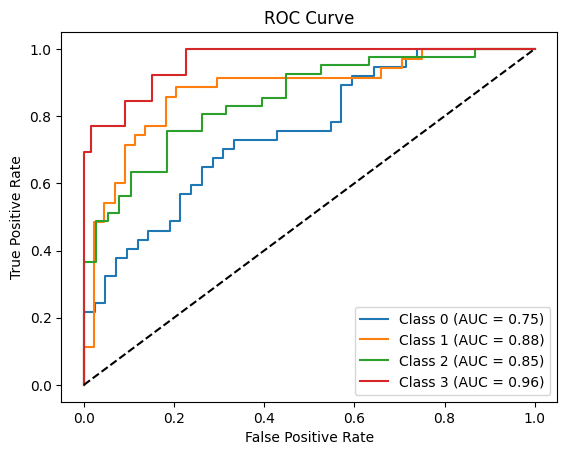

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.1518987341772152
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5875850669648623
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9365079365079365
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  21 embedding name: paraphrase-multilingual-mpnet-base-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.2911392405063291
individual results (array([0.5862069 , 0.68085106, 0.6119403 , 0.64705882]), array([0.918

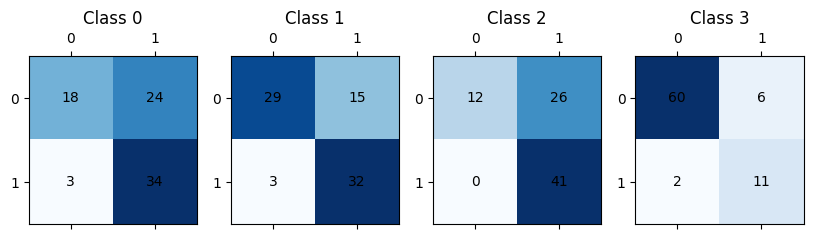

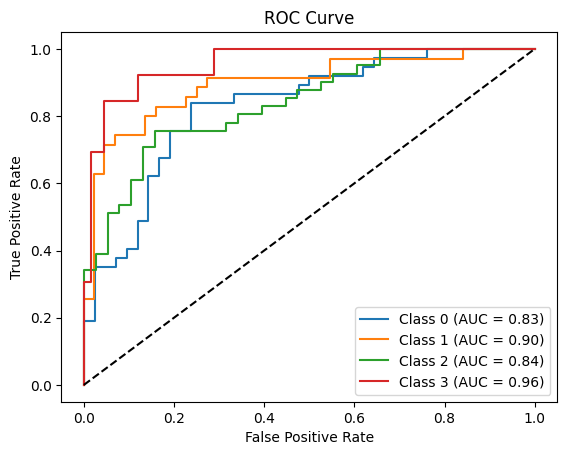

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.2911392405063291
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.6271488837392434
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9365079365079365
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  22 embedding name: paraphrase-MiniLM-L3-v2 lm basic
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
individual results (array([0.47435897, 0.66666667, 0.53246753, 0.31578947]), array([1.        , 0.85714286, 1.        , 0.

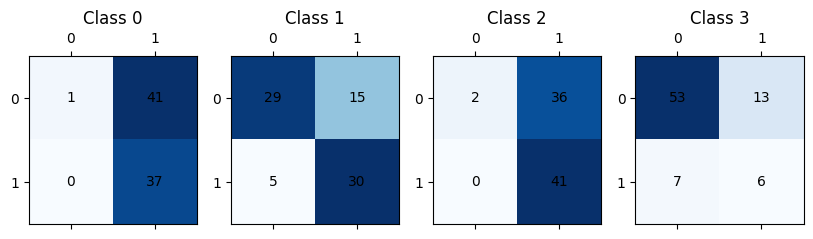

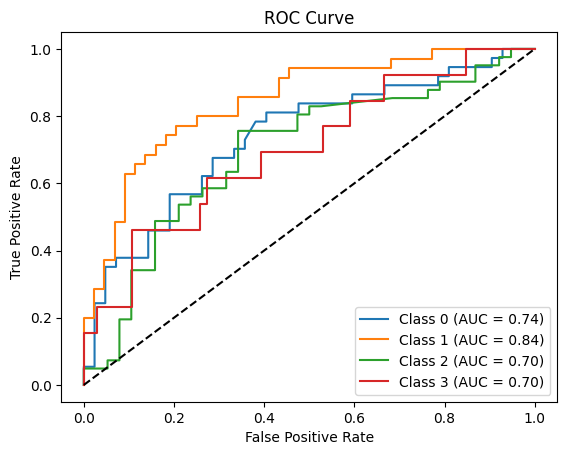

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.11392405063291139
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5303257728069758
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9047619047619048
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  23 embedding name: paraphrase-MiniLM-L3-v2 lm categorical calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.10126582278481013
individual results (array([0.49253731, 0.56666667, 0.54054054, 0.64285714]), array([0.89189189, 0.9714

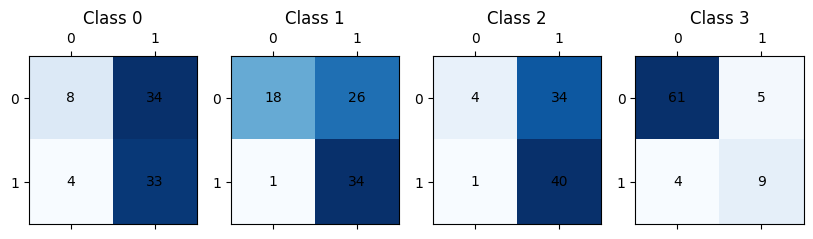

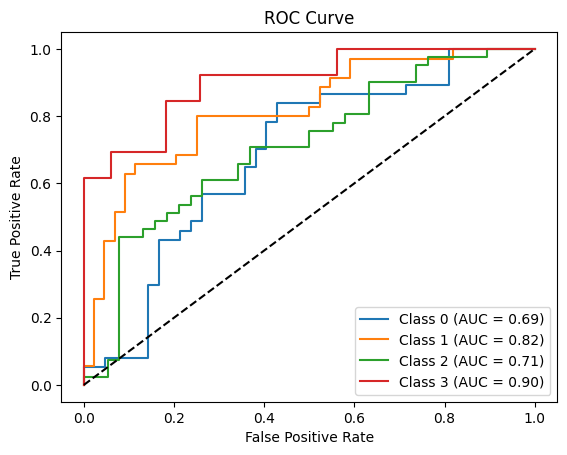

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.10126582278481013
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5442580869020102
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9206349206349206
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  24 embedding name: paraphrase-MiniLM-L3-v2 one hot encoded calification
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.17721518987341772
individual results (array([0.52857143, 0.59615385, 0.57352941, 0.61538462]), array([1.        , 0.885

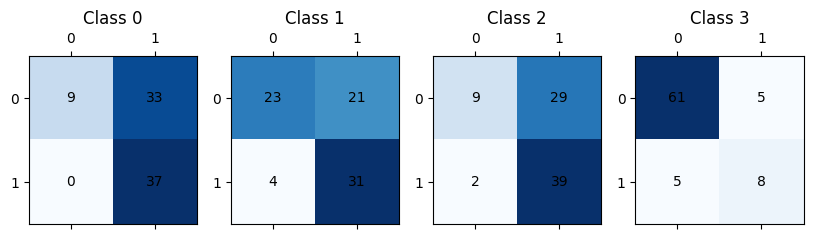

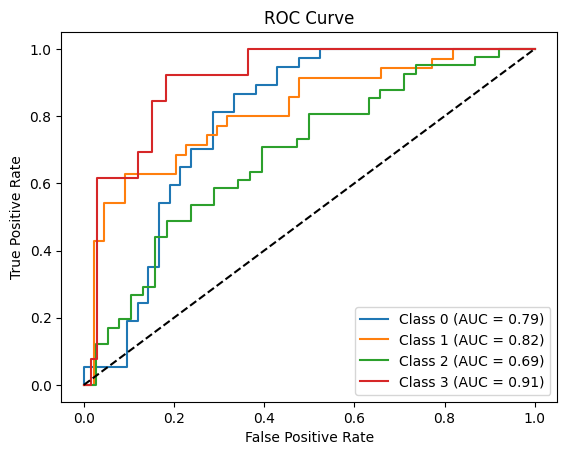

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.17721518987341772
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.5709304234514319
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.9126984126984127
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  25 embedding name: concatenation of mini_lm f 384 dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4177215189873418
individual results (array([0.62790698, 0.82352941, 0.77083333, 0.70588235]), array([0.729729

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


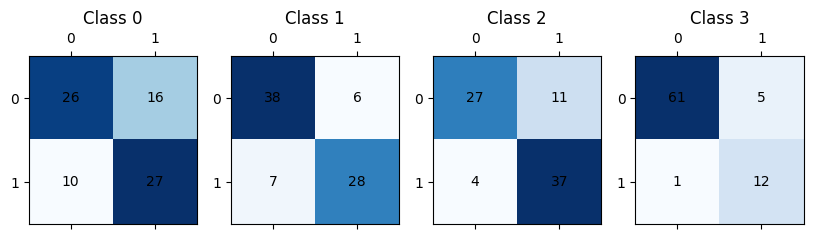

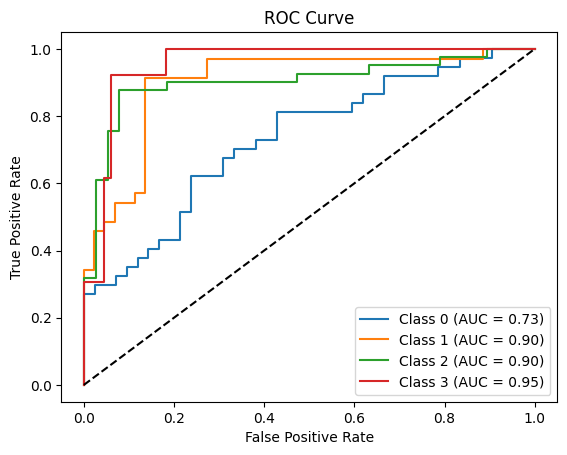

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4177215189873418
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.7367994032238218
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.8253968253968254
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  26 embedding name: concatenation of mini_lm with categorical calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3924050632911392
individual results (array([0.56      , 0.81081081, 0.76      , 0.7142

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


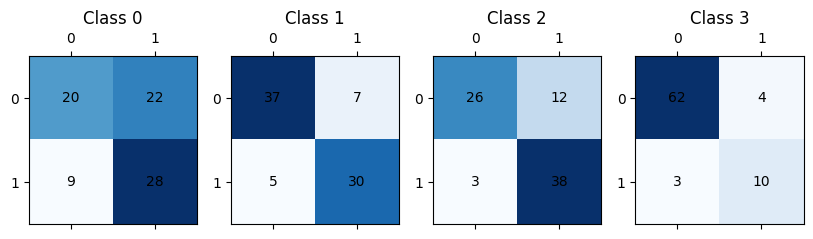

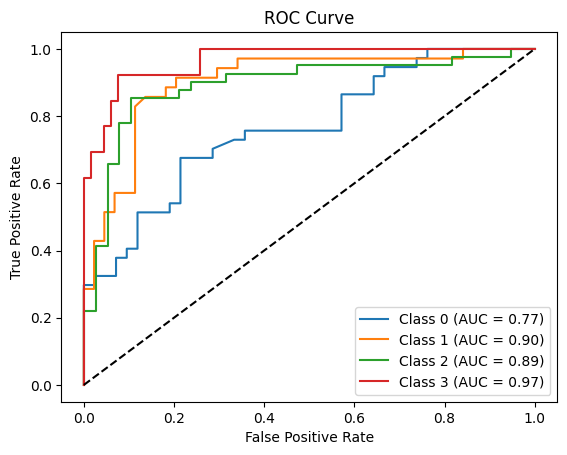

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.3924050632911392
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.7106674020959736
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.8412698412698413
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  27 embedding name: concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4430379746835443
individual results (array([0.63043478, 0.81081081, 0.78723404, 0.

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


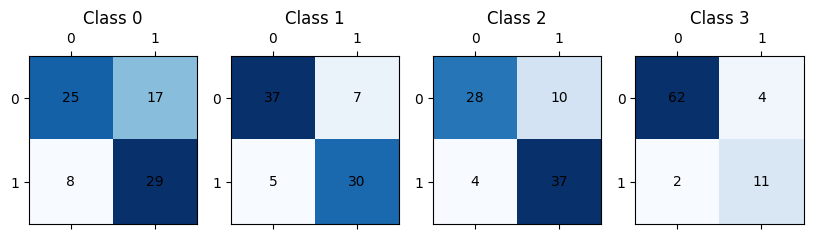

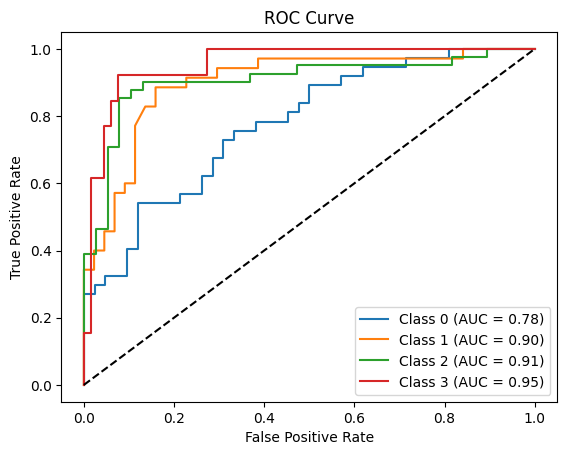

The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Accuracy  is 0.4430379746835443
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Precision is 0.7421777334358278
The MultiOutputClassifier(estimator=SVC(class_weight={0: 1, 1: 3}, kernel='linear',
                                    probability=True))  Recall is 0.8492063492063492


In [133]:
# with linear kernel but penalization
from sklearn.metrics import multilabel_confusion_matrix
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)


svm = SVC(kernel='linear', probability=True, class_weight={1: 3, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)
n =0
for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
  try:
    multi_svm.fit(train_embedding, trainCategories)
    print(f'The {multi_svm}  {n} embedding name: {name}' )
    print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )
    # Get the predicted categories for the test data
    y_pred = multi_svm.predict(test_embedding)

    print('individual results', precision_recall_fscore_support(testCategories,y_pred) )
    print('macro results', precision_recall_fscore_support(testCategories,y_pred, average='macro') )
    print('micro results', precision_recall_fscore_support(testCategories,y_pred, average='micro') )
    print('sample results', precision_recall_fscore_support(testCategories,y_pred, average='samples') )
    print('classification report', classification_report(testCategories,y_pred))

    # Compute the confusion matrix for each class
    cm = multilabel_confusion_matrix(testCategories, y_pred)

    # Sum up the confusion matrix components across all classes
    for i, c in enumerate(cm):
        TP = c[1, 1]
        TN = c[0, 0]
        FP = c[0, 1]
        FN = c[1, 0]

    # Invert the true positives and true negatives in the confusion matrix
    #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

    # Plot the confusion matrix for each class
    fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
    for i, c in enumerate(cm):
        ax = axes[i]
        ax.matshow(c, cmap=plt.cm.Blues)
        ax.set_title(f'Class {i}')
        for j in range(c.shape[0]):
            for k in range(c.shape[1]):
                ax.text(k, j, str(c[j, k]), va='center', ha='center')
    plt.show()

    # Get the predicted probabilities for the positive class
    y_score = multi_svm.predict_proba(test_embedding)

    # Compute the ROC curve and AUC for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(testCategories.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(testCategories[:, i], y_score[i][:, 1]) # we can change between 0 an 1 at the rigth to get the inverse, having the rock curve over or under the 45% axis
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot the ROC curve for each class
    for i in range(testCategories.shape[1]):
        plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

    # Calculate and print accuracy
    accuracy = accuracy_score(testCategories, y_pred)
    print(f'The {multi_svm}  Accuracy  is {accuracy}' )

    # Calculate precision and recall
    precision = precision_score(testCategories, y_pred, average='weighted')
    recall = recall_score(testCategories, y_pred, average='weighted')

    print(f'The {multi_svm}  Precision is {precision}' )
    print(f'The {multi_svm}  Recall is {recall}' )


  except:
    print('error')
    continue
  finally:
    n=n+1


In [143]:
len(embeddingsArray['train'])

0.7896678966789668

concatenation of mini_lm with one hot encoded calification dimmentions and tfid stemmized 


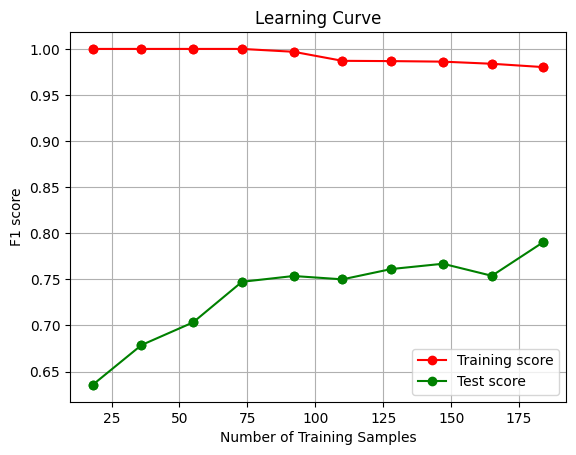

In [147]:
from sklearn.model_selection import train_test_split

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

# Create a list to hold the accuracies
train_accuracies = []
test_accuracies = []

# Different portions of the training data to use
train_sizes = np.linspace(0.1, 1.0, 10)

n= 27
train_embedding = embeddingsArray['train'][n]
test_embedding = embeddingsArray['test'][n]
name = embeddingsArray['names'][n]
print(name)

svm = SVC(kernel='linear', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)

for size in train_sizes:
    # Select subset of the training data
    subset_size = int(size * train_embedding.shape[0])
    X_subset = train_embedding[:subset_size]
    y_subset = trainCategories[:subset_size]

    # Fit the model on the subset of the data

    multi_svm.fit(X_subset, y_subset)

    # Evaluate on the training subset
    train_accuracy = precision_recall_fscore_support(y_subset,multi_svm.predict(X_subset), average='micro')[2]
    #train_accuracy = accuracy_score(y_subset, multi_svm.predict(X_subset))
    train_accuracies.append(train_accuracy)

    # Evaluate on the complete test set
    test_accuracy = precision_recall_fscore_support(testCategories,multi_svm.predict(test_embedding), average='micro')[2]
    #test_accuracy = accuracy_score(testCategories, multi_svm.predict(test_embedding))
    test_accuracies.append(test_accuracy)

    #print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )


# Plot the learning curve
plt.figure()
plt.title("Learning Curve")
plt.xlabel("Number of Training Samples")
plt.ylabel("F1 score")

# Calculate the number of training samples for each fraction
actual_train_sizes = [int(size * train_embedding.shape[0]) for size in train_sizes]

# Plot and annotate each point for training and test scores
for i, size in enumerate(actual_train_sizes):
    plt.scatter(size, train_accuracies[i], color="r")
    #plt.annotate(f"({size}, {train_accuracies[i]:.4f})", (size, train_accuracies[i]))

    plt.scatter(size, test_accuracies[i], color="g")
    #plt.annotate(f"({size}, {test_accuracies[i]:.4f})", (size, test_accuracies[i]))

plt.plot(actual_train_sizes, train_accuracies, 'o-', color="r", label="Training score")
plt.plot(actual_train_sizes, test_accuracies, 'o-', color="g", label="Test score")

plt.legend(loc="best")
plt.grid(True)
plt.show()


concatenation of mini_lm f 384 dimmentions and tfid stemmized 


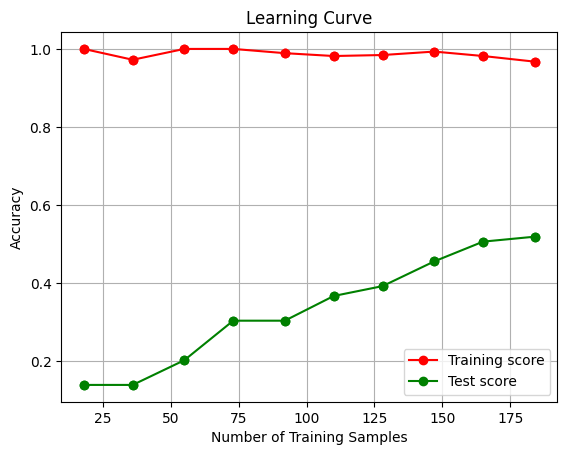

In [134]:
from sklearn.model_selection import train_test_split

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (0,2), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (0,2), axis=1)

# Create a list to hold the accuracies
train_accuracies = []
test_accuracies = []

# Different portions of the training data to use
train_sizes = np.linspace(0.1, 1.0, 10)

n= 25
train_embedding = embeddingsArray['train'][n]
test_embedding = embeddingsArray['test'][n]
name = embeddingsArray['names'][n]
print(name)

svm = SVC(kernel='rbf', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm = MultiOutputClassifier(svm)

for size in train_sizes:
    # Select subset of the training data
    subset_size = int(size * train_embedding.shape[0])
    X_subset = train_embedding[:subset_size]
    y_subset = trainCategories[:subset_size]

    # Fit the model on the subset of the data

    multi_svm.fit(X_subset, y_subset)

    # Evaluate on the training subset
    train_accuracy = accuracy_score(y_subset, multi_svm.predict(X_subset))
    train_accuracies.append(train_accuracy)

    # Evaluate on the complete test set
    test_accuracy = accuracy_score(testCategories, multi_svm.predict(test_embedding))
    test_accuracies.append(test_accuracy)

    #print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )


# Plot the learning curve
plt.figure()
plt.title("Learning Curve")
plt.xlabel("Number of Training Samples")
plt.ylabel("Accuracy")

# Calculate the number of training samples for each fraction
actual_train_sizes = [int(size * train_embedding.shape[0]) for size in train_sizes]

# Plot and annotate each point for training and test scores
for i, size in enumerate(actual_train_sizes):
    plt.scatter(size, train_accuracies[i], color="r")
    #plt.annotate(f"({size}, {train_accuracies[i]:.4f})", (size, train_accuracies[i]))

    plt.scatter(size, test_accuracies[i], color="g")
    #plt.annotate(f"({size}, {test_accuracies[i]:.4f})", (size, test_accuracies[i]))

plt.plot(actual_train_sizes, train_accuracies, 'o-', color="r", label="Training score")
plt.plot(actual_train_sizes, test_accuracies, 'o-', color="g", label="Test score")

plt.legend(loc="best")
plt.grid(True)
plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.model_selection import LearningCurveDisplay, ShuffleSplit

# fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 6), sharey=True)

# svm = SVC(kernel='linear', decision_function_shape='ovr')
# multi_svm = MultiOutputClassifier(svm)

# common_params = {
#     "X": embeddingsArray['train'][0],
#     "y": global_data['y']['y_train_categories'],
#     "train_sizes": np.linspace(0.1, 1.0, 5),
#     "cv": ShuffleSplit(n_splits=50, test_size=0.2, random_state=0),
#     "score_type": "both",
#     "n_jobs": 4,
#     "line_kw": {"marker": "o"},
#     "std_display_style": "fill_between",
#     "score_name": "Accuracy",
# }

# for ax_idx, estimator in enumerate([multi_svm]):
#     LearningCurveDisplay.from_estimator(estimator, **common_params, ax=ax[ax_idx])
#     handles, label = ax[ax_idx].get_legend_handles_labels()
#     ax[ax_idx].legend(handles[:2], ["Training Score", "Test Score"])
#     ax[ax_idx].set_title(f"Learning Curve for {estimator.__class__.__name__}")

#### subcategories

In [ ]:
# from sklearn.metrics import multilabel_confusion_matrix
# from sklearn.metrics import confusion_matrix
# from sklearn.metrics import roc_curve, auc

# #Create a multiclass SVM classifier with a DAG structure
# testCategories = np.delete(global_data['y']['y_test_sub_categories'], (2,0), axis=1)

# # Delete the second row (index starts from zero)
# trainCategories = np.delete(global_data['y']['y_train_sub_categories'], (2,0), axis=1)

# svm = SVC(kernel='linear', probability=True, class_weight={1: 1.5, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
# multi_svm = MultiOutputClassifier(svm)
# n =0
# for train_embedding, test_embedding, name in zip(embeddingsArray['train'], embeddingsArray['test'], embeddingsArray['names']):
#   try:
#     multi_svm.fit(train_embedding, trainCategories)
#     print(f'The {multi_svm}  {n} embedding name: {name}' )
#     print(f'The {multi_svm}  Accuracy  is {accuracy_score(testCategories,multi_svm.predict(test_embedding)) }' )
#     # Get the predicted categories for the test data
#     y_pred = multi_svm.predict(test_embedding)
#     # Compute the confusion matrix for each class
#     cm = multilabel_confusion_matrix(testCategories, y_pred)

#     # Invert the true positives and true negatives in the confusion matrix
#     #cm = [c[[1, 0]][:, [1, 0]] for c in cm]

#     # Plot the confusion matrix for each class
#     fig, axes = plt.subplots(nrows=1, ncols=len(cm), figsize=(10, 5))
#     for i, c in enumerate(cm):
#         ax = axes[i]
#         ax.matshow(c, cmap=plt.cm.Blues)
#         ax.set_title(f'Class {i}')
#         for j in range(c.shape[0]):
#             for k in range(c.shape[1]):
#                 ax.text(k, j, str(c[j, k]), va='center', ha='center')
#     plt.show()

#     # Get the predicted probabilities for the positive class
#     y_score = multi_svm.predict_proba(test_embedding)

#     # Compute the ROC curve and AUC for each class
#     fpr = dict()
#     tpr = dict()
#     roc_auc = dict()
#     for i in range(testCategories.shape[1]):
#         fpr[i], tpr[i], _ = roc_curve(testCategories[:, i], y_score[i][:, 1]) # we can change between 0 an 1 at the rigth to get the inverse, having the rock curve over or under the 45% axis
#         roc_auc[i] = auc(fpr[i], tpr[i])

#     # Plot the ROC curve for each class
#     for i in range(testCategories.shape[1]):
#         plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')
#     plt.plot([0, 1], [0, 1], 'k--')
#     plt.xlabel('False Positive Rate')
#     plt.ylabel('True Positive Rate')
#     plt.title('ROC Curve')
#     plt.legend(loc="lower right")
#     plt.show()

#   except:
#     print('error')
#     continue
#   finally:
#     n=n+1

## neural network classifier

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv1D, GlobalMaxPooling1D
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import Dropout

#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (), axis=1)


train_embedding =embeddingsArray['train'][11]
test_embedding = embeddingsArray['test'][11]

max_words = 1000

# Define the size of the embedding vectors
embedding_dim = 500

# Create the embedding layer
embeddingLayer = Embedding(input_dim=max_words, output_dim=embedding_dim, input_length=train_embedding.shape[1])


# Define the model architecture
model = Sequential([
    embeddingLayer,
    Conv1D(128, 5, activation='relu'),
    GlobalMaxPooling1D(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    #Dense(10, activation='relu'),
    Dense(6, activation='sigmoid')
])

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Fit the model to your training data

history = model.fit(train_embedding, trainCategories, epochs=30, validation_data=(test_embedding, testCategories))


loss, accuracy = model.evaluate(test_embedding,testCategories)
print('Testing Accuracy is {} '.format(accuracy*100))



In [ ]:
# Check for invalid values in the input data
#assert np.min(train_embedding) >= 0 and np.max(train_embedding) < max_words, "Input data contains invalid values"
train_embedding

### test with the best SVM classifiers

In [ ]:
#Create a multiclass SVM classifier with a DAG structure
testCategories = np.delete(global_data['y']['y_test_categories'], (), axis=1)

# Delete the second row (index starts from zero)
trainCategories = np.delete(global_data['y']['y_train_categories'], (), axis=1)

svm = SVC(kernel='linear', probability=True, class_weight={1: 1, 0: 1}) # , decision_function_shape='ovr'   kernerl linear’, ‘poly’, ‘rbf’, ‘sigmoid’  , C =1 default
multi_svm1 = MultiOutputClassifier(svm)

multi_svm1.fit(global_data['embeddings']['mini_lm']['X_train'], trainCategories)

print(multi_svm1.score(global_data['embeddings']['mini_lm']['X_test'], testCategories ))

multi_svm2 = MultiOutputClassifier(svm)

multi_svm2.fit(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_train'], trainCategories)
print(multi_svm2.score(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'], testCategories ))

multi_svm3 = MultiOutputClassifier(svm)

multi_svm3.fit(global_data['embeddings']['tfid']['X_train_stemmized'], trainCategories)
print(multi_svm3.score(global_data['embeddings']['tfid']['X_test_stemmized'], testCategories ))

multi_svm4 = MultiOutputClassifier(svm)

multi_svm4.fit(global_data['embeddings']['tfid']['X_train_categorical_calification_stemmized'], trainCategories)

multi_svm_new = MultiOutputClassifier(svm)

multi_svm_new.fit(np.concatenate((global_data['embeddings']['mini_lm']['X_train'],global_data['embeddings']['tfid']['X_train_stemmized']), axis=1), trainCategories)

test_embedding_new = np.concatenate((global_data['embeddings']['mini_lm']['X_test'],global_data['embeddings']['tfid']['X_test_stemmized']), axis=1)

print(f'The {multi_svm_new}  Accuracy  is {accuracy_score(testCategories,multi_svm_new.predict(test_embedding_new)) }' )
print(f'accuracy other method:  {multi_svm_new.score(test_embedding_new, testCategories )}')

In [ ]:
global_data['embeddings']['tfid']['X_train_categorical_calification_stemmized']


In [ ]:
multi_svm1.predict(global_data['embeddings']['mini_lm']['X_test'])

In [ ]:
multi_svm2.predict(global_data['embeddings']['paraphrase-multilingual-mpnet-base-v2']['X_test'])

In [ ]:
multi_svm3.predict(global_data['embeddings']['tfid']['X_test_stemmized'][0:10])

In [ ]:
multi_svm4.predict(global_data['embeddings']['tfid']['X_test_categorical_calification_stemmized'][0:10])

In [ ]:
# real categories
testCategories[0:10]

In [ ]:
global_data['x']['X_test'][0:10]